# RS data processing

Datasets:

1. Phenology - Greeness Increase
2. Topographic 
   - Elevation
   - Slope
   - A
3. Monthly Climate Data (Normal_1991_2020MP)
   - PPT
   - Tmax
   - Tmin
4. disturbances dataset - filtering wildfire & regions
5. Sentinels-2 dataset

## disturbances NETMS dataset

In [ ]:
from os.path import join
from image_utils import clip_raster
import shutil

directory=r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_disturb'
boundary = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\ROI_RMF\ROI_RMF_2958_32617.shp"
mask_file_1985_2011 = join(directory, "C2C_change_type_1985_2011","C2C_change_type_1985_2011.tif")
mask_file_2012_2015 = join(directory,"C2C_change_type_2012_2015", "C2C_change_type_2012_2015.tif")
clip_raster(
    mask_file_1985_2011,
    boundary,
    join(directory, "rmf_distur_2011.tif"),
)
clip_raster(
    mask_file_2012_2015,
    boundary,
    join(directory, "rmf_distur_2015.tif"),
)

# delete unzip folder
shutil.rmtree(join(directory, "C2C_change_type_1985_2011"))
shutil.rmtree(join(directory, "C2C_change_type_2012_2015"))

In [40]:
# merge rasters from disturbances of different years
from image_utils import merge_rasters
import glob
directory=r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_disturb'
input_files=glob.glob(join(directory, "*.tif"))
output_file=join(directory, "rmf_disturb_merged_2020.tif")
merge_rasters(input_files, output_file, method="max")

1985-2020

In [48]:
import rasterio
import numpy as np

from os.path import join
from image_utils import clip_raster
import shutil

# Open the raster file
with rasterio.open(r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_disturb\rmf_disturb_1985_2020.tif') as src:
    # Read the data into an array
    raster_data = src.read(1)  # Assuming the data is in the first band

    # Replace values 1985 to 2020 with 1 (indicating change)
    change_mask = (raster_data >= 1985) & (raster_data <= 2020)
    raster_data[change_mask] = 1

    # Define new metadata for the output file
    new_meta = src.meta.copy()

# Save the modified raster
with rasterio.open(r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_disturb\rmf_disturb_merged_2020.tif', 'w', **new_meta) as dst:
    dst.write(raster_data, 1)

C:\Users\ycao68\AppData\Local\Temp\ipykernel_33776\229619960.py:18: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint16 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  raster_data[raster_data == 65535] = -1  # Setting it to NoData


In [44]:
from image_utils import clip_raster
import shutil

directory=r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_disturb'
boundary = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\ROI_RMF\ROI_RMF_32617.shp"
mask_file_1985_2020 = r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_disturb\rmf_disturb_1985_2020.tif'
clip_raster(
    mask_file_1985_2020,
    boundary,
    join(directory, "rmf_disturb_1985_2020_clipped.tif"),
)

## FRI dataset (extract forest & water areas)

In [ ]:
import geopandas
import pyproj
from pathlib import Path

#Set output raster CRS as ESPG code
out_crs = pyproj.CRS.from_user_input("+proj=utm +zone=17 +datum=WGS84 +units=m +no_defs +type=crs")

#Load study area
study_area_fpath = Path(r"D:\Sync\research\tree_species_estimation\tree_dataset\data_processing\FORMGMT\ROI_RMF\ROI_RMF.shp")
gdf = geopandas.read_file(study_area_fpath).to_crs(out_crs)
gdf.to_file(r"D:\Sync\research\tree_species_estimation\tree_dataset\data_processing\FORMGMT\ROI_RMF\ROI_RMF_32617.shp")

In [ ]:
from shapely.ops import unary_union
import geopandas as gpd
from os.path import join

directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
fri = gpd.read_file(join(directory, "rmf_fri", "RMF_PolygonForest.shp"))
fri_water = fri[fri["POLYTYPE"] == "WAT"]
fri_water = unary_union(fri_water["geometry"])
fri_water = gpd.GeoDataFrame(geometry=[fri_water])
fri_water.to_file(join(directory, "rmf_fri", "RMF_PolygonForest_water.shp"))
fri_forest = fri[fri["POLYTYPE"] == "FOR"]
fri_forest = unary_union(fri_forest["geometry"])
fri_forest = gpd.GeoDataFrame(geometry=[fri_forest])
fri_forest.to_file(join(directory, "rmf_fri", "RMF_PolygonForest_forest.shp"))

d:\Sync\research\tree species estimation\notes\.venv\Lib\site-packages\pyogrio\raw.py:698: UserWarning: 'crs' was not provided.  The output dataset will not have projection information defined and may not be usable in other systems.
  warnings.warn(
d:\Sync\research\tree species estimation\notes\.venv\Lib\site-packages\pyogrio\raw.py:698: UserWarning: 'crs' was not provided.  The output dataset will not have projection information defined and may not be usable in other systems.
  warnings.warn(


In [7]:
from image_utils import rasterize_shapefile
from os.path import join

# Make Lables
resolutions=[10, 20]
directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
shapefile_path = join(directory, "rmf_fri", "fri_rmf_cleaned_9class.shp")

for resolution in resolutions:
    output_raster_path = join(directory, "rmf_fri", f"RMF_PolygonForest_clean_{resolution}m.tif")
    attribute_bands = {
        # "AB": 1,
        "BF": 1,
        "BW": 2,
        # "YB": 4,
        "CE": 3,
        "LA": 4,
        # "MR": 7,
        "PJ": 5,
        "PO": 6,
        # "PR": 10,
        "PT": 7,
        # "PW": 12,
        "SB": 8,
        "SW": 9,
    }
    reference_raster_path = join(directory, 'rmf_s2','fall', f'mosaic_{resolution}m.tif')

    rasterize_shapefile(
        shapefile_path,
        output_raster_path,
        attribute_bands,
        reference_raster_path=reference_raster_path,
    )

## dem

In [20]:
from image_utils import quick_translate, clip_raster
import pyproj
import os
shapefile=r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\ROI_RMF\ROI_RMF_32617.shp"
work_dir=r"E:\rmf_img\rmf_dtm"

# Define the pattern to search for .tif files for the current target year
raster_path = os.path.join(work_dir, "rmf_provin_30m_dem_clipped.tif")
transformed_path = str(raster_path)[:-4]+'_proj.tif'
out_crs = pyproj.CRS.from_user_input("+proj=utm +zone=17 +datum=WGS84 +units=m +no_defs +type=crs")
quick_translate(raster_path, transformed_path, out_crs)
clip_raster(transformed_path, shapefile, os.path.join(work_dir, "rmf_provin_30m_dem_clipped1.tif"))

Iter time: 0.7298786640167236
Raster has been reprojected and saved to:  E:\rmf_img\rmf_dtm\rmf_provin_30m_dem_clipped_proj.tif


In [21]:
shutil.copy(r"E:\rmf_img\rmf_dtm\rmf_provin_30m_dem_clipped1.tif", r'D:\Sync\research\tree_species_estimation\tree_dataset\imagery\rmf_dem\rmf_dem_30m.tif')

'D:\\Sync\\research\\tree_species_estimation\\tree_dataset\\imagery\\rmf_dem\\rmf_dem_30m.tif'

In [5]:
from whitebox_workflows import WbEnvironment
from whitebox_workflows import WbPalette, show
import matplotlib.pyplot as plt

wbe = WbEnvironment()
wbe.working_directory = r'E:\rmf_img\rmf_dtm'
# Reading raster data
topo = wbe.read_raster('rmf_spl_10m_dem.tif')
print(f'EPSG code: {topo.configs.epsg_code}') # 0 if not set


slope=wbe.slope(topo)
slope.clip_display_min_max(2.0)
aspect=wbe.aspect(topo)
wbe.write_raster(slope, 'spl_dem_slope_10m.tif')
wbe.write_raster(aspect, 'spl_dem_aspect_10m.tif')

EPSG code: 32617


In [7]:
from whitebox_workflows import WbEnvironment
from whitebox_workflows import WbPalette, show
import matplotlib.pyplot as plt

wbe = WbEnvironment()
wbe.working_directory = r'E:\rmf_img\rmf_dtm'
# Reading raster data
topo = wbe.read_raster('rmf_spl_20m_dem.tif')
print(f'EPSG code: {topo.configs.epsg_code}') # 0 if not set


slope=wbe.slope(topo)
slope.clip_display_min_max(2.0)
aspect=wbe.aspect(topo)
wbe.write_raster(slope, 'spl_dem_slope_20m.tif')
wbe.write_raster(aspect, 'spl_dem_aspect_20m.tif')

EPSG code: 32617


In [8]:
import shutil
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_slope_20m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_slope\spl_dem_slope_20m.tif')
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_slope_10m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_slope\spl_dem_slope_10m.tif')
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_aspect_20m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aspect\spl_dem_aspect_20m.tif')
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_aspect_10m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aspect\spl_dem_aspect_10m.tif')

'D:\\Sync\\research\\tree_species_estimation\\tree_dataset\\rmf\\imagery\\rmf_aspect\\spl_dem_aspect_10m.tif'

### aspect to Solar-radiation Aspect Index 

Roberts and Cooper (1989) you mentioned is a transformation of aspect to represent solar exposure, which adjusts the raw aspect values to reflect how much solar radiation a slope receives. Here's a breakdown of how it works:


**Transformed Aspect (TRASP)** Formula:

trasp = 1 − cos(𝜋/180(𝑎−30))/2

Where:

a = aspect in degrees (0–360°).

The aspect angle a is adjusted by subtracting 30° (north-northeast is considered the coolest and wettest orientation).

The cosine function is then used to reflect how the aspect of a slope affects its exposure to sunlight, with the result scaled between 0 and 1.

In [8]:
import rasterio
import numpy as np

# Function to calculate TRASP based on the aspect value
def calculate_trasp(aspect_array):
    # Convert aspect from degrees to radians
    aspect_radians = np.deg2rad(aspect_array)
    # Calculate TRASP (Transformed Aspect)
    trasp = (1 - np.cos(aspect_radians - np.deg2rad(30))) / 2
    return trasp

# Function to load aspect file, calculate TRASP, and save the result as a GeoTIFF
def convert_aspect_to_trasp(aspect_path, output_path):
    # Load the aspect GeoTIFF file
    with rasterio.open(aspect_path) as src:
        # Read the aspect data as a numpy array
        aspect_data = src.read(1)
        
        # Mask out invalid aspect values (if any), usually marked as negative values or NaN
        aspect_data = np.where(aspect_data < 0, -9999, aspect_data)
        
        # Calculate TRASP
        trasp_data = calculate_trasp(aspect_data)
        
        # Set the metadata for the TRASP output
        trasp_meta = src.meta.copy()
        trasp_meta.update({
            "dtype": "float32",  # Save as float since TRASP values are between 0 and 1
            "nodata": -9999     # Use NaN as nodata value if necessary
        })

    # Write the TRASP output to a new GeoTIFF file
    with rasterio.open(output_path, 'w', **trasp_meta) as dst:
        dst.write(trasp_data, 1)

    print(f"TRASP GeoTIFF created successfully at {output_path}!")

In [9]:
aspect_path = r'E:\rmf_img\rmf_dtm\spl_dem_aspect_20m.tif'
output_path = r'E:\rmf_img\rmf_dtm\spl_dem_trasp_20m.tif'
convert_aspect_to_trasp(aspect_path, output_path)

TRASP GeoTIFF created successfully at E:\rmf_img\rmf_dtm\spl_dem_trasp_20m.tif!


In [10]:
aspect_path = r'E:\rmf_img\rmf_dtm\spl_dem_aspect_10m.tif'
output_path = r'E:\rmf_img\rmf_dtm\spl_dem_trasp_10m.tif'
convert_aspect_to_trasp(aspect_path, output_path)

TRASP GeoTIFF created successfully at E:\rmf_img\rmf_dtm\spl_dem_trasp_10m.tif!


In [11]:
import shutil
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_trasp_20m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_trasp\spl_dem_trasp_20m.tif')

'D:\\Sync\\research\\tree_species_estimation\\tree_dataset\\rmf\\imagery\\rmf_trasp\\spl_dem_trasp_20m.tif'

In [7]:
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_trasp_10m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_trasp\spl_dem_trasp_10m.tif')

'D:\\Sync\\research\\tree_species_estimation\\tree_dataset\\rmf\\imagery\\rmf_trasp\\spl_dem_trasp_10m.tif'

### Topographic Wetness Index (TWI)

also known as the Compound Topographic Index (CTI), is a commonly used terrain attribute that quantifies the tendency of water to accumulate at any given location. It’s widely used in hydrological modeling and landscape analysis, particularly to assess soil moisture, potential erosion, and runoff patterns.

Formula for TWI:
The Topographic Wetness Index (TWI) is typically calculated using the formula:

TWI = ln(𝐴/tan(𝛽))

Where:

- A = Upslope contributing area (catchment area per unit contour length).
- β = Slope angle at the point of interest (in radians).
- ln = Natural logarithm.

In [ ]:
#$ conda install richdem -c conda-forge

In [4]:
import rasterio
import numpy as np
import richdem as rd
import matplotlib.pyplot as plt

# Function to calculate TWI from DEM GeoTIFF
def calculate_twi(dem_path, output_twi_path):
    # Load the DEM data using richdem
    dem_data = rd.LoadGDAL(dem_path, no_data=-9999)
    
    # Calculate the slope in radians
    slope = rd.TerrainAttribute(dem_data, attrib='slope_radians')

    # Calculate the flow accumulation
    flow_accum = rd.FlowAccumulation(dem_data, method='D8')
    
    # Compute the TWI using the formula TWI = ln(A / tan(slope))
    twi = np.log((flow_accum + 1) / (np.tan(slope) + 1e-6))  # Add small constant to avoid division by zero
    
    # Save the TWI as a new GeoTIFF
    with rasterio.open(dem_path) as src:
        meta = src.meta.copy()
        meta.update(dtype='float32')
        
        with rasterio.open(output_twi_path, 'w', **meta) as dst:
            dst.write(twi.astype(np.float32), 1)
    
    print(f"TWI GeoTIFF saved at {output_twi_path}")

In [17]:
topo_path = r'E:\rmf_img\rmf_dtm\rmf_spl_20m_dem.tif'
output_path = r'E:\rmf_img\rmf_dtm\spl_dem_twi_20m.tif'
calculate_twi(topo_path, output_path)

TWI GeoTIFF saved at E:\rmf_img\rmf_dtm\spl_dem_twi_20m.tif


In [5]:
topo_path = r'E:\rmf_img\rmf_dtm\rmf_spl_10m_dem.tif'
output_path = r'E:\rmf_img\rmf_dtm\spl_dem_twi_10m.tif'
calculate_twi(topo_path, output_path)

TWI GeoTIFF saved at E:\rmf_img\rmf_dtm\spl_dem_twi_10m.tif


In [6]:
import shutil
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_twi_10m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_twi\spl_dem_twi_10m.tif')
shutil.copy(r'E:\rmf_img\rmf_dtm\spl_dem_twi_20m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_twi\spl_dem_twi_20m.tif')

'D:\\Sync\\research\\tree_species_estimation\\tree_dataset\\rmf\\imagery\\rmf_twi\\spl_dem_twi_10m.tif'

In [1]:
from whitebox_workflows import WbEnvironment
from whitebox_workflows import WbPalette, show
import matplotlib.pyplot as plt

wbe = WbEnvironment()
wbe.working_directory = r'E:\rmf_img\rmf_dtm'
# Reading raster data
topo = wbe.read_raster('rmf_spl_20m_dem.tif')
slope = wbe.read_raster('spl_dem_slope_20m.tif')
aspect = wbe.read_raster('spl_dem_aspect_20m.tif')
trasp = wbe.read_raster('spl_dem_trasp_20m.tif')
twi = wbe.read_raster('spl_dem_twi_20m.tif')

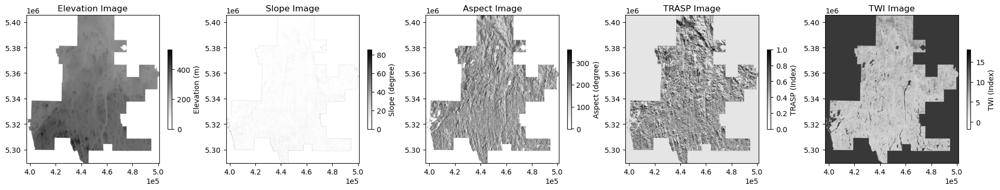

In [2]:
from whitebox_workflows import WbPalette, show

fig, ax = plt.subplots(1, 5)

for i in range(0,5):
    ax[i].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    
ax[0] = show(topo, ax=ax[0], title='Elevation Image', cmap='Greys', figsize=(24,4), skip=2, colorbar_kwargs={'label': 'Elevation (m)', 'location': "right", 'shrink': 0.5})
ax[1] = show(slope, ax=ax[1], title='Slope Image', cmap='Greys', figsize=(24,4), colorbar_kwargs={'label': 'Slope (degree)', 'location': "right", 'shrink': 0.5})
ax[2] = show(aspect, ax=ax[2], title='Aspect Image', cmap='Greys', figsize=(24,4), skip=2, colorbar_kwargs={'label': 'Aspect (degree)', 'location': "right", 'shrink': 0.5})
ax[3] = show(trasp, ax=ax[3], title='TRASP Image', cmap='Greys', figsize=(24,4), skip=2, colorbar_kwargs={'label': 'TRASP (Index)', 'location': "right", 'shrink': 0.5})
ax[3] = show(twi, ax=ax[4], title='TWI Image', cmap='Greys', figsize=(24,4), skip=2, colorbar_kwargs={'label': 'TWI (Index)', 'location': "right", 'shrink': 0.5})
# set axes range
ax[0].set_xlim([topo.configs.west, topo.configs.east])
ax[0].set_ylim([topo.configs.south, topo.configs.north])


plt.show()

In [3]:
fig.savefig(r"D:/Sync/research/tree_species_estimation/paper/fusion/imgs/spl_dem_derived.svg", format="svg")

## Phenology - greeness increase

downloading source: MuSLI Multi-Source Land Surface Phenology Yearly North America 30 m V011

The Multi-Source Land Surface Phenology (LSP) Yearly North America 30 meter (m) Version 1.1 product (MSLSP) provides a Land Surface Phenology product for North America derived from Harmonized Landsat Sentinel-2 (HLS) data. Data from the combined Landsat 8 Operational Land Imager (OLI) and Sentinel-2A and 2B Multispectral Instrument (MSI) provides the user community with dates of phenophase transitions, including the timing of greenup, maturity, senescence, and dormancy at 30m spatial resolution. These data sets are useful for a wide range of applications, including ecosystem and agro-ecosystem modeling, monitoring the response of terrestrial ecosystems to climate variability and extreme events, crop-type discrimination, and land cover, land use, and land cover change mapping. 

Provided in the MSLSP product are layers for percent greenness, onset greenness dates, Enhanced Vegetative Index (EVI2) amplitude, and maximum EVI2, and data quality information for up to two phenological cycles per year. For areas where the data values are missing due to cloud cover or other reasons, the data gaps are filled with good quality values from the year directly preceding or following the product year. A low resolution browse image representing maximum EVI is also available for each MSLSP30NA granule.
earthdata

In [ ]:
# download data (in wsl)
!./data_processing/data_downloading/download_phenology.sh

In [ ]:
import netCDF4
import numpy as np

In [ ]:
f = netCDF4.Dataset(r'E:\rmf_img\phenology\MSLSP30NA_011-20240822_202450\MSLSP_17TLN_2016.nc')
print(f.variables.keys()) # get all variable names

In [ ]:
print(f)

In [ ]:
gi = f.variables['50PCGI']  # temperature variable
print(gi) 

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
x, y = f.variables['x'], f.variables['y']
cs = plt.contourf(gi[:,:])

### mosaic

In [2]:
import xarray as xr 
import rioxarray as rio 
import matplotlib.pyplot as plt
from osgeo import gdal
gdal.UseExceptions()
import glob
from pathlib import Path

In [ ]:
from image_utils import quick_mosaic

target_years=[2016, 2017, 2018]
# Base directory path
base_dir = Path("E:/rfm_img/phenology/MSLSP30NA_011-20240822_202450")

for target_year in target_years:
    # Define the pattern to search for .tif files for the current target year
    search_pattern = base_dir/f"MSLSP*{target_year}.tif"
    
    # Use glob to find all matching .tif files
    tif_files = glob.glob(str(search_pattern))
    
    # Define the output directory for the current target year
    output_dir = base_dir/str(target_year)
    
    # Create the output directory if it doesn't exist
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Define the output path for the mosaic
    output_path = output_dir/f"MSLSP_17_{target_year}"
    
    # Perform the mosaic operation
    quick_mosaic(tif_files, str(output_path))
    
    # Print a completion message for the current year
    print(f"Finished mosaic for {target_year}!")

In [ ]:
raster=xr.open_dataset(r"E:\rmf_img\phenology\MSLSP30NA_011-20240822_202450\2016\MSLSP_17_2016.tif")
raster

In [ ]:
raster.rio.crs

### translate + clip

In [ ]:
import os
from image_utils import quick_translate, quick_clip
from image_utils import clip_raster
import pyproj
import shutil

base_dir = Path("E:/rfm_img/phenology/MSLSP30NA_011-20240822_202450")
shapefile=r"D:\Sync\research\tree_species_estimation\tree_dataset\data_processing\FORMGMT\ROI_RMF\ROI_RMF_32617.shp"

for target_year in target_years:
    # Define the pattern to search for .tif files for the current target year
    raster_dir = os.path.join(base_dir, str(target_year))
    raster_path = os.path.join(raster_dir, f"MSLSP_17_{target_year}.tif")
    transformed_path = str(raster_path)[:-4]+'_utm17.tif'
    # Perform the mosaic operation
    out_crs = pyproj.CRS.from_user_input("+proj=utm +zone=17 +datum=WGS84 +units=m +no_defs +type=crs")
    quick_translate(raster_path, transformed_path, out_crs)
    quick_clip(raster_path, shapefile, raster_dir)
    #clip_raster(transformed_path, shapefile, raster_dir)
    # Print a completion message for the current year
    shutil.rmtree(transformed_path)
    print(f"Finished clip for {target_year}!")

### vis

In [26]:
import os
import numpy as np

C:\Users\ycao68\AppData\Local\Temp\ipykernel_22700\1774567680.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[i,j].legend()


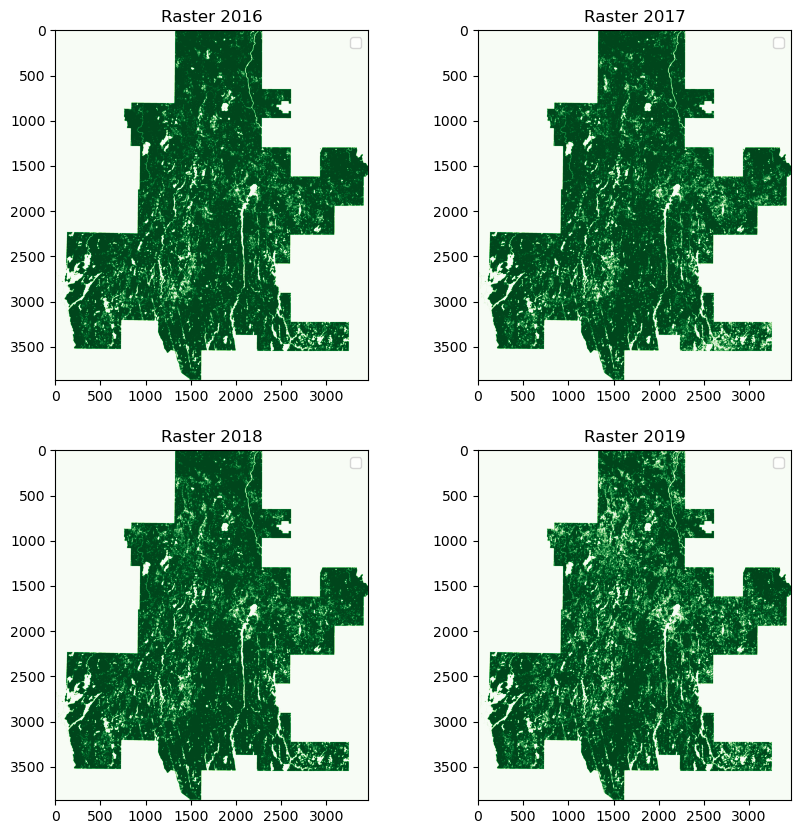

In [32]:
base_dir = Path("E:/rfm_img/phenology/MSLSP30NA_011-20240822_2024500")
# Plotting
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
target_year=2016

for i in range(2):
    for j in range(2):
        # Plot the first raster (first band)
        raster_path = os.path.join(base_dir, str(target_year), "clipped_0.tif")
        raster = gdal.Open(raster_path)
        raster_data = raster.GetRasterBand(1).ReadAsArray()
        axes[i,j].imshow(raster_data, cmap='Greens_r', label='green increase')
        axes[i,j].set_title(f'Raster {target_year}')
        axes[i,j].legend()
        target_year+=1

plt.show()

C:\Users\ycao68\AppData\Local\Temp\ipykernel_1212\28425493.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[i,j].legend()


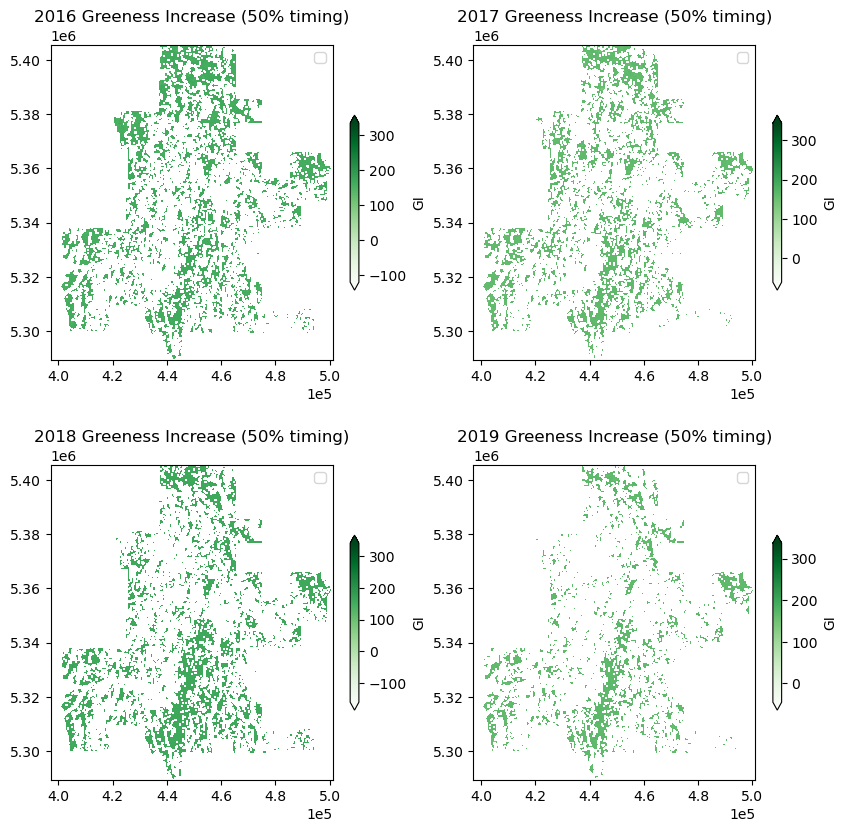

In [10]:
from whitebox_workflows import WbEnvironment, show
import matplotlib.pyplot as plt
import os

wbe = WbEnvironment()
wbe.working_directory = r"E:/rfm_img/phenology/MSLSP30NA_011-20240822_202450"

# Plotting
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
target_year=2016

for i in range(2):
    for j in range(2):
        # Reading raster data
        raster_path = os.path.join(wbe.working_directory, str(target_year), "clipped_0.tif")
        topo = wbe.read_raster(raster_path)
        ax[i,j].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
        ax[i, j] = show(topo, ax=ax[i, j], title=f'{target_year} Greeness Increase (50% timing)', cmap='Greens', clip_percent=0.0, figsize=(10,10), skip=2, colorbar_kwargs={'label': 'GI', 'location': "right", 'shrink': 0.5})
        # set axes range
        ax[i,j].set_xlim([topo.configs.west, topo.configs.east])
        ax[i,j].set_ylim([topo.configs.south, topo.configs.north])

        ax[i,j].legend() 
        target_year+=1

plt.show()

In [ ]:
fig.savefig(r"D:/Sync/research/tree_species_estimation/paper/fusion/imgs/rmf_gi.svg", format="svg")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


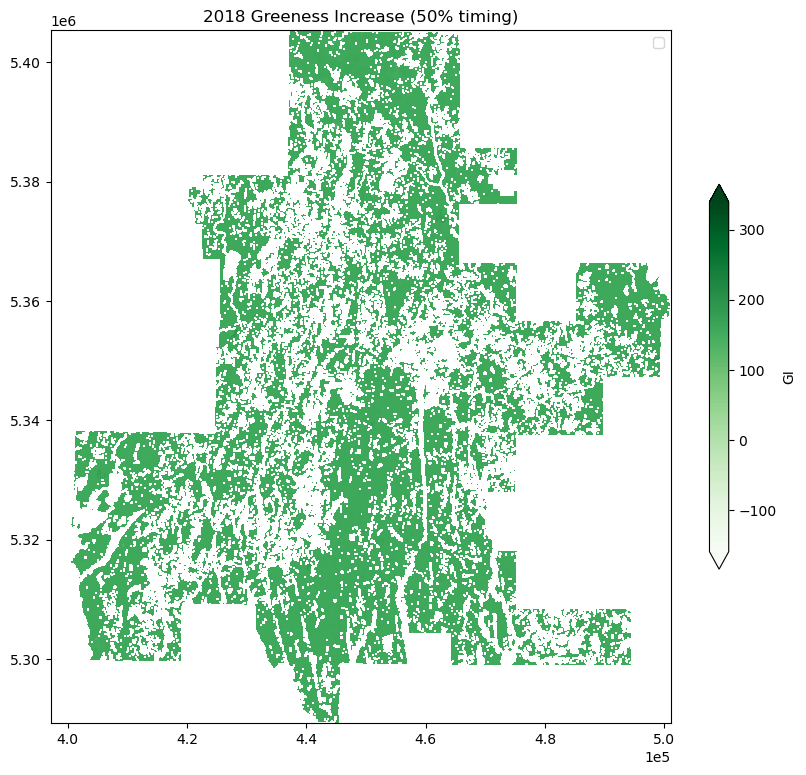

In [16]:
from whitebox_workflows import WbEnvironment, show
import matplotlib.pyplot as plt
import os

wbe = WbEnvironment()
wbe.working_directory = r"E:\rmf_img\phenology\MSLSP30NA_011-20240822_202450"

# Plotting
fig, ax = plt.subplots()
target_year=2018

# Reading raster data
raster_path = os.path.join(wbe.working_directory, str(target_year), "clipped_0.tif")
topo = wbe.read_raster(raster_path)
ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax = show(topo, ax=ax, title=f'{target_year} Greeness Increase (50% timing)', cmap='Greens', clip_percent=0.0, figsize=(10,10), skip=2, colorbar_kwargs={'label': 'GI', 'location': "right", 'shrink': 0.5})
# set axes range
ax.set_xlim([topo.configs.west, topo.configs.east])
ax.set_ylim([topo.configs.south, topo.configs.north])

ax.legend() 
target_year+=1

plt.show()

In [17]:
fig.savefig(r"D:/Sync/research/tree_species_estimation/paper/fusion/imgs/rmf_gi_2018.svg", format="svg")

NOTE: only 2018 keeped

resampling&clip

## topo

source: 
ASTER Global Digital Elevation Model V003

The ASTER Digital Elevation Model (AST14DEM) product is generated (https://lpdaac.usgs.gov/documents/996/ASTER_Earthdata_Search_Order_Instructions.pdf) using bands 3N (nadir-viewing) and 3B (backward-viewing) of an (ASTER Level 1A) (https://doi.org/10.5067/ASTER/AST_L1A.003) image acquired by the Visible and Near Infrared (VNIR) sensor. The VNIR subsystem includes two independent telescope assemblies that facilitate the generation of stereoscopic data. The band 3 stereo pair is acquired in the spectral range of 0.78 and 0.86 microns with a base-to-height ratio of 0.6 and an intersection angle of 27.7 degrees. There is a time lag of approximately one minute between the acquisition of the nadir and backward images. For a better understanding, refer to this (diagram) (https://lpdaac.usgs.gov/documents/301/ASTER_Along_Track_Imaging_Geometry.png) depicting the along-track imaging geometry of the ASTER VNIR nadir and backward-viewing sensors.

The accuracy of the new LP DAAC produced DEMs will meet or exceed accuracy specifications set for the ASTER relative DEMs by the Algorithm Theoretical Basis Document (ATBD) (https://lpdaac.usgs.gov/documents/81/AST14_ATBD.pdf). Users likely will find that the DEMs produced by the new LP DAAC system have accuracies approaching those specified in the ATBD for absolute DEMs. Validation testing has shown that DEMs produced by the new system frequently are more accurate than 25 meters root mean square error (RMSE) in xyz dimensions.

Improvements/Changes from Previous Versions

As of January 2021, the LP DAAC has implemented version 3.0 of the Sensor Information Laboratory Corporation ASTER DEM/Ortho (SILCAST) software, which is used to generate the Level 2 on-demand ASTER Orthorectified and Digital Elevation Model (DEM) products (AST14). The updated software provides digital elevation extraction and orthorectification from ASTER L1B input data without needing to enter ground control points or depending on external global DEMs at 30-arc-second resolution (GTOPO30). It utilizes the ephemeris and attitude data derived from both the ASTER instrument and the Terra spacecraft platform. The outputs are geoid height-corrected and waterbodies are automatically detected in this version. Users will notice differences between AST14DEM, AST14DMO, and AST14OTH products ordered before January 2021 (generated with SILCAST V1) and those generated with the updated version of the production software (version 3.0). Differences may include slight elevation changes over different surface types, including waterbodies. Differences have also been observed over cloudy portions of ASTER scenes. Additional information on SILCAST version 3.0 can be found on the  SILCAST website (http://www.silc.co.jp/en/products.html).

Starting June 23, 2021, radiometric calibration coefficient Version 5 (RCC V5) will be applied to newly observed ASTER data and archived ASTER data products. Details regarding RCC V5 are described in the following journal article.

Tsuchida, S., Yamamoto, H., Kouyama, T., Obata, K., Sakuma, F., Tachikawa, T., Kamei, A., Arai, K., Czapla-Myers, J.S., Biggar, S.F., and Thome, K.J., 2020, Radiometric Degradation Curves for the ASTER VNIR Processing Using Vicarious and Lunar Calibrations: Remote Sensing, v. 12, no. 3, at https://doi.org/10.3390/rs12030427.

https://search.earthdata.nasa.gov/search/granules/collection-details?p=C1299783579-LPDAAC_ECS&pg[0][v]=f&pg[0][gsk]=-start_date&q=ASTER%20Global%20Digital%20Elevation%20Model%20V003&polygon[0]=-81.07436%2C47.92817%2C-81.07436%2C47.92968%2C-81.31512%2C47.92982%2C-81.39907%2C48.07517%2C-81.33431%2C48.18988%2C-81.14938%2C48.19015%2C-81.12129%2C48.27664%2C-81.02728%2C48.27708%2C-80.98728%2C48.38712%2C-81.04851%2C48.45093%2C-81.17346%2C48.45083%2C-81.23037%2C48.364%2C-81.32601%2C48.36392%2C-81.35198%2C48.45078%2C-81.44982%2C48.45076%2C-81.45873%2C48.53793%2C-81.3623%2C48.53778%2C-81.34065%2C48.55964%2C-81.3947%2C48.57774%2C-81.33474%2C48.62474%2C-81.46576%2C48.63798%2C-81.47245%2C48.79829%2C-81.85867%2C48.79599%2C-81.87235%2C48.58005%2C-82.08359%2C48.5598%2C-82.00992%2C48.43233%2C-82.01639%2C48.21012%2C-82.33016%2C48.19051%2C-82.33613%2C48.06068%2C-82.37378%2C48.06673%2C-82.26413%2C47.84318%2C-82.0827%2C47.84459%2C-82.05717%2C47.93051%2C-81.94733%2C47.93012%2C-81.77165%2C47.75454%2C-81.72289%2C47.84283%2C-81.59667%2C47.84304%2C-81.55963%2C47.89009%2C-81.45904%2C47.84259%2C-81.09505%2C47.84303%2C-81.07436%2C47.92817&qt=2018-01-01T00%3A00%3A00.000Z%2C2018-12-31T23%3A59%3A59.999Z&sf=5045306646&sfs[0]=0&tl=1725992951.555!3!!&lat=48.27654144999999&long=-81.6830674&zoom=7

In [ ]:
# download data (in wsl)
!./data_processing/data_downloading/download_topo.sh

### basic info + mosaic

In [16]:
work_dir=r"E:\rmf_img\rfm_topo\ASTGTM_003-20240822_202044"
import glob
import os
from image_utils import quick_mosaic

work_dir=r"E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044"
tif_files = glob.glob(os.path.join(work_dir, "*.tif"))
output_path = os.path.join(work_dir, "topo_mosaic")
quick_mosaic(tif_files, output_path)

Iter time: 0.902463436126709
Output file: E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_mosaic.tif


### translate & clip & resample

In [18]:
from image_utils import quick_translate, quick_clip, clip_raster
import pyproj
shapefile=r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\ROI_RMF\ROI_RMF_32617.shp"
work_dir=r"E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044"
# Define the pattern to search for .tif files for the current target year
raster_path = os.path.join(work_dir, "topo_mosaic.tif")
transformed_path = str(raster_path)[:-4]+'_proj.tif'
out_crs = pyproj.CRS.from_user_input("+proj=utm +zone=17 +datum=WGS84 +units=m +no_defs +type=crs")
quick_translate(raster_path, transformed_path, out_crs)
clip_raster(transformed_path, shapefile, os.path.join(work_dir, "topo_mosaic_clipped.tif"))

shutil.rmtree(transformed_path)

Iter time: 1.3760826587677002
Raster has been reprojected and saved to:  E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_mosaic_proj.tif


In [ ]:
# Plotting
fig, axes = plt.subplots()

raster_path = os.path.join(work_dir, "topo_mosaic_clipped.tif")
raster = gdal.Open(raster_path)
raster_data = raster.GetRasterBand(1).ReadAsArray()
axes.imshow(raster_data, cmap='viridis')
axes.set_title(f'Raster Topographic')

plt.show()

In [ ]:
#ignore this snippet
'''
from image_utils import quick_translate
import xarray as xr 
import rioxarray as rio
from os.path import join

raster_path=r'E:\rmf_img\rfm_topo\ASTGTM_003-20240822_202044\clipped_0.tif'
output_path=r'E:\rmf_img\rfm_topo\ASTGTM_003-20240822_202044\clipped_proj.tif'
quick_translate(raster_path, output_path, 'epsg:2958')

raster=xr.open_dataset(output_path)
raster
'''

In [25]:
import xarray as xr
import rioxarray as rio

raster = xr.open_dataset(r"E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_mosaic_clipped.tif")
raster

<xarray.Dataset>
Dimensions:      (band: 1, x: 4277, y: 4780)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 3.972e+05 3.972e+05 ... 5.01e+05 5.011e+05
  * y            (y) float64 5.405e+06 5.405e+06 ... 5.289e+06 5.289e+06
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) float32 ...

### calculate slope & aspect

In [11]:
from whitebox_workflows import WbEnvironment
from whitebox_workflows import WbPalette, show
import matplotlib.pyplot as plt

wbe = WbEnvironment()
wbe.working_directory = r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044'
# Reading raster data
topo = wbe.read_raster('topo_mosaic_clipped.tif')
print(f'EPSG code: {topo.configs.epsg_code}') # 0 if not set


slope=wbe.slope(topo)
slope.clip_display_min_max(2.0)
aspect=wbe.aspect(topo)


EPSG code: 32617


In [5]:
wbe.write_raster(slope, 'topo_slope.tif')
wbe.write_raster(aspect, 'topo_aspect.tif')

#### vis

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


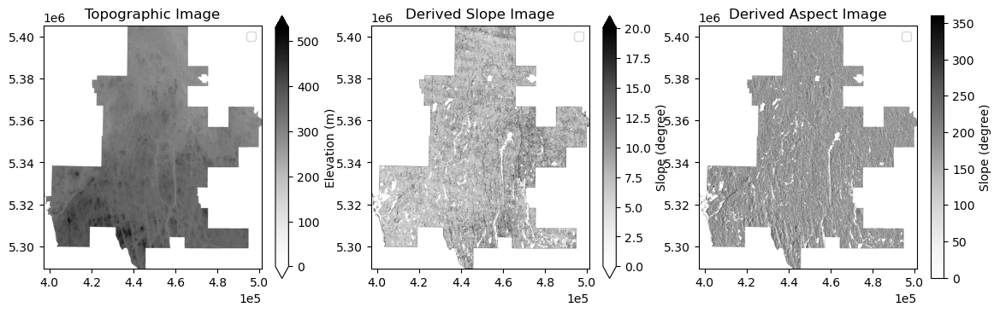

In [14]:
from whitebox_workflows import WbPalette, show

fig, ax = plt.subplots(1, 3)
ax[0].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax[1].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax[2].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax[0] = show(topo, ax=ax[0], title='Topographic Image', cmap='Greys', figsize=(14,8), clip_percent=0.0, skip=2, colorbar_kwargs={'label': 'Elevation (m)', 'location': "right", 'shrink': 0.5})
ax[1] = show(slope, ax=ax[1], title='Derived Slope Image', cmap='Greys', figsize=(14,8), skip=2, colorbar_kwargs={'label': 'Slope (degree)', 'location': "right", 'shrink': 0.5})
ax[2] = show(aspect, ax=ax[2], title='Derived Aspect Image', cmap='Greys', figsize=(14,8), skip=2, colorbar_kwargs={'label': 'Aspect (degree)', 'location': "right", 'shrink': 0.5})
# set axes range
ax[0].set_xlim([topo.configs.west, topo.configs.east])
ax[0].set_ylim([topo.configs.south, topo.configs.north])
# set axes range
ax[1].set_xlim([slope.configs.west, slope.configs.east])
ax[1].set_ylim([slope.configs.south, slope.configs.north])
# set axes range
ax[2].set_xlim([slope.configs.west, slope.configs.east])
ax[2].set_ylim([slope.configs.south, slope.configs.north])
ax[0].legend() 
ax[1].legend() 
ax[2].legend() 
plt.show()

In [15]:
fig.savefig(r"D:/Sync/research/tree_species_estimation/paper/fusion/imgs/rmf_topo.svg", format="svg")

In [ ]:
# mask data
clip_raster(
    mosaic,
    join(directory, "rmf_fri", "RMF_PolygonForest_forest.shp"),
    outfile,
    invert=False,
    crop=False,
)

In [10]:
# copy data to work directory
import shutil
shutil.copy(r"E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_mosaic_clipped.tif", r'D:\Sync\research\tree_species_estimation\tree_dataset\imagery\rmf_topo\topo_mosaic_clipped.tif')
shutil.copy(r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_slope.tif', r"D:/Sync/research/tree_species_estimation/tree_dataset/imagery/rmf_topo/topo_slope.tif")
shutil.copy(r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_aspect.tif', r"D:/Sync/research/tree_species_estimation/tree_dataset/imagery/rmf_topo/topo_aspect.tif")

'D:/Sync/research/tree_species_estimation/tree_dataset/imagery/rmf_topo/topo_aspect.tif'

### aspect to Solar-radiation Aspect Index 

Roberts and Cooper (1989) you mentioned is a transformation of aspect to represent solar exposure, which adjusts the raw aspect values to reflect how much solar radiation a slope receives. Here's a breakdown of how it works:


**Transformed Aspect (TRASP)** Formula:

trasp = 1 − cos(𝜋/180(𝑎−30))/2

Where:

a = aspect in degrees (0–360°).

The aspect angle a is adjusted by subtracting 30° (north-northeast is considered the coolest and wettest orientation).

The cosine function is then used to reflect how the aspect of a slope affects its exposure to sunlight, with the result scaled between 0 and 1.

In [16]:
import rasterio
import numpy as np

# Function to calculate TRASP based on the aspect value
def calculate_trasp(aspect_array):
    # Convert aspect from degrees to radians
    aspect_radians = np.deg2rad(aspect_array)
    # Calculate TRASP (Transformed Aspect)
    trasp = (1 - np.cos(aspect_radians - np.deg2rad(30))) / 2
    return trasp

# Function to load aspect file, calculate TRASP, and save the result as a GeoTIFF
def convert_aspect_to_trasp(aspect_path, output_path):
    # Load the aspect GeoTIFF file
    with rasterio.open(aspect_path) as src:
        # Read the aspect data as a numpy array
        aspect_data = src.read(1)
        
        # Mask out invalid aspect values (if any), usually marked as negative values or NaN
        aspect_data = np.where(aspect_data < 0, np.nan, aspect_data)
        
        # Calculate TRASP
        trasp_data = calculate_trasp(aspect_data)
        
        # Set the metadata for the TRASP output
        trasp_meta = src.meta.copy()
        trasp_meta.update({
            "dtype": "float32",  # Save as float since TRASP values are between 0 and 1
            "nodata": np.nan     # Use NaN as nodata value if necessary
        })

    # Write the TRASP output to a new GeoTIFF file
    with rasterio.open(output_path, 'w', **trasp_meta) as dst:
        dst.write(trasp_data, 1)

    print(f"TRASP GeoTIFF created successfully at {output_path}!")

In [17]:
aspect_path = r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_aspect.tif'
output_path = r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_trasp.tif'
convert_aspect_to_trasp(aspect_path, output_path)

TRASP GeoTIFF created successfully at E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_trasp.tif!


In [20]:
trasp = wbe.read_raster('topo_trasp.tif')

In [19]:
import shutil
shutil.copy(r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_trasp.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_trasp\topo_trasp.tif')

'D:\\Sync\\research\\tree_species_estimation\\tree_dataset\\rmf\\imagery\\rmf_trasp\\topo_trasp.tif'

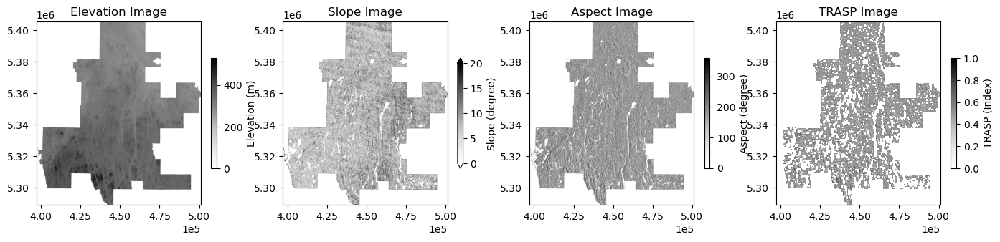

In [32]:
from whitebox_workflows import WbPalette, show

fig, ax = plt.subplots(1, 4)

for i in range(0,4):
    ax[i].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    
ax[0] = show(topo, ax=ax[0], title='Elevation Image', cmap='Greys', figsize=(17,4), skip=2, colorbar_kwargs={'label': 'Elevation (m)', 'location': "right", 'shrink': 0.5})
ax[1] = show(slope, ax=ax[1], title='Slope Image', cmap='Greys', figsize=(17,4), skip=2, colorbar_kwargs={'label': 'Slope (degree)', 'location': "right", 'shrink': 0.5})
ax[2] = show(aspect, ax=ax[2], title='Aspect Image', cmap='Greys', figsize=(17,4), skip=2, colorbar_kwargs={'label': 'Aspect (degree)', 'location': "right", 'shrink': 0.5})
ax[3] = show(trasp, ax=ax[3], title='TRASP Image', cmap='Greys', figsize=(17,4), skip=2, colorbar_kwargs={'label': 'TRASP (Index)', 'location': "right", 'shrink': 0.5})

# set axes range
ax[0].set_xlim([topo.configs.west, topo.configs.east])
ax[0].set_ylim([topo.configs.south, topo.configs.north])

ax[1].set_xlim([slope.configs.west, slope.configs.east])
ax[1].set_ylim([slope.configs.south, slope.configs.north])

ax[2].set_xlim([slope.configs.west, aspect.configs.east])
ax[2].set_ylim([slope.configs.south, aspect.configs.north])

ax[3].set_xlim([slope.configs.west, trasp.configs.east])
ax[3].set_ylim([slope.configs.south, trasp.configs.north])

plt.show()

In [33]:
fig.savefig(r"D:/Sync/research/tree_species_estimation/paper/fusion/imgs/rmf_topo_TRASP.svg", format="svg")

### Topographic Wetness Index (TWI)

also known as the Compound Topographic Index (CTI), is a commonly used terrain attribute that quantifies the tendency of water to accumulate at any given location. It’s widely used in hydrological modeling and landscape analysis, particularly to assess soil moisture, potential erosion, and runoff patterns.

Formula for TWI:
The Topographic Wetness Index (TWI) is typically calculated using the formula:

TWI = ln(𝐴/tan(𝛽))

Where:

- A = Upslope contributing area (catchment area per unit contour length).
- β = Slope angle at the point of interest (in radians).
- ln = Natural logarithm.

In [36]:
#$ conda install richdem -c conda-forge

In [41]:
import rasterio
import numpy as np
import richdem as rd
import matplotlib.pyplot as plt

# Function to calculate TWI from DEM GeoTIFF
def calculate_twi(dem_path, output_twi_path):
    # Load the DEM data using richdem
    dem_data = rd.LoadGDAL(dem_path, no_data=-9999)
    
    # Calculate the slope in radians
    slope = rd.TerrainAttribute(dem_data, attrib='slope_radians')

    # Calculate the flow accumulation
    flow_accum = rd.FlowAccumulation(dem_data, method='D8')
    
    # Compute the TWI using the formula TWI = ln(A / tan(slope))
    twi = np.log((flow_accum + 1) / (np.tan(slope) + 1e-6))  # Add small constant to avoid division by zero
    
    # Save the TWI as a new GeoTIFF
    with rasterio.open(dem_path) as src:
        meta = src.meta.copy()
        meta.update(dtype='float32')
        
        with rasterio.open(output_twi_path, 'w', **meta) as dst:
            dst.write(twi.astype(np.float32), 1)
    
    print(f"TWI GeoTIFF saved at {output_twi_path}")

In [42]:
topo_path = r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_mosaic_clipped.tif'
output_path = r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_twi.tif'
calculate_twi(topo_path, output_path)

TWI GeoTIFF saved at E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_twi.tif


In [43]:
import shutil
shutil.copy(r'E:\rmf_img\rmf_topo\ASTGTM_003-20240822_202044\topo_twi.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_twi\topo_twi.tif')

'D:\\Sync\\research\\tree_species_estimation\\tree_dataset\\rmf\\imagery\\rmf_twi\\topo_twi.tif'

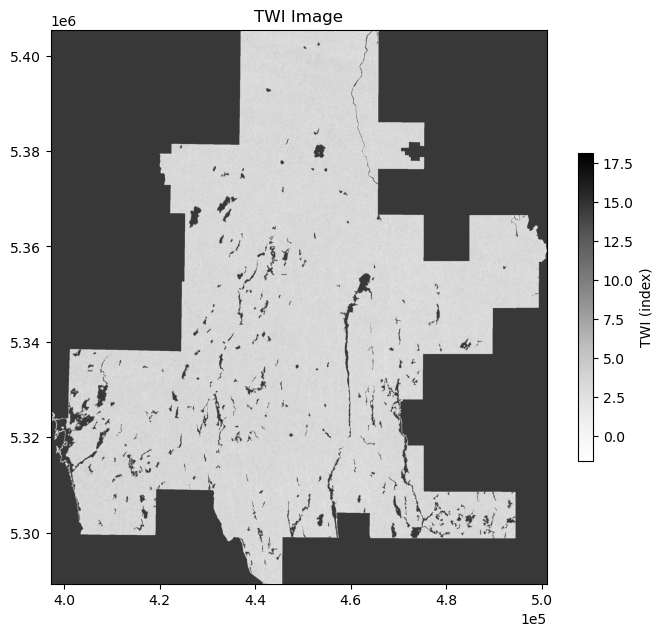

In [45]:
from whitebox_workflows import WbPalette, show

twi = wbe.read_raster('topo_twi.tif')

fig, ax = plt.subplots()

ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    
ax = show(twi, ax=ax, title='TWI Image', cmap='Greys', figsize=(8,8), skip=2, colorbar_kwargs={'label': 'TWI (index)', 'location': "right", 'shrink': 0.5})
# set axes range
ax.set_xlim([twi.configs.west, twi.configs.east])
ax.set_ylim([twi.configs.south, twi.configs.north])

plt.show()

## climate

### clip

In [3]:
from glob import glob
from os.path import join
from image_utils import quick_translate, rasterio_clip
import pyproj
import os

work_dir=r"E:\rmf_img\rmf_climate\Normal_1991_2020MP"
ImageList = glob(join(work_dir,f"*.asc")) # or use sorted(glob.glob('*.tif')) if input images are sortable
shapefile=r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\ROI_RMF\ROI_RMF_32617.shp"

for image in ImageList:
    transformed_path = str(image)[:-4]+'_proj.tif'
    out_path = str(image)[:-4]
    # Perform the mosaic operation
    # epsg:32617 might should translate to 2958 (32617 has different datum)
    out_crs = pyproj.CRS.from_user_input("+proj=utm +zone=17 +datum=WGS84 +units=m +no_defs +type=crs")
    quick_translate(image, transformed_path, out_crs)
    rasterio_clip(shapefile, transformed_path, out_path)
    os.remove(transformed_path)
    # Print a completion message for the current year
    print(f"Finished clip for {image}!")

Finished clip for E:\rmf_img\rmf_climate\Normal_1991_2020MP\PPT01.asc!


### merge bands

In [26]:
from osgeo import gdal
from glob import glob
from os.path import join

work_dir=r"E:\rmf_img\rmf_climate\Normal_1991_2020MP"
ImageList = glob(join(work_dir,f"*.asc")) # or use sorted(glob.glob('*.tif')) if input images are sortable
VRT = 'OutputImage.vrt'
gdal.BuildVRT(VRT, ImageList, separate=True, callback=gdal.TermProgress_nocb)
InputImage = gdal.Open(VRT, 0)  # open the VRT in read-only mode
gdal.Translate(join(work_dir, 'MergedAllAsBands_20m.tif'), InputImage, format='GTiff',
               creationOptions=['COMPRESS:DEFLATE', 'TILED:YES'],
               callback=gdal.TermProgress_nocb)
del InputImage  # close the VRT

In [ ]:
import shutil
shutil.copy(join(work_dir, 'MergedAllAsBands_20m.tif'), r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_climate\MergedAllAsBands_20m.tif')

In [3]:
import xarray as xr 
import rioxarray as rio
from os.path import join

raster_path = join(wbe.working_directory, "MergedAllAsBands.tif")
raster=xr.open_dataset(raster_path)
raster

c:\Users\ycao68\AppData\Local\miniconda3\Lib\site-packages\pyproj\__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


<xarray.Dataset> Size: 4GB
Dimensions:      (band: 36, x: 5241, y: 5865)
Coordinates:
  * band         (band) int32 144B 1 2 3 4 5 6 7 8 9 ... 29 30 31 32 33 34 35 36
  * x            (x) float64 42kB 3.965e+05 3.966e+05 ... 5.01e+05 5.011e+05
  * y            (y) float64 47kB 5.406e+06 5.406e+06 ... 5.289e+06 5.289e+06
    spatial_ref  int32 4B ...
Data variables:
    band_data    (band, y, x) float32 4GB ...

### resampling 
don't need now, did it in ClimateNA

In [26]:
from whitebox_workflows import WbEnvironment

wbe = WbEnvironment()

wbe.working_directory = r'E:\rmf_img\climate\Normal_1991_2020_monthly'
# Reading raster data
merged_data = wbe.read_raster("MergedAllAsBands.tif")
print(f'EPSG code: {merged_data.configs.epsg_code}') # 0 if not set
print(f'Resolution (x direction): {merged_data.configs.resolution_x}')

EPSG code: 2958
Resolution (x direction): 1094.509690275957


In [27]:
resampled_20m=wbe.resample([merged_data], 20)
wbe.write_raster(resampled_20m, 'resampled_20m.tif')

In [29]:
from osgeo import gdal
infn = r'E:\rmf_img\climate\Normal_1991_2020_monthly\MergedAllAsBands.tif'
outfn = r'E:\rmf_img\climate\Normal_1991_2020_monthly\MergedAllAsBands_20m.tif'

xres=20
yres=20
resample_alg = 'near'

ds = gdal.Warp(outfn, infn, xRes=xres, yRes=yres, resampleAlg=resample_alg)
ds = None

### vis

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


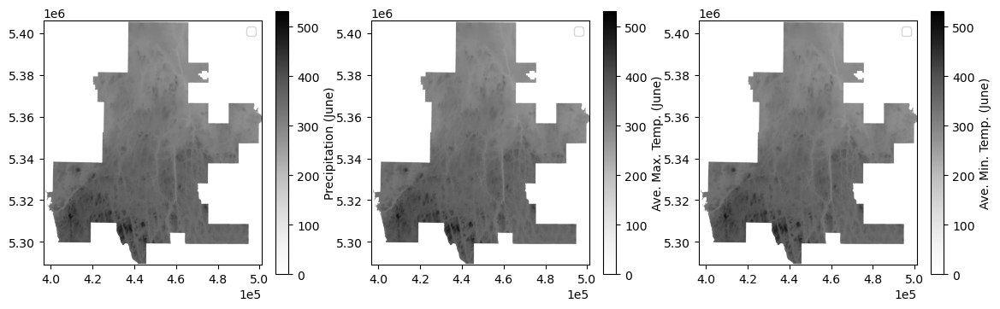

In [13]:
from whitebox_workflows import WbPalette, show
import matplotlib.pyplot as plt

wbe.working_directory = r'E:\rmf_img\rmf_climate\Normal_1991_2020MP'
# Reading raster data
ppt6 = wbe.read_raster('PPT06_clipped_0.tif')
tmax6 = wbe.read_raster('Tmax06_clipped_0.tif')
tmin6 = wbe.read_raster('Tmin06_clipped_0.tif')

fig, ax = plt.subplots(1, 3)
ax[0].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax[1].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax[2].ticklabel_format(style='sci', axis='x', scilimits=(0,0))

ax[0] = show(ppt6, ax=ax[0], cmap='Greys', figsize=(14,8), skip=2, colorbar_kwargs={'label': 'Precipitation (June)', 'location': "right", 'shrink': 0.5})
ax[1] = show(tmax6, ax=ax[1], cmap='Greys', figsize=(14,8), skip=2, colorbar_kwargs={'label': 'Ave. Max. Temp. (June)', 'location': "right", 'shrink': 0.5},)
ax[2] = show(tmin6, ax=ax[2], cmap='Greys', figsize=(14,8), skip=2, colorbar_kwargs={'label': 'Ave. Min. Temp. (June)', 'location': "right", 'shrink': 0.5},)

ax[0].legend() 
ax[1].legend()
ax[2].legend() 

plt.show()

In [14]:
fig.savefig(r"D:\Sync\research\tree_species_estimation\paper\fusion\imgs\climate.svg", format="svg")

In [11]:
from osgeo import gdal
from glob import glob
from os.path import join

work_dir=r"E:\rmf_img\rmf_climate\Normal_1991_2020MP_10m"
ImageList = glob(join(work_dir,f"*.asc")) # or use sorted(glob.glob('*.tif')) if input images are sortable
VRT = 'OutputImage.vrt'
gdal.BuildVRT(VRT, ImageList, separate=True, callback=gdal.TermProgress_nocb)
InputImage = gdal.Open(VRT, 0)  # open the VRT in read-only mode
gdal.Translate(join(work_dir, 'MergedAll_10m.tif'), InputImage, format='GTiff',
               creationOptions=['COMPRESS:DEFLATE', 'TILED:YES'],
               callback=gdal.TermProgress_nocb)
del InputImage  # close the VRT

In [ ]:
from glob import glob
from os.path import join
from image_utils import quick_translate, quick_clip
import pyproj
import os

image=r"E:\rmf_img\rmf_climate\Normal_1991_2020MP_10m\MergedAll_10m.tif"
shapefile=r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\ROI_RMF\ROI_RMF_32617.shp"

transformed_path = str(image)[:-4]+'_proj.tif'
out_path = str(image)[:-4]
# Perform the mosaic operation
# epsg:32617
out_crs = pyproj.CRS.from_user_input("+proj=utm +zone=17 +datum=WGS84 +units=m +no_defs +type=crs")
quick_translate(image, transformed_path, out_crs)
quick_clip(transformed_path, shapefile, out_path)
os.remove(transformed_path)
# Print a completion message for the current year
print(f"Finished clip for {image}!")

In [ ]:
import shutil
shutil.copy(r'E:\rmf_img\rmf_climate\Normal_1991_2020MP_10m\MergedAllAsBands_10m.tif', r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_climate\MergedAllAsBands_20m.tif')

## Sentienl-2

sh-930fc8d3-ada2-452e-91f8-237305fa834c

IpF2p9jFbieLQPnyMdo2q0jrqecEr5hJ

In [ ]:
# 8LDVaraWYZ9k6D3@@

https://browser.dataspace.copernicus.eu/?zoom=9&lat=45.70157&lng=-77.35163&themeId=DEFAULT-THEME&visualizationUrl=U2FsdGVkX19oXIwi2FrkFZYolrQe92y3%2F8dmqafVUqxR53OfWxEm6g7HQXpjSbkVwv%2FU12s6SA95ETE1jxWBThA%2Buj3eQiXDns1QGoQzyEjDzXE0t90ksZNS30RhwBzK&datasetId=S2_L2A_CDAS&fromTime=2018-03-01T00%3A00%3A00.000Z&toTime=2018-05-31T23%3A59%3A59.999Z&layerId=1_TRUE_COLOR

In [8]:
import shapely

roi_shp = shapely.from_geojson('{"type": "MultiPolygon", "coordinates": [ [ [ [ -78.436130908370274, 46.293248429455986 ], [ -78.425550373186468, 46.309086220552018 ], [ -78.122241697916962, 46.292029948069953 ], [ -77.677859220196552, 46.218871453040954 ], [ -77.258164657905056, 46.030651201206027 ], [ -77.173520376434482, 45.900723307698634 ], [ -76.99717812337083, 45.82704414505455 ], [ -76.940748602390471, 45.915447422635836 ], [ -76.767933194388092, 45.89090506119917 ], [ -76.665654687611152, 45.674464419260843 ], [ -76.288282266054907, 45.479443923823673 ], [ -76.267121195687295, 45.444812677561828 ], [ -76.750298969081712, 45.134662189665917 ], [ -77.152359306066856, 45.087370827465897 ], [ -77.229949897414855, 45.209252980126934 ], [ -77.565000178235806, 45.122220893484602 ], [ -77.706073980686753, 45.40768416459305 ], [ -77.847147783137643, 45.370531230895857 ], [ -77.945899444853325, 45.516525224755412 ], [ -77.806589064933007, 45.554816915298723 ], [ -77.848911205668301, 45.678160787998159 ], [ -77.510334079786062, 45.761879657424153 ], [ -77.693730022972275, 46.099169336193739 ], [ -77.891233346403581, 46.047788707746214 ], [ -77.921211529424397, 46.100392101463392 ], [ -78.090500092365488, 46.055131726274801 ], [ -78.136349078162027, 46.140728143061416 ], [ -78.323271866409542, 46.0881632285002 ], [ -78.436130908370274, 46.293248429455986 ] ] ] ] }')

In [10]:
print(roi_shp)

MULTIPOLYGON (((-78.43613090837027 46.293248429455986, -78.42555037318647 46.30908622055202, -78.12224169791696 46.29202994806995, -77.67785922019655 46.218871453040954, -77.25816465790506 46.03065120120603, -77.17352037643448 45.900723307698634, -76.99717812337083 45.82704414505455, -76.94074860239047 45.915447422635836, -76.76793319438809 45.89090506119917, -76.66565468761115 45.67446441926084, -76.2882822660549 45.47944392382367, -76.2671211956873 45.44481267756183, -76.75029896908171 45.13466218966592, -77.15235930606686 45.0873708274659, -77.22994989741485 45.209252980126934, -77.5650001782358 45.1222208934846, -77.70607398068675 45.40768416459305, -77.84714778313764 45.37053123089586, -77.94589944485332 45.51652522475541, -77.80658906493301 45.55481691529872, -77.8489112056683 45.67816078799816, -77.51033407978606 45.76187965742415, -77.69373002297228 46.09916933619374, -77.89123334640358 46.047788707746214, -77.9212115294244 46.10039210146339, -78.09050009236549 46.0551317262748

### download: 

https://sen2mosaic.readthedocs.io/en/latest/worked_example.html

https://github.com/semiautomaticgit/remotior_sensus/tree/f633e550d3247c28cd48cab24cc07e1f5fa4b281

https://github.com/tanmay-delhikar/satellite-image-analysis-ml/blob/main/1-dataset-sentinel2-satellite/s2-data-downloader.py (also process)

### sen2col

In [2]:
!cd D:\Sync\research\tree_species_estimation\code\fusion\M3F_Net\utils

In [2]:
# RUN SEN2COR FIRST #
!python S2_sen2cor.py

Sen2Cor. Version: 02.11.00, created: 2022.10.20, supporting Level-1C product version 14.2 - 14.9 started ...


Unzipping Folders: 100%|██████████| 24/24 [02:59<00:00,  7.48s/it]

L2A Processing: 100%|██████████| 21/21 [4:15:43<00:00, 730.66s/it]



Product version: 14.6
Operation mode: TOOLBOX
Processing baseline: 99.99
Progress[%]:  0.00 : Generating datastrip metadata
L2A datastrip successfully generated
No resolution specified, will process 20 and 10 m resolution
20 m resolution will be downsampled to 60 m
Progress[%]: 0.12 : PID-28328, L2A_ProcessTile: processing with resolution 20 m, elapsed time[s]: 1.665, total: 0:00:06.629000
Progress[%]: 0.12 : PID-28328, L2A_ProcessTile: start of pre processing, elapsed time[s]: 0.001, total: 0:00:06.630000
Progress[%]: 0.13 : PID-28328, L2A_Tables: start import, elapsed time[s]: 0.085, total: 0:00:06.715000
Progress[%]: 0.29 : PID-28328, L2A_Tables: band B01 imported, elapsed time[s]: 2.230, total: 0:00:08.945000
Progress[%]: 0.47 : PID-28328, L2A_Tables: band B02 imported, elapsed time[s]: 2.474, total: 0:00:11.419000
Progress[%]: 0.62 : PID-28328, L2A_Tables: band B03 imported, elapsed time[s]: 1.918, total: 0:00:13.337000
Progress[%]: 0.75 : PID-28328, L2A_Tables: band B04 imported

In [3]:
import os
import shutil

# Define the paths to the two folders
season="summer"
first_folder = f"D:/rfm_sen/{season}/raw"  # This folder contains subfolders
second_folder = f"D:/rfm_sen/{season}/L2A"  # This folder contains .tif files
destination_folder = os.path.join(first_folder, "second")  # Folder to move unprocessed subfolders

# Create the destination folder if it doesn't exist
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Step 1: Extract tile_name and date_time from the .zip files in the first folder
first_folder_zip_files = [f for f in os.listdir(first_folder) if f.endswith(".zip")]
expected_files = []

zip_to_filename_map = {}  # Map to store the .zip file and expected subfolder relationship

for zip_file in first_folder_zip_files:
    parts = zip_file.split('_')
    if len(parts) >= 5:
        tile_name = parts[5]
        date_time = parts[2]
        # Expected files list contains only the tile_name and the first date_time
        expected_files.append((tile_name, date_time))
        zip_to_filename_map[(tile_name, date_time)] = zip_file

# Step 2: Extract tile_name and date_time from subfolders in the second folder
second_folder_subfolders = [f for f in os.listdir(second_folder) if f.endswith(".SAFE")]
processed_files = []

for folder in second_folder_subfolders:
    parts = folder.split('_')
    if len(parts) >= 5:
        tile_name = parts[5]
        date_time = parts[2]
        # Processed files contain the same tuple of tile_name and date_time
        processed_files.append((tile_name, date_time))

# Step 3: Identify missing .zip files by comparing expected files with processed files
missing_files = [zip_to_filename_map[file] for file in expected_files if file not in processed_files]

# Step 4: Move missing .zip files to the "second" folder
if missing_files:
    print("The following .zip files will be moved to the 'second' folder:")
    for missing in missing_files:
        source_path = os.path.join(first_folder, missing)
        destination_path = os.path.join(destination_folder, missing)

        # Move the unprocessed .zip file to the destination folder
        shutil.move(source_path, destination_path)

        print(f"Moved: {missing}")
else:
    print("All .zip files are processed. No files need to be moved.")


All .zip files are processed. No files need to be moved.


### cloudmask

#### composite bands

In [ ]:
import shutil
from image_utils import composite_bands, zip_and_remove_folder, mask_raster

# Create composites for each S2 L2A Scene
directory = r"E:\rfm_sen"
seasons = ["fall", "spring", "summer", "winter"]
bands = [
    "B02",
    "B03",
    "B04",
    "B05",
    "B06",
    "B07",
    "B08",
    "B8A",
    "B11",
    "B12",
]
out_folder = r"D\rfm_sen"

for season in seasons:
    folder = os.path.join(directory, season, "L2A")
    img_folders = os.listdir(folder)
    outpath = os.path.join(out_folder, season, "composites")
    os.makedirs(outpath, exist_ok=True)
    cloudmask_outpath = os.path.join(out_folder, season, "cloud_mask")
    os.makedirs(cloudmask_outpath, exist_ok=True)
    scl_outpath = os.path.join(out_folder, season, "scl")
    os.makedirs(scl_outpath, exist_ok=True)
    aot_outpath = os.path.join(out_folder, season, "aot")
    os.makedirs(aot_outpath, exist_ok=True)
    for i in img_folders:
        if i.endswith(".SAFE"):
            granule = os.path.join(folder, i, "GRANULE")
            l2a_folders = os.listdir(granule)
            for x in l2a_folders:
                img_data = os.path.join(granule, x, "IMG_DATA", "R20m")
                cloud_mask = os.path.join(granule, x, "QI_DATA", "MSK_CLDPRB_20m.tif")
                imgs = [
                    os.path.join(img_data, file)
                    for file in os.listdir(img_data)
                    if file.endswith(".tif")
                    and any(
                        value in os.path.basename(file).split("_") for value in bands
                    )
                ]
                scl = [
                    os.path.join(img_data, file)
                    for file in os.listdir(img_data)
                    if file.endswith("SCL_20m.tif")
                ]
                aot = [
                    os.path.join(img_data, file)
                    for file in os.listdir(img_data)
                    if file.endswith("AOT_20m.tif")
                ]
        tile = os.path.basename(imgs[1]).split("_")[0]
        date = os.path.basename(imgs[1]).split("_")[1]
        output_cloud_filename = os.path.join(
            cloudmask_outpath, f"{tile}_{date}_cloudmask.tif"
        )
        shutil.copy(cloud_mask, output_cloud_filename)

        scl_filename = os.path.join(scl_outpath, os.path.basename(scl[0]))
        shutil.copy(scl[0], scl_filename)

        aot_filename = os.path.join(aot_outpath, os.path.basename(aot[0]))
        shutil.copy(aot[0], aot_filename)

        out_filename = os.path.join(outpath, f"{tile}_{date}.tif")
        band_names = [
            os.path.basename(file).split("_")[2] for file in imgs
        ]  # Check that this works
        composite_bands(imgs, out_filename, band_names)
        zip_and_remove_folder(os.path.join(folder, i))

In [ ]:
# Mask Rasters (Cloud/Haze/Cloud Shadow, Water)
directory = r"E:\RMF_S2"
seasons = ["fall", "spring", "summer", "winter"]
scl_mask_values = [3, 5, 6, 8, 9, 10]
for season in seasons:
    print(season)
    folder = os.path.join(directory, season, "composites")
    outfolder = os.path.join(folder, "masked")
    os.makedirs(outfolder, exist_ok=True)
    imgs = [
        os.path.join(folder, file)
        for file in os.listdir(folder)
        if file.endswith(".tif")
    ]
    for img in imgs:
        basename = os.path.basename(img)[:-4]
        scl_mask_file = os.path.join(
            directory, season, "scl", f"{basename}_SCL_20m.tif"
        )
        aot_mask_file = os.path.join(
            directory, season, "aot", f"{basename}_AOT_20m.tif"
        )

        cloud_mask_file = os.path.join(
            directory, season, "cloud_mask", f"{basename}_cloudmask.tif"
        )
        mask_raster(
            img,
            scl_mask_values,
            scl_mask_file,
            aot_mask_file,
            cloud_mask_file,
            os.path.join(outfolder, f"{basename}.tif"),
        )

### Super resolution

#### L1C

ref: https://github.com/lanha/DSen2/tree/master

In [16]:
!cd D:\Sync\research\tree_species_estimation\code\super_reso\DSen2-master\testing

D:\Sync\research\tree species estimation\code\super_reso\DSen2-master\testing


In [18]:
!python s2_tiles_supres.py ..\data\S2A_MSIL1C_20180907T161901_N0206_R040_T17TMN_20180907T201250.zip ../tmp/output_file_2.tif --run_60

Selected UTM Zone: UTM 17N
Selected pixel region: xmin=0, ymin=0, xmax=10979, ymax=10979:
Image size: width=10980 x height=10980
Selected 10m bands: B4 B3 B2 B8
Selected 20m bands: B5 B6 B7 B8A B11 B12
Selected 60m bands: B1 B9
Loading selected data from: Bands B2, B3, B4, B8 with 10m resolution, UTM 17N
Loading selected data from: Bands B5, B6, B7, B8A, B11, B12 with 20m resolution, UTM 17N
Loading selected data from: Bands B1, B9, B10 with 60m resolution, UTM 17N
Super-resolving the 60m data into 10m bands
Symbolic Model Created.
Predicting using file: ../models/s2_030_lr_1e-05.hdf5

  1/137 ━━━━━━━━━━━━━━━━━━━━ 15:36 7s/step
  2/137 ━━━━━━━━━━━━━━━━━━━━ 12:08 5s/step
  3/137 ━━━━━━━━━━━━━━━━━━━━ 11:53 5s/step
  4/137 ━━━━━━━━━━━━━━━━━━━━ 11:33 5s/step
  5/137 ━━━━━━━━━━━━━━━━━━━━ 11:28 5s/step
  6/137 ━━━━━━━━━━━━━━━━━━━━ 11:25 5s/step
  7/137 ━━━━━━━━━━━━━━━━━━━━ 11:19 5s/step
  8/137 ━━━━━━━━━━━━━━━━━━━━ 11:11 5s/step
  9/137 ━━━━━━━━━━━━━━━━━━━━ 11:02 5s/step
 10/137 ━━━━━━━━━━━━

D:\Sync\research\tree species estimation\code\super_reso\DSen2-master\testing\s2_tiles_supres.py:224: SyntaxWarning: invalid escape sequence '\d'
  m = re.match("(.*?), central wavelength (\d+) nm", description)
2024-08-27 16:00:49.139185: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-27 16:00:50.892740: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
c:\Users\ycao68\AppData\Local\miniconda3\Lib\site-packages\osgeo\gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptio

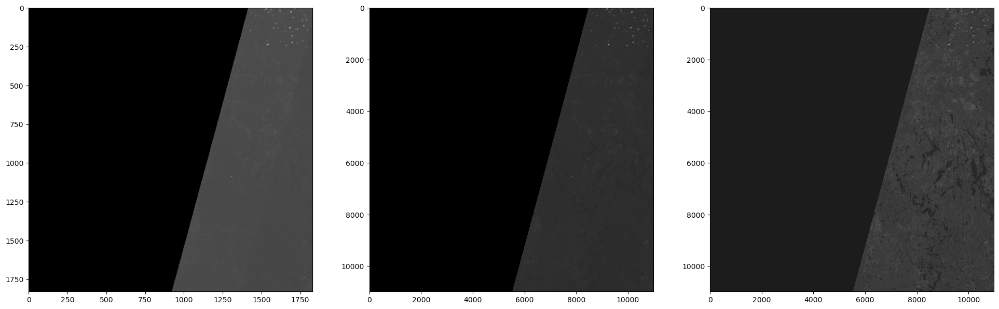

In [13]:
import rasterio
from matplotlib import pyplot

# Reading raster data
r60 = rasterio.open(r'D:\Sync\research\tree_species_estimation\code\super_reso\DSen2-master\tmp\T17TLN_20180907T161901_B01.jp2')
r10_true = rasterio.open(r'D:\Sync\research\tree_species_estimation\code\super_reso\DSen2-master\tmp\T17TLN_20180907T161901_B02.jp2')
r10 = rasterio.open(r'D:\Sync\research\tree_species_estimation\code\super_reso\DSen2-master\tmp\output_file.tif')

fig, ax = plt.subplots(1, 3, figsize=(24,8))

ax[0].imshow(r60.read(1), cmap='grey')
ax[1].imshow(r10_true.read(1), cmap='grey')
ax[2].imshow(r10.read(1), cmap='grey')

plt.show()

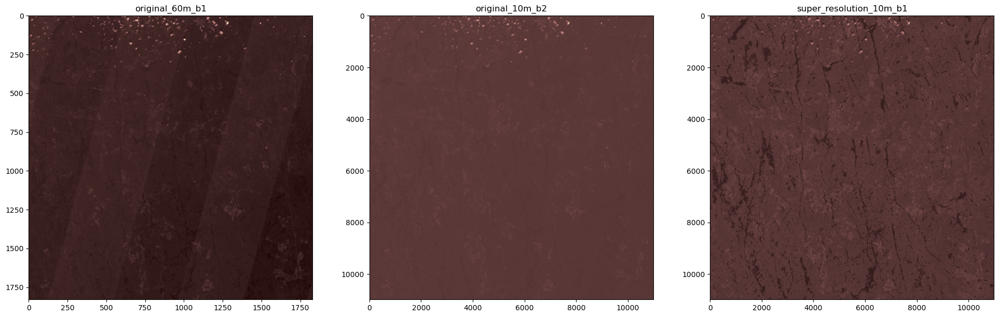

In [23]:
import rasterio
from matplotlib import pyplot

# Reading raster data
r60 = rasterio.open(r'D:\Sync\research\tree_species_estimation\code\super_reso\DSen2-master\tmp\T17TMN_20180907T161901_B01.jp2')
r10_true = rasterio.open(r'D:\Sync\research\tree_species_estimation\code\super_reso\DSen2-master\tmp\T17TMN_20180907T161901_B02.jp2')
r10 = rasterio.open(r'D:\Sync\research\tree_species_estimation\code\super_reso\DSen2-master\tmp\output_file_2.tif')

fig, ax = plt.subplots(1, 3, figsize=(24,8))

ax[0].imshow(r60.read(1), cmap='pink')
ax[0].set_title('original_60m_b1')
ax[1].imshow(r10_true.read(1), cmap='pink')
ax[1].set_title('original_10m_b2')
ax[2].set_title('super_resolution_10m_b1')
ax[2].imshow(r10.read(1), cmap='pink')

plt.show()

In [24]:
fig.savefig(r"D:\Sync\research\tree_species_estimation\paper\fusion\imgs\super_reso.svg", format='SVG')

#### L2A

In [ ]:
supereso_process_cmd = 'python EIFFEL_Sen2_SR_Predict.py --input {xml_file} --output {output_file}'
print ("Running...", l2a_process_cmd)

In [1]:
!cd D:\Sync\research/tree_species_estimation/code/fusion/M3F_Net/augmentation/EIFFEL_Sentinel2_SR/

D:\Sync\research\tree_species_estimation\code\fusion\M3F_Net\augmentation\EIFFEL_Sentinel2_SR


In [ ]:
!python auto_process.py

In [4]:
import os
import shutil

# Define the paths to the two folders
first_folder = f"D:/rfm_sen/winter/L2A"  # This folder contains subfolders
second_folder = f"D:/rfm_sen/winter/composite_10m"  # This folder contains .tif files
destination_folder = os.path.join(first_folder, "L2A_s")  # Folder to move unprocessed subfolders

# Create the destination folder if it doesn't exist
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Step 1: Extract relevant parts from the subfolders in the first folder
first_folder_subfolders = os.listdir(first_folder)
expected_files = []

subfolder_to_filename_map = {}  # Map to store the subfolder and expected filename relationship

for folder in first_folder_subfolders:
    if folder.endswith(".SAFE"):  # Only process folders with the .SAFE extension
        # Extract the TileName and Date from the folder name (which is separated by '_')
        parts = folder.split('_')
        if len(parts) >= 5:
            tile_name = parts[5]
            date_time = parts[2]
            expected_filename = f"{tile_name}_{date_time}.tif"
            expected_files.append(expected_filename)
            subfolder_to_filename_map[expected_filename] = folder

# Step 2: List files in the second folder
second_folder_files = os.listdir(second_folder)

# Step 3: Identify missing files and move corresponding subfolders
missing_files = [file for file in expected_files if file not in second_folder_files]

if missing_files:
    print("The following subfolders will be moved to the 'L2A_s' folder:")
    for missing in missing_files:
        subfolder = subfolder_to_filename_map[missing]
        source_path = os.path.join(first_folder, subfolder)
        destination_path = os.path.join(destination_folder, subfolder)

        # Move the unprocessed subfolder to the destination folder
        shutil.move(source_path, destination_path)

        print(f"Moved: {subfolder}")
else:
    print("All subfolders are processed. No subfolders need to be moved.")

All subfolders are processed. No subfolders need to be moved.


### first mask - cloud&shade&water

In [ ]:
!cd D:

In [33]:
import zipfile
from tqdm import tqdm
import shutil
import os
import sys

def unzip_directory(in_dir):
    os.chdir(in_dir)
    for item in tqdm(
        os.listdir(in_dir), desc="Unzipping Folders", leave=True, colour="red"
    ):
        if item.endswith(".zip"):
            file_name = os.path.abspath(item)
            zip_ref = zipfile.ZipFile(file_name)
            zip_ref.extractall(file_name[:-4])
            zip_ref.close()
            #shutil.rmtree(file_name)
in_dir=f"D:/rfm_sen/spring/L2A"
unzip_directory(in_dir)

Unzipping Folders: 100%|██████████| 114/114 [25:29<00:00, 13.42s/it]


In [4]:
# copy masks to folders
import os
import shutil
from image_utils import zip_and_remove_folder, resample_raster
from tqdm import tqdm

# Create composites for each S2 L2A Scene
directory = f"D:/rfm_sen"
seasons = ["spring", "summer", "fall", "winter"]
out_folder = f"D:/rfm_sen"

for season in tqdm(seasons, desc="Season: ", ncols=100, colour="red"):
    folder = os.path.join(directory, season, "L2A_S")
    img_folders = os.listdir(folder)
    cloudmask_outpath = os.path.join(out_folder, season, "cloud_mask")
    os.makedirs(cloudmask_outpath, exist_ok=True)
    scl_outpath = os.path.join(out_folder, season, "scl")
    os.makedirs(scl_outpath, exist_ok=True)
    aot_outpath = os.path.join(out_folder, season, "aot")
    os.makedirs(aot_outpath, exist_ok=True)

    for i in tqdm(img_folders, desc="copy folder: ", leave=False, ncols=100, colour="green"):
        if i.endswith(".SAFE"):
            granule = os.path.join(folder, i, "GRANULE")
            l2a_folders = os.listdir(granule)
            for x in l2a_folders:
                img_data_10m = os.path.join(granule, x, "IMG_DATA", "R10m")
                img_data_20m = os.path.join(granule, x, "IMG_DATA", "R20m")
                aot = [
                    os.path.join(img_data_10m, file)
                    for file in os.listdir(img_data_10m)
                    if file.endswith("AOT_10m.jp2")
                ]
                cloud_mask = os.path.join(granule, x, "QI_DATA", "MSK_CLDPRB_20m.jp2")
                scl = [
                    os.path.join(img_data_20m, file)
                    for file in os.listdir(img_data_20m)
                    if file.endswith("SCL_20m.jp2")
                ]
                tile = os.path.basename(aot[0]).split("_")[0]
                date = os.path.basename(aot[0]).split("_")[1]
        aot_filename = os.path.join(aot_outpath, os.path.basename(aot[0]))
        shutil.copy(aot[0], aot_filename)
        
        output_cloud_filename_10m = os.path.join(cloudmask_outpath, f"{tile}_{date}_cloudmask_10m.tif")
        resample_raster(cloud_mask, output_cloud_filename_10m, reference_raster_path=aot_filename)

        scl_filename_10m = os.path.join(scl_outpath, os.path.basename(scl[0]).split('.')[0][:-3]+'10m.tif')
        resample_raster(scl[0], scl_filename_10m, reference_raster_path=aot_filename)

        #zip_and_remove_folder(os.path.join(folder, i))

c:\Users\ycao68\AppData\Local\miniconda3\Lib\site-packages\pyproj\__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()
Season: 100%|█████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.24s/it]


In [ ]:
# zip L2A files
from tqdm import tqdm

# Create composites for each S2 L2A Scene
directory = f"D:/rfm_sen"
seasons = ["spring", "fall", "summer", "winter"]

for season in tqdm(seasons, desc="Season: ", ncols=100, colour="red"):
    folder = os.path.join(directory, season, "L2A")
    img_folders = os.listdir(folder)
    for i in tqdm(img_folders, desc="copy folder: ", leave=False, ncols=100, colour="green"):
        zip_and_remove_folder(os.path.join(folder, i))

In [2]:
# mask all images
from image_utils import mask_raster
import os
# Mask Rasters (Cloud/Haze/Cloud Shadow, Water)
directory = r"E:\rmf_img\rmf_s2"
seasons = ["winter"]
scl_mask_values = [3, 5, 6, 8, 9, 10]
for season in seasons:
    print(season)
    folder = os.path.join(directory, season, "composites_10m")
    outfolder = os.path.join(folder, "masked")
    os.makedirs(outfolder, exist_ok=True)
    imgs = [
        os.path.join(folder, file)
        for file in os.listdir(folder)
        if file.endswith(".tif")
    ]
    for img in imgs:
        basename = os.path.basename(img)[:-4]
        scl_mask_file = os.path.join(
            directory, season, "scl", f"{basename}_SCL_10m.tif"
        )
        aot_mask_file = os.path.join(
            directory, season, "aot", f"{basename}_AOT_10m.jp2"
        )

        cloud_mask_file = os.path.join(
            directory, season, "cloud_mask", f"{basename}_cloudmask_10m.tif"
        )
        mask_raster(
            img,
            scl_mask_values,
            scl_mask_file,
            aot_mask_file,
            cloud_mask_file,
            os.path.join(outfolder, f"{basename}.tif"),
        )

winter


In [23]:
import rasterio
raster_path = r'E:\rmf_img\phenology\MSLSP30NA_011-20240822_202450\2018\clipped_2018.tif'
src  = rasterio.open(raster_path)
src.dtypes

('int16',)

In [24]:
src.nodatavals

(32767.0,)

In [4]:
import rasterio
raster_path = r'E:\rmf_img\fall\compare\T17UNP_20180907T161901_composite.tif'
src  = rasterio.open(raster_path)
src.nodata

0.0

### Mosic&Clip

In [4]:
# Create (Merge) Tile Composites
import os
from tqdm import tqdm
from image_utils import merge_rasters

directory = r"E:\rmf_img\rmf_s2"
seasons = ["spring", "summer", "winter", "fall"]
for season in tqdm(seasons, desc="Total: ", leave=True, colour="red"):
    folder = os.path.join(directory, season, "composites_10m", "masked")
    outfolder = os.path.join(directory, season, "tile_composites_10m")
    files = [
        os.path.join(folder, file)
        for file in os.listdir(folder)
        if file.endswith(".tif")
    ]
    tiles = set()
    for file in files:
        tile = os.path.basename(file).split("_")[0]
        tiles.add(tile)
    tiles = list(tiles)
    for tile in tqdm(tiles, desc=f"{season} Total: ", leave=False, colour="cyan"):
        tile_files = [
            os.path.join(folder, file) for file in os.listdir(folder) if tile in file
        ]
        merge_rasters(tile_files, os.path.join(outfolder, f"{tile}.tif"), method="min")

Total: 100%|██████████| 3/3 [8:21:46<00:00, 10035.39s/it]  


In [6]:
# Mosaic
from tqdm import tqdm
import os
from image_utils import mosaic_rasters

directory = r"E:\rmf_img\rmf_s2"
seasons = ["fall", "spring", "summer", "winter"]
out_directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_s2"
for season in tqdm(seasons, desc="Total: ", leave=True, colour="red"):
    folder = os.path.join(directory, season, "tile_composites_10m")
    out_folder = os.path.join(out_directory, season)
    files = [
        os.path.join(folder, file)
        for file in os.listdir(folder)
        if file.endswith(".tif")
    ]
    mosaic_rasters(files, os.path.join(out_folder, "mosaic_10m.tif"))

Total: 100%|██████████| 4/4 [2:23:05<00:00, 2146.28s/it]  


In [8]:
# Clip to Study Area
from image_utils import clip_raster
directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
seasons = ["fall", "spring", "summer", "winter"]
for season in seasons:
    s2_folder = os.path.join(directory, "rmf_s2", season)
    mosaic = os.path.join(s2_folder, "mosaic_10m.tif")
    boundary = os.path.join(directory, "ROI_RMF", "ROI_RMF_32617.shp")
    outfile = os.path.join(s2_folder, "mosaic_10mm_clip.tif")
    clip_raster(mosaic, boundary, outfile)

# Common functions - forest only mask & ntems disturbances & tile

### s2 data

In [1]:
# Start here Mask Disturbance (NTEMS)
import os
from os.path import join
from tqdm import tqdm
from image_utils import resample_raster, ntems_mask, delete_directory, clip_raster, clip_forest

directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
mask_file=join(directory, "rmf_disturb", "rmf_disturb_merged_2020.tif")
boundary = os.path.join(directory, "ROI_RMF", "ROI_RMF_32617.shp")
forest_fri = join(directory, "rmf_fri", "RMF_PolygonForest_forest.shp")
seasons = ["fall", "spring", "summer", "winter"]
# Data codes: 0 = no change, 1 = wildfire, 2 = harvest, 
# 5 = lower confidence wildfire, 6 = lower confidence harvest
mask_values = [1]
resolutions = [10, 20]
for resolution in resolutions:
    for season in tqdm(seasons, desc=f"{resolution}m processing: ", leave=True, colour="green"):
        s2_folder = join(directory, "rmf_s2", season)
        outfolder = join(s2_folder, "masked")
        os.makedirs(outfolder, exist_ok=True)
        temp_folder = join(outfolder, "temp")
        os.makedirs(temp_folder, exist_ok=True)

        input_path = join(s2_folder, f"mosaic_{resolution}m.tif")
        mosaic = join(outfolder, f"mosaic_{resolution}m_FOR.tif")
        clip_forest(input_path, boundary, forest_fri, mosaic)

        resample_raster(mask_file, join(temp_folder, "temp_1.tif"), reference_raster_path = input_path)
        clip_raster(join(temp_folder, "temp_1.tif"), forest_fri, join(temp_folder, "temp_2.tif"), invert=False, crop=False)

        ntems_mask(
            mosaic,
            join(temp_folder, "temp_2.tif"),
            mask_values,
            join(outfolder, f"mosaic_{resolution}m_FOR_ntems.tif"),
        )
        delete_directory(temp_folder)

c:\Users\ycao68\AppData\Local\miniconda3\Lib\site-packages\pyproj\__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()
20m processing:   0%|          | 0/3 [00:00<?, ?it/s]

raster clipped to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_s2\spring\masked\mosaic_20m_FOR.tif


20m processing:  33%|███▎      | 1/3 [03:26<06:53, 206.80s/it]

raster clipped to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_s2\summer\masked\mosaic_20m_FOR.tif


20m processing:  67%|██████▋   | 2/3 [10:30<05:34, 334.42s/it]

raster clipped to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_s2\winter\masked\mosaic_20m_FOR.tif


20m processing: 100%|██████████| 3/3 [17:25<00:00, 348.41s/it]


Tile to patches

In [2]:
from image_utils import tile_raster
# Retile With Overlap
directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
resolutions = [10, 20]
seasons = ["fall", "spring", "summer", "winter"]
tile_size_pixels = 128
overlap_percent = 0.0
for resolution in resolutions:
    output_directory = join(directory, "processed", f'{resolution}m')
    os.makedirs(output_directory, exist_ok=True)
    for season in seasons:
        print(f"start tiling Sentienl2-{season} mosaic data...")
        img = os.path.join(directory, "rmf_s2", season, "masked", f"mosaic_{resolution}m_FOR_ntems.tif")
        output_folder = os.path.join(output_directory, "rmf_s2", season, "tiles_128")
        tile_raster(img, output_folder, tile_size_pixels, overlap_percent)

start tiling Sentienl2-fall mosaic data...


  0%|          | 0/46 [00:00<?, ?it/s]

100%|██████████| 46/46 [00:19<00:00,  2.38it/s]


Raster Tiled
start tiling Sentienl2-spring mosaic data...


100%|██████████| 46/46 [00:31<00:00,  1.47it/s]


Raster Tiled
start tiling Sentienl2-summer mosaic data...


100%|██████████| 46/46 [00:43<00:00,  1.05it/s]


Raster Tiled
start tiling Sentienl2-winter mosaic data...


100%|██████████| 46/46 [00:55<00:00,  1.20s/it]

Raster Tiled


### fri labels

In [9]:
from image_utils import resample_raster, ntems_mask, clip_raster, clip_forest
import os

resolutions = [10, 20]
directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
mask_file=join(directory, "rmf_disturb", "rmf_disturb_merged_2020.tif")
boundary = os.path.join(directory, "ROI_RMF", "ROI_RMF_32617.shp")
forest_fri = join(directory, "rmf_fri", "RMF_PolygonForest_forest.shp")
mask_values = [1]
# Data codes: 0 = no change, 1 = wildfire, 2 = harvest, 
# 5 = lower confidence wildfire, 6 = lower confidence harvest
folder = join(directory, "rmf_fri", )
outfolder = join(folder, "masked")
os.makedirs(outfolder, exist_ok=True)
for resolution in resolutions:
    labels_raster = join(folder, f"RMF_PolygonForest_clean_{resolution}m.tif")
    labels_raster_for = join(folder, f"RMF_PolygonForest_FOR_{resolution}m.tif")
    clip_forest(labels_raster, boundary, forest_fri, labels_raster_for)
    # resample and clip NTEMS mask
    out_raster = join(outfolder, "temp.tif")
    resample_raster(mask_file, out_raster, reference_raster_path=labels_raster)
    out_raster1 = join(outfolder, "temp1.tif")
    clip_raster(out_raster, forest_fri, out_raster1, crop=False, invert=False)

    ntems_mask(
        labels_raster_for,
        out_raster1,
        mask_values,
        join(outfolder, f"RMF_PolygonForest_ntems_{resolution}m.tif"),
    )
    os.remove(out_raster)
    os.remove(out_raster1)

raster clipped to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\RMF_PolygonForest_FOR_10m.tif
raster clipped to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\RMF_PolygonForest_FOR_20m.tif


**remove boundary areas**

- ref: https://github.com/felferrari/deforestation-from-data-fusion/blob/main/01c_Label_Generation.ipynb
- Buffer Size: The size of the buffer determines how much of the border region is excluded from the final dataset. This is usually measured in pixels, corresponding to the resolution of your raster (in your case, each pixel is 10m x 10m). You can adjust the inner_buffer and outer_buffer to control the extent of the exclusion.

- Inner Buffer: Controls how much of the border is considered before expanding outward (dilation).
Outer Buffer: Controls how much of the border is considered inward (erosion).
Morphological Operations:

- Dilation expands the boundaries of the features outward by a specified number of pixels.
Erosion shrinks the boundaries of the features inward by the specified number of pixels.
By subtracting the eroded version from the dilated version, you create a buffer zone where these two operations overlap, effectively marking the boundary.

In [24]:
from skimage.morphology import disk, dilation, erosion
import numpy as np
import rasterio

def process_borders(input_raster_path, output_raster_path, inner_buffer, outer_buffer):
    # Open the raster file
    with rasterio.open(input_raster_path) as src:
        profile = src.profile

        # Read the full raster data (all bands) as a 3D array
        rasterized_data = src.read()

        # Create a disk-shaped structuring element for dilation/erosion
        structuring_element_inner = disk(inner_buffer)
        structuring_element_outer = disk(outer_buffer)

        # Combine all bands to get a single mask for border detection
        combined_data = np.sum(rasterized_data, axis=0)

        # Perform dilation and erosion on the combined mask
        dilated = dilation(combined_data, structuring_element_inner)
        eroded = erosion(combined_data, structuring_element_outer)

        # Find the border by subtracting eroded image from the dilated one
        border_data = dilated - eroded

        # Set border pixels to NoData in all bands
        nodata_value = src.nodata if src.nodata is not None else -1
        rasterized_data[:, border_data > 0] = nodata_value

        # Calculate the sum of the proportions for each pixel
        band_sum = np.sum(rasterized_data, axis=0)  # Shape: (height, width)

        # Set pixels where all bands are not 1 to NoData (-1)
        nodata_mask = band_sum != 1
        rasterized_data[:, nodata_mask] = nodata_value
        # Save the processed data back to a new raster file
        profile.update(nodata=nodata_value)

        # Save the processed data back to a new raster file
        with rasterio.open(output_raster_path, 'w', **profile) as dst:
            dst.write(rasterized_data)

In [26]:
import numpy as np
import rasterio

def raster_nodata(input_raster_path, output_raster_path):
    """
    Process the raster data to ensure:
    1. The sum of proportions in each pixel equals 1.
    2. Regions where all bands are 0 are set to NoData (-1).
    
    Args:
    - input_raster_path: Path to the input raster.
    - output_raster_path: Path to save the processed output raster.
    """
    
    with rasterio.open(input_raster_path) as src:
        # Read the raster data (assuming a 9-band raster, shape: (9, height, width))
        raster_data = src.read()  # Shape: (9, height, width)
        profile = src.profile
        
        # Calculate the sum of the proportions for each pixel
        band_sum = np.sum(raster_data, axis=0)  # Shape: (height, width)
        
        # Create a mask for valid pixels where the sum of bands is exactly 1
        valid_mask = np.isclose(band_sum, 1.0)
        
        # Initialize output data with NoData (-1)
        processed_data = np.full_like(raster_data, fill_value=-1, dtype=np.float32)
        
        # Copy the original data where valid_mask is True (i.e., where the sum is exactly 1)
        processed_data[:, valid_mask] = raster_data[:, valid_mask]
        
        # Update the raster profile to set the NoData value and save the output
        profile.update(dtype=rasterio.float32, nodata=-1)
        
        # Write the processed raster to a new file
        with rasterio.open(output_raster_path, 'w', **profile) as dst:
            dst.write(processed_data)

In [17]:
# 10m
input_raster_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\masked\RMF_PolygonForest_ntems_10m.tif"
output_raster_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\masked\RMF_PolygonForest_ntems_10m_borders.tif"
process_borders(input_raster_path, output_raster_path, inner_buffer=2, outer_buffer=2)
output_raster_nodata_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\masked\RMF_PolygonForest_ntems_10m_borders_validated.tif"
raster_nodata(output_raster_path, output_raster_nodata_path)
os.remove(output_raster_path)

In [ ]:
# 20m
input_raster_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\masked\RMF_PolygonForest_ntems_20m.tif"
output_raster_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\masked\RMF_PolygonForest_ntems_20m_borders.tif"
output_raster_nodata_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_fri\masked\RMF_PolygonForest_ntems_20m_borders_validated.tif"
process_borders(input_raster_path, output_raster_path, inner_buffer=2, outer_buffer=2)
raster_nodata(output_raster_path, output_raster_nodata_path)
os.remove(output_raster_path)

Tile to patches

In [30]:
from image_utils import tile_raster
from os.path import join

fri_folder = join(directory, "rmf_fri", "masked")

resolutions = [10, 20]
for resolution in resolutions:
    print(f"start tiling labels at {resolution}m")
    output_directory = join(directory, "processed", f'{resolution}m')
    os.makedirs(output_directory, exist_ok=True)
    tile_raster(
        join(fri_folder, f"RMF_PolygonForest_ntems_{resolution}m_borders_validated.tif"),
        os.path.join(output_directory, "labels/tiles_128"),
        128,
        0.0,
    )

100%|██████████| 91/91 [44:33<00:00, 29.38s/it]


Raster Tiled


100%|██████████| 46/46 [12:34<00:00, 16.41s/it]

Raster Tiled


### other datasets

need samping...

In [ ]:
# Start here Mask Disturbance (NTEMS)
import os
from os.path import join
from tqdm import tqdm
import glob
from image_utils import quick_clip, resample_raster, ntems_mask, delete_directory, clip_raster, set_nodata, tile_raster

directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
# Data codes: 0 = no change, 1 = wildfire, 2 = harvest, 5 = lower confidence wildfire, 6 = lower confidence harvest
mask_file=join(directory, "rmf_disturb", "rmf_disturb_merged_2020.tif")
mask_values = [1]

boundary = os.path.join(directory, "ROI_RMF", "ROI_RMF_32617.shp")
forest_fri = join(directory, "rmf_fri", "RMF_PolygonForest_forest.shp")

resolutions = [20, 10]
folders = ["rmf_phenology", "rmf_imagery_climate", \
    "rmf_aster_topo", "rmf_aster_aspect", "rmf_aster_slope", "rmf_aster_trasp", "rmf_aster_twi"]

for folder in folders:
    input_folder = join(directory, "imagery", folder)
    #set_nodata(folder, -9999)
    outfolder = join(input_folder, "masked")
    os.makedirs(outfolder, exist_ok=True)
    temp_folder = join(outfolder, "temp")
    os.makedirs(temp_folder, exist_ok=True)
    for resolution in resolutions:
        output_directory = join(directory, "processed", f'{resolution}m')
        # resample & clip ntems
        print(f"generating {resolution}m ntems mask now...")
        resample_raster(mask_file, join(temp_folder, "temp.tif"), new_pixel_size=[resolution, resolution])
        clip_raster(join(temp_folder, "temp.tif"), forest_fri, join(temp_folder, "temp_1.tif"), invert=False, crop=False)
        
        input_files = glob.glob(join(input_folder, f"*.tif"))
        for file in input_files:
            print(f"processing {file} at {resolution}m now")
            # for each dataset, first clip to forest types, then resample it to 
            clip_raster(file, boundary, join(temp_folder, "temp_2.tif"))
            resample_raster(join(temp_folder, "temp_2.tif"), join(temp_folder, "temp_3.tif"),  new_pixel_size=[resolution, resolution])
            clip_raster(join(temp_folder, "temp_3.tif"), forest_fri, join(temp_folder, "temp_4.tif"), invert=False, crop=False)

            masked_output = join(outfolder, os.path.basename(file)[:-4] + f'_{resolution}m.tif')
            print(f"masked dataset save to {masked_output}")
            ntems_mask(
                join(temp_folder, "temp_4.tif"),
                join(temp_folder, "temp_1.tif"),
                mask_values,
                masked_output,
            )
            print("starting tiling...")
            tile_raster(
                masked_output,
                os.path.join(output_directory, os.path.basename(folder), "tiles_128"),
                128,
                0.0,
            )
    delete_directory(temp_folder)

generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_phenology\clipped_2018.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_phenology\masked\clipped_2018_20m.tif
starting tiling...


100%|██████████| 46/46 [00:40<00:00,  1.13it/s]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_phenology\clipped_2018.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_phenology\masked\clipped_2018_10m.tif
starting tiling...


100%|██████████| 91/91 [08:05<00:00,  5.34s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_imagery_climate\MergedAllAsBands.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_imagery_climate\masked\MergedAllAsBands_20m.tif
starting tiling...


100%|██████████| 46/46 [03:05<00:00,  4.04s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_imagery_climate\MergedAllAsBands.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_imagery_climate\masked\MergedAllAsBands_10m.tif
starting tiling...


100%|██████████| 91/91 [13:40<00:00,  9.02s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_topo\topo_mosaic_clipped.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_topo\masked\topo_mosaic_clipped_20m.tif
starting tiling...


100%|██████████| 46/46 [03:08<00:00,  4.10s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_topo\topo_mosaic_clipped.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_topo\masked\topo_mosaic_clipped_10m.tif
starting tiling...


100%|██████████| 91/91 [15:35<00:00, 10.28s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_aspect\topo_aspect.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_aspect\masked\topo_aspect_20m.tif
starting tiling...


100%|██████████| 46/46 [09:26<00:00, 12.31s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_aspect\topo_aspect.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_aspect\masked\topo_aspect_10m.tif
starting tiling...


100%|██████████| 91/91 [37:48<00:00, 24.93s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_slope\topo_slope.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_slope\masked\topo_slope_20m.tif
starting tiling...


100%|██████████| 46/46 [11:44<00:00, 15.31s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_slope\topo_slope.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_slope\masked\topo_slope_10m.tif
starting tiling...


100%|██████████| 91/91 [58:09<00:00, 38.35s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_trasp\topo_trasp.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_trasp\masked\topo_trasp_20m.tif
starting tiling...


100%|██████████| 46/46 [16:31<00:00, 21.55s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_trasp\topo_trasp.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_trasp\masked\topo_trasp_10m.tif
starting tiling...


100%|██████████| 91/91 [1:11:45<00:00, 47.32s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_twi\topo_twi.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_twi\masked\topo_twi_20m.tif
starting tiling...


100%|██████████| 46/46 [10:53<00:00, 14.21s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_twi\topo_twi.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_aster_twi\masked\topo_twi_10m.tif
starting tiling...


100%|██████████| 91/91 [43:54<00:00, 28.95s/it]


Raster Tiled


In [13]:
# Start here Mask Disturbance (NTEMS)
import os
from os.path import join
from tqdm import tqdm
import glob
from image_utils import resample_raster, ntems_mask, delete_directory, clip_raster, tile_raster

directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
# Data codes: 0 = no change, 1 = wildfire, 2 = harvest, 5 = lower confidence wildfire, 6 = lower confidence harvest
mask_file=join(directory, "rmf_disturb", "rmf_disturb_merged_2020.tif")
mask_values = [1]

boundary = os.path.join(directory, "ROI_RMF", "ROI_RMF_32617.shp")
forest_fri = join(directory, "rmf_fri", "RMF_PolygonForest_forest.shp")

resolutions = [20, 10]
folders = ["rmf_spl_dem", "rmf_spl_aspect", "rmf_spl_slope", "rmf_spl_trasp", "rmf_spl_twi"]

for folder in tqdm(folders, desc='processing imageries', leave=False, colour='green'):
    input_folder = join(directory, "imagery", folder)
    #set_nodata(folder, -9999)
    outfolder = join(input_folder, "masked")
    os.makedirs(outfolder, exist_ok=True)
    temp_folder = join(outfolder, "temp")
    os.makedirs(temp_folder, exist_ok=True)
    for resolution in resolutions:
        output_directory = join(directory, "processed", f'{resolution}m')
        # resample & clip ntems
        print(f"generating {resolution}m ntems mask now...")
        resample_raster(mask_file, join(temp_folder, "temp.tif"), new_pixel_size=[resolution, resolution])
        clip_raster(join(temp_folder, "temp.tif"), forest_fri, join(temp_folder, "temp_1.tif"), invert=False, crop=False)
        
        input_files = glob.glob(join(input_folder, f"*{resolution}m.tif"))
        for file in input_files:
            print(f"processing {file} at {resolution}m now")
            # for each dataset, first clip to forest types, then resample it to 
            clip_raster(file, boundary, join(temp_folder, "temp_2.tif"))
            # don't need to resample
            clip_raster(join(temp_folder, "temp_2.tif"), forest_fri, join(temp_folder, "temp_3.tif"), invert=False, crop=False)
            masked_output = join(outfolder, os.path.basename(file)[:-4] + f'_ntems.tif')
            print(f"masked dataset save to {masked_output}")
            ntems_mask(
                join(temp_folder, "temp_3.tif"),
                join(temp_folder, "temp_1.tif"),
                mask_values,
                masked_output,
            )
            print("starting tiling...")
            tile_raster(
                masked_output,
                os.path.join(output_directory, os.path.basename(folder), "tiles_128"),
                128,
                0.0,
            )
    delete_directory(temp_folder)

generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_dem\rmf_sp_deml_20m.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_dem\masked\rmf_sp_deml_20m_ntems.tif
starting tiling...


100%|██████████| 46/46 [01:48<00:00,  2.35s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_dem\rmf_spl_dem_10m.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_dem\masked\rmf_spl_dem_10m_ntems.tif
starting tiling...


100%|██████████| 91/91 [09:11<00:00,  6.06s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_aspect\spl_dem_aspect_20m.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_aspect\masked\spl_dem_aspect_20m_ntems.tif
starting tiling...


100%|██████████| 46/46 [05:41<00:00,  7.42s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_aspect\spl_dem_aspect_10m.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_aspect\masked\spl_dem_aspect_10m_ntems.tif
starting tiling...


100%|██████████| 91/91 [26:43<00:00, 17.62s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_slope\spl_dem_slope_20m.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_slope\masked\spl_dem_slope_20m_ntems.tif
starting tiling...


100%|██████████| 46/46 [08:16<00:00, 10.80s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_slope\spl_dem_slope_10m.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_slope\masked\spl_dem_slope_10m_ntems.tif
starting tiling...


100%|██████████| 91/91 [44:12<00:00, 29.15s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_trasp\spl_dem_trasp_20m.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_trasp\masked\spl_dem_trasp_20m_ntems.tif
starting tiling...


100%|██████████| 46/46 [13:26<00:00, 17.52s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_trasp\spl_dem_trasp_10m.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_trasp\masked\spl_dem_trasp_10m_ntems.tif
starting tiling...


100%|██████████| 91/91 [1:00:19<00:00, 39.77s/it]


Raster Tiled
generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_twi\spl_dem_twi_20m.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_twi\masked\spl_dem_twi_20m_ntems.tif
starting tiling...


100%|██████████| 46/46 [09:38<00:00, 12.57s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_twi\spl_dem_twi_10m.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_twi\masked\spl_dem_twi_10m_ntems.tif
starting tiling...


100%|██████████| 91/91 [37:16<00:00, 24.58s/it]


Raster Tiled


In [ ]:
# Start here Mask Disturbance (NTEMS)
import os
from os.path import join
from tqdm import tqdm
import glob
from image_utils import resample_raster, ntems_mask, delete_directory, clip_raster, tile_raster

directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf"
# Data codes: 0 = no change, 1 = wildfire, 2 = harvest, 5 = lower confidence wildfire, 6 = lower confidence harvest
mask_file=join(directory, "rmf_disturb", "rmf_disturb_merged_2020.tif")
mask_values = [1]

boundary = os.path.join(directory, "ROI_RMF", "ROI_RMF_32617.shp")
forest_fri = join(directory, "rmf_fri", "RMF_PolygonForest_forest.shp")

resolutions = [20, 10]
#folders = ["rmf_spl_dem", "rmf_spl_aspect", "rmf_spl_slope", "rmf_spl_trasp", "rmf_spl_twi"]
folders = ["rmf_spl_climate"]

for folder in tqdm(folders, desc='processing imageries', leave=False, colour='green'):
    input_folder = join(directory, "imagery", folder)
    #set_nodata(folder, -9999)
    outfolder = join(input_folder, "masked")
    os.makedirs(outfolder, exist_ok=True)
    temp_folder = join(outfolder, "temp")
    os.makedirs(temp_folder, exist_ok=True)
    for resolution in resolutions:
        output_directory = join(directory, "processed", f'{resolution}m')
        # resample & clip ntems
        print(f"generating {resolution}m ntems mask now...")
        resample_raster(mask_file, join(temp_folder, "temp.tif"), new_pixel_size=[resolution, resolution])
        clip_raster(join(temp_folder, "temp.tif"), forest_fri, join(temp_folder, "temp_1.tif"), invert=False, crop=False)
        
        input_files = glob.glob(join(input_folder, f"*{resolution}m.tif"))
        for file in input_files:
            print(f"processing {file} at {resolution}m now")
            # for each dataset, first clip to forest types, then resample it to 
            clip_raster(file, boundary, join(temp_folder, "temp_2.tif"))
            # don't need to resample
            clip_raster(join(temp_folder, "temp_2.tif"), forest_fri, join(temp_folder, "temp_3.tif"), invert=False, crop=False)
            masked_output = join(outfolder, os.path.basename(file)[:-4] + f'_ntems.tif')
            print(f"masked dataset save to {masked_output}")
            ntems_mask(
                join(temp_folder, "temp_3.tif"),
                join(temp_folder, "temp_1.tif"),
                mask_values,
                masked_output,
            )
            print("starting tiling...")
            tile_raster(
                masked_output,
                os.path.join(output_directory, os.path.basename(folder), "tiles_128"),
                128,
                0.0,
            )
    delete_directory(temp_folder)

processing imageries:   0%|          | 0/1 [00:00<?, ?it/s]

generating 20m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_climate\rmf_MergedAll_20m.tif at 20m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_climate\masked\rmf_MergedAll_20m_ntems.tif
starting tiling...


100%|██████████| 44/44 [18:00<00:00, 24.55s/it]


Raster Tiled
generating 10m ntems mask now...
processing D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_climate\rmf_MergedAll_10m.tif at 10m now
masked dataset save to D:\Sync\research\tree_species_estimation\tree_dataset\rmf\imagery\rmf_spl_climate\masked\rmf_MergedAll_10m_ntems.tif
starting tiling...


100%|██████████| 91/91 [1:26:10<00:00, 56.82s/it]
                                                                       3.30s/it]

Raster Tiled


### post - remove tiles not exist in all datasets

In [12]:
import os
from tqdm import tqdm

directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed"
eval_folders = ["labels", "rmf_spl_climate", "rmf_phenology", \
    "rmf_aspect", "rmf_topo", "rmf_trasp", "rmf_twi" \
    "rmf_spl_trasp", "rmf_spl_aspect", "rmf_spl_dem", "rmf_spl_slope", "rmf_spl_twi"]
resolutions = [10, 20]
for resolution in resolutions:
    ref_folder = os.path.join(directory, f'{resolution}m', "rmf_s2", "fall", "tiles_128")
    files = [file for file in os.listdir(ref_folder) if file.endswith(".tif")]
    for eval_folder in tqdm(eval_folders, leave=False):
        folder = os.path.join(directory, f'{resolution}m', eval_folder, "tiles_128")
        for filename in os.listdir(folder):
            file_path = os.path.join(folder, filename)
            if filename not in files and os.path.isfile(file_path):
                os.remove(file_path)

#### generate train/test/val tiles

In [17]:
from label_gen import save_tile_names, get_tile_names_from_folder, load_raster_data_from_tiles, iterative_split
tiled_labels_pth = r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\20m\labels\tiles_128'
tile_names = get_tile_names_from_folder(tiled_labels_pth, '.tif')
raster_data = load_raster_data_from_tiles(tiled_labels_pth, tile_names)
train_indices, val_indices, test_indices = iterative_split(raster_data, [0.7,0.15,0.15])
output_dir = r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\20m\dataset'
save_tile_names(tile_names, train_indices, val_indices, test_indices, output_dir)

In [18]:
from label_gen import save_tile_names, get_tile_names_from_folder, load_raster_data_from_tiles, iterative_split
tiled_labels_pth = r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\10m\labels\tiles_128'
tile_names = get_tile_names_from_folder(tiled_labels_pth, '.tif')
raster_data = load_raster_data_from_tiles(tiled_labels_pth, tile_names)
train_indices, val_indices, test_indices = iterative_split(raster_data, [0.7,0.15,0.15])
output_dir = r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\10m\dataset'
save_tile_names(tile_names, train_indices, val_indices, test_indices, output_dir)

# SPL dataset

generate plots

In [19]:
from pts_utils import pixel_centers, buffer_points

In [24]:
# Load the tile splits from the user-provided folder
from utils import load_tile_splits 
from pts_utils import pixel_centers
from os.path import join
import os
train_tiles, val_tiles, test_tiles = load_tile_splits(r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\20m\dataset')
directory=r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\20m\labels\tiles_128'
splits = [train_tiles, val_tiles, test_tiles]
split_names = ["pixel_center_20m_train.shp", "pixel_center_20m_val.shp", "pixel_center_20m_test.shp"]
for split, split_name in zip(splits, split_names):
    for tile_name in tqdm(split):
        tile_path = join(directory, tile_name)
        pixel_centers(
            raster_path=tile_path,
            shapefile_path=join(r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion", split_name)
        )

100%|██████████| 159/159 [01:08<00:00,  2.32it/s]


In [8]:
# Load the tile splits from the user-provided folder
from utils import load_tile_splits 
from pts_utils import pixel_centers
from os.path import join
import os
train_tiles, val_tiles, test_tiles = load_tile_splits(r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\10m\dataset')
directory=r'D:\Sync\research\tree_species_estimation\tree_dataset\rmf\processed\10m\labels\tiles_128'
splits = [train_tiles, val_tiles, test_tiles]
split_names = ["pixel_center_10m_train.shp", "pixel_center_10m_val.shp", "pixel_center_10m_test.shp"]
for split, split_name in zip(splits, split_names):
    for tile_name in tqdm(split, desc=f'tiles in {split_name}'):
        tile_path = join(directory, tile_name)
        pixel_centers(
            raster_path=tile_path,
            shapefile_path=join(r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion", split_name)
        )

In [25]:
directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion"
split_names = ["pixel_center_20m_train.shp", "pixel_center_20m_val.shp", "pixel_center_20m_test.shp"]
output_buffer_names = ["plots_train_20m.gpkg", "plots_val_20m.gpkg", "plots_test_20m.gpkg"]
for split_name, buffer_name in zip(split_names, output_buffer_names):
    shapefile_path=join(directory, split_name)
    output_shapefile=join(directory, buffer_name)
    buffer_points(
        shapefile_path,
        output_shapefile,
        buffer_distance=11.28,
    )

In [26]:
directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion"
split_names = ["pixel_center_20m_val.shp", "pixel_center_20m_train.shp"]
output_buffer_names = ["plots_val_20m.gpkg", "plots_train_20m.gpkg"]
for split_name, buffer_name in tqdm(zip(split_names, output_buffer_names), desc='buffering split'):
    shapefile_path=join(directory, split_name)
    output_shapefile=join(directory, buffer_name)
    buffer_points(
        shapefile_path,
        output_shapefile,
        buffer_distance=11.28,
    )

2it [49:32, 1486.28s/it]


In [ ]:
directory = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion"
split_names = ["pixel_center_10m_train.shp", "pixel_center_10m_val.shp", "pixel_center_10m_test.shp"]
output_buffer_names = ["plots_train_10m.gpkg", "plots_val_10m.gpkg", "plots_test_10m.gpkg"]
for split_name, buffer_name in zip(split_names, output_buffer_names):
    shapefile_path=join(directory, split_name)
    output_shapefile=join(directory, buffer_name)
    buffer_points(
        shapefile_path,
        output_shapefile,
        buffer_distance=5.64,
    )

A question: do we need so much training data on every pixels?

how about follow this: https://github.com/klwalker-sb/collectcube?
first sample one plot in each polygon, then following above link: using a neighborhood grid around each sample point.

In [ ]:
import geopandas as gpd
plots = gpd.read_file(
    r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion\plots_20m.gpkg"
)

In [ ]:
import geopandas as gpd
rmf = gpd.read_file(r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\ROI_RMF\ROI_RMF_32617.shp").to_crs(plots.crs)
spl_tile_index = gpd.read_file(
    r"D:\Sync\research\tree_species_estimation\tree_dataset\data_processing\FRI_Leaf_On_Tile_Index_SHP\FRI_Tile_Index.shp",
    columns=["Tilename"]
)
spl_tile_index_rmf = spl_tile_index.to_crs(plots.crs).clip(rmf)
spl_tile_index_rmf.to_file(
    r"D:\Sync\research\tree_species_estimation\tree_dataset\data_processing\FRI_Leaf_On_Tile_Index_SHP\spl_tile_index_rmf.shp"
)

In [ ]:
spl_tile_index_rmf.to_csv(r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_laz\spl_tile_index_rmf.csv")

### download SPL data

In [ ]:
!python data_downloading/download_SPL.py

### split the plots into plot_train.gpkg, plot_test.gpkg, and plot_val.gpkg 
- already have the raster tiles split into train, test, and validation, and the tile IDs are stored in corresponding files, like train.txt, val.txt, and test.txt.
- Steps:
  - Read the raster tile splits (train.txt, val.txt, test.txt).
  - Assign each plot in the "plots.gpkg" to the corresponding split based on its location within a tile.
  - Save the results to three separate GeoPackage files: plot_train.gpkg, plot_test.gpkg, and plot_val.gpkg.

In [ ]:
# ignore it
# change to another method: generate plots according to tiles split
# !python plots_split.py --folder_path /path/to/folder --plots_gpkg /path/to/plots.gpkg --tile_name tile_0_31

Get tilenames of each pixel

In [28]:
import geopandas as gpd
from pts_utils import area_join
from os.path import join
from tqdm import tqdm

spl_tile_index_rmf= gpd.read_file(
        r"D:\Sync\research\tree_species_estimation\tree_dataset\data_processing\FRI_Leaf_On_Tile_Index_SHP\spl_tile_index_rmf.shp"
    )
splits = ['test', 'val', 'train']
for split in tqdm(splits): 
    plots_test = gpd.read_file(
        join(r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion",f'plots_{split}_20m.gpkg')
    )
    plots = area_join(spl_tile_index_rmf, plots_test, 'Tilename')
    plots.to_file(
        join(r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion",f'plots_{split}_20m_splTile.gpkg')
    )

100%|██████████| 2/2 [48:24:36<00:00, 87138.23s/it] 


### sampling full within polygons

In [ ]:
!python sample_pts.py --polygons_file_path "D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion\plots_train_20m_splTile.gpkg" --las_files_directory "G:\rmf\raw_laz" --output_folder "G:\rmf\m3f_spl\laz_plots\train\full"

In [1]:
from pyproj import CRS
import laspy
import numpy as np
from shapely import Point
import os
from pathlib import Path
import geopandas as gpd

# Function to process and sample points within a polygon
def sample_points_within_polygon(las_file_path, polygon, output_folder, polyid, get_attributes=False):
    extracted_points = []
    # Read the LAS file
    inFile = laspy.read(las_file_path)
    
    # Get bounds of the polygon
    minx, miny, maxx, maxy = polygon.bounds

    # Get coordinates (XYZ)
    points = np.vstack((inFile.x, inFile.y, inFile.z)).transpose()

    # Apply the height filter to keep points with z > 2 meters
    height_filtered_points = points[points[:, 2] > 2]

    # Filter points within the bounds
    mask = (height_filtered_points[:, 0] >= minx) & (height_filtered_points[:, 0] <= maxx) & (height_filtered_points[:, 1] >= miny) & (height_filtered_points[:, 1] <= maxy)
    candidate_points = height_filtered_points[mask]

    # Further filter points within the polygon
    for point in candidate_points:
        if polygon.contains(Point(point[0], point[1])):
            extracted_points.append(point)
    extracted_points = np.array(extracted_points)

    output_las_file_path = os.path.join(output_folder, f"{polyid}.laz")
        
    # Save the merged points to a new LAS file
    output_las = laspy.create(point_format=inFile.header.point_format, file_version=inFile.header.version)
    output_las.x = extracted_points[:, 0]
    output_las.y = extracted_points[:, 1]
    output_las.z = extracted_points[:, 2]
    # Copy over other point attributes if needed (intensity, classification, etc.)
    if get_attributes:
        for dim in inFile.point_format.extra_dimensions:
            output_las[dim.name] = inFile[dim.name][extracted_points.index]

    output_las.write(output_las_file_path)
    print(f"Saved sampled points for {polyid} to {output_las_file_path}")
        
def sample_pts(polygons_file_path, las_files_directory, output_folder):
    # Directory containing the LAS files
    las_files_directory = Path(las_files_directory)
    output_folder = Path(output_folder)
    os.makedirs(output_folder, exist_ok=True)

    # Load the polygon GeoDataFrame #10468
    gdf_polygons = gpd.read_file(Path(polygons_file_path))[44070:]
    # Iterate through each polygon and process the corresponding LAS file
    for _, polygon_row in gdf_polygons.iterrows():
        poly_id = polygon_row['POLYID']
        tilename = polygon_row['Tilename']
        polygon = polygon_row.geometry
        
        # Find the corresponding LAS file
        las_file_path = os.path.join(las_files_directory, f"{tilename}.laz")
        if os.path.exists(las_file_path):
            sample_points_within_polygon(las_file_path, polygon, output_folder, poly_id)
        else:
            print(f"LAS file for {tilename} not found.")

c:\Users\ycao68\AppData\Local\miniconda3\Lib\site-packages\pyproj\__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


In [2]:
polygons_file_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion\plots_train_20m_splTile.gpkg"
las_files_directory = r"G:\rmf\raw_laz"
output_folder = r"G:\rmf\m3f_spl\laz_plots\train\full"
sample_pts(polygons_file_path, las_files_directory, output_folder)

KeyboardInterrupt: 

### resample to x pts

In [ ]:
!python resample_pts.py


https://eo-learn.readthedocs.io/en/latest/examples/land-cover-map/SI_LULC_pipeline.html#Get-country-boundary

sample+resample

In [1]:
from pyproj import CRS
import laspy
import numpy as np
from shapely import Point
import os
from pathlib import Path
import geopandas as gpd
import numpy as np
from resample_pts import farthest_point_sampling

def resample_points_within_polygon(pts, max_pts, min_x, max_x, min_y, max_y, min_z, max_z):
    # Number of points to sample
    num_points = max_pts

    # Randomly sample x, y, and z within the specified bounds
    if pts.shape[0] == 0:
        x = np.random.uniform(min_x, max_x, num_points)
        y = np.random.uniform(min_y, max_y, num_points)
        z = np.random.uniform(min_z, max_z, num_points)
        # Combine into an array of (x, y, z) points
        pts = np.column_stack((x, y, z))
        classification = np.zeros(num_points, dtype=np.uint8)
    elif pts.shape[0] >= max_pts:
        use_idx = farthest_point_sampling(pts, num_points)
        pts = pts[use_idx, :]
        classification = np.ones(num_points, dtype=np.uint8)
    else:
        use_idx = np.random.choice(pts.shape[0], num_points, replace=True)
        pts = pts[use_idx, :]
        classification = np.full(num_points, 2, dtype=np.uint8)
    return pts, classification  

# Function to process and sample points within a polygon
def sample_points_within_polygon(las_file_path, polygon, max_pts, output_folder, polyid, get_attributes=False):
    extracted_points = []
    # Read the LAS file
    inFile = laspy.read(las_file_path)
    
    # Get bounds of the polygon
    minx, miny, maxx, maxy = polygon.bounds

    # Get coordinates (XYZ)
    points = np.vstack((inFile.x, inFile.y, inFile.z)).transpose()

    # Apply the height filter to keep points with z > 2 meters
    height_filtered_points = points[points[:, 2] > 2]

    # Filter points within the bounds
    mask = (height_filtered_points[:, 0] >= minx) & (height_filtered_points[:, 0] <= maxx) & (height_filtered_points[:, 1] >= miny) & (height_filtered_points[:, 1] <= maxy)
    candidate_points = height_filtered_points[mask]

    # Further filter points within the polygon
    for point in candidate_points:
        if polygon.contains(Point(point[0], point[1])):
            extracted_points.append(point)
    extracted_points = np.array(extracted_points)
    
    output_las_file_path = os.path.join(output_folder, f"{polyid}.laz")
        
    # Save the merged points to a new LAS file
    output_las = laspy.create(point_format=inFile.header.point_format, file_version=inFile.header.version)
    
    extracted_points, classification = resample_points_within_polygon(extracted_points, max_pts, minx, maxx, miny, maxy, 2, 3)
    
    output_las.x = extracted_points[:, 0]
    output_las.y = extracted_points[:, 1]
    output_las.z = extracted_points[:, 2]
    
    # Copy over other point attributes if needed (intensity, classification, etc.)
    if get_attributes:
        output_las.classification = classification

    output_las.write(output_las_file_path)
    print(f"Saved sampled points for {polyid} to {output_las_file_path}")
        
def sample_pts(polygons_file_path, las_files_directory, output_folder):
    # Directory containing the LAS files
    las_files_directory = Path(las_files_directory)
    output_folder = Path(output_folder)
    os.makedirs(output_folder, exist_ok=True)

    # Load the polygon GeoDataFrame #32453, 52668, 63838, 64050-51
    gdf_polygons = gpd.read_file(Path(polygons_file_path))[184361:]
    # Iterate through each polygon and process the corresponding LAS file
    for _, polygon_row in gdf_polygons.iterrows():
        poly_id = polygon_row['POLYID']
        tilename = polygon_row['Tilename']
        polygon = polygon_row.geometry
        
        # Find the corresponding LAS file
        las_file_path = os.path.join(las_files_directory, f"{tilename}.laz")
        if os.path.exists(las_file_path):
            sample_points_within_polygon(las_file_path, polygon, 7168, output_folder, poly_id, get_attributes=True)
        else:
            print(f"LAS file for {tilename} not found.")

c:\Users\ycao68\AppData\Local\miniconda3\Lib\site-packages\pyproj\__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


In [ ]:
polygons_file_path = r"D:\Sync\research\tree_species_estimation\tree_dataset\rmf\rmf_plots\fusion\plots_train_20m_splTile.gpkg"
las_files_directory = r"G:\rmf\raw_laz"
output_folder = r"G:\rmf\m3f_spl\laz_plots\train\7168"
sample_pts(polygons_file_path, las_files_directory, output_folder)

Saved sampled points for tile_12_12_71_59 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_59.laz
Saved sampled points for tile_12_12_71_60 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_60.laz
Saved sampled points for tile_12_12_71_61 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_61.laz
Saved sampled points for tile_12_12_71_62 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_62.laz
Saved sampled points for tile_12_12_71_63 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_63.laz
Saved sampled points for tile_12_12_71_64 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_64.laz
Saved sampled points for tile_12_12_71_65 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_65.laz
Saved sampled points for tile_12_12_71_66 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_66.laz
Saved sampled points for tile_12_12_71_67 to G:\rmf\m3f_spl\laz_plots\train\7168\tile_12_12_71_67.laz
Saved sampled points for tile_12_12_71_68 to G:\rmf\m3f_spl\laz_plots\train\7168\t

## Super-pixel

1. Imports and Function Definition
- Imports: We import necessary libraries, including rasterio, numpy, geopandas, shapely, and tqdm for progress tracking.
- Function: generate_superpixels is defined with parameters to customize behavior.
- Parameters
    - tiles_dir: Directory containing the tile images.
    - polygons_shapefile: Path to the FRI shapefile with polygons.
    - output_dir: Directory where superpixel masks and pid lists will be saved.
    - size_threshold: Minimum number of pixels for a superpixel to be retained (default is 25).
    - create_unique_ids: If True, create unique identifiers by combining tile_id and pid.
2. Processing Steps
- Load Polygons Shapefile
- Initialize all_pids Set
- Iterate Over Tiles
- Select Polygons Intersecting the Tile
- Rasterize Polygons onto Tile Grid
- Use rasterize to create the superpixel_mask array.
- Filter Out Small Superpixels
- Update Superpixel IDs After Filtering
- Recompute superpixel_ids after filtering to get the updated list.
- Record pids and Convert superpixel_ids to a list pids_to_record.
- Save pids_to_record to a text file per tile.
- Collect All pids

- Update the all_pids set with pids_to_record.
- Save Filtered Superpixel Mask

- Write the superpixel_mask to a GeoTIFF file with appropriate spatial metadata.
- Save All pids


3. Output Files
- Superpixel Masks: Saved as GeoTIFF files in the output_dir, named {tile_name}_superpixel_mask.tif.
- ploygon that store the superpixels

In [3]:
# Step 1: Convert Other Season Tiles into .npz Files
import os
import numpy as np
import rasterio

def process_season_tiles(season_image_dir, output_dir):
    """
    Processes raw image tiles from a season and saves them as .npz files.

    Args:
        season_image_dir (str): Directory containing raw image tiles for the season.
        output_dir (str): Directory to save the processed .npz files.
    """
    os.makedirs(output_dir, exist_ok=True)
    tile_files = [f for f in os.listdir(season_image_dir) if f.endswith('.tif')]  # Adjust the extension if needed

    for tile_file in tile_files:
        tile_path = os.path.join(season_image_dir, tile_file)
        tile_name = os.path.splitext(tile_file)[0]

        # Load the image data
        with rasterio.open(tile_path) as src:
            tile_image = src.read()  # Shape: (bands, height, width)
            nodata_mask = src.read_masks(1) == 0  # Assuming nodata pixels have mask value 0

        # Save the tile_image and nodata_mask
        output_file_path = os.path.join(output_dir, f"{tile_name}.npz")
        np.savez_compressed(output_file_path, tile_image=tile_image, nodata_mask=nodata_mask)
        print(f"Processed and saved {output_file_path}")

seasons = ["spring", "summer", "fall", "winter"]
resolutions = ["10m", "20m"]
for resolution in resolutions:
    for season in seasons:
        tile_dirs = f"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/{resolution}/rmf_s2/{season}/tiles_128"
        output_dir = f"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/{resolution}/rmf_s2/{season}/compressed"
        process_season_tiles(tile_dirs, output_dir)

Processed and saved /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2/spring/compressed/tile_0_63.npz
Processed and saved /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2/spring/compressed/tile_10_52.npz
Processed and saved /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2/spring/compressed/tile_10_53.npz
Processed and saved /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2/spring/compressed/tile_10_54.npz
Processed and saved /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2/spring/compressed/tile_10_55.npz
Processed and saved /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2/spring/compressed/tile_10_56.npz
Processed and saved /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2/spring/compressed/tile_10_57.npz
Processed and saved /mnt/d/Sync/research/tree_spe

In [10]:
import glob
from tqdm import tqdm
def combine_season_data(tile_name, season_npz_dirs, superpixel_npz_dir, output_dir):
    """
    Combines data from multiple seasons into a single .npz file per tile.

    Args:
        tile_name (str): Name of the tile (without extension).
        season_npz_dirs (list): List of directories containing .npz files for each season.
        superpixel_npz_dir (str): Directory containing superpixel .npz files.
        output_dir (str): Directory to save the combined .npz files.
    """
    tile_images = []
    nodata_masks = []

    # Load data from each season
    for season_dir in season_npz_dirs:
        season_tile_path = os.path.join(season_dir, f"{tile_name}.npz")
        if not os.path.exists(season_tile_path):
            print(f"Tile {tile_name} not found in {season_dir}")
            return

        data = np.load(season_tile_path)
        tile_image = data['tile_image']
        nodata_mask = data['nodata_mask']
        tile_images.append(tile_image)
        nodata_masks.append(nodata_mask)

    # Load superpixel data
    superpixel_path = os.path.join(superpixel_npz_dir, f"{tile_name}.npz")
    if not os.path.exists(superpixel_path):
        print(f"Superpixel data for tile {tile_name} not found.")
        return

    data = np.load(superpixel_path)
    superpixel_mask = data['superpixel_mask']
    label_array = data['label_array']
    nodata_mask_superpixel = data['nodata_mask']

    # Combine nodata masks (optional)
    combined_nodata_mask = np.logical_or.reduce(nodata_masks + [nodata_mask_superpixel])

    # Save combined data
    output_file_path = os.path.join(output_dir, f"{tile_name}_combined.npz")
    np.savez_compressed(
        output_file_path,
        tile_images=tile_images,  # List of images from all seasons
        label_array=label_array,
        superpixel_mask=superpixel_mask,
        nodata_mask=combined_nodata_mask
    )
    print(f"Combined data saved to {output_file_path}")

resolutions = ["10m", "20m"]

for resolution in resolutions:
    # Get list of tile files
    superpixel_npz_dir = f"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/{resolution}/rmf_s2/fall/superpixel"
    tile_paths = glob.glob(os.path.join(f"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/{resolution}/rmf_s2/fall/compressed", '*.npz'))
    output_dir = f"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/{resolution}/rmf_s2_compressed"
    season_npz_dirs = []
    for season in seasons:
        season_npz_dirs.append(f"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/{resolution}/rmf_s2/{season}/compressed")
    for tile_path in tqdm(tile_paths, desc='Processing tiles'):
        tile_name = os.path.splitext(os.path.basename(tile_path))[0]
        combine_season_data(tile_name, season_npz_dirs, superpixel_npz_dir, output_dir)

Processing tiles:   0%|          | 2/4073 [00:00<06:00, 11.28it/s]

Superpixel data for tile tile_0_63 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_53_combined.npz


Processing tiles:   0%|          | 4/4073 [00:00<11:21,  5.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_54_combined.npz


Processing tiles:   0%|          | 6/4073 [00:01<12:14,  5.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_56_combined.npz


Processing tiles:   0%|          | 8/4073 [00:01<11:26,  5.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_58_combined.npz


Processing tiles:   0%|          | 10/4073 [00:01<11:36,  5.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_60_combined.npz


Processing tiles:   0%|          | 12/4073 [00:02<11:14,  6.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_62_combined.npz


Processing tiles:   0%|          | 14/4073 [00:02<09:53,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_64_combined.npz


Processing tiles:   0%|          | 16/4073 [00:02<10:06,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_66_combined.npz


Processing tiles:   0%|          | 18/4073 [00:02<10:41,  6.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_68_combined.npz


Processing tiles:   0%|          | 20/4073 [00:03<09:46,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_70_combined.npz


Processing tiles:   1%|          | 22/4073 [00:03<10:19,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_72_combined.npz


Processing tiles:   1%|          | 25/4073 [00:03<08:01,  8.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_75_combined.npz


Processing tiles:   1%|          | 27/4073 [00:03<07:30,  8.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_77_combined.npz


Processing tiles:   1%|          | 29/4073 [00:04<08:02,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_79_combined.npz


Processing tiles:   1%|          | 31/4073 [00:04<08:17,  8.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_81_combined.npz


Processing tiles:   1%|          | 33/4073 [00:04<07:22,  9.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_10_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_52_combined.npz


Processing tiles:   1%|          | 35/4073 [00:04<08:22,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_54_combined.npz


Processing tiles:   1%|          | 37/4073 [00:05<09:27,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_56_combined.npz


Processing tiles:   1%|          | 39/4073 [00:05<10:01,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_58_combined.npz


Processing tiles:   1%|          | 41/4073 [00:05<10:14,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_60_combined.npz


Processing tiles:   1%|          | 43/4073 [00:06<10:25,  6.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_62_combined.npz


Processing tiles:   1%|          | 45/4073 [00:06<09:40,  6.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_64_combined.npz


Processing tiles:   1%|          | 47/4073 [00:06<10:06,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_66_combined.npz


Processing tiles:   1%|          | 49/4073 [00:07<09:13,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_68_combined.npz


Processing tiles:   1%|          | 50/4073 [00:07<09:28,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_69_combined.npz


Processing tiles:   1%|▏         | 52/4073 [00:07<10:35,  6.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_71_combined.npz


Processing tiles:   1%|▏         | 54/4073 [00:07<09:03,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_73_combined.npz


Processing tiles:   1%|▏         | 57/4073 [00:08<06:54,  9.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_76_combined.npz


Processing tiles:   1%|▏         | 60/4073 [00:08<06:48,  9.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_79_combined.npz


Processing tiles:   2%|▏         | 62/4073 [00:08<06:28, 10.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_11_82_combined.npz


Processing tiles:   2%|▏         | 64/4073 [00:08<06:34, 10.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_53_combined.npz


Processing tiles:   2%|▏         | 67/4073 [00:09<08:09,  8.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_55_combined.npz


Processing tiles:   2%|▏         | 69/4073 [00:09<09:13,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_57_combined.npz


Processing tiles:   2%|▏         | 71/4073 [00:09<09:19,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_59_combined.npz


Processing tiles:   2%|▏         | 73/4073 [00:10<09:47,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_61_combined.npz


Processing tiles:   2%|▏         | 75/4073 [00:10<11:03,  6.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_63_combined.npz


Processing tiles:   2%|▏         | 77/4073 [00:10<10:20,  6.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_65_combined.npz


Processing tiles:   2%|▏         | 79/4073 [00:11<09:57,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_67_combined.npz


Processing tiles:   2%|▏         | 81/4073 [00:11<09:17,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_69_combined.npz


Processing tiles:   2%|▏         | 84/4073 [00:11<07:26,  8.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_72_combined.npz


Processing tiles:   2%|▏         | 86/4073 [00:11<07:48,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_74_combined.npz


Processing tiles:   2%|▏         | 88/4073 [00:12<07:09,  9.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_76_combined.npz


Processing tiles:   2%|▏         | 91/4073 [00:12<07:00,  9.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_79_combined.npz


Processing tiles:   2%|▏         | 93/4073 [00:12<07:15,  9.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_12_82_combined.npz


Processing tiles:   2%|▏         | 95/4073 [00:12<06:24, 10.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_53_combined.npz


Processing tiles:   2%|▏         | 98/4073 [00:13<07:39,  8.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_55_combined.npz


Processing tiles:   2%|▏         | 100/4073 [00:13<08:29,  7.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_57_combined.npz


Processing tiles:   2%|▏         | 101/4073 [00:13<08:30,  7.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_58_combined.npz


Processing tiles:   3%|▎         | 103/4073 [00:13<10:08,  6.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_60_combined.npz


Processing tiles:   3%|▎         | 105/4073 [00:14<09:38,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_62_combined.npz


Processing tiles:   3%|▎         | 107/4073 [00:14<09:53,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_64_combined.npz


Processing tiles:   3%|▎         | 109/4073 [00:14<09:58,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_66_combined.npz


Processing tiles:   3%|▎         | 111/4073 [00:15<10:09,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_68_combined.npz


Processing tiles:   3%|▎         | 114/4073 [00:15<07:58,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_71_combined.npz


Processing tiles:   3%|▎         | 116/4073 [00:15<06:53,  9.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_74_combined.npz


Processing tiles:   3%|▎         | 119/4073 [00:16<07:51,  8.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_76_combined.npz


Processing tiles:   3%|▎         | 121/4073 [00:16<07:57,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_78_combined.npz


Processing tiles:   3%|▎         | 123/4073 [00:16<07:24,  8.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_80_combined.npz


Processing tiles:   3%|▎         | 126/4073 [00:16<06:43,  9.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_13_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_52_combined.npz


Processing tiles:   3%|▎         | 128/4073 [00:17<07:21,  8.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_54_combined.npz


Processing tiles:   3%|▎         | 130/4073 [00:17<07:52,  8.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_56_combined.npz


Processing tiles:   3%|▎         | 132/4073 [00:17<09:18,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_58_combined.npz


Processing tiles:   3%|▎         | 134/4073 [00:17<09:56,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_60_combined.npz


Processing tiles:   3%|▎         | 136/4073 [00:18<09:49,  6.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_62_combined.npz


Processing tiles:   3%|▎         | 138/4073 [00:18<10:54,  6.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_64_combined.npz


Processing tiles:   3%|▎         | 140/4073 [00:18<10:23,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_66_combined.npz


Processing tiles:   3%|▎         | 142/4073 [00:19<10:08,  6.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_68_combined.npz


Processing tiles:   4%|▎         | 144/4073 [00:19<09:06,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_70_combined.npz


Processing tiles:   4%|▎         | 146/4073 [00:19<08:20,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_73_combined.npz


Processing tiles:   4%|▎         | 149/4073 [00:20<07:21,  8.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_75_combined.npz


Processing tiles:   4%|▎         | 151/4073 [00:20<07:19,  8.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_77_combined.npz


Processing tiles:   4%|▍         | 153/4073 [00:20<08:37,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_79_combined.npz


Processing tiles:   4%|▍         | 155/4073 [00:20<08:05,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_81_combined.npz


Processing tiles:   4%|▍         | 156/4073 [00:20<07:45,  8.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_14_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_52_combined.npz


Processing tiles:   4%|▍         | 159/4073 [00:21<07:09,  9.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_54_combined.npz


Processing tiles:   4%|▍         | 161/4073 [00:21<08:09,  7.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_56_combined.npz


Processing tiles:   4%|▍         | 163/4073 [00:21<08:39,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_58_combined.npz


Processing tiles:   4%|▍         | 165/4073 [00:22<09:51,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_60_combined.npz


Processing tiles:   4%|▍         | 167/4073 [00:22<09:02,  7.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_62_combined.npz


Processing tiles:   4%|▍         | 169/4073 [00:22<09:13,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_64_combined.npz


Processing tiles:   4%|▍         | 170/4073 [00:22<09:20,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_65_combined.npz


Processing tiles:   4%|▍         | 172/4073 [00:23<11:01,  5.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_67_combined.npz


Processing tiles:   4%|▍         | 174/4073 [00:23<09:52,  6.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_69_combined.npz


Processing tiles:   4%|▍         | 176/4073 [00:23<09:31,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_71_combined.npz


Processing tiles:   4%|▍         | 178/4073 [00:23<08:10,  7.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_73_combined.npz


Processing tiles:   4%|▍         | 180/4073 [00:24<09:05,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_75_combined.npz


Processing tiles:   4%|▍         | 182/4073 [00:24<09:01,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_77_combined.npz


Processing tiles:   5%|▍         | 184/4073 [00:24<08:02,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_79_combined.npz


Processing tiles:   5%|▍         | 186/4073 [00:25<08:52,  7.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_81_combined.npz


Processing tiles:   5%|▍         | 189/4073 [00:25<07:28,  8.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_15_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_53_combined.npz


Processing tiles:   5%|▍         | 191/4073 [00:25<07:54,  8.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_55_combined.npz


Processing tiles:   5%|▍         | 193/4073 [00:25<09:24,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_57_combined.npz


Processing tiles:   5%|▍         | 195/4073 [00:26<09:27,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_59_combined.npz


Processing tiles:   5%|▍         | 197/4073 [00:26<09:17,  6.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_61_combined.npz


Processing tiles:   5%|▍         | 199/4073 [00:26<08:52,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_63_combined.npz


Processing tiles:   5%|▍         | 201/4073 [00:27<09:22,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_65_combined.npz


Processing tiles:   5%|▍         | 203/4073 [00:27<09:26,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_67_combined.npz


Processing tiles:   5%|▌         | 205/4073 [00:27<09:17,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_69_combined.npz


Processing tiles:   5%|▌         | 207/4073 [00:27<08:39,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_71_combined.npz


Processing tiles:   5%|▌         | 209/4073 [00:28<08:17,  7.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_73_combined.npz


Processing tiles:   5%|▌         | 210/4073 [00:28<08:19,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_75_combined.npz


Processing tiles:   5%|▌         | 213/4073 [00:28<09:04,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_77_combined.npz


Processing tiles:   5%|▌         | 215/4073 [00:29<10:08,  6.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_79_combined.npz


Processing tiles:   5%|▌         | 217/4073 [00:29<10:07,  6.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_81_combined.npz


Processing tiles:   5%|▌         | 220/4073 [00:29<07:05,  9.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_16_82_combined.npz
Superpixel data for tile tile_17_20 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_21_combined.npz


Processing tiles:   5%|▌         | 222/4073 [00:29<06:02, 10.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_52_combined.npz


Processing tiles:   6%|▌         | 225/4073 [00:30<07:16,  8.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_54_combined.npz


Processing tiles:   6%|▌         | 227/4073 [00:30<08:08,  7.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_56_combined.npz


Processing tiles:   6%|▌         | 229/4073 [00:30<08:42,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_58_combined.npz


Processing tiles:   6%|▌         | 231/4073 [00:31<08:44,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_60_combined.npz


Processing tiles:   6%|▌         | 233/4073 [00:31<08:38,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_62_combined.npz


Processing tiles:   6%|▌         | 235/4073 [00:31<08:37,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_64_combined.npz


Processing tiles:   6%|▌         | 236/4073 [00:31<09:05,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_65_combined.npz


Processing tiles:   6%|▌         | 238/4073 [00:32<10:33,  6.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_67_combined.npz


Processing tiles:   6%|▌         | 240/4073 [00:32<08:56,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_69_combined.npz


Processing tiles:   6%|▌         | 242/4073 [00:32<08:06,  7.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_71_combined.npz


Processing tiles:   6%|▌         | 244/4073 [00:32<07:49,  8.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_73_combined.npz


Processing tiles:   6%|▌         | 247/4073 [00:33<06:35,  9.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_77_combined.npz


Processing tiles:   6%|▌         | 251/4073 [00:33<05:01, 12.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_81_combined.npz


Processing tiles:   6%|▌         | 253/4073 [00:33<04:37, 13.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_17_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_20_combined.npz


Processing tiles:   6%|▋         | 255/4073 [00:33<05:59, 10.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_22_combined.npz


Processing tiles:   6%|▋         | 259/4073 [00:34<06:20, 10.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_25_combined.npz


Processing tiles:   6%|▋         | 261/4073 [00:34<06:26,  9.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_53_combined.npz


Processing tiles:   6%|▋         | 263/4073 [00:34<07:28,  8.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_55_combined.npz


Processing tiles:   7%|▋         | 265/4073 [00:34<07:49,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_57_combined.npz


Processing tiles:   7%|▋         | 267/4073 [00:35<08:56,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_59_combined.npz


Processing tiles:   7%|▋         | 269/4073 [00:35<08:57,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_61_combined.npz


Processing tiles:   7%|▋         | 271/4073 [00:35<08:19,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_63_combined.npz


Processing tiles:   7%|▋         | 273/4073 [00:36<08:58,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_65_combined.npz


Processing tiles:   7%|▋         | 275/4073 [00:36<08:46,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_67_combined.npz


Processing tiles:   7%|▋         | 277/4073 [00:36<08:36,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_69_combined.npz


Processing tiles:   7%|▋         | 279/4073 [00:36<08:04,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_71_combined.npz


Processing tiles:   7%|▋         | 281/4073 [00:37<09:24,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_73_combined.npz


Processing tiles:   7%|▋         | 284/4073 [00:37<06:24,  9.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_18_75_combined.npz
Superpixel data for tile tile_19_18 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_19_combined.npz


Processing tiles:   7%|▋         | 286/4073 [00:37<06:19,  9.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_21_combined.npz


Processing tiles:   7%|▋         | 289/4073 [00:38<07:53,  7.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_23_combined.npz


Processing tiles:   7%|▋         | 291/4073 [00:38<07:53,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_26_combined.npz


Processing tiles:   7%|▋         | 294/4073 [00:38<06:46,  9.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_28_combined.npz


Processing tiles:   7%|▋         | 297/4073 [00:38<05:29, 11.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_29_combined.npz
Superpixel data for tile tile_19_30 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_52_combined.npz


Processing tiles:   7%|▋         | 299/4073 [00:39<06:37,  9.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_54_combined.npz


Processing tiles:   7%|▋         | 301/4073 [00:39<06:57,  9.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_56_combined.npz


Processing tiles:   7%|▋         | 303/4073 [00:39<08:19,  7.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_58_combined.npz


Processing tiles:   7%|▋         | 305/4073 [00:40<08:34,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_60_combined.npz


Processing tiles:   8%|▊         | 307/4073 [00:40<09:10,  6.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_62_combined.npz


Processing tiles:   8%|▊         | 309/4073 [00:40<09:30,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_64_combined.npz


Processing tiles:   8%|▊         | 311/4073 [00:40<09:47,  6.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_66_combined.npz


Processing tiles:   8%|▊         | 313/4073 [00:41<09:59,  6.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_68_combined.npz


Processing tiles:   8%|▊         | 315/4073 [00:41<08:20,  7.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_70_combined.npz


Processing tiles:   8%|▊         | 317/4073 [00:41<08:53,  7.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_72_combined.npz


Processing tiles:   8%|▊         | 319/4073 [00:42<09:08,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_74_combined.npz


Processing tiles:   8%|▊         | 321/4073 [00:42<06:36,  9.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_19_75_combined.npz
Superpixel data for tile tile_1_65 not found.
Superpixel data for tile tile_1_68 not found.


Processing tiles:   8%|▊         | 324/4073 [00:42<08:04,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_19_combined.npz


Processing tiles:   8%|▊         | 326/4073 [00:42<08:36,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_21_combined.npz


Processing tiles:   8%|▊         | 328/4073 [00:43<08:35,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_23_combined.npz


Processing tiles:   8%|▊         | 330/4073 [00:43<09:36,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_25_combined.npz


Processing tiles:   8%|▊         | 332/4073 [00:43<08:50,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_27_combined.npz


Processing tiles:   8%|▊         | 334/4073 [00:44<07:49,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_30_combined.npz


Processing tiles:   8%|▊         | 336/4073 [00:44<06:23,  9.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_53_combined.npz


Processing tiles:   8%|▊         | 339/4073 [00:44<07:45,  8.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_55_combined.npz


Processing tiles:   8%|▊         | 341/4073 [00:44<07:59,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_57_combined.npz


Processing tiles:   8%|▊         | 343/4073 [00:45<07:46,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_59_combined.npz


Processing tiles:   8%|▊         | 345/4073 [00:45<07:30,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_61_combined.npz


Processing tiles:   9%|▊         | 347/4073 [00:45<07:28,  8.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_63_combined.npz


Processing tiles:   9%|▊         | 349/4073 [00:45<08:11,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_65_combined.npz


Processing tiles:   9%|▊         | 351/4073 [00:46<08:52,  6.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_67_combined.npz


Processing tiles:   9%|▊         | 353/4073 [00:46<08:48,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_69_combined.npz


Processing tiles:   9%|▊         | 355/4073 [00:46<09:31,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_71_combined.npz


Processing tiles:   9%|▉         | 357/4073 [00:47<09:18,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_73_combined.npz


Processing tiles:   9%|▉         | 360/4073 [00:47<06:44,  9.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_20_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_18_combined.npz


Processing tiles:   9%|▉         | 362/4073 [00:47<07:41,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_20_combined.npz


Processing tiles:   9%|▉         | 364/4073 [00:48<08:21,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_22_combined.npz


Processing tiles:   9%|▉         | 366/4073 [00:48<09:12,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_24_combined.npz


Processing tiles:   9%|▉         | 368/4073 [00:48<08:41,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_26_combined.npz


Processing tiles:   9%|▉         | 370/4073 [00:48<07:57,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_28_combined.npz


Processing tiles:   9%|▉         | 374/4073 [00:49<04:47, 12.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_30_combined.npz
Superpixel data for tile tile_21_31 not found.
Superpixel data for tile tile_21_32 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_33_combined.npz


Processing tiles:   9%|▉         | 378/4073 [00:49<04:43, 13.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_36_combined.npz


Processing tiles:   9%|▉         | 380/4073 [00:49<04:37, 13.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_39_combined.npz


Processing tiles:   9%|▉         | 384/4073 [00:49<05:06, 12.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_42_combined.npz


Processing tiles:   9%|▉         | 386/4073 [00:50<05:22, 11.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_45_combined.npz


Processing tiles:  10%|▉         | 390/4073 [00:50<04:48, 12.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_49_combined.npz


Processing tiles:  10%|▉         | 392/4073 [00:50<04:54, 12.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_51_combined.npz


Processing tiles:  10%|▉         | 394/4073 [00:50<05:40, 10.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_53_combined.npz


Processing tiles:  10%|▉         | 396/4073 [00:51<06:13,  9.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_54_combined.npz


Processing tiles:  10%|▉         | 398/4073 [00:51<07:19,  8.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_56_combined.npz


Processing tiles:  10%|▉         | 400/4073 [00:51<08:07,  7.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_58_combined.npz


Processing tiles:  10%|▉         | 402/4073 [00:51<08:21,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_60_combined.npz


Processing tiles:  10%|▉         | 405/4073 [00:52<07:28,  8.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_63_combined.npz


Processing tiles:  10%|▉         | 407/4073 [00:52<08:48,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_65_combined.npz


Processing tiles:  10%|█         | 409/4073 [00:52<08:28,  7.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_67_combined.npz


Processing tiles:  10%|█         | 411/4073 [00:53<08:48,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_69_combined.npz


Processing tiles:  10%|█         | 413/4073 [00:53<08:12,  7.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_71_combined.npz


Processing tiles:  10%|█         | 415/4073 [00:53<08:37,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_73_combined.npz


Processing tiles:  10%|█         | 418/4073 [00:54<06:50,  8.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_21_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_18_combined.npz


Processing tiles:  10%|█         | 420/4073 [00:54<07:44,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_20_combined.npz


Processing tiles:  10%|█         | 422/4073 [00:54<08:34,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_22_combined.npz


Processing tiles:  10%|█         | 424/4073 [00:54<08:24,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_24_combined.npz


Processing tiles:  10%|█         | 425/4073 [00:55<08:39,  7.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_25_combined.npz


Processing tiles:  10%|█         | 427/4073 [00:55<09:20,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_27_combined.npz


Processing tiles:  11%|█         | 429/4073 [00:55<08:24,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_29_combined.npz


Processing tiles:  11%|█         | 431/4073 [00:55<06:57,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_32_combined.npz


Processing tiles:  11%|█         | 434/4073 [00:56<06:22,  9.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_35_combined.npz


Processing tiles:  11%|█         | 437/4073 [00:56<06:51,  8.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_37_combined.npz


Processing tiles:  11%|█         | 439/4073 [00:56<07:01,  8.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_39_combined.npz


Processing tiles:  11%|█         | 441/4073 [00:57<08:49,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_41_combined.npz


Processing tiles:  11%|█         | 443/4073 [00:57<09:07,  6.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_43_combined.npz


Processing tiles:  11%|█         | 445/4073 [00:57<06:43,  9.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_46_combined.npz


Processing tiles:  11%|█         | 449/4073 [00:57<06:01, 10.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_49_combined.npz


Processing tiles:  11%|█         | 451/4073 [00:58<06:56,  8.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_51_combined.npz


Processing tiles:  11%|█         | 453/4073 [00:58<08:31,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_53_combined.npz


Processing tiles:  11%|█         | 455/4073 [00:58<08:23,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_55_combined.npz


Processing tiles:  11%|█         | 457/4073 [00:59<08:22,  7.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_57_combined.npz


Processing tiles:  11%|█▏        | 459/4073 [00:59<09:11,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_59_combined.npz


Processing tiles:  11%|█▏        | 461/4073 [00:59<08:41,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_61_combined.npz


Processing tiles:  11%|█▏        | 463/4073 [00:59<08:29,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_63_combined.npz


Processing tiles:  11%|█▏        | 465/4073 [01:00<08:09,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_65_combined.npz


Processing tiles:  11%|█▏        | 467/4073 [01:00<07:24,  8.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_67_combined.npz


Processing tiles:  12%|█▏        | 469/4073 [01:00<08:01,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_69_combined.npz


Processing tiles:  12%|█▏        | 471/4073 [01:01<08:59,  6.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_71_combined.npz


Processing tiles:  12%|█▏        | 473/4073 [01:01<08:53,  6.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_73_combined.npz


Processing tiles:  12%|█▏        | 476/4073 [01:01<06:45,  8.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_22_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_18_combined.npz


Processing tiles:  12%|█▏        | 478/4073 [01:01<07:43,  7.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_20_combined.npz


Processing tiles:  12%|█▏        | 480/4073 [01:02<08:40,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_22_combined.npz


Processing tiles:  12%|█▏        | 482/4073 [01:02<08:50,  6.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_24_combined.npz


Processing tiles:  12%|█▏        | 484/4073 [01:02<09:09,  6.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_26_combined.npz


Processing tiles:  12%|█▏        | 486/4073 [01:03<08:23,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_28_combined.npz
Superpixel data for tile tile_23_29 not found.
Superpixel data for tile tile_23_31 not found.


Processing tiles:  12%|█▏        | 489/4073 [01:03<05:42, 10.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_33_combined.npz


Processing tiles:  12%|█▏        | 492/4073 [01:03<06:29,  9.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_35_combined.npz


Processing tiles:  12%|█▏        | 494/4073 [01:03<06:47,  8.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_38_combined.npz


Processing tiles:  12%|█▏        | 498/4073 [01:04<05:54, 10.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_41_combined.npz


Processing tiles:  12%|█▏        | 500/4073 [01:04<06:45,  8.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_44_combined.npz


Processing tiles:  12%|█▏        | 504/4073 [01:04<05:32, 10.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_47_combined.npz


Processing tiles:  12%|█▏        | 506/4073 [01:05<05:39, 10.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_49_combined.npz


Processing tiles:  12%|█▏        | 508/4073 [01:05<06:32,  9.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_51_combined.npz


Processing tiles:  13%|█▎        | 510/4073 [01:05<07:15,  8.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_53_combined.npz


Processing tiles:  13%|█▎        | 512/4073 [01:05<06:54,  8.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_55_combined.npz


Processing tiles:  13%|█▎        | 514/4073 [01:06<07:57,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_57_combined.npz


Processing tiles:  13%|█▎        | 516/4073 [01:06<08:12,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_59_combined.npz


Processing tiles:  13%|█▎        | 518/4073 [01:06<08:05,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_61_combined.npz


Processing tiles:  13%|█▎        | 520/4073 [01:06<08:22,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_63_combined.npz


Processing tiles:  13%|█▎        | 522/4073 [01:07<07:13,  8.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_65_combined.npz


Processing tiles:  13%|█▎        | 524/4073 [01:07<07:45,  7.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_67_combined.npz


Processing tiles:  13%|█▎        | 526/4073 [01:07<08:00,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_69_combined.npz


Processing tiles:  13%|█▎        | 528/4073 [01:08<08:24,  7.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_71_combined.npz


Processing tiles:  13%|█▎        | 530/4073 [01:08<08:34,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_73_combined.npz


Processing tiles:  13%|█▎        | 533/4073 [01:08<06:23,  9.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_23_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_18_combined.npz


Processing tiles:  13%|█▎        | 535/4073 [01:08<07:26,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_20_combined.npz


Processing tiles:  13%|█▎        | 537/4073 [01:09<07:56,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_22_combined.npz


Processing tiles:  13%|█▎        | 539/4073 [01:09<08:17,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_24_combined.npz


Processing tiles:  13%|█▎        | 541/4073 [01:09<08:45,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_26_combined.npz


Processing tiles:  13%|█▎        | 543/4073 [01:10<08:38,  6.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_28_combined.npz


Processing tiles:  13%|█▎        | 545/4073 [01:10<07:50,  7.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_30_combined.npz


Processing tiles:  13%|█▎        | 547/4073 [01:10<08:00,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_32_combined.npz


Processing tiles:  13%|█▎        | 549/4073 [01:10<08:12,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_34_combined.npz


Processing tiles:  14%|█▎        | 551/4073 [01:11<07:51,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_36_combined.npz


Processing tiles:  14%|█▎        | 552/4073 [01:11<07:34,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_38_combined.npz


Processing tiles:  14%|█▎        | 555/4073 [01:11<07:01,  8.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_40_combined.npz


Processing tiles:  14%|█▎        | 557/4073 [01:11<07:04,  8.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_43_combined.npz


Processing tiles:  14%|█▎        | 560/4073 [01:12<06:49,  8.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_45_combined.npz


Processing tiles:  14%|█▍        | 561/4073 [01:12<06:55,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_47_combined.npz


Processing tiles:  14%|█▍        | 565/4073 [01:12<06:35,  8.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_50_combined.npz


Processing tiles:  14%|█▍        | 567/4073 [01:13<07:26,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_52_combined.npz


Processing tiles:  14%|█▍        | 569/4073 [01:13<07:53,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_54_combined.npz


Processing tiles:  14%|█▍        | 571/4073 [01:13<08:02,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_56_combined.npz


Processing tiles:  14%|█▍        | 573/4073 [01:13<09:01,  6.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_58_combined.npz


Processing tiles:  14%|█▍        | 575/4073 [01:14<09:04,  6.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_60_combined.npz


Processing tiles:  14%|█▍        | 577/4073 [01:14<08:16,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_62_combined.npz


Processing tiles:  14%|█▍        | 579/4073 [01:14<06:53,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_64_combined.npz


Processing tiles:  14%|█▍        | 581/4073 [01:15<07:43,  7.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_66_combined.npz


Processing tiles:  14%|█▍        | 583/4073 [01:15<07:21,  7.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_68_combined.npz


Processing tiles:  14%|█▍        | 585/4073 [01:15<08:20,  6.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_70_combined.npz


Processing tiles:  14%|█▍        | 587/4073 [01:15<07:15,  8.01it/s]

Superpixel data for tile tile_24_71 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_72_combined.npz


Processing tiles:  14%|█▍        | 589/4073 [01:16<07:18,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_24_75_combined.npz


Processing tiles:  15%|█▍        | 592/4073 [01:16<06:45,  8.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_19_combined.npz


Processing tiles:  15%|█▍        | 594/4073 [01:16<07:40,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_21_combined.npz


Processing tiles:  15%|█▍        | 596/4073 [01:17<08:53,  6.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_23_combined.npz


Processing tiles:  15%|█▍        | 598/4073 [01:17<09:13,  6.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_25_combined.npz


Processing tiles:  15%|█▍        | 600/4073 [01:17<08:42,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_27_combined.npz


Processing tiles:  15%|█▍        | 602/4073 [01:17<08:23,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_29_combined.npz


Processing tiles:  15%|█▍        | 604/4073 [01:18<08:55,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_31_combined.npz


Processing tiles:  15%|█▍        | 606/4073 [01:18<08:44,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_33_combined.npz


Processing tiles:  15%|█▍        | 608/4073 [01:18<09:52,  5.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_35_combined.npz


Processing tiles:  15%|█▍        | 610/4073 [01:19<09:08,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_37_combined.npz


Processing tiles:  15%|█▌        | 612/4073 [01:19<08:49,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_39_combined.npz


Processing tiles:  15%|█▌        | 614/4073 [01:19<08:07,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_41_combined.npz


Processing tiles:  15%|█▌        | 616/4073 [01:20<07:55,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_43_combined.npz


Processing tiles:  15%|█▌        | 618/4073 [01:20<08:57,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_45_combined.npz


Processing tiles:  15%|█▌        | 620/4073 [01:20<08:30,  6.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_47_combined.npz


Processing tiles:  15%|█▌        | 622/4073 [01:20<07:37,  7.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_49_combined.npz


Processing tiles:  15%|█▌        | 624/4073 [01:21<07:57,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_51_combined.npz


Processing tiles:  15%|█▌        | 626/4073 [01:21<09:16,  6.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_53_combined.npz


Processing tiles:  15%|█▌        | 628/4073 [01:21<09:08,  6.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_55_combined.npz


Processing tiles:  15%|█▌        | 630/4073 [01:22<10:30,  5.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_57_combined.npz


Processing tiles:  16%|█▌        | 632/4073 [01:22<09:27,  6.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_59_combined.npz


Processing tiles:  16%|█▌        | 634/4073 [01:22<08:15,  6.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_61_combined.npz


Processing tiles:  16%|█▌        | 636/4073 [01:23<07:40,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_63_combined.npz


Processing tiles:  16%|█▌        | 638/4073 [01:23<07:57,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_65_combined.npz


Processing tiles:  16%|█▌        | 640/4073 [01:23<07:50,  7.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_67_combined.npz


Processing tiles:  16%|█▌        | 642/4073 [01:23<07:12,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_69_combined.npz


Processing tiles:  16%|█▌        | 644/4073 [01:24<06:59,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_71_combined.npz


Processing tiles:  16%|█▌        | 646/4073 [01:24<07:06,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_73_combined.npz


Processing tiles:  16%|█▌        | 649/4073 [01:24<05:53,  9.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_25_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_18_combined.npz


Processing tiles:  16%|█▌        | 651/4073 [01:25<07:29,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_20_combined.npz


Processing tiles:  16%|█▌        | 653/4073 [01:25<08:03,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_22_combined.npz


Processing tiles:  16%|█▌        | 655/4073 [01:25<09:16,  6.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_24_combined.npz


Processing tiles:  16%|█▌        | 657/4073 [01:25<08:51,  6.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_26_combined.npz


Processing tiles:  16%|█▌        | 659/4073 [01:26<08:47,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_28_combined.npz


Processing tiles:  16%|█▌        | 660/4073 [01:26<08:35,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_29_combined.npz


Processing tiles:  16%|█▋        | 662/4073 [01:26<09:42,  5.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_31_combined.npz


Processing tiles:  16%|█▋        | 664/4073 [01:27<09:53,  5.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_33_combined.npz


Processing tiles:  16%|█▋        | 666/4073 [01:27<09:39,  5.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_35_combined.npz


Processing tiles:  16%|█▋        | 668/4073 [01:27<09:27,  6.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_37_combined.npz


Processing tiles:  16%|█▋        | 670/4073 [01:28<09:02,  6.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_39_combined.npz


Processing tiles:  16%|█▋        | 672/4073 [01:28<09:21,  6.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_41_combined.npz


Processing tiles:  17%|█▋        | 674/4073 [01:28<08:32,  6.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_43_combined.npz


Processing tiles:  17%|█▋        | 676/4073 [01:29<07:40,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_45_combined.npz


Processing tiles:  17%|█▋        | 678/4073 [01:29<07:12,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_47_combined.npz


Processing tiles:  17%|█▋        | 680/4073 [01:29<06:40,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_49_combined.npz


Processing tiles:  17%|█▋        | 682/4073 [01:29<07:33,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_51_combined.npz


Processing tiles:  17%|█▋        | 684/4073 [01:30<07:53,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_53_combined.npz


Processing tiles:  17%|█▋        | 686/4073 [01:30<08:10,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_55_combined.npz


Processing tiles:  17%|█▋        | 688/4073 [01:30<07:45,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_57_combined.npz


Processing tiles:  17%|█▋        | 690/4073 [01:30<08:02,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_59_combined.npz


Processing tiles:  17%|█▋        | 693/4073 [01:31<06:35,  8.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_62_combined.npz


Processing tiles:  17%|█▋        | 695/4073 [01:31<07:03,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_64_combined.npz


Processing tiles:  17%|█▋        | 697/4073 [01:31<07:49,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_66_combined.npz


Processing tiles:  17%|█▋        | 699/4073 [01:32<08:25,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_68_combined.npz


Processing tiles:  17%|█▋        | 701/4073 [01:32<08:24,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_70_combined.npz


Processing tiles:  17%|█▋        | 703/4073 [01:32<07:51,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_72_combined.npz


Processing tiles:  17%|█▋        | 705/4073 [01:32<07:12,  7.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_74_combined.npz


Processing tiles:  17%|█▋        | 707/4073 [01:33<05:51,  9.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_77_combined.npz


Processing tiles:  17%|█▋        | 711/4073 [01:33<04:33, 12.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_26_78_combined.npz
Superpixel data for tile tile_26_79 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_18_combined.npz


Processing tiles:  18%|█▊        | 713/4073 [01:33<05:59,  9.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_20_combined.npz


Processing tiles:  18%|█▊        | 715/4073 [01:33<06:44,  8.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_22_combined.npz


Processing tiles:  18%|█▊        | 717/4073 [01:34<07:08,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_24_combined.npz


Processing tiles:  18%|█▊        | 719/4073 [01:34<08:01,  6.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_26_combined.npz


Processing tiles:  18%|█▊        | 721/4073 [01:34<08:56,  6.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_28_combined.npz


Processing tiles:  18%|█▊        | 723/4073 [01:35<07:33,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_30_combined.npz


Processing tiles:  18%|█▊        | 725/4073 [01:35<07:49,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_32_combined.npz


Processing tiles:  18%|█▊        | 727/4073 [01:35<07:32,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_34_combined.npz


Processing tiles:  18%|█▊        | 729/4073 [01:35<07:26,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_36_combined.npz


Processing tiles:  18%|█▊        | 731/4073 [01:36<08:02,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_38_combined.npz


Processing tiles:  18%|█▊        | 733/4073 [01:36<08:12,  6.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_40_combined.npz


Processing tiles:  18%|█▊        | 735/4073 [01:36<08:00,  6.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_42_combined.npz


Processing tiles:  18%|█▊        | 737/4073 [01:37<08:18,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_44_combined.npz


Processing tiles:  18%|█▊        | 739/4073 [01:37<07:55,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_46_combined.npz


Processing tiles:  18%|█▊        | 741/4073 [01:37<08:08,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_48_combined.npz


Processing tiles:  18%|█▊        | 743/4073 [01:37<08:00,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_50_combined.npz


Processing tiles:  18%|█▊        | 745/4073 [01:38<08:21,  6.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_52_combined.npz


Processing tiles:  18%|█▊        | 747/4073 [01:38<07:39,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_54_combined.npz


Processing tiles:  18%|█▊        | 749/4073 [01:38<07:59,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_56_combined.npz


Processing tiles:  18%|█▊        | 751/4073 [01:39<07:08,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_58_combined.npz


Processing tiles:  18%|█▊        | 752/4073 [01:39<06:39,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_59_combined.npz


Processing tiles:  19%|█▊        | 754/4073 [01:39<07:42,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_62_combined.npz


Processing tiles:  19%|█▊        | 757/4073 [01:39<06:07,  9.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_65_combined.npz


Processing tiles:  19%|█▊        | 760/4073 [01:40<06:12,  8.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_67_combined.npz


Processing tiles:  19%|█▊        | 762/4073 [01:40<07:05,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_69_combined.npz


Processing tiles:  19%|█▉        | 764/4073 [01:40<07:07,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_71_combined.npz


Processing tiles:  19%|█▉        | 767/4073 [01:40<05:50,  9.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_74_combined.npz


Processing tiles:  19%|█▉        | 769/4073 [01:41<05:07, 10.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_77_combined.npz


Processing tiles:  19%|█▉        | 772/4073 [01:41<05:57,  9.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_79_combined.npz


Processing tiles:  19%|█▉        | 774/4073 [01:41<04:51, 11.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_27_80_combined.npz
Superpixel data for tile tile_27_81 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_18_combined.npz


Processing tiles:  19%|█▉        | 776/4073 [01:41<05:09, 10.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_20_combined.npz


Processing tiles:  19%|█▉        | 779/4073 [01:42<07:05,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_22_combined.npz


Processing tiles:  19%|█▉        | 781/4073 [01:42<07:15,  7.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_24_combined.npz


Processing tiles:  19%|█▉        | 783/4073 [01:42<07:32,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_26_combined.npz


Processing tiles:  19%|█▉        | 786/4073 [01:43<06:14,  8.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_29_combined.npz


Processing tiles:  19%|█▉        | 788/4073 [01:43<06:14,  8.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_31_combined.npz


Processing tiles:  19%|█▉        | 790/4073 [01:43<07:13,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_33_combined.npz


Processing tiles:  19%|█▉        | 792/4073 [01:43<07:17,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_35_combined.npz


Processing tiles:  19%|█▉        | 794/4073 [01:44<07:33,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_37_combined.npz


Processing tiles:  20%|█▉        | 796/4073 [01:44<08:20,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_39_combined.npz


Processing tiles:  20%|█▉        | 798/4073 [01:44<08:12,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_41_combined.npz


Processing tiles:  20%|█▉        | 800/4073 [01:45<08:46,  6.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_43_combined.npz


Processing tiles:  20%|█▉        | 802/4073 [01:45<08:47,  6.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_45_combined.npz


Processing tiles:  20%|█▉        | 804/4073 [01:45<07:37,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_47_combined.npz


Processing tiles:  20%|█▉        | 806/4073 [01:46<07:14,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_49_combined.npz


Processing tiles:  20%|█▉        | 808/4073 [01:46<07:30,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_51_combined.npz


Processing tiles:  20%|█▉        | 810/4073 [01:46<07:39,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_53_combined.npz


Processing tiles:  20%|█▉        | 812/4073 [01:46<07:59,  6.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_55_combined.npz


Processing tiles:  20%|█▉        | 814/4073 [01:47<07:14,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_57_combined.npz


Processing tiles:  20%|██        | 816/4073 [01:47<07:35,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_59_combined.npz


Processing tiles:  20%|██        | 818/4073 [01:47<06:38,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_62_combined.npz


Processing tiles:  20%|██        | 821/4073 [01:48<06:22,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_64_combined.npz


Processing tiles:  20%|██        | 824/4073 [01:48<05:45,  9.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_67_combined.npz


Processing tiles:  20%|██        | 826/4073 [01:48<06:33,  8.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_69_combined.npz


Processing tiles:  20%|██        | 828/4073 [01:48<05:55,  9.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_71_combined.npz


Processing tiles:  20%|██        | 830/4073 [01:49<06:28,  8.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_73_combined.npz


Processing tiles:  20%|██        | 832/4073 [01:49<05:26,  9.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_76_combined.npz


Processing tiles:  20%|██        | 834/4073 [01:49<05:06, 10.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_78_combined.npz


Processing tiles:  21%|██        | 837/4073 [01:49<06:11,  8.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_80_combined.npz


Processing tiles:  21%|██        | 839/4073 [01:50<07:06,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_82_combined.npz


Processing tiles:  21%|██        | 841/4073 [01:50<05:36,  9.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_28_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_18_combined.npz


Processing tiles:  21%|██        | 843/4073 [01:50<06:26,  8.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_20_combined.npz


Processing tiles:  21%|██        | 845/4073 [01:50<07:10,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_22_combined.npz


Processing tiles:  21%|██        | 847/4073 [01:51<07:23,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_24_combined.npz


Processing tiles:  21%|██        | 849/4073 [01:51<08:06,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_26_combined.npz


Processing tiles:  21%|██        | 851/4073 [01:51<06:57,  7.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_28_combined.npz


Processing tiles:  21%|██        | 853/4073 [01:51<06:29,  8.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_30_combined.npz


Processing tiles:  21%|██        | 855/4073 [01:52<07:09,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_32_combined.npz


Processing tiles:  21%|██        | 857/4073 [01:52<07:11,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_34_combined.npz


Processing tiles:  21%|██        | 859/4073 [01:52<07:31,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_36_combined.npz


Processing tiles:  21%|██        | 861/4073 [01:53<07:52,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_38_combined.npz


Processing tiles:  21%|██        | 863/4073 [01:53<08:01,  6.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_40_combined.npz


Processing tiles:  21%|██        | 865/4073 [01:53<08:10,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_42_combined.npz


Processing tiles:  21%|██▏       | 867/4073 [01:53<07:43,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_44_combined.npz


Processing tiles:  21%|██▏       | 869/4073 [01:54<08:14,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_46_combined.npz


Processing tiles:  21%|██▏       | 871/4073 [01:54<07:52,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_48_combined.npz


Processing tiles:  21%|██▏       | 873/4073 [01:54<06:36,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_50_combined.npz


Processing tiles:  21%|██▏       | 875/4073 [01:54<06:15,  8.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_52_combined.npz


Processing tiles:  22%|██▏       | 876/4073 [01:55<06:02,  8.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_54_combined.npz


Processing tiles:  22%|██▏       | 879/4073 [01:55<06:47,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_56_combined.npz


Processing tiles:  22%|██▏       | 881/4073 [01:55<07:28,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_58_combined.npz


Processing tiles:  22%|██▏       | 883/4073 [01:56<07:13,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_60_combined.npz


Processing tiles:  22%|██▏       | 885/4073 [01:56<06:48,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_62_combined.npz


Processing tiles:  22%|██▏       | 887/4073 [01:56<07:05,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_64_combined.npz


Processing tiles:  22%|██▏       | 889/4073 [01:56<07:22,  7.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_66_combined.npz


Processing tiles:  22%|██▏       | 891/4073 [01:57<06:39,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_68_combined.npz


Processing tiles:  22%|██▏       | 893/4073 [01:57<06:01,  8.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_71_combined.npz


Processing tiles:  22%|██▏       | 897/4073 [01:57<05:11, 10.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_74_combined.npz


Processing tiles:  22%|██▏       | 899/4073 [01:57<05:06, 10.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_76_combined.npz


Processing tiles:  22%|██▏       | 901/4073 [01:58<06:14,  8.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_78_combined.npz


Processing tiles:  22%|██▏       | 903/4073 [01:58<07:07,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_80_combined.npz


Processing tiles:  22%|██▏       | 905/4073 [01:58<07:29,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_82_combined.npz


Processing tiles:  22%|██▏       | 909/4073 [01:58<04:57, 10.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_29_83_combined.npz
Superpixel data for tile tile_2_56 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_58_combined.npz


Processing tiles:  22%|██▏       | 913/4073 [01:59<04:02, 13.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_62_combined.npz


Processing tiles:  22%|██▏       | 915/4073 [01:59<04:29, 11.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_64_combined.npz
Superpixel data for tile tile_2_65 not found.


Processing tiles:  23%|██▎       | 919/4073 [01:59<04:18, 12.22it/s]

Superpixel data for tile tile_2_66 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_2_69_combined.npz
Superpixel data for tile tile_2_70 not found.


Processing tiles:  23%|██▎       | 923/4073 [02:00<03:38, 14.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_13_combined.npz


Processing tiles:  23%|██▎       | 927/4073 [02:00<03:29, 15.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_17_combined.npz


Processing tiles:  23%|██▎       | 929/4073 [02:00<03:46, 13.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_19_combined.npz


Processing tiles:  23%|██▎       | 931/4073 [02:00<04:47, 10.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_20_combined.npz


Processing tiles:  23%|██▎       | 933/4073 [02:01<06:20,  8.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_22_combined.npz


Processing tiles:  23%|██▎       | 935/4073 [02:01<06:25,  8.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_24_combined.npz


Processing tiles:  23%|██▎       | 937/4073 [02:01<07:03,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_26_combined.npz


Processing tiles:  23%|██▎       | 939/4073 [02:01<07:11,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_28_combined.npz


Processing tiles:  23%|██▎       | 941/4073 [02:02<07:34,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_30_combined.npz


Processing tiles:  23%|██▎       | 943/4073 [02:02<07:39,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_32_combined.npz


Processing tiles:  23%|██▎       | 945/4073 [02:02<07:33,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_34_combined.npz


Processing tiles:  23%|██▎       | 947/4073 [02:03<07:37,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_36_combined.npz


Processing tiles:  23%|██▎       | 949/4073 [02:03<08:27,  6.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_38_combined.npz


Processing tiles:  23%|██▎       | 951/4073 [02:03<07:45,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_40_combined.npz


Processing tiles:  23%|██▎       | 953/4073 [02:04<08:01,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_42_combined.npz


Processing tiles:  23%|██▎       | 955/4073 [02:04<07:07,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_44_combined.npz


Processing tiles:  23%|██▎       | 957/4073 [02:04<06:31,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_46_combined.npz


Processing tiles:  24%|██▎       | 959/4073 [02:04<07:40,  6.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_48_combined.npz


Processing tiles:  24%|██▎       | 961/4073 [02:05<08:16,  6.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_50_combined.npz


Processing tiles:  24%|██▎       | 962/4073 [02:05<07:34,  6.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_52_combined.npz


Processing tiles:  24%|██▎       | 965/4073 [02:05<07:10,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_54_combined.npz


Processing tiles:  24%|██▎       | 967/4073 [02:06<06:55,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_56_combined.npz


Processing tiles:  24%|██▍       | 969/4073 [02:06<07:12,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_58_combined.npz


Processing tiles:  24%|██▍       | 971/4073 [02:06<07:47,  6.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_60_combined.npz


Processing tiles:  24%|██▍       | 973/4073 [02:06<07:31,  6.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_62_combined.npz


Processing tiles:  24%|██▍       | 975/4073 [02:07<07:23,  6.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_64_combined.npz


Processing tiles:  24%|██▍       | 977/4073 [02:07<07:34,  6.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_66_combined.npz


Processing tiles:  24%|██▍       | 980/4073 [02:07<05:41,  9.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_69_combined.npz


Processing tiles:  24%|██▍       | 983/4073 [02:08<05:07, 10.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_72_combined.npz


Processing tiles:  24%|██▍       | 985/4073 [02:08<04:58, 10.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_75_combined.npz


Processing tiles:  24%|██▍       | 988/4073 [02:08<05:55,  8.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_77_combined.npz


Processing tiles:  24%|██▍       | 990/4073 [02:08<06:40,  7.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_79_combined.npz


Processing tiles:  24%|██▍       | 992/4073 [02:09<06:10,  8.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_80_combined.npz


Processing tiles:  24%|██▍       | 994/4073 [02:09<06:30,  7.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_82_combined.npz


Processing tiles:  24%|██▍       | 996/4073 [02:09<05:13,  9.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_30_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_0_combined.npz


Processing tiles:  25%|██▍       | 998/4073 [02:09<05:03, 10.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_10_combined.npz


Processing tiles:  25%|██▍       | 1001/4073 [02:10<06:08,  8.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_12_combined.npz


Processing tiles:  25%|██▍       | 1003/4073 [02:10<05:40,  9.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_15_combined.npz


Processing tiles:  25%|██▍       | 1006/4073 [02:10<05:41,  8.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_17_combined.npz


Processing tiles:  25%|██▍       | 1008/4073 [02:10<06:44,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_19_combined.npz


Processing tiles:  25%|██▍       | 1010/4073 [02:11<07:37,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_20_combined.npz


Processing tiles:  25%|██▍       | 1012/4073 [02:11<07:55,  6.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_22_combined.npz


Processing tiles:  25%|██▍       | 1014/4073 [02:11<07:34,  6.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_24_combined.npz


Processing tiles:  25%|██▍       | 1016/4073 [02:12<07:36,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_26_combined.npz


Processing tiles:  25%|██▍       | 1018/4073 [02:12<07:10,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_28_combined.npz


Processing tiles:  25%|██▌       | 1020/4073 [02:12<07:33,  6.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_3_combined.npz


Processing tiles:  25%|██▌       | 1022/4073 [02:13<07:48,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_31_combined.npz


Processing tiles:  25%|██▌       | 1024/4073 [02:13<07:44,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_33_combined.npz


Processing tiles:  25%|██▌       | 1026/4073 [02:13<08:04,  6.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_35_combined.npz


Processing tiles:  25%|██▌       | 1028/4073 [02:14<07:44,  6.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_37_combined.npz


Processing tiles:  25%|██▌       | 1030/4073 [02:14<07:48,  6.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_39_combined.npz


Processing tiles:  25%|██▌       | 1032/4073 [02:14<07:14,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_40_combined.npz


Processing tiles:  25%|██▌       | 1034/4073 [02:14<07:03,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_42_combined.npz


Processing tiles:  25%|██▌       | 1036/4073 [02:15<07:25,  6.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_44_combined.npz


Processing tiles:  25%|██▌       | 1038/4073 [02:15<08:01,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_46_combined.npz


Processing tiles:  26%|██▌       | 1040/4073 [02:15<06:47,  7.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_48_combined.npz


Processing tiles:  26%|██▌       | 1041/4073 [02:15<06:44,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_49_combined.npz


Processing tiles:  26%|██▌       | 1043/4073 [02:16<08:00,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_50_combined.npz


Processing tiles:  26%|██▌       | 1045/4073 [02:16<06:45,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_52_combined.npz


Processing tiles:  26%|██▌       | 1047/4073 [02:16<06:49,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_54_combined.npz


Processing tiles:  26%|██▌       | 1049/4073 [02:17<07:22,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_56_combined.npz


Processing tiles:  26%|██▌       | 1051/4073 [02:17<07:08,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_58_combined.npz


Processing tiles:  26%|██▌       | 1053/4073 [02:17<07:19,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_6_combined.npz


Processing tiles:  26%|██▌       | 1055/4073 [02:17<07:04,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_61_combined.npz


Processing tiles:  26%|██▌       | 1057/4073 [02:18<05:59,  8.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_64_combined.npz


Processing tiles:  26%|██▌       | 1060/4073 [02:18<06:02,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_66_combined.npz


Processing tiles:  26%|██▌       | 1061/4073 [02:18<06:02,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_68_combined.npz


Processing tiles:  26%|██▌       | 1064/4073 [02:18<06:06,  8.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_7_combined.npz


Processing tiles:  26%|██▌       | 1067/4073 [02:19<05:16,  9.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_72_combined.npz


Processing tiles:  26%|██▌       | 1069/4073 [02:19<05:33,  9.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_74_combined.npz


Processing tiles:  26%|██▋       | 1071/4073 [02:19<06:33,  7.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_76_combined.npz


Processing tiles:  26%|██▋       | 1073/4073 [02:20<06:55,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_78_combined.npz


Processing tiles:  26%|██▋       | 1075/4073 [02:20<07:00,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_8_combined.npz


Processing tiles:  26%|██▋       | 1078/4073 [02:20<05:29,  9.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_82_combined.npz


Processing tiles:  27%|██▋       | 1082/4073 [02:20<04:09, 12.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_84_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_85_combined.npz
Superpixel data for tile tile_31_86 not found.


Processing tiles:  27%|██▋       | 1084/4073 [02:21<04:58, 10.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_31_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_0_combined.npz


Processing tiles:  27%|██▋       | 1086/4073 [02:21<05:48,  8.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_10_combined.npz


Processing tiles:  27%|██▋       | 1088/4073 [02:21<05:49,  8.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_12_combined.npz


Processing tiles:  27%|██▋       | 1090/4073 [02:21<05:27,  9.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_15_combined.npz


Processing tiles:  27%|██▋       | 1093/4073 [02:22<06:02,  8.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_17_combined.npz


Processing tiles:  27%|██▋       | 1095/4073 [02:22<06:17,  7.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_19_combined.npz


Processing tiles:  27%|██▋       | 1097/4073 [02:22<06:52,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_20_combined.npz


Processing tiles:  27%|██▋       | 1099/4073 [02:23<07:39,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_22_combined.npz


Processing tiles:  27%|██▋       | 1101/4073 [02:23<07:47,  6.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_24_combined.npz


Processing tiles:  27%|██▋       | 1103/4073 [02:23<07:38,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_26_combined.npz


Processing tiles:  27%|██▋       | 1105/4073 [02:24<07:26,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_28_combined.npz


Processing tiles:  27%|██▋       | 1107/4073 [02:24<07:51,  6.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_3_combined.npz


Processing tiles:  27%|██▋       | 1109/4073 [02:24<07:23,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_31_combined.npz


Processing tiles:  27%|██▋       | 1111/4073 [02:25<07:06,  6.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_33_combined.npz


Processing tiles:  27%|██▋       | 1113/4073 [02:25<07:25,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_35_combined.npz


Processing tiles:  27%|██▋       | 1115/4073 [02:25<07:23,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_37_combined.npz


Processing tiles:  27%|██▋       | 1117/4073 [02:25<07:26,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_39_combined.npz


Processing tiles:  27%|██▋       | 1119/4073 [02:26<06:34,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_40_combined.npz


Processing tiles:  28%|██▊       | 1121/4073 [02:26<06:53,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_42_combined.npz


Processing tiles:  28%|██▊       | 1123/4073 [02:26<06:43,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_44_combined.npz


Processing tiles:  28%|██▊       | 1125/4073 [02:27<06:25,  7.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_46_combined.npz


Processing tiles:  28%|██▊       | 1127/4073 [02:27<06:53,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_48_combined.npz


Processing tiles:  28%|██▊       | 1129/4073 [02:27<07:04,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_5_combined.npz


Processing tiles:  28%|██▊       | 1132/4073 [02:27<05:35,  8.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_52_combined.npz


Processing tiles:  28%|██▊       | 1134/4073 [02:28<05:23,  9.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_54_combined.npz


Processing tiles:  28%|██▊       | 1136/4073 [02:28<06:05,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_56_combined.npz


Processing tiles:  28%|██▊       | 1138/4073 [02:28<06:45,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_58_combined.npz


Processing tiles:  28%|██▊       | 1140/4073 [02:28<06:25,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_6_combined.npz


Processing tiles:  28%|██▊       | 1143/4073 [02:29<05:19,  9.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_62_combined.npz


Processing tiles:  28%|██▊       | 1144/4073 [02:29<05:14,  9.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_64_combined.npz


Processing tiles:  28%|██▊       | 1147/4073 [02:29<05:25,  8.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_66_combined.npz


Processing tiles:  28%|██▊       | 1149/4073 [02:29<04:56,  9.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_69_combined.npz


Processing tiles:  28%|██▊       | 1153/4073 [02:30<04:31, 10.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_71_combined.npz


Processing tiles:  28%|██▊       | 1155/4073 [02:30<04:06, 11.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_74_combined.npz


Processing tiles:  28%|██▊       | 1157/4073 [02:30<04:07, 11.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_76_combined.npz


Processing tiles:  28%|██▊       | 1159/4073 [02:30<05:17,  9.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_78_combined.npz


Processing tiles:  29%|██▊       | 1162/4073 [02:31<06:02,  8.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_8_combined.npz


Processing tiles:  29%|██▊       | 1165/4073 [02:31<04:42, 10.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_81_combined.npz
Superpixel data for tile tile_32_82 not found.
Superpixel data for tile tile_32_83 not found.


Processing tiles:  29%|██▊       | 1169/4073 [02:31<04:03, 11.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_84_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_85_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_86_combined.npz


Processing tiles:  29%|██▉       | 1171/4073 [02:31<03:51, 12.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_87_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_88_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_89_combined.npz


Processing tiles:  29%|██▉       | 1173/4073 [02:32<04:15, 11.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_32_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_0_combined.npz


Processing tiles:  29%|██▉       | 1175/4073 [02:32<04:54,  9.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_1_combined.npz


Processing tiles:  29%|██▉       | 1177/4073 [02:32<05:43,  8.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_11_combined.npz


Processing tiles:  29%|██▉       | 1179/4073 [02:32<05:40,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_13_combined.npz


Processing tiles:  29%|██▉       | 1181/4073 [02:33<05:53,  8.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_15_combined.npz


Processing tiles:  29%|██▉       | 1183/4073 [02:33<06:33,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_17_combined.npz


Processing tiles:  29%|██▉       | 1185/4073 [02:33<06:36,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_19_combined.npz


Processing tiles:  29%|██▉       | 1187/4073 [02:33<05:39,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_20_combined.npz


Processing tiles:  29%|██▉       | 1189/4073 [02:34<05:53,  8.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_22_combined.npz


Processing tiles:  29%|██▉       | 1191/4073 [02:34<06:59,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_24_combined.npz


Processing tiles:  29%|██▉       | 1193/4073 [02:34<07:27,  6.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_26_combined.npz


Processing tiles:  29%|██▉       | 1195/4073 [02:35<07:16,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_28_combined.npz


Processing tiles:  29%|██▉       | 1196/4073 [02:35<07:50,  6.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_3_combined.npz


Processing tiles:  29%|██▉       | 1199/4073 [02:35<07:10,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_31_combined.npz


Processing tiles:  29%|██▉       | 1201/4073 [02:36<07:21,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_33_combined.npz


Processing tiles:  30%|██▉       | 1203/4073 [02:36<07:20,  6.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_35_combined.npz


Processing tiles:  30%|██▉       | 1205/4073 [02:36<08:02,  5.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_37_combined.npz


Processing tiles:  30%|██▉       | 1207/4073 [02:37<07:16,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_39_combined.npz


Processing tiles:  30%|██▉       | 1209/4073 [02:37<06:24,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_40_combined.npz


Processing tiles:  30%|██▉       | 1211/4073 [02:37<06:53,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_42_combined.npz


Processing tiles:  30%|██▉       | 1213/4073 [02:37<07:14,  6.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_44_combined.npz


Processing tiles:  30%|██▉       | 1215/4073 [02:38<06:59,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_46_combined.npz


Processing tiles:  30%|██▉       | 1217/4073 [02:38<07:24,  6.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_48_combined.npz


Processing tiles:  30%|██▉       | 1220/4073 [02:38<06:03,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_50_combined.npz


Processing tiles:  30%|███       | 1222/4073 [02:39<05:55,  8.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_52_combined.npz


Processing tiles:  30%|███       | 1224/4073 [02:39<06:13,  7.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_54_combined.npz


Processing tiles:  30%|███       | 1226/4073 [02:39<05:45,  8.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_56_combined.npz


Processing tiles:  30%|███       | 1228/4073 [02:39<05:47,  8.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_59_combined.npz


Processing tiles:  30%|███       | 1232/4073 [02:40<05:08,  9.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_61_combined.npz


Processing tiles:  30%|███       | 1234/4073 [02:40<04:47,  9.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_64_combined.npz


Processing tiles:  30%|███       | 1237/4073 [02:40<04:51,  9.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_67_combined.npz


Processing tiles:  30%|███       | 1239/4073 [02:40<04:20, 10.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_69_combined.npz


Processing tiles:  31%|███       | 1243/4073 [02:41<04:21, 10.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_71_combined.npz


Processing tiles:  31%|███       | 1245/4073 [02:41<04:06, 11.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_74_combined.npz


Processing tiles:  31%|███       | 1249/4073 [02:41<03:56, 11.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_77_combined.npz
Superpixel data for tile tile_33_78 not found.


Processing tiles:  31%|███       | 1252/4073 [02:41<03:35, 13.07it/s]

Superpixel data for tile tile_33_79 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_8_combined.npz
Superpixel data for tile tile_33_80 not found.


Processing tiles:  31%|███       | 1255/4073 [02:42<02:59, 15.69it/s]

Superpixel data for tile tile_33_81 not found.
Superpixel data for tile tile_33_82 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_83_combined.npz


Processing tiles:  31%|███       | 1257/4073 [02:42<03:20, 14.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_84_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_85_combined.npz


Processing tiles:  31%|███       | 1261/4073 [02:42<04:11, 11.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_86_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_87_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_88_combined.npz


Processing tiles:  31%|███       | 1263/4073 [02:43<04:57,  9.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_89_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_33_9_combined.npz


Processing tiles:  31%|███       | 1265/4073 [02:43<04:51,  9.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_1_combined.npz


Processing tiles:  31%|███       | 1267/4073 [02:43<05:27,  8.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_11_combined.npz


Processing tiles:  31%|███       | 1269/4073 [02:43<06:08,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_13_combined.npz


Processing tiles:  31%|███       | 1271/4073 [02:44<06:00,  7.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_15_combined.npz


Processing tiles:  31%|███       | 1272/4073 [02:44<06:04,  7.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_17_combined.npz


Processing tiles:  31%|███▏      | 1275/4073 [02:44<05:51,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_19_combined.npz


Processing tiles:  31%|███▏      | 1277/4073 [02:44<05:41,  8.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_20_combined.npz


Processing tiles:  31%|███▏      | 1280/4073 [02:45<04:57,  9.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_23_combined.npz


Processing tiles:  31%|███▏      | 1282/4073 [02:45<04:44,  9.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_25_combined.npz


Processing tiles:  32%|███▏      | 1284/4073 [02:45<05:20,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_27_combined.npz


Processing tiles:  32%|███▏      | 1286/4073 [02:45<06:16,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_29_combined.npz


Processing tiles:  32%|███▏      | 1288/4073 [02:46<05:42,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_30_combined.npz


Processing tiles:  32%|███▏      | 1290/4073 [02:46<06:15,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_32_combined.npz


Processing tiles:  32%|███▏      | 1292/4073 [02:46<06:33,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_34_combined.npz


Processing tiles:  32%|███▏      | 1294/4073 [02:46<05:58,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_36_combined.npz


Processing tiles:  32%|███▏      | 1296/4073 [02:47<06:35,  7.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_38_combined.npz


Processing tiles:  32%|███▏      | 1298/4073 [02:47<06:21,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_4_combined.npz


Processing tiles:  32%|███▏      | 1300/4073 [02:47<06:40,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_41_combined.npz


Processing tiles:  32%|███▏      | 1302/4073 [02:48<06:19,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_43_combined.npz


Processing tiles:  32%|███▏      | 1304/4073 [02:48<06:30,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_45_combined.npz


Processing tiles:  32%|███▏      | 1306/4073 [02:48<06:01,  7.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_47_combined.npz


Processing tiles:  32%|███▏      | 1308/4073 [02:48<05:50,  7.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_49_combined.npz


Processing tiles:  32%|███▏      | 1310/4073 [02:49<06:07,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_50_combined.npz


Processing tiles:  32%|███▏      | 1312/4073 [02:49<05:39,  8.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_53_combined.npz


Processing tiles:  32%|███▏      | 1315/4073 [02:49<04:44,  9.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_56_combined.npz


Processing tiles:  32%|███▏      | 1319/4073 [02:49<04:17, 10.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_59_combined.npz


Processing tiles:  32%|███▏      | 1321/4073 [02:50<04:34, 10.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_60_combined.npz


Processing tiles:  32%|███▏      | 1323/4073 [02:50<05:09,  8.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_62_combined.npz


Processing tiles:  33%|███▎      | 1325/4073 [02:50<05:11,  8.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_64_combined.npz


Processing tiles:  33%|███▎      | 1327/4073 [02:50<05:18,  8.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_66_combined.npz


Processing tiles:  33%|███▎      | 1330/4073 [02:51<04:41,  9.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_69_combined.npz


Processing tiles:  33%|███▎      | 1333/4073 [02:51<04:34,  9.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_71_combined.npz


Processing tiles:  33%|███▎      | 1335/4073 [02:51<04:14, 10.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_74_combined.npz


Processing tiles:  33%|███▎      | 1340/4073 [02:51<03:09, 14.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_75_combined.npz
Superpixel data for tile tile_34_76 not found.
Superpixel data for tile tile_34_77 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_79_combined.npz


Processing tiles:  33%|███▎      | 1344/4073 [02:52<03:33, 12.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_81_combined.npz


Processing tiles:  33%|███▎      | 1346/4073 [02:52<04:02, 11.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_83_combined.npz


Processing tiles:  33%|███▎      | 1348/4073 [02:52<04:55,  9.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_84_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_85_combined.npz


Processing tiles:  33%|███▎      | 1350/4073 [02:53<05:21,  8.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_86_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_87_combined.npz


Processing tiles:  33%|███▎      | 1352/4073 [02:53<05:30,  8.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_88_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_89_combined.npz


Processing tiles:  33%|███▎      | 1355/4073 [02:53<05:14,  8.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_34_90_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_0_combined.npz


Processing tiles:  33%|███▎      | 1357/4073 [02:53<05:44,  7.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_10_combined.npz


Processing tiles:  33%|███▎      | 1359/4073 [02:54<05:37,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_12_combined.npz


Processing tiles:  33%|███▎      | 1361/4073 [02:54<06:07,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_14_combined.npz


Processing tiles:  33%|███▎      | 1363/4073 [02:54<06:21,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_16_combined.npz


Processing tiles:  34%|███▎      | 1365/4073 [02:55<06:33,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_18_combined.npz


Processing tiles:  34%|███▎      | 1368/4073 [02:55<05:30,  8.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_20_combined.npz


Processing tiles:  34%|███▎      | 1370/4073 [02:55<05:04,  8.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_22_combined.npz


Processing tiles:  34%|███▎      | 1371/4073 [02:55<05:05,  8.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_24_combined.npz


Processing tiles:  34%|███▎      | 1374/4073 [02:56<05:44,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_26_combined.npz


Processing tiles:  34%|███▍      | 1376/4073 [02:56<06:26,  6.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_28_combined.npz


Processing tiles:  34%|███▍      | 1378/4073 [02:56<06:06,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_3_combined.npz


Processing tiles:  34%|███▍      | 1380/4073 [02:57<06:45,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_31_combined.npz


Processing tiles:  34%|███▍      | 1382/4073 [02:57<06:12,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_33_combined.npz


Processing tiles:  34%|███▍      | 1384/4073 [02:57<05:58,  7.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_35_combined.npz


Processing tiles:  34%|███▍      | 1386/4073 [02:57<06:47,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_37_combined.npz


Processing tiles:  34%|███▍      | 1387/4073 [02:58<06:35,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_39_combined.npz


Processing tiles:  34%|███▍      | 1390/4073 [02:58<06:07,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_40_combined.npz


Processing tiles:  34%|███▍      | 1392/4073 [02:58<05:59,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_42_combined.npz


Processing tiles:  34%|███▍      | 1394/4073 [02:58<05:57,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_44_combined.npz


Processing tiles:  34%|███▍      | 1396/4073 [02:59<05:53,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_46_combined.npz


Processing tiles:  34%|███▍      | 1398/4073 [02:59<06:13,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_48_combined.npz


Processing tiles:  34%|███▍      | 1400/4073 [02:59<06:13,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_5_combined.npz


Processing tiles:  34%|███▍      | 1402/4073 [03:00<06:27,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_51_combined.npz


Processing tiles:  34%|███▍      | 1404/4073 [03:00<06:32,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_53_combined.npz


Processing tiles:  35%|███▍      | 1406/4073 [03:00<06:09,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_55_combined.npz


Processing tiles:  35%|███▍      | 1408/4073 [03:00<05:44,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_58_combined.npz


Processing tiles:  35%|███▍      | 1411/4073 [03:01<05:05,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_6_combined.npz


Processing tiles:  35%|███▍      | 1413/4073 [03:01<05:00,  8.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_61_combined.npz


Processing tiles:  35%|███▍      | 1415/4073 [03:01<05:42,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_63_combined.npz


Processing tiles:  35%|███▍      | 1417/4073 [03:01<05:33,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_66_combined.npz


Processing tiles:  35%|███▍      | 1420/4073 [03:02<05:09,  8.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_68_combined.npz


Processing tiles:  35%|███▍      | 1422/4073 [03:02<05:01,  8.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_7_combined.npz


Processing tiles:  35%|███▍      | 1424/4073 [03:02<04:31,  9.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_71_combined.npz
Superpixel data for tile tile_35_72 not found.
Superpixel data for tile tile_35_73 not found.


Processing tiles:  35%|███▌      | 1429/4073 [03:02<03:02, 14.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_75_combined.npz
Superpixel data for tile tile_35_76 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_77_combined.npz


Processing tiles:  35%|███▌      | 1431/4073 [03:03<03:02, 14.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_79_combined.npz


Processing tiles:  35%|███▌      | 1433/4073 [03:03<03:58, 11.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_80_combined.npz


Processing tiles:  35%|███▌      | 1435/4073 [03:03<04:37,  9.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_82_combined.npz


Processing tiles:  35%|███▌      | 1438/4073 [03:04<05:29,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_84_combined.npz


Processing tiles:  35%|███▌      | 1440/4073 [03:04<05:43,  7.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_85_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_86_combined.npz


Processing tiles:  35%|███▌      | 1442/4073 [03:04<05:49,  7.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_87_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_88_combined.npz


Processing tiles:  35%|███▌      | 1444/4073 [03:04<05:57,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_89_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_9_combined.npz


Processing tiles:  36%|███▌      | 1446/4073 [03:05<06:00,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_35_90_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_0_combined.npz


Processing tiles:  36%|███▌      | 1449/4073 [03:05<05:10,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_11_combined.npz


Processing tiles:  36%|███▌      | 1451/4073 [03:05<05:14,  8.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_13_combined.npz


Processing tiles:  36%|███▌      | 1453/4073 [03:06<06:10,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_15_combined.npz


Processing tiles:  36%|███▌      | 1455/4073 [03:06<05:28,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_17_combined.npz


Processing tiles:  36%|███▌      | 1457/4073 [03:06<05:46,  7.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_19_combined.npz


Processing tiles:  36%|███▌      | 1459/4073 [03:06<06:02,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_20_combined.npz


Processing tiles:  36%|███▌      | 1461/4073 [03:07<06:17,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_22_combined.npz


Processing tiles:  36%|███▌      | 1463/4073 [03:07<05:49,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_24_combined.npz


Processing tiles:  36%|███▌      | 1465/4073 [03:07<06:25,  6.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_26_combined.npz


Processing tiles:  36%|███▌      | 1467/4073 [03:08<06:14,  6.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_28_combined.npz


Processing tiles:  36%|███▌      | 1469/4073 [03:08<05:52,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_3_combined.npz


Processing tiles:  36%|███▌      | 1471/4073 [03:08<06:19,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_31_combined.npz


Processing tiles:  36%|███▌      | 1473/4073 [03:08<05:46,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_33_combined.npz


Processing tiles:  36%|███▌      | 1475/4073 [03:09<06:08,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_35_combined.npz


Processing tiles:  36%|███▋      | 1477/4073 [03:09<05:22,  8.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_37_combined.npz


Processing tiles:  36%|███▋      | 1479/4073 [03:09<05:28,  7.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_39_combined.npz


Processing tiles:  36%|███▋      | 1481/4073 [03:09<05:04,  8.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_40_combined.npz


Processing tiles:  36%|███▋      | 1482/4073 [03:09<05:07,  8.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_41_combined.npz


Processing tiles:  36%|███▋      | 1484/4073 [03:10<06:09,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_43_combined.npz


Processing tiles:  36%|███▋      | 1486/4073 [03:10<05:59,  7.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_45_combined.npz


Processing tiles:  37%|███▋      | 1488/4073 [03:10<06:01,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_47_combined.npz


Processing tiles:  37%|███▋      | 1490/4073 [03:11<05:45,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_49_combined.npz


Processing tiles:  37%|███▋      | 1492/4073 [03:11<05:35,  7.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_50_combined.npz


Processing tiles:  37%|███▋      | 1494/4073 [03:11<06:16,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_52_combined.npz


Processing tiles:  37%|███▋      | 1496/4073 [03:12<06:23,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_54_combined.npz


Processing tiles:  37%|███▋      | 1498/4073 [03:12<06:39,  6.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_56_combined.npz


Processing tiles:  37%|███▋      | 1501/4073 [03:12<05:18,  8.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_59_combined.npz


Processing tiles:  37%|███▋      | 1503/4073 [03:12<05:44,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_60_combined.npz


Processing tiles:  37%|███▋      | 1505/4073 [03:13<04:55,  8.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_62_combined.npz


Processing tiles:  37%|███▋      | 1507/4073 [03:13<05:52,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_64_combined.npz


Processing tiles:  37%|███▋      | 1509/4073 [03:13<06:45,  6.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_66_combined.npz


Processing tiles:  37%|███▋      | 1511/4073 [03:13<05:12,  8.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_68_combined.npz
Superpixel data for tile tile_36_69 not found.


Processing tiles:  37%|███▋      | 1516/4073 [03:14<03:35, 11.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_7_combined.npz
Superpixel data for tile tile_36_70 not found.
Superpixel data for tile tile_36_71 not found.
Superpixel data for tile tile_36_72 not found.
Superpixel data for tile tile_36_73 not found.


Processing tiles:  37%|███▋      | 1519/4073 [03:14<03:08, 13.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_75_combined.npz
Superpixel data for tile tile_36_76 not found.
Superpixel data for tile tile_36_77 not found.


Processing tiles:  37%|███▋      | 1522/4073 [03:14<02:51, 14.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_79_combined.npz


Processing tiles:  37%|███▋      | 1524/4073 [03:14<03:50, 11.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_80_combined.npz


Processing tiles:  37%|███▋      | 1526/4073 [03:15<04:27,  9.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_82_combined.npz


Processing tiles:  38%|███▊      | 1529/4073 [03:15<05:29,  7.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_84_combined.npz


Processing tiles:  38%|███▊      | 1531/4073 [03:16<05:35,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_85_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_86_combined.npz


Processing tiles:  38%|███▊      | 1533/4073 [03:16<05:46,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_87_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_88_combined.npz


Processing tiles:  38%|███▊      | 1535/4073 [03:16<05:31,  7.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_89_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_9_combined.npz


Processing tiles:  38%|███▊      | 1537/4073 [03:16<05:24,  7.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_36_90_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_0_combined.npz


Processing tiles:  38%|███▊      | 1539/4073 [03:17<05:05,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_10_combined.npz


Processing tiles:  38%|███▊      | 1541/4073 [03:17<04:52,  8.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_12_combined.npz


Processing tiles:  38%|███▊      | 1543/4073 [03:17<05:24,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_14_combined.npz


Processing tiles:  38%|███▊      | 1545/4073 [03:17<05:32,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_16_combined.npz


Processing tiles:  38%|███▊      | 1547/4073 [03:18<05:55,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_18_combined.npz


Processing tiles:  38%|███▊      | 1549/4073 [03:18<05:40,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_2_combined.npz


Processing tiles:  38%|███▊      | 1551/4073 [03:18<05:41,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_21_combined.npz


Processing tiles:  38%|███▊      | 1553/4073 [03:18<06:06,  6.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_23_combined.npz


Processing tiles:  38%|███▊      | 1555/4073 [03:19<05:57,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_25_combined.npz


Processing tiles:  38%|███▊      | 1557/4073 [03:19<05:40,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_27_combined.npz


Processing tiles:  38%|███▊      | 1559/4073 [03:19<05:31,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_29_combined.npz


Processing tiles:  38%|███▊      | 1561/4073 [03:20<05:47,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_30_combined.npz


Processing tiles:  38%|███▊      | 1563/4073 [03:20<05:24,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_32_combined.npz


Processing tiles:  38%|███▊      | 1565/4073 [03:20<05:46,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_34_combined.npz


Processing tiles:  38%|███▊      | 1567/4073 [03:20<06:04,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_36_combined.npz


Processing tiles:  39%|███▊      | 1569/4073 [03:21<06:05,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_38_combined.npz


Processing tiles:  39%|███▊      | 1571/4073 [03:21<05:54,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_4_combined.npz


Processing tiles:  39%|███▊      | 1573/4073 [03:21<05:52,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_41_combined.npz


Processing tiles:  39%|███▊      | 1575/4073 [03:21<05:28,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_43_combined.npz


Processing tiles:  39%|███▊      | 1577/4073 [03:22<06:11,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_45_combined.npz


Processing tiles:  39%|███▉      | 1579/4073 [03:22<06:02,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_47_combined.npz


Processing tiles:  39%|███▉      | 1580/4073 [03:22<05:45,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_49_combined.npz


Processing tiles:  39%|███▉      | 1583/4073 [03:23<05:39,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_50_combined.npz


Processing tiles:  39%|███▉      | 1585/4073 [03:23<05:49,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_52_combined.npz


Processing tiles:  39%|███▉      | 1587/4073 [03:23<05:05,  8.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_55_combined.npz


Processing tiles:  39%|███▉      | 1591/4073 [03:23<04:06, 10.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_58_combined.npz


Processing tiles:  39%|███▉      | 1593/4073 [03:24<04:26,  9.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_6_combined.npz


Processing tiles:  39%|███▉      | 1596/4073 [03:24<04:17,  9.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_62_combined.npz


Processing tiles:  39%|███▉      | 1598/4073 [03:24<04:17,  9.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_64_combined.npz


Processing tiles:  39%|███▉      | 1601/4073 [03:24<03:41, 11.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_66_combined.npz
Superpixel data for tile tile_37_67 not found.
Superpixel data for tile tile_37_68 not found.


Processing tiles:  39%|███▉      | 1604/4073 [03:25<02:58, 13.85it/s]

Superpixel data for tile tile_37_69 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_7_combined.npz
Superpixel data for tile tile_37_70 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_71_combined.npz


Processing tiles:  40%|███▉      | 1609/4073 [03:25<02:52, 14.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_74_combined.npz


Processing tiles:  40%|███▉      | 1613/4073 [03:25<02:47, 14.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_75_combined.npz
Superpixel data for tile tile_37_76 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_78_combined.npz


Processing tiles:  40%|███▉      | 1615/4073 [03:25<03:23, 12.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_80_combined.npz


Processing tiles:  40%|███▉      | 1617/4073 [03:26<04:28,  9.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_82_combined.npz


Processing tiles:  40%|███▉      | 1620/4073 [03:26<05:20,  7.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_84_combined.npz


Processing tiles:  40%|███▉      | 1622/4073 [03:27<05:25,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_85_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_86_combined.npz


Processing tiles:  40%|███▉      | 1624/4073 [03:27<05:40,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_87_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_88_combined.npz


Processing tiles:  40%|███▉      | 1626/4073 [03:27<06:04,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_89_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_9_combined.npz


Processing tiles:  40%|███▉      | 1628/4073 [03:27<05:53,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_37_90_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_0_combined.npz


Processing tiles:  40%|████      | 1630/4073 [03:28<05:22,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_10_combined.npz


Processing tiles:  40%|████      | 1632/4073 [03:28<05:53,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_12_combined.npz


Processing tiles:  40%|████      | 1635/4073 [03:28<04:28,  9.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_15_combined.npz


Processing tiles:  40%|████      | 1637/4073 [03:29<05:13,  7.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_17_combined.npz


Processing tiles:  40%|████      | 1639/4073 [03:29<05:16,  7.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_19_combined.npz


Processing tiles:  40%|████      | 1641/4073 [03:29<06:07,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_20_combined.npz


Processing tiles:  40%|████      | 1643/4073 [03:30<06:26,  6.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_22_combined.npz


Processing tiles:  40%|████      | 1645/4073 [03:30<06:30,  6.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_24_combined.npz


Processing tiles:  40%|████      | 1647/4073 [03:30<05:37,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_26_combined.npz


Processing tiles:  40%|████      | 1649/4073 [03:30<06:14,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_28_combined.npz


Processing tiles:  41%|████      | 1651/4073 [03:31<05:29,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_3_combined.npz


Processing tiles:  41%|████      | 1652/4073 [03:31<05:33,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_30_combined.npz


Processing tiles:  41%|████      | 1654/4073 [03:31<06:28,  6.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_32_combined.npz


Processing tiles:  41%|████      | 1656/4073 [03:31<06:17,  6.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_34_combined.npz


Processing tiles:  41%|████      | 1658/4073 [03:32<05:55,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_36_combined.npz


Processing tiles:  41%|████      | 1660/4073 [03:32<04:58,  8.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_38_combined.npz


Processing tiles:  41%|████      | 1662/4073 [03:32<05:27,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_4_combined.npz


Processing tiles:  41%|████      | 1664/4073 [03:33<05:32,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_41_combined.npz


Processing tiles:  41%|████      | 1666/4073 [03:33<05:29,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_43_combined.npz


Processing tiles:  41%|████      | 1668/4073 [03:33<06:27,  6.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_45_combined.npz


Processing tiles:  41%|████      | 1670/4073 [03:33<06:14,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_47_combined.npz


Processing tiles:  41%|████      | 1673/4073 [03:34<04:55,  8.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_5_combined.npz


Processing tiles:  41%|████      | 1675/4073 [03:34<05:22,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_51_combined.npz


Processing tiles:  41%|████      | 1676/4073 [03:34<05:23,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_52_combined.npz


Processing tiles:  41%|████      | 1679/4073 [03:35<05:09,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_55_combined.npz


Processing tiles:  41%|████▏     | 1681/4073 [03:35<04:22,  9.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_58_combined.npz


Processing tiles:  41%|████▏     | 1683/4073 [03:35<04:04,  9.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_6_combined.npz


Processing tiles:  41%|████▏     | 1687/4073 [03:35<03:44, 10.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_63_combined.npz


Processing tiles:  42%|████▏     | 1691/4073 [03:36<03:12, 12.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_66_combined.npz
Superpixel data for tile tile_38_67 not found.
Superpixel data for tile tile_38_68 not found.


Processing tiles:  42%|████▏     | 1696/4073 [03:36<02:54, 13.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_70_combined.npz


Processing tiles:  42%|████▏     | 1698/4073 [03:36<03:05, 12.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_73_combined.npz


Processing tiles:  42%|████▏     | 1702/4073 [03:36<03:21, 11.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_76_combined.npz


Processing tiles:  42%|████▏     | 1704/4073 [03:37<03:41, 10.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_78_combined.npz


Processing tiles:  42%|████▏     | 1706/4073 [03:37<03:56, 10.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_8_combined.npz


Processing tiles:  42%|████▏     | 1708/4073 [03:37<04:43,  8.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_81_combined.npz


Processing tiles:  42%|████▏     | 1711/4073 [03:38<04:36,  8.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_38_9_combined.npz


Processing tiles:  42%|████▏     | 1713/4073 [03:38<04:49,  8.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_1_combined.npz


Processing tiles:  42%|████▏     | 1715/4073 [03:38<04:43,  8.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_11_combined.npz


Processing tiles:  42%|████▏     | 1717/4073 [03:38<04:09,  9.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_14_combined.npz


Processing tiles:  42%|████▏     | 1720/4073 [03:39<04:18,  9.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_16_combined.npz


Processing tiles:  42%|████▏     | 1722/4073 [03:39<04:28,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_19_combined.npz


Processing tiles:  42%|████▏     | 1725/4073 [03:39<04:22,  8.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_20_combined.npz


Processing tiles:  42%|████▏     | 1727/4073 [03:40<05:23,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_22_combined.npz


Processing tiles:  42%|████▏     | 1730/4073 [03:40<04:53,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_25_combined.npz


Processing tiles:  43%|████▎     | 1732/4073 [03:40<05:11,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_27_combined.npz


Processing tiles:  43%|████▎     | 1734/4073 [03:41<05:42,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_3_combined.npz


Processing tiles:  43%|████▎     | 1737/4073 [03:41<05:50,  6.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_31_combined.npz


Processing tiles:  43%|████▎     | 1739/4073 [03:41<05:52,  6.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_33_combined.npz


Processing tiles:  43%|████▎     | 1741/4073 [03:42<05:58,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_35_combined.npz


Processing tiles:  43%|████▎     | 1743/4073 [03:42<05:39,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_37_combined.npz


Processing tiles:  43%|████▎     | 1745/4073 [03:42<05:34,  6.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_39_combined.npz


Processing tiles:  43%|████▎     | 1747/4073 [03:42<05:01,  7.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_40_combined.npz


Processing tiles:  43%|████▎     | 1749/4073 [03:43<04:53,  7.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_42_combined.npz


Processing tiles:  43%|████▎     | 1751/4073 [03:43<05:17,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_44_combined.npz


Processing tiles:  43%|████▎     | 1753/4073 [03:43<05:57,  6.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_46_combined.npz


Processing tiles:  43%|████▎     | 1755/4073 [03:44<05:58,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_48_combined.npz


Processing tiles:  43%|████▎     | 1756/4073 [03:44<05:54,  6.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_5_combined.npz


Processing tiles:  43%|████▎     | 1759/4073 [03:44<05:45,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_51_combined.npz


Processing tiles:  43%|████▎     | 1761/4073 [03:44<05:25,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_54_combined.npz


Processing tiles:  43%|████▎     | 1765/4073 [03:45<03:54,  9.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_57_combined.npz


Processing tiles:  43%|████▎     | 1767/4073 [03:45<03:20, 11.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_58_combined.npz
Superpixel data for tile tile_39_59 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_6_combined.npz


Processing tiles:  44%|████▎     | 1772/4073 [03:45<02:33, 15.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_60_combined.npz
Superpixel data for tile tile_39_61 not found.
Superpixel data for tile tile_39_62 not found.
Superpixel data for tile tile_39_63 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_64_combined.npz


Processing tiles:  44%|████▎     | 1776/4073 [03:45<02:29, 15.36it/s]

Superpixel data for tile tile_39_65 not found.
Superpixel data for tile tile_39_66 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_67_combined.npz


Processing tiles:  44%|████▎     | 1778/4073 [03:46<02:47, 13.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_7_combined.npz


Processing tiles:  44%|████▍     | 1782/4073 [03:46<03:01, 12.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_72_combined.npz


Processing tiles:  44%|████▍     | 1784/4073 [03:46<03:48, 10.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_74_combined.npz


Processing tiles:  44%|████▍     | 1786/4073 [03:47<04:09,  9.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_76_combined.npz


Processing tiles:  44%|████▍     | 1788/4073 [03:47<04:33,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_78_combined.npz


Processing tiles:  44%|████▍     | 1790/4073 [03:47<05:00,  7.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_8_combined.npz


Processing tiles:  44%|████▍     | 1793/4073 [03:47<04:24,  8.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_82_combined.npz


Processing tiles:  44%|████▍     | 1795/4073 [03:48<03:42, 10.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_39_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_52_combined.npz


Processing tiles:  44%|████▍     | 1797/4073 [03:48<03:59,  9.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_54_combined.npz


Processing tiles:  44%|████▍     | 1800/4073 [03:48<04:40,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_56_combined.npz


Processing tiles:  44%|████▍     | 1802/4073 [03:49<04:53,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_58_combined.npz


Processing tiles:  44%|████▍     | 1804/4073 [03:49<04:49,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_60_combined.npz


Processing tiles:  44%|████▍     | 1807/4073 [03:49<04:23,  8.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_63_combined.npz


Processing tiles:  44%|████▍     | 1808/4073 [03:49<04:18,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_66_combined.npz


Processing tiles:  44%|████▍     | 1812/4073 [03:50<04:03,  9.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_68_combined.npz


Processing tiles:  45%|████▍     | 1814/4073 [03:50<04:30,  8.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_70_combined.npz


Processing tiles:  45%|████▍     | 1818/4073 [03:50<03:17, 11.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_3_73_combined.npz
Superpixel data for tile tile_3_74 not found.


Processing tiles:  45%|████▍     | 1820/4073 [03:50<03:25, 10.94it/s]

Superpixel data for tile tile_3_75 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_0_combined.npz


Processing tiles:  45%|████▍     | 1822/4073 [03:51<04:16,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_10_combined.npz


Processing tiles:  45%|████▍     | 1824/4073 [03:51<04:05,  9.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_12_combined.npz


Processing tiles:  45%|████▍     | 1826/4073 [03:51<04:05,  9.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_14_combined.npz


Processing tiles:  45%|████▍     | 1828/4073 [03:51<04:09,  8.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_16_combined.npz


Processing tiles:  45%|████▍     | 1830/4073 [03:52<04:24,  8.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_18_combined.npz


Processing tiles:  45%|████▍     | 1832/4073 [03:52<05:02,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_2_combined.npz


Processing tiles:  45%|████▌     | 1834/4073 [03:52<04:29,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_21_combined.npz


Processing tiles:  45%|████▌     | 1836/4073 [03:52<04:58,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_23_combined.npz


Processing tiles:  45%|████▌     | 1839/4073 [03:53<04:24,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_26_combined.npz


Processing tiles:  45%|████▌     | 1841/4073 [03:53<04:58,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_28_combined.npz


Processing tiles:  45%|████▌     | 1844/4073 [03:53<04:24,  8.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_30_combined.npz


Processing tiles:  45%|████▌     | 1846/4073 [03:54<04:48,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_32_combined.npz


Processing tiles:  45%|████▌     | 1848/4073 [03:54<05:21,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_34_combined.npz


Processing tiles:  45%|████▌     | 1850/4073 [03:54<05:13,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_36_combined.npz


Processing tiles:  45%|████▌     | 1852/4073 [03:55<05:37,  6.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_38_combined.npz


Processing tiles:  46%|████▌     | 1854/4073 [03:55<05:19,  6.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_4_combined.npz


Processing tiles:  46%|████▌     | 1856/4073 [03:55<05:31,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_41_combined.npz


Processing tiles:  46%|████▌     | 1858/4073 [03:56<05:48,  6.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_43_combined.npz


Processing tiles:  46%|████▌     | 1860/4073 [03:56<05:07,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_45_combined.npz


Processing tiles:  46%|████▌     | 1862/4073 [03:56<05:46,  6.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_47_combined.npz


Processing tiles:  46%|████▌     | 1864/4073 [03:56<05:32,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_49_combined.npz


Processing tiles:  46%|████▌     | 1866/4073 [03:57<05:27,  6.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_50_combined.npz


Processing tiles:  46%|████▌     | 1868/4073 [03:57<05:18,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_52_combined.npz


Processing tiles:  46%|████▌     | 1871/4073 [03:57<03:48,  9.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_56_combined.npz


Processing tiles:  46%|████▌     | 1876/4073 [03:57<02:34, 14.20it/s]

Superpixel data for tile tile_40_57 not found.
Superpixel data for tile tile_40_58 not found.
Superpixel data for tile tile_40_59 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_6_combined.npz
Superpixel data for tile tile_40_60 not found.


Processing tiles:  46%|████▌     | 1881/4073 [03:58<02:08, 17.03it/s]

Superpixel data for tile tile_40_61 not found.
Superpixel data for tile tile_40_62 not found.
Superpixel data for tile tile_40_63 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_64_combined.npz


Processing tiles:  46%|████▌     | 1883/4073 [03:58<02:41, 13.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_66_combined.npz


Processing tiles:  46%|████▋     | 1885/4073 [03:58<03:11, 11.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_68_combined.npz


Processing tiles:  46%|████▋     | 1887/4073 [03:58<03:22, 10.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_70_combined.npz


Processing tiles:  46%|████▋     | 1889/4073 [03:59<03:24, 10.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_72_combined.npz


Processing tiles:  46%|████▋     | 1891/4073 [03:59<03:48,  9.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_74_combined.npz


Processing tiles:  47%|████▋     | 1894/4073 [03:59<04:18,  8.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_76_combined.npz


Processing tiles:  47%|████▋     | 1895/4073 [03:59<04:48,  7.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_77_combined.npz


Processing tiles:  47%|████▋     | 1897/4073 [04:00<05:51,  6.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_79_combined.npz


Processing tiles:  47%|████▋     | 1899/4073 [04:00<05:20,  6.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_80_combined.npz


Processing tiles:  47%|████▋     | 1901/4073 [04:00<05:41,  6.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_82_combined.npz


Processing tiles:  47%|████▋     | 1903/4073 [04:01<04:24,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_40_9_combined.npz


Processing tiles:  47%|████▋     | 1905/4073 [04:01<04:29,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_1_combined.npz


Processing tiles:  47%|████▋     | 1907/4073 [04:01<04:52,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_11_combined.npz


Processing tiles:  47%|████▋     | 1909/4073 [04:01<04:31,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_14_combined.npz


Processing tiles:  47%|████▋     | 1912/4073 [04:02<04:09,  8.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_16_combined.npz


Processing tiles:  47%|████▋     | 1914/4073 [04:02<04:38,  7.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_18_combined.npz


Processing tiles:  47%|████▋     | 1916/4073 [04:02<04:56,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_2_combined.npz


Processing tiles:  47%|████▋     | 1918/4073 [04:02<04:10,  8.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_21_combined.npz


Processing tiles:  47%|████▋     | 1919/4073 [04:03<04:15,  8.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_23_combined.npz


Processing tiles:  47%|████▋     | 1922/4073 [04:03<04:14,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_25_combined.npz


Processing tiles:  47%|████▋     | 1924/4073 [04:03<04:26,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_27_combined.npz


Processing tiles:  47%|████▋     | 1926/4073 [04:04<04:57,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_29_combined.npz


Processing tiles:  47%|████▋     | 1928/4073 [04:04<05:00,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_30_combined.npz


Processing tiles:  47%|████▋     | 1930/4073 [04:04<05:20,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_32_combined.npz


Processing tiles:  47%|████▋     | 1932/4073 [04:04<05:44,  6.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_34_combined.npz


Processing tiles:  47%|████▋     | 1934/4073 [04:05<05:33,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_36_combined.npz


Processing tiles:  48%|████▊     | 1936/4073 [04:05<05:28,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_38_combined.npz


Processing tiles:  48%|████▊     | 1938/4073 [04:05<05:22,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_4_combined.npz


Processing tiles:  48%|████▊     | 1940/4073 [04:06<05:18,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_41_combined.npz


Processing tiles:  48%|████▊     | 1942/4073 [04:06<05:12,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_43_combined.npz


Processing tiles:  48%|████▊     | 1945/4073 [04:06<03:54,  9.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_46_combined.npz


Processing tiles:  48%|████▊     | 1947/4073 [04:06<03:37,  9.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_49_combined.npz


Processing tiles:  48%|████▊     | 1952/4073 [04:07<02:37, 13.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_5_combined.npz
Superpixel data for tile tile_41_50 not found.
Superpixel data for tile tile_41_51 not found.
Superpixel data for tile tile_41_52 not found.
Superpixel data for tile tile_41_53 not found.
Superpixel data for tile tile_41_54 not found.
Superpixel data for tile tile_41_55 not found.


Processing tiles:  48%|████▊     | 1959/4073 [04:07<01:43, 20.51it/s]

Superpixel data for tile tile_41_56 not found.
Superpixel data for tile tile_41_57 not found.
Superpixel data for tile tile_41_58 not found.
Superpixel data for tile tile_41_59 not found.


Processing tiles:  48%|████▊     | 1962/4073 [04:07<02:01, 17.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_6_combined.npz
Superpixel data for tile tile_41_60 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_61_combined.npz


Processing tiles:  48%|████▊     | 1964/4073 [04:07<02:17, 15.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_64_combined.npz


Processing tiles:  48%|████▊     | 1966/4073 [04:08<02:26, 14.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_66_combined.npz


Processing tiles:  48%|████▊     | 1968/4073 [04:08<02:53, 12.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_68_combined.npz


Processing tiles:  48%|████▊     | 1970/4073 [04:08<03:08, 11.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_7_combined.npz


Processing tiles:  48%|████▊     | 1974/4073 [04:08<03:21, 10.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_72_combined.npz


Processing tiles:  49%|████▊     | 1976/4073 [04:09<03:19, 10.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_74_combined.npz


Processing tiles:  49%|████▊     | 1978/4073 [04:09<03:48,  9.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_76_combined.npz


Processing tiles:  49%|████▊     | 1980/4073 [04:09<04:02,  8.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_78_combined.npz


Processing tiles:  49%|████▊     | 1982/4073 [04:09<04:09,  8.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_8_combined.npz


Processing tiles:  49%|████▊     | 1984/4073 [04:10<04:49,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_81_combined.npz


Processing tiles:  49%|████▉     | 1987/4073 [04:10<04:06,  8.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_41_9_combined.npz


Processing tiles:  49%|████▉     | 1989/4073 [04:10<04:35,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_1_combined.npz


Processing tiles:  49%|████▉     | 1992/4073 [04:11<03:47,  9.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_12_combined.npz


Processing tiles:  49%|████▉     | 1993/4073 [04:11<03:45,  9.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_14_combined.npz


Processing tiles:  49%|████▉     | 1996/4073 [04:11<04:29,  7.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_16_combined.npz


Processing tiles:  49%|████▉     | 1998/4073 [04:11<04:37,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_18_combined.npz


Processing tiles:  49%|████▉     | 2000/4073 [04:12<04:32,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_2_combined.npz


Processing tiles:  49%|████▉     | 2002/4073 [04:12<04:44,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_21_combined.npz


Processing tiles:  49%|████▉     | 2004/4073 [04:12<04:48,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_23_combined.npz


Processing tiles:  49%|████▉     | 2006/4073 [04:13<04:29,  7.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_25_combined.npz


Processing tiles:  49%|████▉     | 2008/4073 [04:13<04:31,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_27_combined.npz


Processing tiles:  49%|████▉     | 2010/4073 [04:13<04:14,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_29_combined.npz


Processing tiles:  49%|████▉     | 2012/4073 [04:13<04:37,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_30_combined.npz


Processing tiles:  49%|████▉     | 2014/4073 [04:14<04:48,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_32_combined.npz


Processing tiles:  49%|████▉     | 2016/4073 [04:14<05:03,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_34_combined.npz


Processing tiles:  50%|████▉     | 2018/4073 [04:14<04:59,  6.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_36_combined.npz


Processing tiles:  50%|████▉     | 2020/4073 [04:15<05:01,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_38_combined.npz


Processing tiles:  50%|████▉     | 2022/4073 [04:15<04:57,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_4_combined.npz


Processing tiles:  50%|████▉     | 2024/4073 [04:15<05:07,  6.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_41_combined.npz


Processing tiles:  50%|████▉     | 2027/4073 [04:15<03:30,  9.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_43_combined.npz
Superpixel data for tile tile_42_44 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_45_combined.npz


Processing tiles:  50%|████▉     | 2031/4073 [04:16<02:33, 13.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_46_combined.npz
Superpixel data for tile tile_42_47 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_48_combined.npz


Processing tiles:  50%|████▉     | 2033/4073 [04:16<02:45, 12.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_50_combined.npz


Processing tiles:  50%|████▉     | 2035/4073 [04:16<02:37, 12.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_52_combined.npz


Processing tiles:  50%|█████     | 2039/4073 [04:16<03:03, 11.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_55_combined.npz


Processing tiles:  50%|█████     | 2041/4073 [04:16<02:59, 11.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_58_combined.npz


Processing tiles:  50%|█████     | 2043/4073 [04:17<03:01, 11.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_6_combined.npz


Processing tiles:  50%|█████     | 2045/4073 [04:17<03:14, 10.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_61_combined.npz


Processing tiles:  50%|█████     | 2048/4073 [04:17<03:51,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_63_combined.npz


Processing tiles:  50%|█████     | 2051/4073 [04:18<03:10, 10.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_64_combined.npz
Superpixel data for tile tile_42_65 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_66_combined.npz


Processing tiles:  50%|█████     | 2053/4073 [04:18<03:11, 10.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_68_combined.npz


Processing tiles:  50%|█████     | 2055/4073 [04:18<03:26,  9.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_7_combined.npz


Processing tiles:  51%|█████     | 2057/4073 [04:18<04:11,  8.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_71_combined.npz


Processing tiles:  51%|█████     | 2058/4073 [04:18<04:12,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_72_combined.npz


Processing tiles:  51%|█████     | 2060/4073 [04:19<04:54,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_74_combined.npz


Processing tiles:  51%|█████     | 2063/4073 [04:19<04:01,  8.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_77_combined.npz


Processing tiles:  51%|█████     | 2065/4073 [04:19<04:23,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_79_combined.npz


Processing tiles:  51%|█████     | 2067/4073 [04:20<05:15,  6.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_80_combined.npz


Processing tiles:  51%|█████     | 2069/4073 [04:20<05:02,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_83_combined.npz


Processing tiles:  51%|█████     | 2072/4073 [04:20<04:21,  7.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_42_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_0_combined.npz


Processing tiles:  51%|█████     | 2075/4073 [04:21<03:55,  8.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_11_combined.npz


Processing tiles:  51%|█████     | 2077/4073 [04:21<04:22,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_13_combined.npz


Processing tiles:  51%|█████     | 2080/4073 [04:21<03:42,  8.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_14_combined.npz
Superpixel data for tile tile_43_15 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_16_combined.npz


Processing tiles:  51%|█████     | 2082/4073 [04:22<04:11,  7.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_18_combined.npz


Processing tiles:  51%|█████     | 2084/4073 [04:22<03:48,  8.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_20_combined.npz


Processing tiles:  51%|█████     | 2086/4073 [04:22<03:48,  8.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_21_combined.npz


Processing tiles:  51%|█████▏    | 2088/4073 [04:22<04:39,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_23_combined.npz


Processing tiles:  51%|█████▏    | 2090/4073 [04:23<05:07,  6.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_25_combined.npz


Processing tiles:  51%|█████▏    | 2092/4073 [04:23<04:34,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_27_combined.npz


Processing tiles:  51%|█████▏    | 2094/4073 [04:23<03:48,  8.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_29_combined.npz


Processing tiles:  51%|█████▏    | 2096/4073 [04:23<04:04,  8.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_30_combined.npz


Processing tiles:  52%|█████▏    | 2098/4073 [04:24<04:36,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_32_combined.npz


Processing tiles:  52%|█████▏    | 2100/4073 [04:24<04:45,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_34_combined.npz


Processing tiles:  52%|█████▏    | 2102/4073 [04:24<05:12,  6.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_36_combined.npz


Processing tiles:  52%|█████▏    | 2104/4073 [04:25<05:17,  6.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_38_combined.npz


Processing tiles:  52%|█████▏    | 2106/4073 [04:25<04:35,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_4_combined.npz


Processing tiles:  52%|█████▏    | 2108/4073 [04:25<04:41,  6.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_41_combined.npz


Processing tiles:  52%|█████▏    | 2110/4073 [04:25<03:52,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_43_combined.npz


Processing tiles:  52%|█████▏    | 2111/4073 [04:26<03:50,  8.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_45_combined.npz


Processing tiles:  52%|█████▏    | 2114/4073 [04:26<03:56,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_47_combined.npz


Processing tiles:  52%|█████▏    | 2116/4073 [04:26<03:30,  9.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_49_combined.npz


Processing tiles:  52%|█████▏    | 2119/4073 [04:26<03:11, 10.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_51_combined.npz


Processing tiles:  52%|█████▏    | 2121/4073 [04:27<03:13, 10.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_53_combined.npz


Processing tiles:  52%|█████▏    | 2123/4073 [04:27<03:11, 10.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_56_combined.npz


Processing tiles:  52%|█████▏    | 2127/4073 [04:27<02:58, 10.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_59_combined.npz


Processing tiles:  52%|█████▏    | 2129/4073 [04:27<03:24,  9.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_60_combined.npz


Processing tiles:  52%|█████▏    | 2131/4073 [04:28<04:05,  7.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_62_combined.npz


Processing tiles:  52%|█████▏    | 2134/4073 [04:28<03:31,  9.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_65_combined.npz


Processing tiles:  52%|█████▏    | 2136/4073 [04:28<03:47,  8.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_67_combined.npz


Processing tiles:  52%|█████▏    | 2138/4073 [04:28<03:34,  9.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_69_combined.npz


Processing tiles:  53%|█████▎    | 2140/4073 [04:29<03:37,  8.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_70_combined.npz


Processing tiles:  53%|█████▎    | 2142/4073 [04:29<03:44,  8.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_72_combined.npz


Processing tiles:  53%|█████▎    | 2144/4073 [04:29<04:02,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_74_combined.npz


Processing tiles:  53%|█████▎    | 2146/4073 [04:29<03:33,  9.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_76_combined.npz


Processing tiles:  53%|█████▎    | 2148/4073 [04:30<03:37,  8.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_78_combined.npz


Processing tiles:  53%|█████▎    | 2150/4073 [04:30<04:03,  7.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_80_combined.npz


Processing tiles:  53%|█████▎    | 2153/4073 [04:30<04:38,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_83_combined.npz


Processing tiles:  53%|█████▎    | 2156/4073 [04:31<04:09,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_43_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_0_combined.npz


Processing tiles:  53%|█████▎    | 2158/4073 [04:31<03:57,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_10_combined.npz


Processing tiles:  53%|█████▎    | 2160/4073 [04:31<04:11,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_12_combined.npz


Processing tiles:  53%|█████▎    | 2162/4073 [04:32<04:01,  7.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_14_combined.npz


Processing tiles:  53%|█████▎    | 2164/4073 [04:32<03:57,  8.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_16_combined.npz


Processing tiles:  53%|█████▎    | 2166/4073 [04:32<03:55,  8.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_18_combined.npz
Superpixel data for tile tile_44_19 not found.


Processing tiles:  53%|█████▎    | 2169/4073 [04:32<03:18,  9.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_20_combined.npz


Processing tiles:  53%|█████▎    | 2171/4073 [04:33<04:13,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_22_combined.npz


Processing tiles:  53%|█████▎    | 2173/4073 [04:33<04:35,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_24_combined.npz


Processing tiles:  53%|█████▎    | 2175/4073 [04:33<04:16,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_26_combined.npz


Processing tiles:  53%|█████▎    | 2177/4073 [04:33<04:05,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_28_combined.npz


Processing tiles:  53%|█████▎    | 2179/4073 [04:34<04:02,  7.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_3_combined.npz


Processing tiles:  54%|█████▎    | 2181/4073 [04:34<04:09,  7.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_31_combined.npz


Processing tiles:  54%|█████▎    | 2183/4073 [04:34<04:38,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_33_combined.npz


Processing tiles:  54%|█████▎    | 2185/4073 [04:35<04:40,  6.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_35_combined.npz


Processing tiles:  54%|█████▎    | 2187/4073 [04:35<04:21,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_37_combined.npz


Processing tiles:  54%|█████▎    | 2189/4073 [04:35<04:45,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_39_combined.npz


Processing tiles:  54%|█████▍    | 2191/4073 [04:35<04:49,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_40_combined.npz


Processing tiles:  54%|█████▍    | 2193/4073 [04:36<04:37,  6.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_42_combined.npz


Processing tiles:  54%|█████▍    | 2194/4073 [04:36<04:45,  6.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_43_combined.npz


Processing tiles:  54%|█████▍    | 2196/4073 [04:36<05:21,  5.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_45_combined.npz


Processing tiles:  54%|█████▍    | 2198/4073 [04:37<04:52,  6.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_47_combined.npz


Processing tiles:  54%|█████▍    | 2200/4073 [04:37<03:55,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_49_combined.npz


Processing tiles:  54%|█████▍    | 2202/4073 [04:37<03:59,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_50_combined.npz


Processing tiles:  54%|█████▍    | 2204/4073 [04:37<04:18,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_52_combined.npz


Processing tiles:  54%|█████▍    | 2206/4073 [04:38<04:18,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_54_combined.npz


Processing tiles:  54%|█████▍    | 2208/4073 [04:38<04:17,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_56_combined.npz


Processing tiles:  54%|█████▍    | 2210/4073 [04:38<03:45,  8.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_58_combined.npz


Processing tiles:  54%|█████▍    | 2212/4073 [04:38<03:53,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_6_combined.npz


Processing tiles:  54%|█████▍    | 2214/4073 [04:39<04:34,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_61_combined.npz


Processing tiles:  54%|█████▍    | 2216/4073 [04:39<04:28,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_63_combined.npz


Processing tiles:  54%|█████▍    | 2218/4073 [04:39<03:43,  8.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_65_combined.npz


Processing tiles:  55%|█████▍    | 2220/4073 [04:39<03:45,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_67_combined.npz


Processing tiles:  55%|█████▍    | 2223/4073 [04:40<03:25,  9.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_7_combined.npz


Processing tiles:  55%|█████▍    | 2224/4073 [04:40<03:27,  8.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_71_combined.npz


Processing tiles:  55%|█████▍    | 2227/4073 [04:40<03:30,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_73_combined.npz


Processing tiles:  55%|█████▍    | 2229/4073 [04:40<04:05,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_75_combined.npz


Processing tiles:  55%|█████▍    | 2231/4073 [04:41<03:40,  8.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_77_combined.npz


Processing tiles:  55%|█████▍    | 2233/4073 [04:41<03:30,  8.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_79_combined.npz


Processing tiles:  55%|█████▍    | 2235/4073 [04:41<03:24,  8.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_80_combined.npz


Processing tiles:  55%|█████▍    | 2237/4073 [04:41<03:56,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_82_combined.npz


Processing tiles:  55%|█████▍    | 2239/4073 [04:42<03:18,  9.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_44_9_combined.npz


Processing tiles:  55%|█████▌    | 2241/4073 [04:42<03:57,  7.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_1_combined.npz


Processing tiles:  55%|█████▌    | 2243/4073 [04:42<03:23,  9.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_12_combined.npz


Processing tiles:  55%|█████▌    | 2246/4073 [04:42<03:34,  8.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_14_combined.npz


Processing tiles:  55%|█████▌    | 2248/4073 [04:43<04:01,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_16_combined.npz


Processing tiles:  55%|█████▌    | 2250/4073 [04:43<03:50,  7.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_18_combined.npz


Processing tiles:  55%|█████▌    | 2251/4073 [04:43<04:07,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_2_combined.npz


Processing tiles:  55%|█████▌    | 2254/4073 [04:44<04:07,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_21_combined.npz


Processing tiles:  55%|█████▌    | 2256/4073 [04:44<04:35,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_23_combined.npz


Processing tiles:  55%|█████▌    | 2258/4073 [04:44<04:30,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_25_combined.npz


Processing tiles:  55%|█████▌    | 2260/4073 [04:44<04:26,  6.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_27_combined.npz


Processing tiles:  56%|█████▌    | 2262/4073 [04:45<04:20,  6.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_29_combined.npz


Processing tiles:  56%|█████▌    | 2264/4073 [04:45<04:19,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_30_combined.npz


Processing tiles:  56%|█████▌    | 2266/4073 [04:45<04:11,  7.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_32_combined.npz


Processing tiles:  56%|█████▌    | 2268/4073 [04:46<04:33,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_34_combined.npz


Processing tiles:  56%|█████▌    | 2270/4073 [04:46<04:39,  6.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_36_combined.npz


Processing tiles:  56%|█████▌    | 2272/4073 [04:46<04:46,  6.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_38_combined.npz


Processing tiles:  56%|█████▌    | 2274/4073 [04:47<04:27,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_4_combined.npz


Processing tiles:  56%|█████▌    | 2276/4073 [04:47<04:30,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_41_combined.npz


Processing tiles:  56%|█████▌    | 2278/4073 [04:47<04:35,  6.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_43_combined.npz


Processing tiles:  56%|█████▌    | 2280/4073 [04:47<04:41,  6.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_45_combined.npz


Processing tiles:  56%|█████▌    | 2283/4073 [04:48<03:41,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_48_combined.npz


Processing tiles:  56%|█████▌    | 2285/4073 [04:48<03:50,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_5_combined.npz


Processing tiles:  56%|█████▌    | 2287/4073 [04:48<03:42,  8.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_51_combined.npz


Processing tiles:  56%|█████▌    | 2289/4073 [04:49<03:47,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_53_combined.npz


Processing tiles:  56%|█████▌    | 2291/4073 [04:49<03:47,  7.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_55_combined.npz


Processing tiles:  56%|█████▋    | 2293/4073 [04:49<04:05,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_57_combined.npz


Processing tiles:  56%|█████▋    | 2295/4073 [04:49<04:01,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_59_combined.npz


Processing tiles:  56%|█████▋    | 2297/4073 [04:50<04:08,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_60_combined.npz


Processing tiles:  56%|█████▋    | 2299/4073 [04:50<04:26,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_62_combined.npz


Processing tiles:  56%|█████▋    | 2300/4073 [04:50<04:03,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_64_combined.npz


Processing tiles:  57%|█████▋    | 2303/4073 [04:50<03:43,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_66_combined.npz


Processing tiles:  57%|█████▋    | 2305/4073 [04:51<03:50,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_68_combined.npz


Processing tiles:  57%|█████▋    | 2307/4073 [04:51<03:50,  7.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_7_combined.npz


Processing tiles:  57%|█████▋    | 2309/4073 [04:51<03:46,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_71_combined.npz


Processing tiles:  57%|█████▋    | 2311/4073 [04:52<03:46,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_73_combined.npz


Processing tiles:  57%|█████▋    | 2312/4073 [04:52<03:52,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_74_combined.npz
Superpixel data for tile tile_45_75 not found.
Superpixel data for tile tile_45_76 not found.


Processing tiles:  57%|█████▋    | 2316/4073 [04:52<03:25,  8.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_78_combined.npz


Processing tiles:  57%|█████▋    | 2317/4073 [04:52<03:33,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_8_combined.npz


Processing tiles:  57%|█████▋    | 2320/4073 [04:53<03:50,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_81_combined.npz


Processing tiles:  57%|█████▋    | 2323/4073 [04:53<03:15,  8.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_82_combined.npz
Superpixel data for tile tile_45_83 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_45_9_combined.npz


Processing tiles:  57%|█████▋    | 2325/4073 [04:53<03:09,  9.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_1_combined.npz


Processing tiles:  57%|█████▋    | 2327/4073 [04:53<03:18,  8.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_11_combined.npz


Processing tiles:  57%|█████▋    | 2329/4073 [04:54<03:39,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_13_combined.npz


Processing tiles:  57%|█████▋    | 2331/4073 [04:54<03:01,  9.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_14_combined.npz
Superpixel data for tile tile_46_15 not found.


Processing tiles:  57%|█████▋    | 2332/4073 [04:54<03:22,  8.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_17_combined.npz


Processing tiles:  57%|█████▋    | 2334/4073 [04:54<03:26,  8.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_18_combined.npz


Processing tiles:  57%|█████▋    | 2335/4073 [04:54<04:09,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_19_combined.npz


Processing tiles:  57%|█████▋    | 2337/4073 [04:55<04:28,  6.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_20_combined.npz


Processing tiles:  57%|█████▋    | 2339/4073 [04:55<04:18,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_22_combined.npz


Processing tiles:  57%|█████▋    | 2341/4073 [04:55<04:44,  6.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_24_combined.npz


Processing tiles:  58%|█████▊    | 2343/4073 [04:56<04:19,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_26_combined.npz


Processing tiles:  58%|█████▊    | 2344/4073 [04:56<04:19,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_27_combined.npz


Processing tiles:  58%|█████▊    | 2345/4073 [04:56<04:46,  6.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_28_combined.npz


Processing tiles:  58%|█████▊    | 2347/4073 [04:56<04:39,  6.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_3_combined.npz


Processing tiles:  58%|█████▊    | 2349/4073 [04:57<04:22,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_31_combined.npz


Processing tiles:  58%|█████▊    | 2351/4073 [04:57<04:19,  6.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_33_combined.npz


Processing tiles:  58%|█████▊    | 2353/4073 [04:57<04:17,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_35_combined.npz


Processing tiles:  58%|█████▊    | 2355/4073 [04:58<04:09,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_37_combined.npz


Processing tiles:  58%|█████▊    | 2357/4073 [04:58<04:19,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_39_combined.npz


Processing tiles:  58%|█████▊    | 2359/4073 [04:58<03:59,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_40_combined.npz


Processing tiles:  58%|█████▊    | 2361/4073 [04:58<04:00,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_42_combined.npz


Processing tiles:  58%|█████▊    | 2363/4073 [04:59<04:09,  6.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_44_combined.npz


Processing tiles:  58%|█████▊    | 2365/4073 [04:59<03:51,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_47_combined.npz


Processing tiles:  58%|█████▊    | 2368/4073 [04:59<03:20,  8.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_5_combined.npz


Processing tiles:  58%|█████▊    | 2371/4073 [05:00<03:04,  9.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_51_combined.npz


Processing tiles:  58%|█████▊    | 2373/4073 [05:00<02:50,  9.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_53_combined.npz


Processing tiles:  58%|█████▊    | 2374/4073 [05:00<03:06,  9.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_55_combined.npz


Processing tiles:  58%|█████▊    | 2377/4073 [05:00<03:23,  8.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_57_combined.npz


Processing tiles:  58%|█████▊    | 2379/4073 [05:01<03:57,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_59_combined.npz


Processing tiles:  58%|█████▊    | 2381/4073 [05:01<03:54,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_60_combined.npz


Processing tiles:  59%|█████▊    | 2383/4073 [05:01<04:11,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_62_combined.npz


Processing tiles:  59%|█████▊    | 2385/4073 [05:01<04:20,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_64_combined.npz


Processing tiles:  59%|█████▊    | 2387/4073 [05:02<04:18,  6.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_66_combined.npz


Processing tiles:  59%|█████▊    | 2389/4073 [05:02<04:19,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_68_combined.npz


Processing tiles:  59%|█████▊    | 2391/4073 [05:02<04:16,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_7_combined.npz


Processing tiles:  59%|█████▉    | 2393/4073 [05:03<04:05,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_71_combined.npz


Processing tiles:  59%|█████▉    | 2395/4073 [05:03<04:10,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_73_combined.npz


Processing tiles:  59%|█████▉    | 2397/4073 [05:03<04:05,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_75_combined.npz


Processing tiles:  59%|█████▉    | 2399/4073 [05:04<04:18,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_77_combined.npz


Processing tiles:  59%|█████▉    | 2401/4073 [05:04<03:15,  8.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_78_combined.npz
Superpixel data for tile tile_46_79 not found.


Processing tiles:  59%|█████▉    | 2404/4073 [05:04<03:04,  9.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_8_combined.npz
Superpixel data for tile tile_46_80 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_81_combined.npz


Processing tiles:  59%|█████▉    | 2407/4073 [05:04<02:43, 10.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_82_combined.npz
Superpixel data for tile tile_46_83 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_46_9_combined.npz


Processing tiles:  59%|█████▉    | 2409/4073 [05:05<03:11,  8.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_1_combined.npz


Processing tiles:  59%|█████▉    | 2411/4073 [05:05<03:08,  8.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_11_combined.npz


Processing tiles:  59%|█████▉    | 2413/4073 [05:05<03:39,  7.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_14_combined.npz


Processing tiles:  59%|█████▉    | 2416/4073 [05:06<03:30,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_16_combined.npz


Processing tiles:  59%|█████▉    | 2418/4073 [05:06<03:51,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_18_combined.npz


Processing tiles:  59%|█████▉    | 2420/4073 [05:06<04:24,  6.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_2_combined.npz


Processing tiles:  59%|█████▉    | 2422/4073 [05:06<04:11,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_21_combined.npz


Processing tiles:  60%|█████▉    | 2424/4073 [05:07<04:16,  6.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_23_combined.npz


Processing tiles:  60%|█████▉    | 2426/4073 [05:07<04:12,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_25_combined.npz


Processing tiles:  60%|█████▉    | 2428/4073 [05:07<04:05,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_27_combined.npz


Processing tiles:  60%|█████▉    | 2430/4073 [05:08<04:01,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_29_combined.npz


Processing tiles:  60%|█████▉    | 2432/4073 [05:08<03:41,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_30_combined.npz


Processing tiles:  60%|█████▉    | 2434/4073 [05:08<03:36,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_32_combined.npz


Processing tiles:  60%|█████▉    | 2435/4073 [05:08<03:35,  7.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_33_combined.npz


Processing tiles:  60%|█████▉    | 2437/4073 [05:09<04:02,  6.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_35_combined.npz


Processing tiles:  60%|█████▉    | 2439/4073 [05:09<03:48,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_37_combined.npz


Processing tiles:  60%|█████▉    | 2441/4073 [05:09<03:42,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_39_combined.npz


Processing tiles:  60%|█████▉    | 2443/4073 [05:10<04:14,  6.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_40_combined.npz


Processing tiles:  60%|██████    | 2445/4073 [05:10<03:48,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_42_combined.npz


Processing tiles:  60%|██████    | 2447/4073 [05:10<03:56,  6.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_44_combined.npz


Processing tiles:  60%|██████    | 2449/4073 [05:10<04:10,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_46_combined.npz


Processing tiles:  60%|██████    | 2451/4073 [05:11<03:38,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_48_combined.npz


Processing tiles:  60%|██████    | 2453/4073 [05:11<03:52,  6.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_5_combined.npz


Processing tiles:  60%|██████    | 2455/4073 [05:11<03:34,  7.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_51_combined.npz


Processing tiles:  60%|██████    | 2457/4073 [05:11<03:10,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_53_combined.npz


Processing tiles:  60%|██████    | 2459/4073 [05:12<03:10,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_55_combined.npz


Processing tiles:  60%|██████    | 2461/4073 [05:12<03:46,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_57_combined.npz


Processing tiles:  60%|██████    | 2463/4073 [05:12<03:45,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_59_combined.npz


Processing tiles:  61%|██████    | 2465/4073 [05:13<03:46,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_60_combined.npz


Processing tiles:  61%|██████    | 2467/4073 [05:13<03:43,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_62_combined.npz


Processing tiles:  61%|██████    | 2469/4073 [05:13<04:11,  6.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_64_combined.npz


Processing tiles:  61%|██████    | 2471/4073 [05:14<04:23,  6.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_66_combined.npz


Processing tiles:  61%|██████    | 2473/4073 [05:14<04:22,  6.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_68_combined.npz


Processing tiles:  61%|██████    | 2475/4073 [05:14<03:42,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_7_combined.npz


Processing tiles:  61%|██████    | 2477/4073 [05:14<03:50,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_71_combined.npz


Processing tiles:  61%|██████    | 2479/4073 [05:15<03:58,  6.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_73_combined.npz


Processing tiles:  61%|██████    | 2481/4073 [05:15<04:20,  6.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_75_combined.npz


Processing tiles:  61%|██████    | 2483/4073 [05:15<04:16,  6.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_77_combined.npz


Processing tiles:  61%|██████    | 2486/4073 [05:16<03:17,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_8_combined.npz


Processing tiles:  61%|██████    | 2488/4073 [05:16<03:09,  8.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_47_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_0_combined.npz


Processing tiles:  61%|██████    | 2491/4073 [05:16<02:57,  8.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_11_combined.npz


Processing tiles:  61%|██████    | 2493/4073 [05:17<03:14,  8.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_13_combined.npz


Processing tiles:  61%|██████▏   | 2495/4073 [05:17<03:12,  8.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_15_combined.npz


Processing tiles:  61%|██████▏   | 2497/4073 [05:17<03:36,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_17_combined.npz


Processing tiles:  61%|██████▏   | 2499/4073 [05:17<03:45,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_19_combined.npz


Processing tiles:  61%|██████▏   | 2501/4073 [05:18<04:01,  6.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_20_combined.npz


Processing tiles:  61%|██████▏   | 2503/4073 [05:18<04:17,  6.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_22_combined.npz


Processing tiles:  62%|██████▏   | 2505/4073 [05:18<04:07,  6.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_24_combined.npz


Processing tiles:  62%|██████▏   | 2507/4073 [05:19<04:05,  6.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_26_combined.npz


Processing tiles:  62%|██████▏   | 2509/4073 [05:19<03:38,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_28_combined.npz


Processing tiles:  62%|██████▏   | 2511/4073 [05:19<04:15,  6.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_3_combined.npz


Processing tiles:  62%|██████▏   | 2513/4073 [05:20<03:53,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_31_combined.npz


Processing tiles:  62%|██████▏   | 2515/4073 [05:20<04:11,  6.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_33_combined.npz


Processing tiles:  62%|██████▏   | 2517/4073 [05:20<03:52,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_35_combined.npz


Processing tiles:  62%|██████▏   | 2519/4073 [05:20<03:32,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_37_combined.npz


Processing tiles:  62%|██████▏   | 2521/4073 [05:21<03:28,  7.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_39_combined.npz


Processing tiles:  62%|██████▏   | 2523/4073 [05:21<03:53,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_40_combined.npz


Processing tiles:  62%|██████▏   | 2525/4073 [05:21<03:43,  6.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_42_combined.npz


Processing tiles:  62%|██████▏   | 2527/4073 [05:22<03:44,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_44_combined.npz


Processing tiles:  62%|██████▏   | 2529/4073 [05:22<03:30,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_46_combined.npz


Processing tiles:  62%|██████▏   | 2532/4073 [05:22<02:58,  8.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_49_combined.npz


Processing tiles:  62%|██████▏   | 2534/4073 [05:22<03:03,  8.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_50_combined.npz


Processing tiles:  62%|██████▏   | 2535/4073 [05:23<03:05,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_51_combined.npz
Superpixel data for tile tile_48_52 not found.


Processing tiles:  62%|██████▏   | 2538/4073 [05:23<02:55,  8.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_54_combined.npz


Processing tiles:  62%|██████▏   | 2540/4073 [05:23<03:17,  7.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_56_combined.npz


Processing tiles:  62%|██████▏   | 2542/4073 [05:23<03:24,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_58_combined.npz


Processing tiles:  62%|██████▏   | 2544/4073 [05:24<03:41,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_6_combined.npz


Processing tiles:  63%|██████▎   | 2546/4073 [05:24<04:00,  6.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_61_combined.npz


Processing tiles:  63%|██████▎   | 2548/4073 [05:24<03:41,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_63_combined.npz


Processing tiles:  63%|██████▎   | 2550/4073 [05:25<03:35,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_65_combined.npz


Processing tiles:  63%|██████▎   | 2552/4073 [05:25<03:29,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_67_combined.npz


Processing tiles:  63%|██████▎   | 2554/4073 [05:25<03:27,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_69_combined.npz


Processing tiles:  63%|██████▎   | 2556/4073 [05:25<03:27,  7.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_70_combined.npz


Processing tiles:  63%|██████▎   | 2558/4073 [05:26<03:37,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_72_combined.npz


Processing tiles:  63%|██████▎   | 2560/4073 [05:26<04:03,  6.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_74_combined.npz


Processing tiles:  63%|██████▎   | 2562/4073 [05:26<03:44,  6.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_76_combined.npz


Processing tiles:  63%|██████▎   | 2563/4073 [05:27<03:42,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_77_combined.npz


Processing tiles:  63%|██████▎   | 2565/4073 [05:27<03:40,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_8_combined.npz


Processing tiles:  63%|██████▎   | 2568/4073 [05:27<03:02,  8.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_48_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_0_combined.npz


Processing tiles:  63%|██████▎   | 2570/4073 [05:27<03:34,  7.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_10_combined.npz


Processing tiles:  63%|██████▎   | 2572/4073 [05:28<03:24,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_12_combined.npz


Processing tiles:  63%|██████▎   | 2574/4073 [05:28<03:41,  6.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_14_combined.npz


Processing tiles:  63%|██████▎   | 2577/4073 [05:28<02:48,  8.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_17_combined.npz


Processing tiles:  63%|██████▎   | 2579/4073 [05:29<03:19,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_2_combined.npz


Processing tiles:  63%|██████▎   | 2582/4073 [05:29<03:44,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_21_combined.npz


Processing tiles:  63%|██████▎   | 2584/4073 [05:29<03:52,  6.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_23_combined.npz


Processing tiles:  63%|██████▎   | 2586/4073 [05:30<03:55,  6.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_25_combined.npz


Processing tiles:  64%|██████▎   | 2588/4073 [05:30<03:36,  6.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_27_combined.npz


Processing tiles:  64%|██████▎   | 2590/4073 [05:30<03:40,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_29_combined.npz


Processing tiles:  64%|██████▎   | 2592/4073 [05:31<03:45,  6.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_30_combined.npz


Processing tiles:  64%|██████▎   | 2594/4073 [05:31<04:09,  5.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_32_combined.npz


Processing tiles:  64%|██████▎   | 2596/4073 [05:31<04:11,  5.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_34_combined.npz


Processing tiles:  64%|██████▍   | 2598/4073 [05:32<03:55,  6.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_36_combined.npz


Processing tiles:  64%|██████▍   | 2600/4073 [05:32<04:07,  5.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_38_combined.npz


Processing tiles:  64%|██████▍   | 2602/4073 [05:32<03:48,  6.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_4_combined.npz


Processing tiles:  64%|██████▍   | 2604/4073 [05:33<03:27,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_41_combined.npz


Processing tiles:  64%|██████▍   | 2606/4073 [05:33<03:25,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_43_combined.npz


Processing tiles:  64%|██████▍   | 2608/4073 [05:33<03:10,  7.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_45_combined.npz


Processing tiles:  64%|██████▍   | 2610/4073 [05:33<03:24,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_47_combined.npz


Processing tiles:  64%|██████▍   | 2612/4073 [05:34<03:20,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_49_combined.npz


Processing tiles:  64%|██████▍   | 2613/4073 [05:34<03:06,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_5_combined.npz


Processing tiles:  64%|██████▍   | 2615/4073 [05:34<03:43,  6.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_51_combined.npz


Processing tiles:  64%|██████▍   | 2617/4073 [05:34<03:39,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_53_combined.npz


Processing tiles:  64%|██████▍   | 2618/4073 [05:34<03:29,  6.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_55_combined.npz


Processing tiles:  64%|██████▍   | 2620/4073 [05:35<03:21,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_57_combined.npz


Processing tiles:  64%|██████▍   | 2623/4073 [05:35<03:42,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_59_combined.npz


Processing tiles:  64%|██████▍   | 2625/4073 [05:36<03:24,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_60_combined.npz


Processing tiles:  64%|██████▍   | 2627/4073 [05:36<03:48,  6.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_62_combined.npz


Processing tiles:  65%|██████▍   | 2629/4073 [05:36<03:39,  6.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_64_combined.npz


Processing tiles:  65%|██████▍   | 2631/4073 [05:36<03:30,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_66_combined.npz


Processing tiles:  65%|██████▍   | 2633/4073 [05:37<03:03,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_68_combined.npz


Processing tiles:  65%|██████▍   | 2635/4073 [05:37<03:12,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_7_combined.npz


Processing tiles:  65%|██████▍   | 2637/4073 [05:37<03:30,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_71_combined.npz


Processing tiles:  65%|██████▍   | 2638/4073 [05:37<03:23,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_73_combined.npz


Processing tiles:  65%|██████▍   | 2641/4073 [05:38<03:32,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_75_combined.npz


Processing tiles:  65%|██████▍   | 2643/4073 [05:38<03:56,  6.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_77_combined.npz


Processing tiles:  65%|██████▍   | 2644/4073 [05:38<03:56,  6.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_79_combined.npz


Processing tiles:  65%|██████▍   | 2647/4073 [05:39<03:33,  6.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_49_9_combined.npz


Processing tiles:  65%|██████▌   | 2649/4073 [05:39<03:16,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_53_combined.npz


Processing tiles:  65%|██████▌   | 2651/4073 [05:39<03:46,  6.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_55_combined.npz


Processing tiles:  65%|██████▌   | 2653/4073 [05:40<03:55,  6.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_57_combined.npz


Processing tiles:  65%|██████▌   | 2654/4073 [05:40<03:52,  6.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_59_combined.npz


Processing tiles:  65%|██████▌   | 2657/4073 [05:40<03:15,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_61_combined.npz


Processing tiles:  65%|██████▌   | 2660/4073 [05:41<02:35,  9.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_65_combined.npz


Processing tiles:  65%|██████▌   | 2663/4073 [05:41<03:02,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_67_combined.npz


Processing tiles:  65%|██████▌   | 2665/4073 [05:41<03:00,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_69_combined.npz


Processing tiles:  65%|██████▌   | 2667/4073 [05:42<02:59,  7.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_71_combined.npz


Processing tiles:  66%|██████▌   | 2669/4073 [05:42<03:09,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_73_combined.npz


Processing tiles:  66%|██████▌   | 2671/4073 [05:42<03:09,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_75_combined.npz


Processing tiles:  66%|██████▌   | 2673/4073 [05:42<03:05,  7.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_77_combined.npz


Processing tiles:  66%|██████▌   | 2675/4073 [05:42<02:17, 10.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_78_combined.npz
Superpixel data for tile tile_4_79 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_4_82_combined.npz


Processing tiles:  66%|██████▌   | 2679/4073 [05:43<02:39,  8.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_1_combined.npz


Processing tiles:  66%|██████▌   | 2681/4073 [05:43<02:53,  8.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_11_combined.npz


Processing tiles:  66%|██████▌   | 2682/4073 [05:43<03:02,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_12_combined.npz


Processing tiles:  66%|██████▌   | 2684/4073 [05:44<03:33,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_14_combined.npz


Processing tiles:  66%|██████▌   | 2686/4073 [05:44<03:33,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_16_combined.npz


Processing tiles:  66%|██████▌   | 2688/4073 [05:44<03:18,  6.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_18_combined.npz


Processing tiles:  66%|██████▌   | 2689/4073 [05:44<03:33,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_19_combined.npz


Processing tiles:  66%|██████▌   | 2691/4073 [05:45<03:44,  6.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_20_combined.npz


Processing tiles:  66%|██████▌   | 2692/4073 [05:45<03:54,  5.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_21_combined.npz


Processing tiles:  66%|██████▌   | 2694/4073 [05:45<03:55,  5.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_23_combined.npz


Processing tiles:  66%|██████▌   | 2696/4073 [05:46<03:11,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_25_combined.npz


Processing tiles:  66%|██████▌   | 2698/4073 [05:46<03:14,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_27_combined.npz


Processing tiles:  66%|██████▋   | 2700/4073 [05:46<03:32,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_29_combined.npz


Processing tiles:  66%|██████▋   | 2702/4073 [05:47<03:42,  6.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_30_combined.npz


Processing tiles:  66%|██████▋   | 2704/4073 [05:47<03:30,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_32_combined.npz


Processing tiles:  66%|██████▋   | 2706/4073 [05:47<03:24,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_34_combined.npz


Processing tiles:  66%|██████▋   | 2708/4073 [05:47<03:24,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_36_combined.npz


Processing tiles:  67%|██████▋   | 2710/4073 [05:48<03:32,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_38_combined.npz


Processing tiles:  67%|██████▋   | 2712/4073 [05:48<03:23,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_4_combined.npz


Processing tiles:  67%|██████▋   | 2714/4073 [05:48<03:01,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_42_combined.npz


Processing tiles:  67%|██████▋   | 2717/4073 [05:49<02:39,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_44_combined.npz


Processing tiles:  67%|██████▋   | 2719/4073 [05:49<02:43,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_46_combined.npz


Processing tiles:  67%|██████▋   | 2721/4073 [05:49<02:46,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_48_combined.npz


Processing tiles:  67%|██████▋   | 2723/4073 [05:49<03:18,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_5_combined.npz


Processing tiles:  67%|██████▋   | 2725/4073 [05:50<03:04,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_51_combined.npz


Processing tiles:  67%|██████▋   | 2727/4073 [05:50<02:58,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_53_combined.npz


Processing tiles:  67%|██████▋   | 2729/4073 [05:50<02:49,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_55_combined.npz


Processing tiles:  67%|██████▋   | 2731/4073 [05:50<03:07,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_57_combined.npz


Processing tiles:  67%|██████▋   | 2733/4073 [05:51<03:09,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_59_combined.npz


Processing tiles:  67%|██████▋   | 2735/4073 [05:51<03:08,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_60_combined.npz


Processing tiles:  67%|██████▋   | 2737/4073 [05:51<03:39,  6.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_62_combined.npz


Processing tiles:  67%|██████▋   | 2738/4073 [05:52<03:28,  6.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_64_combined.npz


Processing tiles:  67%|██████▋   | 2741/4073 [05:52<02:50,  7.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_66_combined.npz


Processing tiles:  67%|██████▋   | 2743/4073 [05:52<02:49,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_68_combined.npz


Processing tiles:  67%|██████▋   | 2744/4073 [05:52<02:43,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_69_combined.npz


Processing tiles:  67%|██████▋   | 2746/4073 [05:53<03:26,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_70_combined.npz


Processing tiles:  67%|██████▋   | 2748/4073 [05:53<03:22,  6.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_72_combined.npz


Processing tiles:  68%|██████▊   | 2750/4073 [05:53<03:31,  6.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_74_combined.npz


Processing tiles:  68%|██████▊   | 2751/4073 [05:53<03:40,  6.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_76_combined.npz


Processing tiles:  68%|██████▊   | 2755/4073 [05:54<02:26,  9.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_77_combined.npz
Superpixel data for tile tile_50_78 not found.
Superpixel data for tile tile_50_79 not found.


Processing tiles:  68%|██████▊   | 2757/4073 [05:54<02:57,  7.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_50_9_combined.npz


Processing tiles:  68%|██████▊   | 2759/4073 [05:54<02:59,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_1_combined.npz


Processing tiles:  68%|██████▊   | 2761/4073 [05:55<03:27,  6.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_11_combined.npz


Processing tiles:  68%|██████▊   | 2763/4073 [05:55<03:16,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_13_combined.npz


Processing tiles:  68%|██████▊   | 2765/4073 [05:55<03:29,  6.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_15_combined.npz


Processing tiles:  68%|██████▊   | 2767/4073 [05:56<03:26,  6.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_17_combined.npz


Processing tiles:  68%|██████▊   | 2769/4073 [05:56<03:33,  6.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_19_combined.npz


Processing tiles:  68%|██████▊   | 2771/4073 [05:56<03:31,  6.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_20_combined.npz


Processing tiles:  68%|██████▊   | 2773/4073 [05:57<03:13,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_22_combined.npz


Processing tiles:  68%|██████▊   | 2776/4073 [05:57<02:30,  8.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_25_combined.npz


Processing tiles:  68%|██████▊   | 2778/4073 [05:57<02:27,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_27_combined.npz


Processing tiles:  68%|██████▊   | 2780/4073 [05:57<02:54,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_29_combined.npz


Processing tiles:  68%|██████▊   | 2782/4073 [05:58<03:06,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_30_combined.npz


Processing tiles:  68%|██████▊   | 2784/4073 [05:58<03:19,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_32_combined.npz


Processing tiles:  68%|██████▊   | 2786/4073 [05:58<03:25,  6.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_34_combined.npz


Processing tiles:  68%|██████▊   | 2788/4073 [05:59<03:29,  6.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_36_combined.npz


Processing tiles:  68%|██████▊   | 2790/4073 [05:59<03:16,  6.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_38_combined.npz


Processing tiles:  69%|██████▊   | 2792/4073 [05:59<03:21,  6.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_4_combined.npz


Processing tiles:  69%|██████▊   | 2795/4073 [06:00<02:28,  8.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_40_combined.npz
Superpixel data for tile tile_51_41 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_42_combined.npz


Processing tiles:  69%|██████▊   | 2797/4073 [06:00<02:29,  8.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_44_combined.npz


Processing tiles:  69%|██████▊   | 2799/4073 [06:00<02:41,  7.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_46_combined.npz


Processing tiles:  69%|██████▉   | 2801/4073 [06:00<02:57,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_48_combined.npz


Processing tiles:  69%|██████▉   | 2803/4073 [06:01<03:33,  5.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_5_combined.npz


Processing tiles:  69%|██████▉   | 2805/4073 [06:01<03:36,  5.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_51_combined.npz


Processing tiles:  69%|██████▉   | 2807/4073 [06:01<03:07,  6.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_53_combined.npz


Processing tiles:  69%|██████▉   | 2809/4073 [06:02<02:48,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_55_combined.npz


Processing tiles:  69%|██████▉   | 2811/4073 [06:02<02:50,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_57_combined.npz


Processing tiles:  69%|██████▉   | 2813/4073 [06:02<03:00,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_59_combined.npz


Processing tiles:  69%|██████▉   | 2815/4073 [06:03<03:27,  6.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_60_combined.npz


Processing tiles:  69%|██████▉   | 2817/4073 [06:03<03:23,  6.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_62_combined.npz


Processing tiles:  69%|██████▉   | 2819/4073 [06:03<03:14,  6.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_64_combined.npz


Processing tiles:  69%|██████▉   | 2821/4073 [06:03<02:48,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_66_combined.npz


Processing tiles:  69%|██████▉   | 2823/4073 [06:04<03:06,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_68_combined.npz


Processing tiles:  69%|██████▉   | 2825/4073 [06:04<03:13,  6.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_7_combined.npz


Processing tiles:  69%|██████▉   | 2827/4073 [06:04<03:24,  6.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_71_combined.npz


Processing tiles:  69%|██████▉   | 2829/4073 [06:05<03:15,  6.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_73_combined.npz


Processing tiles:  70%|██████▉   | 2831/4073 [06:05<03:23,  6.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_75_combined.npz


Processing tiles:  70%|██████▉   | 2833/4073 [06:05<03:16,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_77_combined.npz


Processing tiles:  70%|██████▉   | 2836/4073 [06:06<02:38,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_78_combined.npz
Superpixel data for tile tile_51_79 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_8_combined.npz


Processing tiles:  70%|██████▉   | 2838/4073 [06:06<02:54,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_51_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_0_combined.npz


Processing tiles:  70%|██████▉   | 2840/4073 [06:06<02:58,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_10_combined.npz


Processing tiles:  70%|██████▉   | 2842/4073 [06:07<03:10,  6.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_12_combined.npz


Processing tiles:  70%|██████▉   | 2844/4073 [06:07<03:14,  6.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_14_combined.npz


Processing tiles:  70%|██████▉   | 2846/4073 [06:07<02:55,  6.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_16_combined.npz


Processing tiles:  70%|██████▉   | 2848/4073 [06:08<03:07,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_18_combined.npz


Processing tiles:  70%|██████▉   | 2850/4073 [06:08<03:05,  6.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_2_combined.npz


Processing tiles:  70%|███████   | 2852/4073 [06:08<03:13,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_21_combined.npz


Processing tiles:  70%|███████   | 2854/4073 [06:09<03:00,  6.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_23_combined.npz


Processing tiles:  70%|███████   | 2856/4073 [06:09<02:52,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_25_combined.npz


Processing tiles:  70%|███████   | 2858/4073 [06:09<02:41,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_27_combined.npz


Processing tiles:  70%|███████   | 2860/4073 [06:09<03:14,  6.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_29_combined.npz


Processing tiles:  70%|███████   | 2862/4073 [06:10<03:15,  6.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_30_combined.npz


Processing tiles:  70%|███████   | 2864/4073 [06:10<03:28,  5.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_32_combined.npz


Processing tiles:  70%|███████   | 2866/4073 [06:10<03:01,  6.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_34_combined.npz


Processing tiles:  70%|███████   | 2867/4073 [06:10<02:49,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_35_combined.npz


Processing tiles:  70%|███████   | 2869/4073 [06:11<03:15,  6.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_37_combined.npz


Processing tiles:  70%|███████   | 2871/4073 [06:11<02:59,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_39_combined.npz


Processing tiles:  71%|███████   | 2873/4073 [06:11<02:45,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_40_combined.npz


Processing tiles:  71%|███████   | 2875/4073 [06:12<02:40,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_42_combined.npz


Processing tiles:  71%|███████   | 2877/4073 [06:12<03:01,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_44_combined.npz


Processing tiles:  71%|███████   | 2879/4073 [06:12<03:13,  6.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_46_combined.npz


Processing tiles:  71%|███████   | 2881/4073 [06:13<03:05,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_48_combined.npz


Processing tiles:  71%|███████   | 2883/4073 [06:13<03:06,  6.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_5_combined.npz


Processing tiles:  71%|███████   | 2885/4073 [06:13<02:51,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_51_combined.npz


Processing tiles:  71%|███████   | 2887/4073 [06:13<02:43,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_53_combined.npz


Processing tiles:  71%|███████   | 2889/4073 [06:14<02:22,  8.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_56_combined.npz


Processing tiles:  71%|███████   | 2892/4073 [06:14<02:24,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_58_combined.npz


Processing tiles:  71%|███████   | 2894/4073 [06:14<02:45,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_6_combined.npz


Processing tiles:  71%|███████   | 2896/4073 [06:15<02:35,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_61_combined.npz


Processing tiles:  71%|███████   | 2898/4073 [06:15<02:35,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_63_combined.npz


Processing tiles:  71%|███████   | 2900/4073 [06:15<02:24,  8.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_65_combined.npz


Processing tiles:  71%|███████   | 2902/4073 [06:15<02:28,  7.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_67_combined.npz


Processing tiles:  71%|███████▏  | 2904/4073 [06:16<02:47,  6.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_69_combined.npz


Processing tiles:  71%|███████▏  | 2906/4073 [06:16<03:01,  6.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_70_combined.npz


Processing tiles:  71%|███████▏  | 2908/4073 [06:16<02:48,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_72_combined.npz


Processing tiles:  71%|███████▏  | 2910/4073 [06:17<03:09,  6.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_74_combined.npz


Processing tiles:  71%|███████▏  | 2912/4073 [06:17<02:58,  6.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_76_combined.npz


Processing tiles:  72%|███████▏  | 2914/4073 [06:17<02:59,  6.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_78_combined.npz


Processing tiles:  72%|███████▏  | 2916/4073 [06:18<02:47,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_8_combined.npz


Processing tiles:  72%|███████▏  | 2918/4073 [06:18<02:53,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_81_combined.npz


Processing tiles:  72%|███████▏  | 2921/4073 [06:18<02:21,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_52_9_combined.npz


Processing tiles:  72%|███████▏  | 2923/4073 [06:18<02:21,  8.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_10_combined.npz


Processing tiles:  72%|███████▏  | 2926/4073 [06:19<02:11,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_12_combined.npz


Processing tiles:  72%|███████▏  | 2928/4073 [06:19<02:15,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_14_combined.npz


Processing tiles:  72%|███████▏  | 2930/4073 [06:19<02:17,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_16_combined.npz


Processing tiles:  72%|███████▏  | 2932/4073 [06:20<02:36,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_18_combined.npz


Processing tiles:  72%|███████▏  | 2934/4073 [06:20<02:40,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_2_combined.npz


Processing tiles:  72%|███████▏  | 2936/4073 [06:20<02:51,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_21_combined.npz


Processing tiles:  72%|███████▏  | 2939/4073 [06:20<02:22,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_24_combined.npz


Processing tiles:  72%|███████▏  | 2940/4073 [06:21<02:20,  8.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_26_combined.npz


Processing tiles:  72%|███████▏  | 2944/4073 [06:21<02:03,  9.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_29_combined.npz


Processing tiles:  72%|███████▏  | 2946/4073 [06:21<02:07,  8.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_30_combined.npz


Processing tiles:  72%|███████▏  | 2948/4073 [06:22<02:27,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_32_combined.npz


Processing tiles:  72%|███████▏  | 2950/4073 [06:22<02:35,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_34_combined.npz


Processing tiles:  72%|███████▏  | 2952/4073 [06:22<02:22,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_36_combined.npz


Processing tiles:  73%|███████▎  | 2954/4073 [06:22<02:47,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_38_combined.npz


Processing tiles:  73%|███████▎  | 2956/4073 [06:23<02:38,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_4_combined.npz


Processing tiles:  73%|███████▎  | 2958/4073 [06:23<02:44,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_41_combined.npz


Processing tiles:  73%|███████▎  | 2960/4073 [06:23<02:28,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_43_combined.npz


Processing tiles:  73%|███████▎  | 2962/4073 [06:24<02:48,  6.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_45_combined.npz


Processing tiles:  73%|███████▎  | 2964/4073 [06:24<02:40,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_47_combined.npz


Processing tiles:  73%|███████▎  | 2966/4073 [06:24<02:54,  6.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_49_combined.npz


Processing tiles:  73%|███████▎  | 2967/4073 [06:24<02:40,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_5_combined.npz


Processing tiles:  73%|███████▎  | 2969/4073 [06:25<02:52,  6.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_51_combined.npz


Processing tiles:  73%|███████▎  | 2971/4073 [06:25<02:40,  6.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_53_combined.npz


Processing tiles:  73%|███████▎  | 2973/4073 [06:25<02:39,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_55_combined.npz


Processing tiles:  73%|███████▎  | 2975/4073 [06:26<02:30,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_57_combined.npz


Processing tiles:  73%|███████▎  | 2977/4073 [06:26<02:38,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_59_combined.npz


Processing tiles:  73%|███████▎  | 2979/4073 [06:26<02:18,  7.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_61_combined.npz


Processing tiles:  73%|███████▎  | 2982/4073 [06:26<02:23,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_63_combined.npz


Processing tiles:  73%|███████▎  | 2984/4073 [06:27<02:28,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_65_combined.npz


Processing tiles:  73%|███████▎  | 2986/4073 [06:27<02:43,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_67_combined.npz


Processing tiles:  73%|███████▎  | 2988/4073 [06:27<02:56,  6.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_69_combined.npz


Processing tiles:  73%|███████▎  | 2990/4073 [06:28<02:56,  6.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_70_combined.npz


Processing tiles:  73%|███████▎  | 2992/4073 [06:28<02:52,  6.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_72_combined.npz


Processing tiles:  74%|███████▎  | 2994/4073 [06:28<02:56,  6.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_74_combined.npz


Processing tiles:  74%|███████▎  | 2996/4073 [06:29<02:45,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_76_combined.npz


Processing tiles:  74%|███████▎  | 2998/4073 [06:29<02:59,  6.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_78_combined.npz


Processing tiles:  74%|███████▎  | 3000/4073 [06:29<02:36,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_8_combined.npz


Processing tiles:  74%|███████▎  | 3002/4073 [06:30<02:41,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_81_combined.npz


Processing tiles:  74%|███████▍  | 3005/4073 [06:30<02:12,  8.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_53_9_combined.npz


Processing tiles:  74%|███████▍  | 3007/4073 [06:30<02:10,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_16_combined.npz


Processing tiles:  74%|███████▍  | 3009/4073 [06:30<02:24,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_18_combined.npz


Processing tiles:  74%|███████▍  | 3011/4073 [06:31<02:18,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_20_combined.npz


Processing tiles:  74%|███████▍  | 3013/4073 [06:31<02:26,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_22_combined.npz


Processing tiles:  74%|███████▍  | 3015/4073 [06:31<02:25,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_31_combined.npz


Processing tiles:  74%|███████▍  | 3017/4073 [06:32<02:25,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_33_combined.npz


Processing tiles:  74%|███████▍  | 3019/4073 [06:32<02:35,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_35_combined.npz


Processing tiles:  74%|███████▍  | 3021/4073 [06:32<02:30,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_37_combined.npz


Processing tiles:  74%|███████▍  | 3023/4073 [06:33<02:50,  6.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_39_combined.npz


Processing tiles:  74%|███████▍  | 3025/4073 [06:33<02:35,  6.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_41_combined.npz


Processing tiles:  74%|███████▍  | 3027/4073 [06:33<02:20,  7.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_43_combined.npz


Processing tiles:  74%|███████▍  | 3029/4073 [06:33<02:10,  8.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_45_combined.npz


Processing tiles:  74%|███████▍  | 3031/4073 [06:34<02:15,  7.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_47_combined.npz


Processing tiles:  74%|███████▍  | 3033/4073 [06:34<02:16,  7.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_49_combined.npz


Processing tiles:  75%|███████▍  | 3035/4073 [06:34<02:22,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_51_combined.npz


Processing tiles:  75%|███████▍  | 3037/4073 [06:34<02:37,  6.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_53_combined.npz


Processing tiles:  75%|███████▍  | 3039/4073 [06:35<02:21,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_55_combined.npz


Processing tiles:  75%|███████▍  | 3041/4073 [06:35<02:16,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_57_combined.npz


Processing tiles:  75%|███████▍  | 3044/4073 [06:35<01:49,  9.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_60_combined.npz


Processing tiles:  75%|███████▍  | 3046/4073 [06:35<01:59,  8.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_62_combined.npz


Processing tiles:  75%|███████▍  | 3048/4073 [06:36<02:20,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_64_combined.npz


Processing tiles:  75%|███████▍  | 3050/4073 [06:36<02:35,  6.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_66_combined.npz


Processing tiles:  75%|███████▍  | 3052/4073 [06:36<02:32,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_68_combined.npz


Processing tiles:  75%|███████▍  | 3054/4073 [06:37<02:46,  6.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_70_combined.npz


Processing tiles:  75%|███████▌  | 3056/4073 [06:37<02:41,  6.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_72_combined.npz


Processing tiles:  75%|███████▌  | 3058/4073 [06:37<02:21,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_74_combined.npz


Processing tiles:  75%|███████▌  | 3060/4073 [06:38<02:39,  6.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_76_combined.npz


Processing tiles:  75%|███████▌  | 3062/4073 [06:38<02:36,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_78_combined.npz


Processing tiles:  75%|███████▌  | 3064/4073 [06:38<02:47,  6.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_80_combined.npz


Processing tiles:  75%|███████▌  | 3066/4073 [06:39<02:50,  5.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_82_combined.npz


Processing tiles:  75%|███████▌  | 3068/4073 [06:39<02:20,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_54_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_15_combined.npz


Processing tiles:  75%|███████▌  | 3070/4073 [06:39<02:28,  6.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_17_combined.npz


Processing tiles:  75%|███████▌  | 3071/4073 [06:39<02:23,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_19_combined.npz


Processing tiles:  75%|███████▌  | 3074/4073 [06:40<02:17,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_21_combined.npz


Processing tiles:  75%|███████▌  | 3075/4073 [06:40<02:16,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_30_combined.npz


Processing tiles:  76%|███████▌  | 3078/4073 [06:40<02:07,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_32_combined.npz


Processing tiles:  76%|███████▌  | 3080/4073 [06:40<02:13,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_34_combined.npz


Processing tiles:  76%|███████▌  | 3081/4073 [06:41<02:17,  7.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_35_combined.npz


Processing tiles:  76%|███████▌  | 3083/4073 [06:41<02:23,  6.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_37_combined.npz


Processing tiles:  76%|███████▌  | 3085/4073 [06:41<02:26,  6.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_39_combined.npz


Processing tiles:  76%|███████▌  | 3087/4073 [06:42<02:25,  6.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_41_combined.npz


Processing tiles:  76%|███████▌  | 3089/4073 [06:42<02:31,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_43_combined.npz


Processing tiles:  76%|███████▌  | 3091/4073 [06:42<02:26,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_45_combined.npz


Processing tiles:  76%|███████▌  | 3093/4073 [06:42<02:05,  7.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_47_combined.npz


Processing tiles:  76%|███████▌  | 3095/4073 [06:43<01:54,  8.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_49_combined.npz


Processing tiles:  76%|███████▌  | 3097/4073 [06:43<01:52,  8.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_51_combined.npz


Processing tiles:  76%|███████▌  | 3099/4073 [06:43<01:55,  8.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_53_combined.npz


Processing tiles:  76%|███████▌  | 3101/4073 [06:43<01:51,  8.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_55_combined.npz


Processing tiles:  76%|███████▌  | 3103/4073 [06:43<02:01,  8.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_57_combined.npz


Processing tiles:  76%|███████▌  | 3105/4073 [06:44<01:55,  8.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_59_combined.npz


Processing tiles:  76%|███████▋  | 3107/4073 [06:44<01:47,  9.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_61_combined.npz


Processing tiles:  76%|███████▋  | 3109/4073 [06:44<01:54,  8.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_63_combined.npz


Processing tiles:  76%|███████▋  | 3111/4073 [06:45<02:27,  6.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_65_combined.npz


Processing tiles:  76%|███████▋  | 3113/4073 [06:45<02:24,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_67_combined.npz


Processing tiles:  76%|███████▋  | 3115/4073 [06:45<02:16,  7.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_69_combined.npz


Processing tiles:  77%|███████▋  | 3117/4073 [06:45<02:38,  6.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_71_combined.npz


Processing tiles:  77%|███████▋  | 3119/4073 [06:46<02:39,  5.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_73_combined.npz


Processing tiles:  77%|███████▋  | 3121/4073 [06:46<02:31,  6.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_75_combined.npz


Processing tiles:  77%|███████▋  | 3123/4073 [06:46<02:24,  6.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_77_combined.npz


Processing tiles:  77%|███████▋  | 3125/4073 [06:47<02:38,  5.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_79_combined.npz


Processing tiles:  77%|███████▋  | 3127/4073 [06:47<02:30,  6.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_81_combined.npz


Processing tiles:  77%|███████▋  | 3130/4073 [06:47<01:59,  7.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_55_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_15_combined.npz


Processing tiles:  77%|███████▋  | 3132/4073 [06:48<02:17,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_17_combined.npz


Processing tiles:  77%|███████▋  | 3134/4073 [06:48<02:22,  6.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_19_combined.npz


Processing tiles:  77%|███████▋  | 3136/4073 [06:48<02:27,  6.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_21_combined.npz


Processing tiles:  77%|███████▋  | 3138/4073 [06:49<02:21,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_30_combined.npz


Processing tiles:  77%|███████▋  | 3140/4073 [06:49<02:22,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_32_combined.npz


Processing tiles:  77%|███████▋  | 3142/4073 [06:49<02:10,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_34_combined.npz


Processing tiles:  77%|███████▋  | 3143/4073 [06:49<02:25,  6.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_36_combined.npz


Processing tiles:  77%|███████▋  | 3146/4073 [06:50<02:16,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_38_combined.npz


Processing tiles:  77%|███████▋  | 3148/4073 [06:50<01:54,  8.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_41_combined.npz


Processing tiles:  77%|███████▋  | 3151/4073 [06:50<01:59,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_43_combined.npz


Processing tiles:  77%|███████▋  | 3153/4073 [06:51<02:02,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_45_combined.npz


Processing tiles:  77%|███████▋  | 3155/4073 [06:51<01:59,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_48_combined.npz


Processing tiles:  78%|███████▊  | 3158/4073 [06:51<01:48,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_50_combined.npz


Processing tiles:  78%|███████▊  | 3160/4073 [06:52<01:52,  8.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_52_combined.npz


Processing tiles:  78%|███████▊  | 3162/4073 [06:52<01:40,  9.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_55_combined.npz


Processing tiles:  78%|███████▊  | 3165/4073 [06:52<01:39,  9.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_57_combined.npz


Processing tiles:  78%|███████▊  | 3167/4073 [06:52<01:34,  9.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_59_combined.npz


Processing tiles:  78%|███████▊  | 3169/4073 [06:53<01:44,  8.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_61_combined.npz


Processing tiles:  78%|███████▊  | 3171/4073 [06:53<01:48,  8.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_63_combined.npz


Processing tiles:  78%|███████▊  | 3173/4073 [06:53<01:53,  7.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_65_combined.npz


Processing tiles:  78%|███████▊  | 3174/4073 [06:53<01:53,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_67_combined.npz


Processing tiles:  78%|███████▊  | 3177/4073 [06:54<02:00,  7.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_69_combined.npz


Processing tiles:  78%|███████▊  | 3179/4073 [06:54<02:09,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_71_combined.npz


Processing tiles:  78%|███████▊  | 3181/4073 [06:54<02:23,  6.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_73_combined.npz


Processing tiles:  78%|███████▊  | 3183/4073 [06:54<02:03,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_75_combined.npz


Processing tiles:  78%|███████▊  | 3185/4073 [06:55<02:01,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_77_combined.npz


Processing tiles:  78%|███████▊  | 3187/4073 [06:55<02:02,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_79_combined.npz


Processing tiles:  78%|███████▊  | 3189/4073 [06:55<02:01,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_81_combined.npz


Processing tiles:  78%|███████▊  | 3191/4073 [06:55<01:40,  8.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_56_83_combined.npz


Processing tiles:  78%|███████▊  | 3193/4073 [06:56<02:00,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_16_combined.npz


Processing tiles:  78%|███████▊  | 3195/4073 [06:56<02:20,  6.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_18_combined.npz


Processing tiles:  78%|███████▊  | 3197/4073 [06:56<02:18,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_20_combined.npz


Processing tiles:  79%|███████▊  | 3199/4073 [06:57<02:04,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_22_combined.npz
Superpixel data for tile tile_57_30 not found.


Processing tiles:  79%|███████▊  | 3202/4073 [06:57<01:51,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_32_combined.npz


Processing tiles:  79%|███████▊  | 3204/4073 [06:57<02:05,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_34_combined.npz


Processing tiles:  79%|███████▊  | 3206/4073 [06:58<02:03,  7.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_36_combined.npz


Processing tiles:  79%|███████▊  | 3207/4073 [06:58<02:00,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_37_combined.npz


Processing tiles:  79%|███████▉  | 3209/4073 [06:58<02:20,  6.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_39_combined.npz


Processing tiles:  79%|███████▉  | 3211/4073 [06:58<02:04,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_41_combined.npz


Processing tiles:  79%|███████▉  | 3213/4073 [06:59<02:09,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_43_combined.npz


Processing tiles:  79%|███████▉  | 3215/4073 [06:59<02:04,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_45_combined.npz


Processing tiles:  79%|███████▉  | 3217/4073 [06:59<02:10,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_47_combined.npz


Processing tiles:  79%|███████▉  | 3219/4073 [07:00<01:48,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_49_combined.npz


Processing tiles:  79%|███████▉  | 3221/4073 [07:00<01:51,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_51_combined.npz


Processing tiles:  79%|███████▉  | 3223/4073 [07:00<01:49,  7.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_53_combined.npz


Processing tiles:  79%|███████▉  | 3225/4073 [07:00<01:46,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_55_combined.npz


Processing tiles:  79%|███████▉  | 3227/4073 [07:01<01:48,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_57_combined.npz


Processing tiles:  79%|███████▉  | 3229/4073 [07:01<01:58,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_59_combined.npz


Processing tiles:  79%|███████▉  | 3233/4073 [07:01<01:11, 11.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_60_combined.npz
Superpixel data for tile tile_57_61 not found.
Superpixel data for tile tile_57_62 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_64_combined.npz


Processing tiles:  79%|███████▉  | 3235/4073 [07:01<01:04, 13.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_66_combined.npz


Processing tiles:  79%|███████▉  | 3237/4073 [07:02<01:23,  9.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_68_combined.npz


Processing tiles:  80%|███████▉  | 3239/4073 [07:02<01:30,  9.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_70_combined.npz


Processing tiles:  80%|███████▉  | 3242/4073 [07:02<01:42,  8.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_73_combined.npz


Processing tiles:  80%|███████▉  | 3245/4073 [07:03<01:47,  7.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_75_combined.npz


Processing tiles:  80%|███████▉  | 3247/4073 [07:03<01:59,  6.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_77_combined.npz


Processing tiles:  80%|███████▉  | 3249/4073 [07:03<01:52,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_79_combined.npz


Processing tiles:  80%|███████▉  | 3251/4073 [07:04<02:17,  5.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_81_combined.npz


Processing tiles:  80%|███████▉  | 3252/4073 [07:04<02:21,  5.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_57_83_combined.npz


Processing tiles:  80%|███████▉  | 3255/4073 [07:04<02:06,  6.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_16_combined.npz


Processing tiles:  80%|███████▉  | 3257/4073 [07:05<01:59,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_18_combined.npz


Processing tiles:  80%|████████  | 3260/4073 [07:05<01:33,  8.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_19_combined.npz
Superpixel data for tile tile_58_20 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_21_combined.npz


Processing tiles:  80%|████████  | 3262/4073 [07:05<01:38,  8.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_30_combined.npz


Processing tiles:  80%|████████  | 3264/4073 [07:05<01:47,  7.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_32_combined.npz


Processing tiles:  80%|████████  | 3266/4073 [07:06<02:02,  6.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_34_combined.npz


Processing tiles:  80%|████████  | 3268/4073 [07:06<02:10,  6.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_36_combined.npz


Processing tiles:  80%|████████  | 3270/4073 [07:06<02:01,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_38_combined.npz


Processing tiles:  80%|████████  | 3272/4073 [07:07<01:47,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_41_combined.npz


Processing tiles:  80%|████████  | 3275/4073 [07:07<01:44,  7.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_43_combined.npz


Processing tiles:  80%|████████  | 3277/4073 [07:07<01:58,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_45_combined.npz


Processing tiles:  81%|████████  | 3279/4073 [07:07<01:47,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_48_combined.npz


Processing tiles:  81%|████████  | 3282/4073 [07:08<01:36,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_50_combined.npz


Processing tiles:  81%|████████  | 3284/4073 [07:08<01:44,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_52_combined.npz


Processing tiles:  81%|████████  | 3286/4073 [07:08<01:37,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_54_combined.npz


Processing tiles:  81%|████████  | 3288/4073 [07:09<01:37,  8.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_56_combined.npz


Processing tiles:  81%|████████  | 3290/4073 [07:09<01:44,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_58_combined.npz


Processing tiles:  81%|████████  | 3292/4073 [07:09<01:38,  7.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_67_combined.npz


Processing tiles:  81%|████████  | 3295/4073 [07:09<01:36,  8.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_69_combined.npz


Processing tiles:  81%|████████  | 3297/4073 [07:10<01:37,  7.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_71_combined.npz


Processing tiles:  81%|████████  | 3299/4073 [07:10<01:49,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_73_combined.npz


Processing tiles:  81%|████████  | 3301/4073 [07:10<01:41,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_75_combined.npz


Processing tiles:  81%|████████  | 3303/4073 [07:11<01:52,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_77_combined.npz


Processing tiles:  81%|████████  | 3305/4073 [07:11<01:53,  6.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_79_combined.npz


Processing tiles:  81%|████████  | 3307/4073 [07:11<01:51,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_81_combined.npz


Processing tiles:  81%|████████  | 3309/4073 [07:11<01:44,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_58_83_combined.npz


Processing tiles:  81%|████████▏ | 3311/4073 [07:12<01:45,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_16_combined.npz


Processing tiles:  81%|████████▏ | 3313/4073 [07:12<01:46,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_18_combined.npz


Processing tiles:  81%|████████▏ | 3315/4073 [07:12<01:38,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_22_combined.npz


Processing tiles:  81%|████████▏ | 3317/4073 [07:13<01:40,  7.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_31_combined.npz


Processing tiles:  81%|████████▏ | 3319/4073 [07:13<01:44,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_33_combined.npz


Processing tiles:  82%|████████▏ | 3321/4073 [07:13<01:51,  6.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_35_combined.npz


Processing tiles:  82%|████████▏ | 3323/4073 [07:13<02:00,  6.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_37_combined.npz


Processing tiles:  82%|████████▏ | 3325/4073 [07:14<01:52,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_39_combined.npz


Processing tiles:  82%|████████▏ | 3327/4073 [07:14<01:43,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_41_combined.npz


Processing tiles:  82%|████████▏ | 3329/4073 [07:14<01:33,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_43_combined.npz


Processing tiles:  82%|████████▏ | 3331/4073 [07:15<01:41,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_45_combined.npz


Processing tiles:  82%|████████▏ | 3333/4073 [07:15<01:45,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_47_combined.npz


Processing tiles:  82%|████████▏ | 3335/4073 [07:15<01:42,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_49_combined.npz


Processing tiles:  82%|████████▏ | 3337/4073 [07:15<01:53,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_51_combined.npz


Processing tiles:  82%|████████▏ | 3339/4073 [07:16<01:51,  6.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_53_combined.npz


Processing tiles:  82%|████████▏ | 3341/4073 [07:16<01:40,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_55_combined.npz


Processing tiles:  82%|████████▏ | 3343/4073 [07:16<01:37,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_57_combined.npz


Processing tiles:  82%|████████▏ | 3345/4073 [07:17<01:43,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_59_combined.npz


Processing tiles:  82%|████████▏ | 3347/4073 [07:17<01:29,  8.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_68_combined.npz


Processing tiles:  82%|████████▏ | 3349/4073 [07:17<01:44,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_70_combined.npz


Processing tiles:  82%|████████▏ | 3351/4073 [07:17<01:39,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_72_combined.npz


Processing tiles:  82%|████████▏ | 3353/4073 [07:18<01:32,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_74_combined.npz


Processing tiles:  82%|████████▏ | 3355/4073 [07:18<01:34,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_76_combined.npz


Processing tiles:  82%|████████▏ | 3357/4073 [07:18<01:36,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_78_combined.npz


Processing tiles:  82%|████████▏ | 3359/4073 [07:18<01:49,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_80_combined.npz


Processing tiles:  83%|████████▎ | 3362/4073 [07:19<01:17,  9.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_59_83_combined.npz


Processing tiles:  83%|████████▎ | 3364/4073 [07:19<01:23,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_53_combined.npz


Processing tiles:  83%|████████▎ | 3366/4073 [07:19<01:38,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_55_combined.npz


Processing tiles:  83%|████████▎ | 3367/4073 [07:19<01:39,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_57_combined.npz


Processing tiles:  83%|████████▎ | 3369/4073 [07:20<01:27,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_59_combined.npz


Processing tiles:  83%|████████▎ | 3373/4073 [07:20<01:14,  9.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_60_combined.npz
Superpixel data for tile tile_5_61 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_62_combined.npz


Processing tiles:  83%|████████▎ | 3375/4073 [07:20<01:06, 10.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_64_combined.npz


Processing tiles:  83%|████████▎ | 3377/4073 [07:20<01:14,  9.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_66_combined.npz


Processing tiles:  83%|████████▎ | 3379/4073 [07:21<01:28,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_68_combined.npz


Processing tiles:  83%|████████▎ | 3381/4073 [07:21<01:26,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_70_combined.npz


Processing tiles:  83%|████████▎ | 3384/4073 [07:21<01:16,  9.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_71_combined.npz
Superpixel data for tile tile_5_72 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_73_combined.npz


Processing tiles:  83%|████████▎ | 3386/4073 [07:22<01:15,  9.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_75_combined.npz


Processing tiles:  83%|████████▎ | 3388/4073 [07:22<01:21,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_77_combined.npz


Processing tiles:  83%|████████▎ | 3390/4073 [07:22<01:30,  7.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_79_combined.npz


Processing tiles:  83%|████████▎ | 3392/4073 [07:22<01:30,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_81_combined.npz


Processing tiles:  83%|████████▎ | 3394/4073 [07:23<01:26,  7.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_5_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_15_combined.npz


Processing tiles:  83%|████████▎ | 3396/4073 [07:23<01:36,  7.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_17_combined.npz


Processing tiles:  83%|████████▎ | 3399/4073 [07:23<01:08,  9.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_20_combined.npz


Processing tiles:  84%|████████▎ | 3401/4073 [07:23<01:07,  9.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_30_combined.npz


Processing tiles:  84%|████████▎ | 3404/4073 [07:24<01:15,  8.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_32_combined.npz


Processing tiles:  84%|████████▎ | 3406/4073 [07:24<01:30,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_34_combined.npz


Processing tiles:  84%|████████▎ | 3408/4073 [07:24<01:24,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_37_combined.npz


Processing tiles:  84%|████████▎ | 3411/4073 [07:25<01:25,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_39_combined.npz


Processing tiles:  84%|████████▍ | 3413/4073 [07:25<01:27,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_41_combined.npz


Processing tiles:  84%|████████▍ | 3415/4073 [07:25<01:41,  6.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_43_combined.npz


Processing tiles:  84%|████████▍ | 3417/4073 [07:26<01:32,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_45_combined.npz


Processing tiles:  84%|████████▍ | 3419/4073 [07:26<01:24,  7.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_47_combined.npz


Processing tiles:  84%|████████▍ | 3421/4073 [07:26<01:30,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_49_combined.npz


Processing tiles:  84%|████████▍ | 3423/4073 [07:26<01:26,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_51_combined.npz


Processing tiles:  84%|████████▍ | 3425/4073 [07:27<01:29,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_53_combined.npz


Processing tiles:  84%|████████▍ | 3426/4073 [07:27<01:31,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_55_combined.npz


Processing tiles:  84%|████████▍ | 3429/4073 [07:27<01:25,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_57_combined.npz


Processing tiles:  84%|████████▍ | 3431/4073 [07:27<01:31,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_59_combined.npz


Processing tiles:  84%|████████▍ | 3433/4073 [07:28<01:25,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_68_combined.npz


Processing tiles:  84%|████████▍ | 3435/4073 [07:28<01:40,  6.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_70_combined.npz


Processing tiles:  84%|████████▍ | 3437/4073 [07:28<01:47,  5.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_72_combined.npz


Processing tiles:  84%|████████▍ | 3439/4073 [07:29<01:43,  6.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_73_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_74_combined.npz


Processing tiles:  84%|████████▍ | 3440/4073 [07:29<01:46,  5.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_75_combined.npz


Processing tiles:  85%|████████▍ | 3442/4073 [07:29<01:58,  5.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_77_combined.npz


Processing tiles:  85%|████████▍ | 3444/4073 [07:30<01:41,  6.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_79_combined.npz


Processing tiles:  85%|████████▍ | 3446/4073 [07:30<01:30,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_81_combined.npz


Processing tiles:  85%|████████▍ | 3448/4073 [07:30<01:21,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_60_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_15_combined.npz


Processing tiles:  85%|████████▍ | 3452/4073 [07:30<00:58, 10.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_18_combined.npz
Superpixel data for tile tile_61_19 not found.


Processing tiles:  85%|████████▍ | 3455/4073 [07:31<00:46, 13.28it/s]

Superpixel data for tile tile_61_20 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_22_combined.npz


Processing tiles:  85%|████████▍ | 3457/4073 [07:31<00:44, 13.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_37_combined.npz


Processing tiles:  85%|████████▍ | 3459/4073 [07:31<01:06,  9.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_39_combined.npz


Processing tiles:  85%|████████▍ | 3461/4073 [07:31<01:15,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_41_combined.npz


Processing tiles:  85%|████████▌ | 3463/4073 [07:32<01:29,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_43_combined.npz


Processing tiles:  85%|████████▌ | 3464/4073 [07:32<01:27,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_44_combined.npz


Processing tiles:  85%|████████▌ | 3466/4073 [07:32<01:43,  5.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_46_combined.npz


Processing tiles:  85%|████████▌ | 3468/4073 [07:33<01:35,  6.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_48_combined.npz


Processing tiles:  85%|████████▌ | 3470/4073 [07:33<01:35,  6.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_50_combined.npz


Processing tiles:  85%|████████▌ | 3472/4073 [07:33<01:36,  6.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_52_combined.npz


Processing tiles:  85%|████████▌ | 3474/4073 [07:33<01:10,  8.49it/s]

Superpixel data for tile tile_61_53 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_75_combined.npz


Processing tiles:  85%|████████▌ | 3476/4073 [07:34<01:20,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_77_combined.npz


Processing tiles:  85%|████████▌ | 3478/4073 [07:34<01:19,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_79_combined.npz


Processing tiles:  85%|████████▌ | 3480/4073 [07:34<01:26,  6.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_81_combined.npz


Processing tiles:  86%|████████▌ | 3483/4073 [07:35<01:08,  8.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_61_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_37_combined.npz


Processing tiles:  86%|████████▌ | 3485/4073 [07:35<01:20,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_39_combined.npz


Processing tiles:  86%|████████▌ | 3487/4073 [07:35<01:22,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_41_combined.npz


Processing tiles:  86%|████████▌ | 3489/4073 [07:36<01:27,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_43_combined.npz


Processing tiles:  86%|████████▌ | 3491/4073 [07:36<01:28,  6.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_45_combined.npz


Processing tiles:  86%|████████▌ | 3493/4073 [07:36<01:30,  6.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_47_combined.npz


Processing tiles:  86%|████████▌ | 3495/4073 [07:36<01:20,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_49_combined.npz


Processing tiles:  86%|████████▌ | 3497/4073 [07:37<01:27,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_51_combined.npz


Processing tiles:  86%|████████▌ | 3500/4073 [07:37<01:09,  8.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_75_combined.npz


Processing tiles:  86%|████████▌ | 3502/4073 [07:37<01:21,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_77_combined.npz


Processing tiles:  86%|████████▌ | 3504/4073 [07:38<01:27,  6.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_79_combined.npz


Processing tiles:  86%|████████▌ | 3506/4073 [07:38<01:33,  6.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_81_combined.npz


Processing tiles:  86%|████████▌ | 3508/4073 [07:38<01:20,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_62_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_37_combined.npz


Processing tiles:  86%|████████▌ | 3511/4073 [07:39<01:16,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_39_combined.npz


Processing tiles:  86%|████████▋ | 3513/4073 [07:39<01:24,  6.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_41_combined.npz


Processing tiles:  86%|████████▋ | 3515/4073 [07:39<01:25,  6.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_43_combined.npz


Processing tiles:  86%|████████▋ | 3517/4073 [07:40<01:20,  6.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_45_combined.npz


Processing tiles:  86%|████████▋ | 3519/4073 [07:40<01:15,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_47_combined.npz


Processing tiles:  86%|████████▋ | 3521/4073 [07:40<01:16,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_49_combined.npz


Processing tiles:  86%|████████▋ | 3523/4073 [07:41<01:18,  6.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_51_combined.npz


Processing tiles:  87%|████████▋ | 3526/4073 [07:41<01:04,  8.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_75_combined.npz


Processing tiles:  87%|████████▋ | 3528/4073 [07:41<01:12,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_77_combined.npz


Processing tiles:  87%|████████▋ | 3530/4073 [07:41<01:08,  7.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_79_combined.npz


Processing tiles:  87%|████████▋ | 3532/4073 [07:42<01:15,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_81_combined.npz


Processing tiles:  87%|████████▋ | 3535/4073 [07:42<00:58,  9.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_63_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_37_combined.npz


Processing tiles:  87%|████████▋ | 3537/4073 [07:42<01:00,  8.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_39_combined.npz


Processing tiles:  87%|████████▋ | 3538/4073 [07:42<01:01,  8.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_40_combined.npz


Processing tiles:  87%|████████▋ | 3540/4073 [07:43<01:13,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_42_combined.npz


Processing tiles:  87%|████████▋ | 3542/4073 [07:43<01:11,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_44_combined.npz


Processing tiles:  87%|████████▋ | 3544/4073 [07:43<01:09,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_46_combined.npz


Processing tiles:  87%|████████▋ | 3546/4073 [07:43<01:12,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_48_combined.npz


Processing tiles:  87%|████████▋ | 3548/4073 [07:44<01:13,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_50_combined.npz


Processing tiles:  87%|████████▋ | 3549/4073 [07:44<01:09,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_51_combined.npz


Processing tiles:  87%|████████▋ | 3552/4073 [07:44<01:02,  8.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_75_combined.npz


Processing tiles:  87%|████████▋ | 3554/4073 [07:45<01:12,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_77_combined.npz


Processing tiles:  87%|████████▋ | 3556/4073 [07:45<01:12,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_79_combined.npz


Processing tiles:  87%|████████▋ | 3558/4073 [07:45<01:16,  6.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_81_combined.npz


Processing tiles:  87%|████████▋ | 3561/4073 [07:45<00:56,  9.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_64_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_37_combined.npz


Processing tiles:  87%|████████▋ | 3563/4073 [07:46<01:04,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_39_combined.npz


Processing tiles:  88%|████████▊ | 3565/4073 [07:46<01:05,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_41_combined.npz


Processing tiles:  88%|████████▊ | 3567/4073 [07:46<01:11,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_43_combined.npz


Processing tiles:  88%|████████▊ | 3569/4073 [07:47<01:14,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_45_combined.npz


Processing tiles:  88%|████████▊ | 3571/4073 [07:47<01:16,  6.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_47_combined.npz


Processing tiles:  88%|████████▊ | 3573/4073 [07:47<01:07,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_49_combined.npz


Processing tiles:  88%|████████▊ | 3575/4073 [07:47<01:05,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_51_combined.npz


Processing tiles:  88%|████████▊ | 3578/4073 [07:48<00:51,  9.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_75_combined.npz


Processing tiles:  88%|████████▊ | 3580/4073 [07:48<00:59,  8.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_77_combined.npz


Processing tiles:  88%|████████▊ | 3582/4073 [07:48<01:08,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_79_combined.npz


Processing tiles:  88%|████████▊ | 3584/4073 [07:49<01:08,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_81_combined.npz


Processing tiles:  88%|████████▊ | 3587/4073 [07:49<00:54,  8.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_65_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_37_combined.npz


Processing tiles:  88%|████████▊ | 3589/4073 [07:49<01:04,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_39_combined.npz


Processing tiles:  88%|████████▊ | 3591/4073 [07:49<01:08,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_41_combined.npz


Processing tiles:  88%|████████▊ | 3593/4073 [07:50<01:14,  6.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_43_combined.npz


Processing tiles:  88%|████████▊ | 3595/4073 [07:50<01:18,  6.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_45_combined.npz


Processing tiles:  88%|████████▊ | 3597/4073 [07:50<01:12,  6.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_47_combined.npz


Processing tiles:  88%|████████▊ | 3599/4073 [07:51<01:05,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_49_combined.npz


Processing tiles:  88%|████████▊ | 3601/4073 [07:51<00:59,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_51_combined.npz


Processing tiles:  88%|████████▊ | 3604/4073 [07:51<00:44, 10.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_52_combined.npz
Superpixel data for tile tile_66_53 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_75_combined.npz


Processing tiles:  89%|████████▊ | 3606/4073 [07:51<00:55,  8.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_77_combined.npz


Processing tiles:  89%|████████▊ | 3608/4073 [07:52<01:01,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_79_combined.npz


Processing tiles:  89%|████████▊ | 3610/4073 [07:52<00:58,  7.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_81_combined.npz


Processing tiles:  89%|████████▊ | 3612/4073 [07:52<01:02,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_66_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_37_combined.npz


Processing tiles:  89%|████████▉ | 3615/4073 [07:53<00:57,  7.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_39_combined.npz


Processing tiles:  89%|████████▉ | 3617/4073 [07:53<01:02,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_41_combined.npz


Processing tiles:  89%|████████▉ | 3619/4073 [07:53<01:04,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_43_combined.npz


Processing tiles:  89%|████████▉ | 3621/4073 [07:54<01:07,  6.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_45_combined.npz


Processing tiles:  89%|████████▉ | 3623/4073 [07:54<01:00,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_47_combined.npz


Processing tiles:  89%|████████▉ | 3625/4073 [07:54<00:57,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_49_combined.npz


Processing tiles:  89%|████████▉ | 3626/4073 [07:54<00:56,  7.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_51_combined.npz


Processing tiles:  89%|████████▉ | 3630/4073 [07:55<00:47,  9.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_75_combined.npz


Processing tiles:  89%|████████▉ | 3632/4073 [07:55<00:57,  7.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_77_combined.npz


Processing tiles:  89%|████████▉ | 3634/4073 [07:55<01:00,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_79_combined.npz


Processing tiles:  89%|████████▉ | 3636/4073 [07:55<01:03,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_81_combined.npz


Processing tiles:  89%|████████▉ | 3638/4073 [07:56<00:56,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_67_83_combined.npz
Superpixel data for tile tile_68_30 not found.


Processing tiles:  89%|████████▉ | 3642/4073 [07:56<00:41, 10.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_33_combined.npz


Processing tiles:  89%|████████▉ | 3644/4073 [07:56<00:45,  9.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_35_combined.npz


Processing tiles:  89%|████████▉ | 3645/4073 [07:56<00:45,  9.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_37_combined.npz


Processing tiles:  90%|████████▉ | 3648/4073 [07:57<00:50,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_39_combined.npz


Processing tiles:  90%|████████▉ | 3650/4073 [07:57<00:52,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_41_combined.npz


Processing tiles:  90%|████████▉ | 3652/4073 [07:57<00:58,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_43_combined.npz


Processing tiles:  90%|████████▉ | 3654/4073 [07:58<01:04,  6.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_45_combined.npz


Processing tiles:  90%|████████▉ | 3656/4073 [07:58<00:58,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_47_combined.npz


Processing tiles:  90%|████████▉ | 3658/4073 [07:58<00:56,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_49_combined.npz


Processing tiles:  90%|████████▉ | 3660/4073 [07:58<01:00,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_51_combined.npz


Processing tiles:  90%|████████▉ | 3663/4073 [07:59<00:45,  9.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_75_combined.npz


Processing tiles:  90%|████████▉ | 3665/4073 [07:59<00:52,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_77_combined.npz


Processing tiles:  90%|█████████ | 3668/4073 [07:59<00:45,  8.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_80_combined.npz


Processing tiles:  90%|█████████ | 3670/4073 [08:00<00:48,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_68_83_combined.npz


Processing tiles:  90%|█████████ | 3673/4073 [08:00<00:47,  8.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_31_combined.npz


Processing tiles:  90%|█████████ | 3675/4073 [08:00<00:48,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_33_combined.npz


Processing tiles:  90%|█████████ | 3677/4073 [08:01<00:50,  7.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_35_combined.npz


Processing tiles:  90%|█████████ | 3679/4073 [08:01<00:52,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_37_combined.npz


Processing tiles:  90%|█████████ | 3681/4073 [08:01<00:52,  7.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_39_combined.npz


Processing tiles:  90%|█████████ | 3683/4073 [08:01<00:54,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_41_combined.npz


Processing tiles:  90%|█████████ | 3685/4073 [08:02<00:55,  7.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_43_combined.npz


Processing tiles:  91%|█████████ | 3687/4073 [08:02<00:56,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_45_combined.npz


Processing tiles:  91%|█████████ | 3689/4073 [08:02<00:56,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_47_combined.npz


Processing tiles:  91%|█████████ | 3691/4073 [08:03<00:55,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_49_combined.npz


Processing tiles:  91%|█████████ | 3693/4073 [08:03<00:50,  7.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_51_combined.npz


Processing tiles:  91%|█████████ | 3695/4073 [08:03<00:43,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_75_combined.npz


Processing tiles:  91%|█████████ | 3698/4073 [08:03<00:47,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_77_combined.npz


Processing tiles:  91%|█████████ | 3700/4073 [08:04<00:51,  7.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_79_combined.npz


Processing tiles:  91%|█████████ | 3702/4073 [08:04<00:54,  6.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_81_combined.npz


Processing tiles:  91%|█████████ | 3705/4073 [08:04<00:47,  7.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_69_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_52_combined.npz


Processing tiles:  91%|█████████ | 3707/4073 [08:05<00:54,  6.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_54_combined.npz


Processing tiles:  91%|█████████ | 3709/4073 [08:05<00:51,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_56_combined.npz


Processing tiles:  91%|█████████ | 3711/4073 [08:05<00:44,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_58_combined.npz


Processing tiles:  91%|█████████ | 3713/4073 [08:05<00:43,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_60_combined.npz


Processing tiles:  91%|█████████ | 3715/4073 [08:06<00:50,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_61_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_62_combined.npz


Processing tiles:  91%|█████████▏| 3717/4073 [08:06<00:42,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_63_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_64_combined.npz


Processing tiles:  91%|█████████▏| 3719/4073 [08:06<00:48,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_65_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_66_combined.npz


Processing tiles:  91%|█████████▏| 3721/4073 [08:07<00:54,  6.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_67_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_68_combined.npz


Processing tiles:  91%|█████████▏| 3723/4073 [08:07<00:45,  7.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_69_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_70_combined.npz
Superpixel data for tile tile_6_71 not found.


Processing tiles:  91%|█████████▏| 3725/4073 [08:07<00:35,  9.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_73_combined.npz


Processing tiles:  92%|█████████▏| 3728/4073 [08:07<00:42,  8.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_75_combined.npz


Processing tiles:  92%|█████████▏| 3730/4073 [08:08<00:47,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_77_combined.npz


Processing tiles:  92%|█████████▏| 3732/4073 [08:08<00:48,  6.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_79_combined.npz


Processing tiles:  92%|█████████▏| 3734/4073 [08:08<00:51,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_81_combined.npz


Processing tiles:  92%|█████████▏| 3736/4073 [08:09<00:48,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_6_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_30_combined.npz


Processing tiles:  92%|█████████▏| 3738/4073 [08:09<00:45,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_32_combined.npz


Processing tiles:  92%|█████████▏| 3740/4073 [08:09<00:46,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_34_combined.npz


Processing tiles:  92%|█████████▏| 3742/4073 [08:09<00:49,  6.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_36_combined.npz


Processing tiles:  92%|█████████▏| 3744/4073 [08:10<00:48,  6.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_38_combined.npz


Processing tiles:  92%|█████████▏| 3746/4073 [08:10<00:45,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_40_combined.npz


Processing tiles:  92%|█████████▏| 3748/4073 [08:10<00:44,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_42_combined.npz


Processing tiles:  92%|█████████▏| 3750/4073 [08:11<00:47,  6.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_44_combined.npz


Processing tiles:  92%|█████████▏| 3752/4073 [08:11<00:46,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_46_combined.npz


Processing tiles:  92%|█████████▏| 3754/4073 [08:11<00:46,  6.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_48_combined.npz


Processing tiles:  92%|█████████▏| 3756/4073 [08:11<00:41,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_50_combined.npz


Processing tiles:  92%|█████████▏| 3758/4073 [08:12<00:39,  7.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_51_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_53_combined.npz


Processing tiles:  92%|█████████▏| 3760/4073 [08:12<00:31, 10.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_76_combined.npz


Processing tiles:  92%|█████████▏| 3763/4073 [08:12<00:41,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_78_combined.npz


Processing tiles:  92%|█████████▏| 3765/4073 [08:13<00:42,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_80_combined.npz


Processing tiles:  92%|█████████▏| 3767/4073 [08:13<00:42,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_70_83_combined.npz


Processing tiles:  93%|█████████▎| 3770/4073 [08:13<00:36,  8.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_31_combined.npz


Processing tiles:  93%|█████████▎| 3772/4073 [08:13<00:41,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_33_combined.npz


Processing tiles:  93%|█████████▎| 3774/4073 [08:14<00:44,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_35_combined.npz


Processing tiles:  93%|█████████▎| 3776/4073 [08:14<00:44,  6.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_37_combined.npz


Processing tiles:  93%|█████████▎| 3778/4073 [08:14<00:48,  6.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_39_combined.npz


Processing tiles:  93%|█████████▎| 3780/4073 [08:15<00:50,  5.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_41_combined.npz


Processing tiles:  93%|█████████▎| 3782/4073 [08:15<00:47,  6.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_43_combined.npz


Processing tiles:  93%|█████████▎| 3784/4073 [08:15<00:47,  6.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_45_combined.npz


Processing tiles:  93%|█████████▎| 3786/4073 [08:16<00:47,  6.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_47_combined.npz


Processing tiles:  93%|█████████▎| 3788/4073 [08:16<00:42,  6.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_48_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_49_combined.npz


Processing tiles:  93%|█████████▎| 3790/4073 [08:16<00:39,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_51_combined.npz


Processing tiles:  93%|█████████▎| 3793/4073 [08:17<00:33,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_75_combined.npz


Processing tiles:  93%|█████████▎| 3795/4073 [08:17<00:38,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_77_combined.npz


Processing tiles:  93%|█████████▎| 3797/4073 [08:17<00:37,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_79_combined.npz


Processing tiles:  93%|█████████▎| 3799/4073 [08:17<00:33,  8.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_81_combined.npz


Processing tiles:  93%|█████████▎| 3802/4073 [08:18<00:29,  9.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_71_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_30_combined.npz


Processing tiles:  93%|█████████▎| 3804/4073 [08:18<00:34,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_32_combined.npz


Processing tiles:  93%|█████████▎| 3805/4073 [08:18<00:36,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_33_combined.npz


Processing tiles:  93%|█████████▎| 3807/4073 [08:19<00:44,  6.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_35_combined.npz


Processing tiles:  94%|█████████▎| 3809/4073 [08:19<00:40,  6.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_37_combined.npz


Processing tiles:  94%|█████████▎| 3811/4073 [08:19<00:41,  6.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_39_combined.npz


Processing tiles:  94%|█████████▎| 3813/4073 [08:20<00:42,  6.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_41_combined.npz


Processing tiles:  94%|█████████▎| 3815/4073 [08:20<00:43,  5.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_43_combined.npz


Processing tiles:  94%|█████████▎| 3817/4073 [08:20<00:39,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_45_combined.npz


Processing tiles:  94%|█████████▍| 3819/4073 [08:20<00:30,  8.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_46_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_47_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_48_combined.npz


Processing tiles:  94%|█████████▍| 3822/4073 [08:21<00:27,  9.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_49_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_50_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_51_combined.npz


Processing tiles:  94%|█████████▍| 3826/4073 [08:21<00:24, 10.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_75_combined.npz


Processing tiles:  94%|█████████▍| 3828/4073 [08:21<00:28,  8.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_77_combined.npz


Processing tiles:  94%|█████████▍| 3830/4073 [08:22<00:30,  7.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_79_combined.npz


Processing tiles:  94%|█████████▍| 3832/4073 [08:22<00:34,  6.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_81_combined.npz


Processing tiles:  94%|█████████▍| 3835/4073 [08:22<00:28,  8.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_72_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_30_combined.npz


Processing tiles:  94%|█████████▍| 3837/4073 [08:22<00:29,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_32_combined.npz


Processing tiles:  94%|█████████▍| 3839/4073 [08:23<00:32,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_34_combined.npz


Processing tiles:  94%|█████████▍| 3841/4073 [08:23<00:31,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_36_combined.npz


Processing tiles:  94%|█████████▍| 3843/4073 [08:23<00:32,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_38_combined.npz


Processing tiles:  94%|█████████▍| 3845/4073 [08:24<00:36,  6.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_40_combined.npz


Processing tiles:  94%|█████████▍| 3847/4073 [08:24<00:36,  6.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_42_combined.npz


Processing tiles:  95%|█████████▍| 3849/4073 [08:24<00:37,  5.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_44_combined.npz


Processing tiles:  95%|█████████▍| 3852/4073 [08:25<00:26,  8.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_76_combined.npz


Processing tiles:  95%|█████████▍| 3854/4073 [08:25<00:29,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_78_combined.npz


Processing tiles:  95%|█████████▍| 3856/4073 [08:25<00:32,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_80_combined.npz


Processing tiles:  95%|█████████▍| 3858/4073 [08:26<00:32,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_82_combined.npz


Processing tiles:  95%|█████████▍| 3860/4073 [08:26<00:25,  8.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_73_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_30_combined.npz


Processing tiles:  95%|█████████▍| 3862/4073 [08:26<00:28,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_32_combined.npz


Processing tiles:  95%|█████████▍| 3864/4073 [08:26<00:30,  6.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_34_combined.npz


Processing tiles:  95%|█████████▍| 3866/4073 [08:27<00:33,  6.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_36_combined.npz


Processing tiles:  95%|█████████▍| 3868/4073 [08:27<00:29,  6.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_38_combined.npz


Processing tiles:  95%|█████████▍| 3869/4073 [08:27<00:27,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_39_combined.npz


Processing tiles:  95%|█████████▌| 3871/4073 [08:27<00:33,  6.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_41_combined.npz


Processing tiles:  95%|█████████▌| 3872/4073 [08:28<00:33,  5.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_42_combined.npz


Processing tiles:  95%|█████████▌| 3874/4073 [08:28<00:34,  5.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_44_combined.npz


Processing tiles:  95%|█████████▌| 3877/4073 [08:28<00:26,  7.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_76_combined.npz


Processing tiles:  95%|█████████▌| 3879/4073 [08:29<00:25,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_77_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_78_combined.npz


Processing tiles:  95%|█████████▌| 3881/4073 [08:29<00:25,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_79_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_80_combined.npz


Processing tiles:  95%|█████████▌| 3883/4073 [08:29<00:29,  6.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_82_combined.npz


Processing tiles:  95%|█████████▌| 3885/4073 [08:29<00:23,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_74_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_30_combined.npz


Processing tiles:  95%|█████████▌| 3887/4073 [08:30<00:23,  7.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_32_combined.npz


Processing tiles:  95%|█████████▌| 3889/4073 [08:30<00:26,  7.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_34_combined.npz


Processing tiles:  96%|█████████▌| 3891/4073 [08:30<00:24,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_36_combined.npz


Processing tiles:  96%|█████████▌| 3893/4073 [08:31<00:24,  7.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_38_combined.npz


Processing tiles:  96%|█████████▌| 3895/4073 [08:31<00:25,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_40_combined.npz


Processing tiles:  96%|█████████▌| 3897/4073 [08:31<00:27,  6.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_42_combined.npz


Processing tiles:  96%|█████████▌| 3899/4073 [08:32<00:27,  6.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_44_combined.npz


Processing tiles:  96%|█████████▌| 3901/4073 [08:32<00:22,  7.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_75_combined.npz


Processing tiles:  96%|█████████▌| 3903/4073 [08:32<00:22,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_77_combined.npz


Processing tiles:  96%|█████████▌| 3905/4073 [08:32<00:23,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_79_combined.npz


Processing tiles:  96%|█████████▌| 3907/4073 [08:33<00:22,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_81_combined.npz


Processing tiles:  96%|█████████▌| 3910/4073 [08:33<00:18,  8.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_75_83_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_30_combined.npz


Processing tiles:  96%|█████████▌| 3912/4073 [08:33<00:19,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_32_combined.npz


Processing tiles:  96%|█████████▌| 3914/4073 [08:33<00:19,  8.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_34_combined.npz


Processing tiles:  96%|█████████▌| 3916/4073 [08:34<00:17,  8.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_36_combined.npz


Processing tiles:  96%|█████████▌| 3918/4073 [08:34<00:19,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_38_combined.npz


Processing tiles:  96%|█████████▌| 3920/4073 [08:34<00:21,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_40_combined.npz


Processing tiles:  96%|█████████▋| 3922/4073 [08:34<00:22,  6.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_42_combined.npz


Processing tiles:  96%|█████████▋| 3924/4073 [08:35<00:24,  6.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_44_combined.npz


Processing tiles:  96%|█████████▋| 3927/4073 [08:35<00:15,  9.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_75_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_76_76_combined.npz


Processing tiles:  96%|█████████▋| 3929/4073 [08:35<00:15,  9.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_31_combined.npz


Processing tiles:  97%|█████████▋| 3931/4073 [08:36<00:16,  8.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_33_combined.npz


Processing tiles:  97%|█████████▋| 3933/4073 [08:36<00:15,  9.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_35_combined.npz


Processing tiles:  97%|█████████▋| 3935/4073 [08:36<00:15,  8.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_37_combined.npz


Processing tiles:  97%|█████████▋| 3936/4073 [08:36<00:15,  8.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_39_combined.npz


Processing tiles:  97%|█████████▋| 3939/4073 [08:36<00:17,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_41_combined.npz


Processing tiles:  97%|█████████▋| 3941/4073 [08:37<00:17,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_43_combined.npz


Processing tiles:  97%|█████████▋| 3943/4073 [08:37<00:17,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_77_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_30_combined.npz


Processing tiles:  97%|█████████▋| 3947/4073 [08:37<00:12, 10.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_33_combined.npz


Processing tiles:  97%|█████████▋| 3949/4073 [08:38<00:12,  9.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_35_combined.npz


Processing tiles:  97%|█████████▋| 3951/4073 [08:38<00:12,  9.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_37_combined.npz


Processing tiles:  97%|█████████▋| 3952/4073 [08:38<00:13,  9.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_39_combined.npz


Processing tiles:  97%|█████████▋| 3955/4073 [08:38<00:13,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_41_combined.npz


Processing tiles:  97%|█████████▋| 3957/4073 [08:39<00:15,  7.69it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_43_combined.npz


Processing tiles:  97%|█████████▋| 3959/4073 [08:39<00:14,  7.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_78_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_32_combined.npz


Processing tiles:  97%|█████████▋| 3962/4073 [08:39<00:13,  8.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_34_combined.npz


Processing tiles:  97%|█████████▋| 3964/4073 [08:39<00:14,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_36_combined.npz


Processing tiles:  97%|█████████▋| 3966/4073 [08:40<00:13,  8.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_38_combined.npz


Processing tiles:  97%|█████████▋| 3967/4073 [08:40<00:12,  8.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_40_combined.npz


Processing tiles:  97%|█████████▋| 3970/4073 [08:40<00:12,  8.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_42_combined.npz


Processing tiles:  98%|█████████▊| 3972/4073 [08:40<00:13,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_44_combined.npz


Processing tiles:  98%|█████████▊| 3974/4073 [08:41<00:11,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_79_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_52_combined.npz


Processing tiles:  98%|█████████▊| 3976/4073 [08:41<00:13,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_53_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_54_combined.npz


Processing tiles:  98%|█████████▊| 3978/4073 [08:41<00:12,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_55_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_56_combined.npz


Processing tiles:  98%|█████████▊| 3980/4073 [08:41<00:11,  8.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_57_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_58_combined.npz


Processing tiles:  98%|█████████▊| 3983/4073 [08:42<00:09,  9.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_59_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_60_combined.npz
Superpixel data for tile tile_7_61 not found.


Processing tiles:  98%|█████████▊| 3985/4073 [08:42<00:11,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_63_combined.npz


Processing tiles:  98%|█████████▊| 3987/4073 [08:42<00:11,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_65_combined.npz


Processing tiles:  98%|█████████▊| 3989/4073 [08:43<00:11,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_67_combined.npz


Processing tiles:  98%|█████████▊| 3991/4073 [08:43<00:09,  9.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_68_combined.npz
Superpixel data for tile tile_7_69 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_70_combined.npz


Processing tiles:  98%|█████████▊| 3994/4073 [08:43<00:09,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_71_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_72_combined.npz


Processing tiles:  98%|█████████▊| 3995/4073 [08:43<00:08,  8.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_73_combined.npz


Processing tiles:  98%|█████████▊| 3997/4073 [08:44<00:10,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_75_combined.npz


Processing tiles:  98%|█████████▊| 3999/4073 [08:44<00:10,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_77_combined.npz


Processing tiles:  98%|█████████▊| 4001/4073 [08:44<00:10,  6.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_79_combined.npz


Processing tiles:  98%|█████████▊| 4003/4073 [08:44<00:10,  6.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_81_combined.npz


Processing tiles:  98%|█████████▊| 4005/4073 [08:45<00:07,  9.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_7_82_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_80_34_combined.npz


Processing tiles:  98%|█████████▊| 4007/4073 [08:45<00:08,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_80_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_80_36_combined.npz


Processing tiles:  98%|█████████▊| 4011/4073 [08:45<00:05, 11.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_80_37_combined.npz
Superpixel data for tile tile_80_38 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_81_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_81_36_combined.npz


Processing tiles:  99%|█████████▊| 4013/4073 [08:45<00:06,  9.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_53_combined.npz


Processing tiles:  99%|█████████▊| 4015/4073 [08:46<00:06,  8.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_55_combined.npz


Processing tiles:  99%|█████████▊| 4017/4073 [08:46<00:06,  8.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_57_combined.npz


Processing tiles:  99%|█████████▊| 4019/4073 [08:46<00:05, 10.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_58_combined.npz
Superpixel data for tile tile_8_59 not found.
Superpixel data for tile tile_8_60 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_61_combined.npz


Processing tiles:  99%|█████████▉| 4023/4073 [08:47<00:05,  9.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_63_combined.npz


Processing tiles:  99%|█████████▉| 4025/4073 [08:47<00:05,  8.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_65_combined.npz


Processing tiles:  99%|█████████▉| 4027/4073 [08:47<00:05,  8.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_67_combined.npz


Processing tiles:  99%|█████████▉| 4029/4073 [08:47<00:05,  8.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_69_combined.npz


Processing tiles:  99%|█████████▉| 4031/4073 [08:47<00:04,  9.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_71_combined.npz


Processing tiles:  99%|█████████▉| 4033/4073 [08:48<00:04,  8.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_73_combined.npz


Processing tiles:  99%|█████████▉| 4035/4073 [08:48<00:04,  7.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_75_combined.npz


Processing tiles:  99%|█████████▉| 4037/4073 [08:48<00:05,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_77_combined.npz


Processing tiles:  99%|█████████▉| 4039/4073 [08:49<00:05,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_79_combined.npz


Processing tiles:  99%|█████████▉| 4041/4073 [08:49<00:04,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_81_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_8_82_combined.npz


Processing tiles:  99%|█████████▉| 4044/4073 [08:49<00:03,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_52_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_53_combined.npz


Processing tiles:  99%|█████████▉| 4046/4073 [08:49<00:03,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_54_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_55_combined.npz


Processing tiles:  99%|█████████▉| 4048/4073 [08:50<00:03,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_56_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_57_combined.npz


Processing tiles:  99%|█████████▉| 4050/4073 [08:50<00:03,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_58_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_59_combined.npz


Processing tiles:  99%|█████████▉| 4052/4073 [08:50<00:02,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_60_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_61_combined.npz


Processing tiles: 100%|█████████▉| 4054/4073 [08:51<00:02,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_62_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_63_combined.npz


Processing tiles: 100%|█████████▉| 4056/4073 [08:51<00:02,  7.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_64_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_65_combined.npz


Processing tiles: 100%|█████████▉| 4058/4073 [08:51<00:02,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_66_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_67_combined.npz


Processing tiles: 100%|█████████▉| 4060/4073 [08:51<00:01,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_68_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_69_combined.npz


Processing tiles: 100%|█████████▉| 4062/4073 [08:52<00:01,  8.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_70_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_71_combined.npz


Processing tiles: 100%|█████████▉| 4064/4073 [08:52<00:01,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_72_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_73_combined.npz


Processing tiles: 100%|█████████▉| 4066/4073 [08:52<00:00,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_74_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_75_combined.npz


Processing tiles: 100%|█████████▉| 4068/4073 [08:52<00:00,  7.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_76_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_77_combined.npz


Processing tiles: 100%|█████████▉| 4070/4073 [08:53<00:00,  7.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_78_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_79_combined.npz


Processing tiles: 100%|█████████▉| 4072/4073 [08:53<00:00,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_80_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_81_combined.npz


Processing tiles: 100%|██████████| 4073/4073 [08:53<00:00,  7.63it/s]


Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/10m/rmf_s2_compressed/tile_9_82_combined.npz


Processing tiles:   0%|          | 3/1060 [00:00<00:39, 27.09it/s]

Superpixel data for tile tile_0_31 not found.
Superpixel data for tile tile_0_32 not found.
Superpixel data for tile tile_0_34 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_11_combined.npz


Processing tiles:   1%|          | 6/1060 [00:00<01:58,  8.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_13_combined.npz


Processing tiles:   1%|          | 10/1060 [00:01<01:55,  9.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_16_combined.npz


Processing tiles:   1%|          | 12/1060 [00:01<01:48,  9.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_19_combined.npz


Processing tiles:   2%|▏         | 16/1060 [00:01<01:35, 10.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_22_combined.npz


Processing tiles:   2%|▏         | 18/1060 [00:01<01:26, 12.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_25_combined.npz


Processing tiles:   2%|▏         | 20/1060 [00:01<01:29, 11.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_27_combined.npz


Processing tiles:   2%|▏         | 22/1060 [00:02<01:50,  9.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_29_combined.npz


Processing tiles:   2%|▏         | 25/1060 [00:02<02:06,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_31_combined.npz


Processing tiles:   3%|▎         | 27/1060 [00:02<02:22,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_33_combined.npz


Processing tiles:   3%|▎         | 29/1060 [00:03<02:20,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_35_combined.npz


Processing tiles:   3%|▎         | 31/1060 [00:03<02:13,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_10_9_combined.npz


Processing tiles:   3%|▎         | 34/1060 [00:03<02:11,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_11_combined.npz


Processing tiles:   3%|▎         | 36/1060 [00:04<02:18,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_13_combined.npz


Processing tiles:   4%|▎         | 38/1060 [00:04<02:03,  8.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_15_combined.npz


Processing tiles:   4%|▍         | 40/1060 [00:04<02:00,  8.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_17_combined.npz


Processing tiles:   4%|▍         | 42/1060 [00:04<01:56,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_19_combined.npz


Processing tiles:   4%|▍         | 44/1060 [00:05<01:59,  8.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_22_combined.npz


Processing tiles:   4%|▍         | 47/1060 [00:05<01:43,  9.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_24_combined.npz


Processing tiles:   5%|▍         | 49/1060 [00:05<02:10,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_26_combined.npz


Processing tiles:   5%|▍         | 51/1060 [00:05<02:06,  7.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_28_combined.npz


Processing tiles:   5%|▌         | 53/1060 [00:06<02:10,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_30_combined.npz


Processing tiles:   5%|▌         | 55/1060 [00:06<02:16,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_32_combined.npz


Processing tiles:   5%|▌         | 57/1060 [00:06<02:15,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_34_combined.npz


Processing tiles:   6%|▌         | 59/1060 [00:06<02:26,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_36_combined.npz


Processing tiles:   6%|▌         | 60/1060 [00:07<02:17,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_11_9_combined.npz


Processing tiles:   6%|▌         | 63/1060 [00:07<02:09,  7.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_11_combined.npz


Processing tiles:   6%|▌         | 65/1060 [00:07<02:12,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_13_combined.npz


Processing tiles:   6%|▋         | 67/1060 [00:07<02:08,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_15_combined.npz


Processing tiles:   7%|▋         | 69/1060 [00:08<02:18,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_17_combined.npz


Processing tiles:   7%|▋         | 71/1060 [00:08<02:12,  7.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_19_combined.npz


Processing tiles:   7%|▋         | 73/1060 [00:08<02:26,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_21_combined.npz


Processing tiles:   7%|▋         | 75/1060 [00:09<02:14,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_23_combined.npz


Processing tiles:   7%|▋         | 77/1060 [00:09<02:17,  7.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_25_combined.npz


Processing tiles:   7%|▋         | 79/1060 [00:09<02:19,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_27_combined.npz


Processing tiles:   8%|▊         | 81/1060 [00:09<02:19,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_29_combined.npz


Processing tiles:   8%|▊         | 83/1060 [00:10<02:07,  7.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_31_combined.npz


Processing tiles:   8%|▊         | 85/1060 [00:10<02:01,  8.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_33_combined.npz


Processing tiles:   8%|▊         | 87/1060 [00:10<02:05,  7.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_35_combined.npz


Processing tiles:   8%|▊         | 89/1060 [00:10<02:05,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_37_combined.npz


Processing tiles:   9%|▊         | 91/1060 [00:11<02:02,  7.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_12_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_10_combined.npz


Processing tiles:   9%|▉         | 93/1060 [00:11<02:13,  7.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_12_combined.npz


Processing tiles:   9%|▉         | 95/1060 [00:11<02:16,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_14_combined.npz


Processing tiles:   9%|▉         | 97/1060 [00:12<02:15,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_16_combined.npz


Processing tiles:   9%|▉         | 99/1060 [00:12<02:07,  7.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_18_combined.npz


Processing tiles:  10%|▉         | 101/1060 [00:12<02:18,  6.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_20_combined.npz


Processing tiles:  10%|▉         | 103/1060 [00:12<02:21,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_22_combined.npz


Processing tiles:  10%|▉         | 105/1060 [00:13<02:10,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_24_combined.npz


Processing tiles:  10%|█         | 107/1060 [00:13<02:15,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_26_combined.npz


Processing tiles:  10%|█         | 109/1060 [00:13<02:11,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_28_combined.npz


Processing tiles:  10%|█         | 111/1060 [00:14<02:07,  7.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_30_combined.npz


Processing tiles:  11%|█         | 113/1060 [00:14<02:04,  7.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_32_combined.npz


Processing tiles:  11%|█         | 115/1060 [00:14<02:08,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_34_combined.npz


Processing tiles:  11%|█         | 117/1060 [00:14<01:57,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_37_combined.npz


Processing tiles:  11%|█▏        | 120/1060 [00:15<01:40,  9.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_40_combined.npz


Processing tiles:  12%|█▏        | 123/1060 [00:15<01:41,  9.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_13_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_10_combined.npz


Processing tiles:  12%|█▏        | 125/1060 [00:15<02:01,  7.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_12_combined.npz


Processing tiles:  12%|█▏        | 127/1060 [00:15<01:57,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_14_combined.npz


Processing tiles:  12%|█▏        | 129/1060 [00:16<02:12,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_16_combined.npz


Processing tiles:  12%|█▏        | 131/1060 [00:16<02:16,  6.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_18_combined.npz


Processing tiles:  13%|█▎        | 133/1060 [00:16<02:12,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_20_combined.npz


Processing tiles:  13%|█▎        | 135/1060 [00:17<02:10,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_22_combined.npz


Processing tiles:  13%|█▎        | 137/1060 [00:17<02:08,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_24_combined.npz


Processing tiles:  13%|█▎        | 139/1060 [00:17<02:15,  6.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_26_combined.npz


Processing tiles:  13%|█▎        | 141/1060 [00:18<02:21,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_28_combined.npz


Processing tiles:  13%|█▎        | 143/1060 [00:18<02:15,  6.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_30_combined.npz


Processing tiles:  14%|█▎        | 145/1060 [00:18<02:07,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_32_combined.npz


Processing tiles:  14%|█▍        | 148/1060 [00:18<01:47,  8.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_35_combined.npz


Processing tiles:  14%|█▍        | 150/1060 [00:19<01:42,  8.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_38_combined.npz


Processing tiles:  14%|█▍        | 153/1060 [00:19<01:54,  7.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_40_combined.npz


Processing tiles:  15%|█▍        | 155/1060 [00:19<01:48,  8.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_14_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_0_combined.npz


Processing tiles:  15%|█▍        | 157/1060 [00:19<01:30,  9.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_10_combined.npz


Processing tiles:  15%|█▌        | 160/1060 [00:20<01:57,  7.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_12_combined.npz


Processing tiles:  15%|█▌        | 162/1060 [00:20<02:01,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_14_combined.npz


Processing tiles:  15%|█▌        | 164/1060 [00:20<02:03,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_16_combined.npz


Processing tiles:  16%|█▌        | 166/1060 [00:21<01:58,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_18_combined.npz


Processing tiles:  16%|█▌        | 168/1060 [00:21<01:55,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_2_combined.npz


Processing tiles:  16%|█▌        | 170/1060 [00:21<01:59,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_21_combined.npz


Processing tiles:  16%|█▌        | 172/1060 [00:21<01:57,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_23_combined.npz


Processing tiles:  16%|█▋        | 174/1060 [00:22<02:02,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_25_combined.npz


Processing tiles:  17%|█▋        | 176/1060 [00:22<01:57,  7.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_27_combined.npz


Processing tiles:  17%|█▋        | 178/1060 [00:22<02:01,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_29_combined.npz


Processing tiles:  17%|█▋        | 180/1060 [00:23<01:51,  7.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_30_combined.npz


Processing tiles:  17%|█▋        | 182/1060 [00:23<01:48,  8.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_32_combined.npz


Processing tiles:  17%|█▋        | 183/1060 [00:23<01:49,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_34_combined.npz


Processing tiles:  18%|█▊        | 186/1060 [00:23<01:40,  8.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_36_combined.npz


Processing tiles:  18%|█▊        | 188/1060 [00:24<01:51,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_38_combined.npz


Processing tiles:  18%|█▊        | 189/1060 [00:24<01:50,  7.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_4_combined.npz


Processing tiles:  18%|█▊        | 193/1060 [00:24<01:29,  9.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_42_combined.npz
Superpixel data for tile tile_15_43 not found.


Processing tiles:  19%|█▊        | 197/1060 [00:24<01:12, 11.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_7_combined.npz


Processing tiles:  19%|█▉        | 199/1060 [00:24<01:19, 10.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_15_9_combined.npz


Processing tiles:  19%|█▉        | 201/1060 [00:25<01:22, 10.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_1_combined.npz


Processing tiles:  19%|█▉        | 203/1060 [00:25<01:31,  9.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_11_combined.npz


Processing tiles:  19%|█▉        | 205/1060 [00:25<01:42,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_13_combined.npz


Processing tiles:  20%|█▉        | 207/1060 [00:26<01:49,  7.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_15_combined.npz


Processing tiles:  20%|█▉        | 209/1060 [00:26<01:49,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_17_combined.npz


Processing tiles:  20%|█▉        | 211/1060 [00:26<02:00,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_19_combined.npz


Processing tiles:  20%|██        | 213/1060 [00:26<01:57,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_20_combined.npz


Processing tiles:  20%|██        | 215/1060 [00:27<01:56,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_22_combined.npz


Processing tiles:  20%|██        | 217/1060 [00:27<02:00,  6.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_24_combined.npz


Processing tiles:  21%|██        | 219/1060 [00:27<01:55,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_26_combined.npz


Processing tiles:  21%|██        | 221/1060 [00:27<01:56,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_28_combined.npz


Processing tiles:  21%|██        | 223/1060 [00:28<01:54,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_3_combined.npz


Processing tiles:  21%|██        | 225/1060 [00:28<01:42,  8.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_31_combined.npz


Processing tiles:  21%|██▏       | 227/1060 [00:28<01:37,  8.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_33_combined.npz


Processing tiles:  22%|██▏       | 229/1060 [00:28<01:26,  9.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_36_combined.npz


Processing tiles:  22%|██▏       | 232/1060 [00:29<01:25,  9.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_38_combined.npz


Processing tiles:  22%|██▏       | 234/1060 [00:29<01:29,  9.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_4_combined.npz


Processing tiles:  22%|██▏       | 236/1060 [00:29<01:26,  9.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_41_combined.npz


Processing tiles:  23%|██▎       | 239/1060 [00:29<01:18, 10.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_42_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_44_combined.npz


Processing tiles:  23%|██▎       | 241/1060 [00:30<01:28,  9.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_6_combined.npz


Processing tiles:  23%|██▎       | 243/1060 [00:30<01:33,  8.74it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_8_combined.npz


Processing tiles:  23%|██▎       | 245/1060 [00:30<01:39,  8.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_16_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_0_combined.npz


Processing tiles:  23%|██▎       | 247/1060 [00:30<01:32,  8.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_10_combined.npz


Processing tiles:  23%|██▎       | 249/1060 [00:31<01:27,  9.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_12_combined.npz


Processing tiles:  24%|██▎       | 251/1060 [00:31<01:39,  8.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_14_combined.npz


Processing tiles:  24%|██▍       | 253/1060 [00:31<01:45,  7.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_16_combined.npz


Processing tiles:  24%|██▍       | 255/1060 [00:31<01:43,  7.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_18_combined.npz


Processing tiles:  24%|██▍       | 257/1060 [00:32<01:43,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_2_combined.npz


Processing tiles:  24%|██▍       | 259/1060 [00:32<01:51,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_21_combined.npz


Processing tiles:  25%|██▍       | 261/1060 [00:32<01:57,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_23_combined.npz


Processing tiles:  25%|██▍       | 263/1060 [00:33<01:57,  6.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_25_combined.npz


Processing tiles:  25%|██▌       | 265/1060 [00:33<01:47,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_27_combined.npz


Processing tiles:  25%|██▌       | 267/1060 [00:33<01:38,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_29_combined.npz


Processing tiles:  25%|██▌       | 269/1060 [00:33<01:35,  8.25it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_30_combined.npz


Processing tiles:  26%|██▌       | 271/1060 [00:33<01:35,  8.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_32_combined.npz


Processing tiles:  26%|██▌       | 274/1060 [00:34<01:23,  9.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_35_combined.npz


Processing tiles:  26%|██▌       | 278/1060 [00:34<01:03, 12.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_39_combined.npz


Processing tiles:  26%|██▋       | 280/1060 [00:34<01:18,  9.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_40_combined.npz


Processing tiles:  27%|██▋       | 282/1060 [00:35<01:24,  9.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_42_combined.npz


Processing tiles:  27%|██▋       | 284/1060 [00:35<01:31,  8.50it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_44_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_45_combined.npz


Processing tiles:  27%|██▋       | 287/1060 [00:35<01:26,  8.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_6_combined.npz


Processing tiles:  27%|██▋       | 289/1060 [00:35<01:32,  8.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_8_combined.npz


Processing tiles:  27%|██▋       | 291/1060 [00:36<01:36,  7.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_17_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_0_combined.npz


Processing tiles:  28%|██▊       | 293/1060 [00:36<01:41,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_10_combined.npz


Processing tiles:  28%|██▊       | 295/1060 [00:36<01:46,  7.18it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_12_combined.npz


Processing tiles:  28%|██▊       | 297/1060 [00:37<01:46,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_14_combined.npz


Processing tiles:  28%|██▊       | 299/1060 [00:37<01:42,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_16_combined.npz


Processing tiles:  28%|██▊       | 301/1060 [00:37<01:41,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_18_combined.npz


Processing tiles:  29%|██▊       | 303/1060 [00:37<01:37,  7.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_2_combined.npz


Processing tiles:  29%|██▉       | 305/1060 [00:38<01:39,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_21_combined.npz


Processing tiles:  29%|██▉       | 307/1060 [00:38<01:36,  7.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_23_combined.npz


Processing tiles:  29%|██▉       | 309/1060 [00:38<01:42,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_25_combined.npz


Processing tiles:  29%|██▉       | 311/1060 [00:38<01:41,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_27_combined.npz


Processing tiles:  30%|██▉       | 313/1060 [00:39<01:29,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_29_combined.npz


Processing tiles:  30%|██▉       | 315/1060 [00:39<01:27,  8.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_30_combined.npz


Processing tiles:  30%|██▉       | 317/1060 [00:39<01:20,  9.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_33_combined.npz


Processing tiles:  30%|███       | 321/1060 [00:39<01:02, 11.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_36_combined.npz


Processing tiles:  30%|███       | 323/1060 [00:39<00:59, 12.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_39_combined.npz


Processing tiles:  31%|███       | 325/1060 [00:40<01:09, 10.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_40_combined.npz


Processing tiles:  31%|███       | 328/1060 [00:40<01:30,  8.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_42_combined.npz


Processing tiles:  31%|███       | 330/1060 [00:41<01:52,  6.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_43_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_44_combined.npz


Processing tiles:  31%|███▏      | 332/1060 [00:41<01:39,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_45_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_5_combined.npz


Processing tiles:  32%|███▏      | 334/1060 [00:41<01:34,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_7_combined.npz


Processing tiles:  32%|███▏      | 336/1060 [00:41<01:41,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_18_9_combined.npz


Processing tiles:  32%|███▏      | 338/1060 [00:42<01:34,  7.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_1_combined.npz


Processing tiles:  32%|███▏      | 340/1060 [00:42<01:42,  7.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_11_combined.npz


Processing tiles:  32%|███▏      | 342/1060 [00:42<01:43,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_13_combined.npz


Processing tiles:  32%|███▏      | 344/1060 [00:42<01:38,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_15_combined.npz


Processing tiles:  33%|███▎      | 346/1060 [00:43<01:37,  7.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_17_combined.npz


Processing tiles:  33%|███▎      | 348/1060 [00:43<01:34,  7.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_19_combined.npz


Processing tiles:  33%|███▎      | 350/1060 [00:43<01:29,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_20_combined.npz


Processing tiles:  33%|███▎      | 352/1060 [00:43<01:33,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_22_combined.npz


Processing tiles:  33%|███▎      | 354/1060 [00:44<01:45,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_24_combined.npz


Processing tiles:  34%|███▎      | 356/1060 [00:44<01:40,  7.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_26_combined.npz


Processing tiles:  34%|███▍      | 358/1060 [00:44<01:23,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_29_combined.npz


Processing tiles:  34%|███▍      | 362/1060 [00:45<01:06, 10.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_31_combined.npz


Processing tiles:  34%|███▍      | 364/1060 [00:45<00:59, 11.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_34_combined.npz


Processing tiles:  35%|███▍      | 368/1060 [00:45<01:01, 11.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_37_combined.npz


Processing tiles:  35%|███▍      | 370/1060 [00:45<01:10,  9.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_39_combined.npz


Processing tiles:  35%|███▌      | 372/1060 [00:46<01:15,  9.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_40_combined.npz


Processing tiles:  35%|███▌      | 374/1060 [00:46<01:15,  9.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_6_combined.npz


Processing tiles:  35%|███▌      | 376/1060 [00:46<01:08, 10.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_8_combined.npz


Processing tiles:  36%|███▌      | 380/1060 [00:46<01:15,  9.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_19_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_27_combined.npz


Processing tiles:  36%|███▌      | 382/1060 [00:47<01:09,  9.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_30_combined.npz


Processing tiles:  36%|███▋      | 386/1060 [00:47<00:58, 11.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_33_combined.npz


Processing tiles:  37%|███▋      | 388/1060 [00:47<00:59, 11.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_1_36_combined.npz


Processing tiles:  37%|███▋      | 390/1060 [00:47<00:52, 12.70it/s]

Superpixel data for tile tile_1_37 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_0_combined.npz


Processing tiles:  37%|███▋      | 392/1060 [00:47<01:01, 10.88it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_10_combined.npz


Processing tiles:  37%|███▋      | 394/1060 [00:48<01:04, 10.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_12_combined.npz


Processing tiles:  37%|███▋      | 396/1060 [00:48<01:07,  9.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_14_combined.npz


Processing tiles:  38%|███▊      | 398/1060 [00:48<01:18,  8.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_15_combined.npz


Processing tiles:  38%|███▊      | 400/1060 [00:49<01:31,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_17_combined.npz


Processing tiles:  38%|███▊      | 402/1060 [00:49<01:33,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_19_combined.npz


Processing tiles:  38%|███▊      | 404/1060 [00:49<01:37,  6.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_20_combined.npz


Processing tiles:  38%|███▊      | 406/1060 [00:49<01:27,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_22_combined.npz


Processing tiles:  38%|███▊      | 407/1060 [00:50<01:30,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_24_combined.npz


Processing tiles:  39%|███▉      | 411/1060 [00:50<01:09,  9.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_27_combined.npz


Processing tiles:  39%|███▉      | 414/1060 [00:50<00:59, 10.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_28_combined.npz
Superpixel data for tile tile_20_29 not found.
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_3_combined.npz


Processing tiles:  39%|███▉      | 416/1060 [00:50<00:55, 11.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_32_combined.npz


Processing tiles:  39%|███▉      | 418/1060 [00:51<00:58, 10.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_34_combined.npz


Processing tiles:  40%|███▉      | 420/1060 [00:51<01:02, 10.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_36_combined.npz


Processing tiles:  40%|███▉      | 423/1060 [00:51<01:13,  8.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_38_combined.npz


Processing tiles:  40%|████      | 425/1060 [00:51<01:18,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_4_combined.npz


Processing tiles:  40%|████      | 426/1060 [00:52<01:24,  7.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_41_combined.npz


Processing tiles:  40%|████      | 429/1060 [00:52<01:14,  8.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_7_combined.npz


Processing tiles:  41%|████      | 432/1060 [00:52<01:10,  8.91it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_20_9_combined.npz


Processing tiles:  41%|████      | 434/1060 [00:53<01:12,  8.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_1_combined.npz


Processing tiles:  41%|████      | 436/1060 [00:53<01:14,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_11_combined.npz


Processing tiles:  41%|████▏     | 438/1060 [00:53<01:18,  7.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_13_combined.npz


Processing tiles:  42%|████▏     | 440/1060 [00:53<01:17,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_15_combined.npz


Processing tiles:  42%|████▏     | 442/1060 [00:54<01:25,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_17_combined.npz


Processing tiles:  42%|████▏     | 444/1060 [00:54<01:24,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_19_combined.npz


Processing tiles:  42%|████▏     | 446/1060 [00:54<01:18,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_20_combined.npz


Processing tiles:  42%|████▏     | 449/1060 [00:54<01:06,  9.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_23_combined.npz


Processing tiles:  43%|████▎     | 451/1060 [00:55<01:04,  9.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_25_combined.npz


Processing tiles:  43%|████▎     | 453/1060 [00:55<01:04,  9.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_27_combined.npz


Processing tiles:  43%|████▎     | 456/1060 [00:55<01:00,  9.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_3_combined.npz


Processing tiles:  43%|████▎     | 458/1060 [00:55<01:07,  8.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_32_combined.npz


Processing tiles:  43%|████▎     | 461/1060 [00:56<01:03,  9.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_34_combined.npz


Processing tiles:  44%|████▎     | 463/1060 [00:56<01:08,  8.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_36_combined.npz


Processing tiles:  44%|████▍     | 465/1060 [00:56<01:06,  8.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_38_combined.npz


Processing tiles:  44%|████▍     | 467/1060 [00:56<01:12,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_4_combined.npz


Processing tiles:  44%|████▍     | 469/1060 [00:57<01:09,  8.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_41_combined.npz


Processing tiles:  44%|████▍     | 471/1060 [00:57<01:14,  7.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_6_combined.npz


Processing tiles:  45%|████▍     | 473/1060 [00:57<01:18,  7.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_8_combined.npz


Processing tiles:  45%|████▍     | 474/1060 [00:57<01:15,  7.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_21_9_combined.npz


Processing tiles:  45%|████▍     | 476/1060 [00:58<01:27,  6.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_1_combined.npz


Processing tiles:  45%|████▌     | 478/1060 [00:58<01:18,  7.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_11_combined.npz


Processing tiles:  45%|████▌     | 480/1060 [00:58<01:16,  7.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_13_combined.npz


Processing tiles:  45%|████▌     | 482/1060 [00:58<01:23,  6.96it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_15_combined.npz


Processing tiles:  46%|████▌     | 484/1060 [00:59<01:26,  6.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_17_combined.npz


Processing tiles:  46%|████▌     | 486/1060 [00:59<01:38,  5.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_19_combined.npz


Processing tiles:  46%|████▌     | 488/1060 [00:59<01:28,  6.47it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_20_combined.npz


Processing tiles:  46%|████▌     | 490/1060 [01:00<01:28,  6.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_22_combined.npz


Processing tiles:  46%|████▋     | 492/1060 [01:00<01:14,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_25_combined.npz


Processing tiles:  47%|████▋     | 495/1060 [01:00<01:09,  8.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_27_combined.npz


Processing tiles:  47%|████▋     | 497/1060 [01:01<01:15,  7.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_29_combined.npz


Processing tiles:  47%|████▋     | 499/1060 [01:01<01:13,  7.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_30_combined.npz


Processing tiles:  47%|████▋     | 500/1060 [01:01<01:16,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_32_combined.npz


Processing tiles:  47%|████▋     | 503/1060 [01:01<01:09,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_34_combined.npz


Processing tiles:  48%|████▊     | 505/1060 [01:02<01:12,  7.63it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_36_combined.npz


Processing tiles:  48%|████▊     | 507/1060 [01:02<01:12,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_38_combined.npz


Processing tiles:  48%|████▊     | 508/1060 [01:02<01:14,  7.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_4_combined.npz


Processing tiles:  48%|████▊     | 511/1060 [01:02<01:08,  8.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_41_combined.npz


Processing tiles:  48%|████▊     | 513/1060 [01:03<01:11,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_6_combined.npz


Processing tiles:  49%|████▊     | 515/1060 [01:03<01:16,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_8_combined.npz


Processing tiles:  49%|████▉     | 517/1060 [01:03<01:15,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_22_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_0_combined.npz


Processing tiles:  49%|████▉     | 519/1060 [01:03<01:13,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_10_combined.npz


Processing tiles:  49%|████▉     | 521/1060 [01:04<01:16,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_12_combined.npz


Processing tiles:  49%|████▉     | 523/1060 [01:04<01:15,  7.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_14_combined.npz


Processing tiles:  50%|████▉     | 525/1060 [01:04<01:15,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_16_combined.npz


Processing tiles:  50%|████▉     | 527/1060 [01:05<01:14,  7.12it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_18_combined.npz


Processing tiles:  50%|████▉     | 529/1060 [01:05<01:13,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_2_combined.npz


Processing tiles:  50%|█████     | 531/1060 [01:05<01:12,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_21_combined.npz


Processing tiles:  50%|█████     | 533/1060 [01:05<01:13,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_23_combined.npz


Processing tiles:  50%|█████     | 535/1060 [01:06<01:13,  7.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_25_combined.npz


Processing tiles:  51%|█████     | 537/1060 [01:06<01:04,  8.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_27_combined.npz


Processing tiles:  51%|█████     | 539/1060 [01:06<01:14,  7.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_29_combined.npz


Processing tiles:  51%|█████     | 541/1060 [01:07<01:11,  7.23it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_30_combined.npz


Processing tiles:  51%|█████     | 543/1060 [01:07<01:14,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_32_combined.npz


Processing tiles:  51%|█████▏    | 545/1060 [01:07<01:06,  7.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_34_combined.npz


Processing tiles:  52%|█████▏    | 547/1060 [01:07<01:05,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_36_combined.npz


Processing tiles:  52%|█████▏    | 549/1060 [01:08<01:06,  7.68it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_39_combined.npz


Processing tiles:  52%|█████▏    | 553/1060 [01:08<00:54,  9.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_41_combined.npz


Processing tiles:  52%|█████▏    | 554/1060 [01:08<00:57,  8.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_5_combined.npz


Processing tiles:  52%|█████▏    | 556/1060 [01:08<01:05,  7.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_7_combined.npz


Processing tiles:  53%|█████▎    | 558/1060 [01:09<01:10,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_23_9_combined.npz


Processing tiles:  53%|█████▎    | 560/1060 [01:09<01:08,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_1_combined.npz


Processing tiles:  53%|█████▎    | 562/1060 [01:09<01:11,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_11_combined.npz


Processing tiles:  53%|█████▎    | 564/1060 [01:10<01:07,  7.40it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_13_combined.npz


Processing tiles:  53%|█████▎    | 566/1060 [01:10<01:07,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_15_combined.npz


Processing tiles:  54%|█████▎    | 568/1060 [01:10<01:13,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_17_combined.npz


Processing tiles:  54%|█████▍    | 570/1060 [01:10<01:08,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_19_combined.npz


Processing tiles:  54%|█████▍    | 572/1060 [01:11<01:02,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_20_combined.npz


Processing tiles:  54%|█████▍    | 574/1060 [01:11<01:01,  7.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_22_combined.npz


Processing tiles:  54%|█████▍    | 576/1060 [01:11<00:57,  8.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_24_combined.npz


Processing tiles:  55%|█████▍    | 578/1060 [01:11<00:56,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_26_combined.npz


Processing tiles:  55%|█████▍    | 580/1060 [01:12<00:56,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_28_combined.npz


Processing tiles:  55%|█████▍    | 582/1060 [01:12<00:57,  8.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_3_combined.npz


Processing tiles:  55%|█████▌    | 584/1060 [01:12<01:04,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_31_combined.npz


Processing tiles:  55%|█████▌    | 586/1060 [01:12<01:00,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_33_combined.npz


Processing tiles:  55%|█████▌    | 588/1060 [01:13<01:06,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_35_combined.npz


Processing tiles:  56%|█████▌    | 590/1060 [01:13<01:07,  6.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_37_combined.npz


Processing tiles:  56%|█████▌    | 592/1060 [01:13<01:03,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_39_combined.npz


Processing tiles:  56%|█████▌    | 594/1060 [01:13<00:55,  8.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_5_combined.npz


Processing tiles:  56%|█████▌    | 596/1060 [01:14<00:56,  8.17it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_7_combined.npz


Processing tiles:  56%|█████▋    | 598/1060 [01:14<00:59,  7.82it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_24_9_combined.npz


Processing tiles:  57%|█████▋    | 600/1060 [01:14<00:59,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_0_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_1_combined.npz


Processing tiles:  57%|█████▋    | 602/1060 [01:15<01:02,  7.32it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_11_combined.npz


Processing tiles:  57%|█████▋    | 604/1060 [01:15<00:58,  7.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_12_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_13_combined.npz


Processing tiles:  57%|█████▋    | 606/1060 [01:15<01:02,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_15_combined.npz


Processing tiles:  57%|█████▋    | 608/1060 [01:15<01:02,  7.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_17_combined.npz


Processing tiles:  58%|█████▊    | 610/1060 [01:16<01:02,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_19_combined.npz


Processing tiles:  58%|█████▊    | 613/1060 [01:16<00:52,  8.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_21_combined.npz


Processing tiles:  58%|█████▊    | 615/1060 [01:16<00:50,  8.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_23_combined.npz


Processing tiles:  58%|█████▊    | 617/1060 [01:16<00:55,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_25_combined.npz


Processing tiles:  58%|█████▊    | 619/1060 [01:17<00:52,  8.33it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_27_combined.npz


Processing tiles:  59%|█████▊    | 621/1060 [01:17<00:53,  8.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_29_combined.npz


Processing tiles:  59%|█████▉    | 623/1060 [01:17<00:59,  7.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_3_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_30_combined.npz


Processing tiles:  59%|█████▉    | 625/1060 [01:17<00:59,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_32_combined.npz


Processing tiles:  59%|█████▉    | 627/1060 [01:18<00:57,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_34_combined.npz


Processing tiles:  59%|█████▉    | 629/1060 [01:18<00:58,  7.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_36_combined.npz


Processing tiles:  60%|█████▉    | 631/1060 [01:18<00:59,  7.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_38_combined.npz


Processing tiles:  60%|█████▉    | 633/1060 [01:19<00:57,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_4_combined.npz


Processing tiles:  60%|█████▉    | 635/1060 [01:19<00:59,  7.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_5_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_6_combined.npz


Processing tiles:  60%|██████    | 637/1060 [01:19<00:59,  7.14it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_8_combined.npz


Processing tiles:  60%|██████    | 639/1060 [01:19<00:59,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_25_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_0_combined.npz


Processing tiles:  60%|██████    | 641/1060 [01:20<00:57,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_1_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_10_combined.npz


Processing tiles:  61%|██████    | 643/1060 [01:20<00:56,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_12_combined.npz


Processing tiles:  61%|██████    | 645/1060 [01:20<00:49,  8.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_14_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_15_combined.npz


Processing tiles:  61%|██████    | 648/1060 [01:21<00:48,  8.48it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_17_combined.npz


Processing tiles:  61%|██████▏   | 650/1060 [01:21<00:53,  7.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_19_combined.npz


Processing tiles:  62%|██████▏   | 652/1060 [01:21<00:55,  7.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_2_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_20_combined.npz


Processing tiles:  62%|██████▏   | 654/1060 [01:21<00:59,  6.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_22_combined.npz


Processing tiles:  62%|██████▏   | 656/1060 [01:22<01:02,  6.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_24_combined.npz


Processing tiles:  62%|██████▏   | 658/1060 [01:22<00:56,  7.09it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_26_combined.npz


Processing tiles:  62%|██████▏   | 660/1060 [01:22<00:51,  7.75it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_28_combined.npz


Processing tiles:  62%|██████▏   | 662/1060 [01:23<00:57,  6.92it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_3_combined.npz


Processing tiles:  63%|██████▎   | 664/1060 [01:23<00:52,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_31_combined.npz


Processing tiles:  63%|██████▎   | 666/1060 [01:23<00:48,  8.10it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_33_combined.npz


Processing tiles:  63%|██████▎   | 668/1060 [01:23<00:52,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_35_combined.npz


Processing tiles:  63%|██████▎   | 670/1060 [01:24<00:52,  7.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_37_combined.npz


Processing tiles:  63%|██████▎   | 672/1060 [01:24<00:58,  6.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_39_combined.npz


Processing tiles:  64%|██████▎   | 674/1060 [01:24<00:54,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_4_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_40_combined.npz


Processing tiles:  64%|██████▍   | 676/1060 [01:24<00:52,  7.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_5_combined.npz


Processing tiles:  64%|██████▍   | 678/1060 [01:25<00:57,  6.62it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_6_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_7_combined.npz


Processing tiles:  64%|██████▍   | 680/1060 [01:25<00:59,  6.43it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_26_9_combined.npz


Processing tiles:  64%|██████▍   | 683/1060 [01:25<00:47,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_15_combined.npz


Processing tiles:  65%|██████▍   | 685/1060 [01:26<00:50,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_17_combined.npz


Processing tiles:  65%|██████▍   | 687/1060 [01:26<00:53,  7.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_19_combined.npz


Processing tiles:  65%|██████▌   | 689/1060 [01:26<00:49,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_21_combined.npz


Processing tiles:  65%|██████▌   | 691/1060 [01:26<00:48,  7.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_23_combined.npz


Processing tiles:  65%|██████▌   | 693/1060 [01:27<00:44,  8.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_25_combined.npz


Processing tiles:  66%|██████▌   | 695/1060 [01:27<00:44,  8.20it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_27_combined.npz


Processing tiles:  66%|██████▌   | 697/1060 [01:27<00:43,  8.30it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_29_combined.npz


Processing tiles:  66%|██████▌   | 699/1060 [01:27<00:41,  8.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_31_combined.npz


Processing tiles:  66%|██████▌   | 701/1060 [01:28<00:50,  7.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_33_combined.npz


Processing tiles:  66%|██████▋   | 703/1060 [01:28<00:52,  6.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_35_combined.npz


Processing tiles:  67%|██████▋   | 705/1060 [01:28<00:49,  7.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_37_combined.npz


Processing tiles:  67%|██████▋   | 707/1060 [01:29<00:52,  6.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_39_combined.npz


Processing tiles:  67%|██████▋   | 709/1060 [01:29<00:48,  7.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_41_combined.npz


Processing tiles:  67%|██████▋   | 711/1060 [01:29<00:47,  7.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_7_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_8_combined.npz


Processing tiles:  67%|██████▋   | 713/1060 [01:29<00:46,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_27_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_10_combined.npz


Processing tiles:  67%|██████▋   | 715/1060 [01:30<00:46,  7.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_15_combined.npz


Processing tiles:  68%|██████▊   | 717/1060 [01:30<00:48,  7.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_17_combined.npz


Processing tiles:  68%|██████▊   | 719/1060 [01:30<00:49,  6.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_19_combined.npz


Processing tiles:  68%|██████▊   | 721/1060 [01:30<00:43,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_21_combined.npz


Processing tiles:  68%|██████▊   | 723/1060 [01:31<00:43,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_23_combined.npz


Processing tiles:  68%|██████▊   | 725/1060 [01:31<00:41,  8.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_25_combined.npz


Processing tiles:  69%|██████▊   | 727/1060 [01:31<00:39,  8.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_27_combined.npz


Processing tiles:  69%|██████▉   | 729/1060 [01:31<00:39,  8.42it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_29_combined.npz


Processing tiles:  69%|██████▉   | 730/1060 [01:32<00:38,  8.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_31_combined.npz


Processing tiles:  69%|██████▉   | 733/1060 [01:32<00:35,  9.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_33_combined.npz


Processing tiles:  69%|██████▉   | 735/1060 [01:32<00:40,  8.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_35_combined.npz


Processing tiles:  70%|██████▉   | 737/1060 [01:32<00:41,  7.83it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_37_combined.npz


Processing tiles:  70%|██████▉   | 739/1060 [01:33<00:41,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_39_combined.npz


Processing tiles:  70%|███████   | 742/1060 [01:33<00:36,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_7_combined.npz


Processing tiles:  70%|███████   | 744/1060 [01:33<00:40,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_28_9_combined.npz


Processing tiles:  70%|███████   | 746/1060 [01:33<00:33,  9.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_15_combined.npz


Processing tiles:  71%|███████   | 749/1060 [01:34<00:37,  8.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_17_combined.npz


Processing tiles:  71%|███████   | 751/1060 [01:34<00:41,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_19_combined.npz


Processing tiles:  71%|███████   | 753/1060 [01:34<00:40,  7.60it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_21_combined.npz


Processing tiles:  71%|███████   | 755/1060 [01:35<00:39,  7.67it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_23_combined.npz


Processing tiles:  71%|███████▏  | 757/1060 [01:35<00:38,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_25_combined.npz


Processing tiles:  72%|███████▏  | 759/1060 [01:35<00:39,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_27_combined.npz


Processing tiles:  72%|███████▏  | 761/1060 [01:35<00:39,  7.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_29_combined.npz


Processing tiles:  72%|███████▏  | 764/1060 [01:36<00:33,  8.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_34_combined.npz


Processing tiles:  72%|███████▏  | 766/1060 [01:36<00:35,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_36_combined.npz


Processing tiles:  72%|███████▏  | 768/1060 [01:36<00:40,  7.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_38_combined.npz


Processing tiles:  73%|███████▎  | 770/1060 [01:37<00:38,  7.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_40_combined.npz


Processing tiles:  73%|███████▎  | 771/1060 [01:37<00:35,  8.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_7_combined.npz


Processing tiles:  73%|███████▎  | 774/1060 [01:37<00:34,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_29_9_combined.npz


Processing tiles:  73%|███████▎  | 776/1060 [01:37<00:35,  7.98it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_27_combined.npz


Processing tiles:  73%|███████▎  | 779/1060 [01:38<00:31,  8.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_30_combined.npz


Processing tiles:  74%|███████▎  | 781/1060 [01:38<00:29,  9.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_32_combined.npz


Processing tiles:  74%|███████▍  | 783/1060 [01:38<00:33,  8.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_34_combined.npz


Processing tiles:  74%|███████▍  | 785/1060 [01:38<00:35,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_36_combined.npz


Processing tiles:  74%|███████▍  | 787/1060 [01:39<00:33,  8.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_38_combined.npz


Processing tiles:  74%|███████▍  | 789/1060 [01:39<00:32,  8.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_2_41_combined.npz


Processing tiles:  75%|███████▍  | 793/1060 [01:39<00:25, 10.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_15_combined.npz


Processing tiles:  75%|███████▌  | 795/1060 [01:39<00:26, 10.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_18_combined.npz


Processing tiles:  75%|███████▌  | 798/1060 [01:40<00:29,  9.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_20_combined.npz


Processing tiles:  75%|███████▌  | 800/1060 [01:40<00:32,  8.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_22_combined.npz


Processing tiles:  76%|███████▌  | 802/1060 [01:40<00:32,  7.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_24_combined.npz


Processing tiles:  76%|███████▌  | 804/1060 [01:41<00:34,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_26_combined.npz


Processing tiles:  76%|███████▌  | 806/1060 [01:41<00:29,  8.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_28_combined.npz


Processing tiles:  76%|███████▋  | 809/1060 [01:41<00:29,  8.65it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_34_combined.npz


Processing tiles:  77%|███████▋  | 812/1060 [01:41<00:26,  9.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_37_combined.npz


Processing tiles:  77%|███████▋  | 814/1060 [01:42<00:31,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_39_combined.npz


Processing tiles:  77%|███████▋  | 816/1060 [01:42<00:28,  8.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_7_combined.npz


Processing tiles:  77%|███████▋  | 819/1060 [01:42<00:26,  9.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_8_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_30_9_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_18_combined.npz


Processing tiles:  78%|███████▊  | 822/1060 [01:43<00:27,  8.51it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_20_combined.npz


Processing tiles:  78%|███████▊  | 824/1060 [01:43<00:31,  7.45it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_22_combined.npz


Processing tiles:  78%|███████▊  | 826/1060 [01:43<00:33,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_24_combined.npz


Processing tiles:  78%|███████▊  | 829/1060 [01:44<00:26,  8.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_37_combined.npz


Processing tiles:  78%|███████▊  | 831/1060 [01:44<00:28,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_39_combined.npz


Processing tiles:  79%|███████▊  | 833/1060 [01:44<00:27,  8.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_31_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_18_combined.npz


Processing tiles:  79%|███████▉  | 836/1060 [01:44<00:25,  8.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_20_combined.npz


Processing tiles:  79%|███████▉  | 838/1060 [01:45<00:28,  7.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_22_combined.npz


Processing tiles:  79%|███████▉  | 840/1060 [01:45<00:29,  7.52it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_24_combined.npz


Processing tiles:  79%|███████▉  | 842/1060 [01:45<00:28,  7.76it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_37_combined.npz


Processing tiles:  80%|███████▉  | 845/1060 [01:46<00:28,  7.53it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_39_combined.npz


Processing tiles:  80%|███████▉  | 847/1060 [01:46<00:26,  7.99it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_32_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_18_combined.npz


Processing tiles:  80%|████████  | 850/1060 [01:46<00:25,  8.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_20_combined.npz


Processing tiles:  80%|████████  | 852/1060 [01:46<00:26,  7.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_22_combined.npz


Processing tiles:  81%|████████  | 854/1060 [01:47<00:25,  8.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_24_combined.npz


Processing tiles:  81%|████████  | 855/1060 [01:47<00:23,  8.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_37_combined.npz


Processing tiles:  81%|████████  | 859/1060 [01:47<00:24,  8.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_39_combined.npz


Processing tiles:  81%|████████  | 861/1060 [01:47<00:23,  8.56it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_33_41_combined.npz


Processing tiles:  81%|████████▏ | 862/1060 [01:48<00:22,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_17_combined.npz


Processing tiles:  82%|████████▏ | 866/1060 [01:48<00:23,  8.41it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_19_combined.npz


Processing tiles:  82%|████████▏ | 868/1060 [01:48<00:23,  8.27it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_21_combined.npz


Processing tiles:  82%|████████▏ | 870/1060 [01:48<00:23,  8.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_23_combined.npz


Processing tiles:  82%|████████▏ | 872/1060 [01:49<00:23,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_25_combined.npz


Processing tiles:  82%|████████▏ | 874/1060 [01:49<00:19,  9.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_37_combined.npz


Processing tiles:  83%|████████▎ | 876/1060 [01:49<00:22,  8.35it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_39_combined.npz


Processing tiles:  83%|████████▎ | 878/1060 [01:49<00:22,  8.04it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_34_41_combined.npz


Processing tiles:  83%|████████▎ | 880/1060 [01:50<00:20,  8.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_16_combined.npz


Processing tiles:  83%|████████▎ | 882/1060 [01:50<00:21,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_18_combined.npz


Processing tiles:  83%|████████▎ | 884/1060 [01:50<00:22,  7.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_20_combined.npz


Processing tiles:  84%|████████▎ | 886/1060 [01:50<00:24,  7.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_22_combined.npz


Processing tiles:  84%|████████▍ | 888/1060 [01:51<00:22,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_24_combined.npz


Processing tiles:  84%|████████▍ | 890/1060 [01:51<00:20,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_25_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_37_combined.npz


Processing tiles:  84%|████████▍ | 893/1060 [01:51<00:21,  7.79it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_39_combined.npz


Processing tiles:  84%|████████▍ | 895/1060 [01:52<00:19,  8.34it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_35_41_combined.npz


Processing tiles:  85%|████████▍ | 897/1060 [01:52<00:19,  8.39it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_16_combined.npz


Processing tiles:  85%|████████▍ | 899/1060 [01:52<00:21,  7.38it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_18_combined.npz


Processing tiles:  85%|████████▌ | 901/1060 [01:52<00:24,  6.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_19_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_20_combined.npz


Processing tiles:  85%|████████▌ | 903/1060 [01:53<00:22,  6.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_21_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_22_combined.npz


Processing tiles:  85%|████████▌ | 905/1060 [01:53<00:17,  8.70it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_23_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_24_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_25_combined.npz


Processing tiles:  86%|████████▌ | 909/1060 [01:53<00:14, 10.13it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_38_combined.npz


Processing tiles:  86%|████████▌ | 911/1060 [01:54<00:16,  8.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_40_combined.npz


Processing tiles:  86%|████████▌ | 913/1060 [01:54<00:17,  8.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_36_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_15_combined.npz


Processing tiles:  86%|████████▋ | 915/1060 [01:54<00:18,  7.95it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_17_combined.npz


Processing tiles:  87%|████████▋ | 917/1060 [01:54<00:17,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_19_combined.npz


Processing tiles:  87%|████████▋ | 919/1060 [01:55<00:18,  7.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_21_combined.npz


Processing tiles:  87%|████████▋ | 922/1060 [01:55<00:16,  8.58it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_38_combined.npz


Processing tiles:  87%|████████▋ | 924/1060 [01:55<00:16,  8.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_40_combined.npz


Processing tiles:  87%|████████▋ | 926/1060 [01:55<00:16,  8.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_37_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_15_combined.npz


Processing tiles:  88%|████████▊ | 928/1060 [01:56<00:16,  7.93it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_16_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_17_combined.npz


Processing tiles:  88%|████████▊ | 930/1060 [01:56<00:17,  7.61it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_19_combined.npz


Processing tiles:  88%|████████▊ | 932/1060 [01:56<00:18,  7.07it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_21_combined.npz


Processing tiles:  88%|████████▊ | 935/1060 [01:56<00:13,  9.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_38_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_15_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_16_combined.npz


Processing tiles:  88%|████████▊ | 938/1060 [01:57<00:13,  9.11it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_17_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_19_combined.npz


Processing tiles:  89%|████████▊ | 940/1060 [01:57<00:14,  8.29it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_20_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_21_combined.npz


Processing tiles:  89%|████████▉ | 942/1060 [01:57<00:14,  7.89it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_39_22_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_26_combined.npz


Processing tiles:  89%|████████▉ | 944/1060 [01:58<00:14,  7.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_28_combined.npz


Processing tiles:  89%|████████▉ | 946/1060 [01:58<00:14,  7.80it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_30_combined.npz


Processing tiles:  89%|████████▉ | 948/1060 [01:58<00:13,  8.24it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_32_combined.npz


Processing tiles:  90%|████████▉ | 950/1060 [01:58<00:13,  8.22it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_35_combined.npz


Processing tiles:  90%|████████▉ | 953/1060 [01:59<00:12,  8.59it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_37_combined.npz


Processing tiles:  90%|█████████ | 955/1060 [01:59<00:13,  7.72it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_39_combined.npz


Processing tiles:  90%|█████████ | 958/1060 [01:59<00:11,  9.03it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_3_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_40_17_combined.npz


Processing tiles:  91%|█████████ | 960/1060 [02:00<00:11,  8.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_40_18_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_26_combined.npz


Processing tiles:  91%|█████████ | 962/1060 [02:00<00:12,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_28_combined.npz


Processing tiles:  91%|█████████ | 964/1060 [02:00<00:11,  8.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_30_combined.npz


Processing tiles:  91%|█████████ | 966/1060 [02:00<00:12,  7.28it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_32_combined.npz


Processing tiles:  91%|█████████▏| 968/1060 [02:01<00:11,  8.21it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_34_combined.npz


Processing tiles:  92%|█████████▏| 970/1060 [02:01<00:10,  8.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_36_combined.npz


Processing tiles:  92%|█████████▏| 972/1060 [02:01<00:10,  8.19it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_38_combined.npz


Processing tiles:  92%|█████████▏| 974/1060 [02:01<00:10,  7.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_40_combined.npz


Processing tiles:  92%|█████████▏| 976/1060 [02:02<00:09,  8.71it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_4_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_26_combined.npz


Processing tiles:  92%|█████████▏| 978/1060 [02:02<00:10,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_28_combined.npz


Processing tiles:  92%|█████████▏| 980/1060 [02:02<00:10,  7.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_30_combined.npz


Processing tiles:  93%|█████████▎| 982/1060 [02:02<00:10,  7.46it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_32_combined.npz


Processing tiles:  93%|█████████▎| 984/1060 [02:03<00:09,  7.64it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_34_combined.npz


Processing tiles:  93%|█████████▎| 986/1060 [02:03<00:09,  8.06it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_37_combined.npz


Processing tiles:  93%|█████████▎| 989/1060 [02:03<00:07,  9.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_39_combined.npz


Processing tiles:  93%|█████████▎| 990/1060 [02:03<00:07,  8.94it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_5_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_26_combined.npz


Processing tiles:  94%|█████████▍| 994/1060 [02:04<00:07,  8.26it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_28_combined.npz


Processing tiles:  94%|█████████▍| 996/1060 [02:04<00:09,  6.78it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_30_combined.npz


Processing tiles:  94%|█████████▍| 998/1060 [02:04<00:08,  7.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_32_combined.npz


Processing tiles:  94%|█████████▍| 1000/1060 [02:05<00:08,  7.08it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_34_combined.npz


Processing tiles:  95%|█████████▍| 1002/1060 [02:05<00:06,  8.55it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_37_combined.npz


Processing tiles:  95%|█████████▍| 1005/1060 [02:05<00:07,  7.81it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_39_combined.npz


Processing tiles:  95%|█████████▌| 1008/1060 [02:06<00:05,  9.05it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_6_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_26_combined.npz


Processing tiles:  95%|█████████▌| 1010/1060 [02:06<00:06,  8.02it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_27_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_28_combined.npz


Processing tiles:  95%|█████████▌| 1012/1060 [02:06<00:06,  7.31it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_29_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_30_combined.npz


Processing tiles:  96%|█████████▌| 1014/1060 [02:06<00:06,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_31_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_32_combined.npz


Processing tiles:  96%|█████████▌| 1016/1060 [02:07<00:06,  6.66it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_33_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_34_combined.npz


Processing tiles:  96%|█████████▌| 1018/1060 [02:07<00:05,  7.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_35_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_36_combined.npz


Processing tiles:  96%|█████████▌| 1020/1060 [02:07<00:05,  6.85it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_38_combined.npz


Processing tiles:  96%|█████████▋| 1022/1060 [02:08<00:05,  6.90it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_39_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_40_combined.npz


Processing tiles:  97%|█████████▋| 1024/1060 [02:08<00:04,  8.54it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_7_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_10_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_11_combined.npz


Processing tiles:  97%|█████████▋| 1027/1060 [02:08<00:03,  9.73it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_27_combined.npz


Processing tiles:  97%|█████████▋| 1029/1060 [02:08<00:03,  8.37it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_29_combined.npz


Processing tiles:  97%|█████████▋| 1031/1060 [02:09<00:04,  7.16it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_31_combined.npz


Processing tiles:  97%|█████████▋| 1033/1060 [02:09<00:03,  7.15it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_33_combined.npz


Processing tiles:  98%|█████████▊| 1035/1060 [02:09<00:03,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_35_combined.npz


Processing tiles:  98%|█████████▊| 1037/1060 [02:09<00:02,  7.86it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_37_combined.npz


Processing tiles:  98%|█████████▊| 1039/1060 [02:10<00:02,  9.01it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_38_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_39_combined.npz


Processing tiles:  98%|█████████▊| 1042/1060 [02:10<00:01,  9.84it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_40_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_8_41_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_10_combined.npz


Processing tiles:  98%|█████████▊| 1044/1060 [02:10<00:01,  8.77it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_11_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_12_combined.npz


Processing tiles:  99%|█████████▊| 1046/1060 [02:10<00:01,  9.57it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_13_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_14_combined.npz
Superpixel data for tile tile_9_15 not found.


Processing tiles:  99%|█████████▉| 1048/1060 [02:10<00:01, 10.97it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_26_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_27_combined.npz


Processing tiles:  99%|█████████▉| 1051/1060 [02:11<00:01,  8.87it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_28_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_29_combined.npz


Processing tiles:  99%|█████████▉| 1053/1060 [02:11<00:00,  8.36it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_30_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_31_combined.npz


Processing tiles: 100%|█████████▉| 1055/1060 [02:11<00:00,  7.49it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_32_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_33_combined.npz


Processing tiles: 100%|█████████▉| 1057/1060 [02:12<00:00,  7.44it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_34_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_35_combined.npz


Processing tiles: 100%|██████████| 1060/1060 [02:12<00:00,  8.00it/s]

Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_36_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_37_combined.npz
Combined data saved to /mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2_compressed/tile_9_9_combined.npz


In [ ]:
def get_tilename(plots):
    rmf = gpd.read_file(
        r"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/data_processing/FORMGMT/LIO-2023-08-19/FOREST_MANAGEMENT_UNIT.shp",
        where="FMU_NAME='Romeo Malette Forest'",
    ).to_crs(plots.crs)
    spl_tile_index = gpd.read_file(
        r"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/data_processing/FRI_Leaf_On_Tile_Index_SHP/FRI_Tile_Index.shp",
        columns=["Tilename"],
    )
    spl_tile_index_rmf = spl_tile_index.to_crs(plots.crs).clip(rmf)
    spl_tile_index_rmf.to_file(
        r"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/data_processing/FRI_Leaf_On_Tile_Index_SHP/spl_tile_index_rmf_superpixel.gpkg"
    )
    # Perform the spatial join using 'within' operation
    plots_joined_att = plots.sjoin(
        spl_tile_index_rmf[["geometry", "Tilename"]], how="left", predicate="within"
    )
    # Remove duplicates based on 'POLYID'
    plots_joined_att = plots_joined_att.reset_index(drop=True).drop_duplicates(
        subset=["POLYID"], keep="first"
    )
    # Remove NaN data
    plots_joined_att = plots_joined_att[plots_joined_att["Tilename"].notna()]
    # Drop unnecessary columns
    plots_joined_att = plots_joined_att.drop(columns=["index_right"], errors="ignore")
    plots_joined_att.to_file(
        r"/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/rmf_plots/fusion/superpixel_plots_Tilename.gpkg"
    )
    return plots_joined_att

In [ ]:
gdf_polygons = gpd.read_file(Path(polygons_file_path))
tilename_polygons = get_tilename(gdf_polygons)

### visualize processed data

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def load_preprocessed_data(file_path):
    data = np.load(file_path)
    tile_image = data['tile_image']  # Shape: (bands, height, width)
    label_array = data['label_array']  # Shape: (classes, height, width)
    superpixel_mask = data['superpixel_mask']  # Shape: (height, width)
    nodata_mask = data['nodata_mask']  # Shape: (height, width)
    return tile_image, label_array, superpixel_mask, nodata_mask


In [2]:
def visualize_rgb(tile_image):
    # Adjust indices as needed
    red_band = tile_image[3]
    green_band = tile_image[2]
    blue_band = tile_image[1]
    
    rgb_image = np.stack([red_band, green_band, blue_band], axis=-1)
    # Normalize for display
    rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())
    
    plt.figure(figsize=(8, 6))
    plt.imshow(rgb_image)
    plt.title('RGB Composite')
    plt.axis('off')
    plt.show()


In [3]:
def visualize_label(label_array, class_index):
    plt.figure(figsize=(8, 6))
    plt.imshow(label_array[class_index], cmap='viridis')
    plt.title(f'Label Class {class_index + 1}')
    plt.colorbar(label='Proportion')
    plt.axis('off')
    plt.show()


In [4]:
def visualize_superpixel_mask(superpixel_mask):
    plt.figure(figsize=(8, 6))
    plt.imshow(superpixel_mask, cmap='nipy_spectral')
    plt.title('Superpixel Mask')
    plt.axis('off')
    plt.show()


In [5]:
def visualize_nodata_mask(nodata_mask):
    plt.figure(figsize=(8, 6))
    plt.imshow(nodata_mask, cmap='gray')
    plt.title('No-Data Mask')
    plt.axis('off')
    plt.show()


In [6]:
def overlay_mask_on_image(image, mask, alpha=0.5, title='Overlay'):
    plt.figure(figsize=(8, 6))
    plt.imshow(image, cmap='gray')
    plt.imshow(mask, cmap='jet', alpha=alpha)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [7]:
# Path to a preprocessed file
preprocessed_file = r'/mnt/d/Sync/research/tree_species_estimation/tree_dataset/rmf/processed/20m/rmf_s2/spring/superpixel/tile_8_37.npz'

# Load the data
tile_image, label_array, superpixel_mask, nodata_mask = load_preprocessed_data(preprocessed_file)

In [22]:
import sys
print(f"shape of tile image: {np.array(tile_image).shape}")
print(f"shape of label array: {np.array(label_array).shape}")
print(f"shape of superpixel mask: {np.array(superpixel_mask).shape}")

shape of tile image: (9, 128, 128)
shape of label array: (9, 128, 128)
shape of superpixel mask: (128, 128)


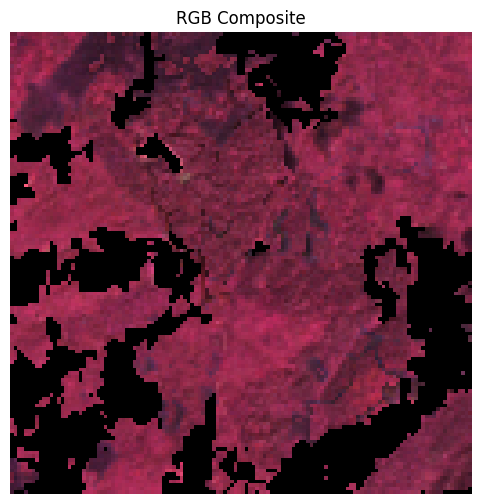

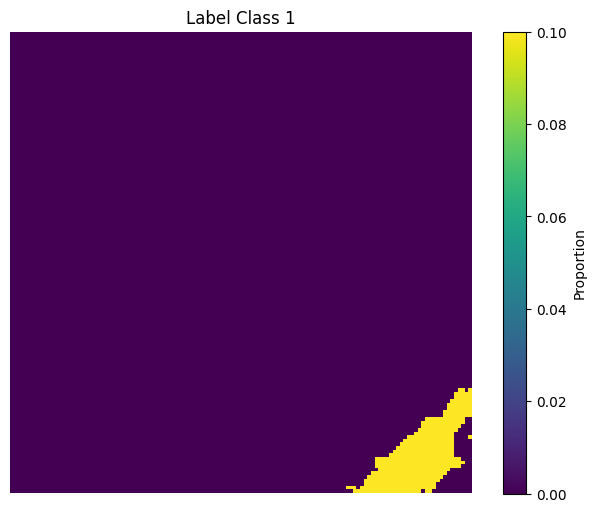

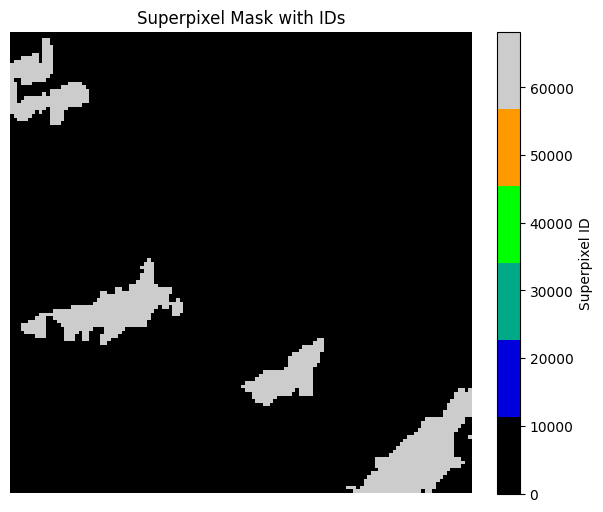

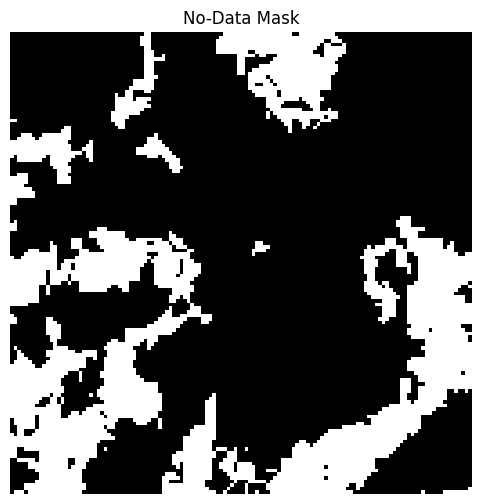

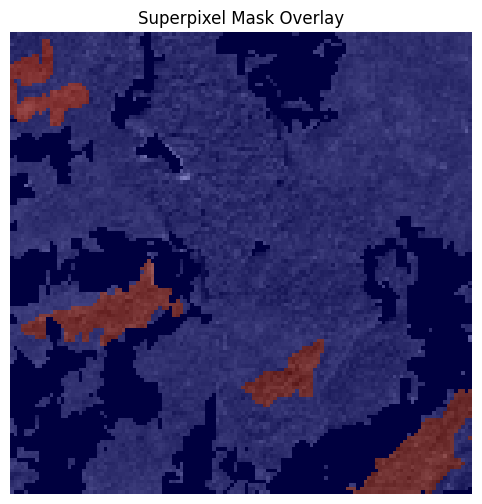

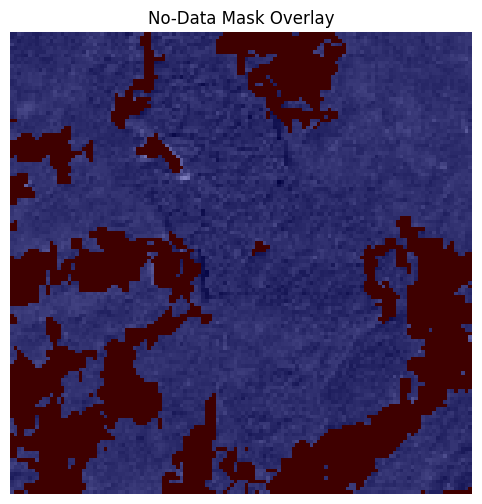

In [28]:

# Visualize RGB composite
visualize_rgb(tile_image)

# Visualize label for class 0
visualize_label(label_array, class_index=0)

# Visualize superpixel mask
visualize_superpixel_mask(superpixel_mask)

# Visualize no-data mask
visualize_nodata_mask(nodata_mask)

# Use one of the imagery bands for the background
background_image = tile_image[0]  # Band 1

# Overlay superpixel mask
overlay_mask_on_image(background_image, superpixel_mask, alpha=0.5, title='Superpixel Mask Overlay')

# Overlay no-data mask
overlay_mask_on_image(background_image, nodata_mask, alpha=0.5, title='No-Data Mask Overlay')


In [15]:
def visualize_dominant_class(label_array):
    """
    Visualizes the dominant class at each pixel.

    Args:
        label_array: NumPy array of shape (num_classes, height, width)
    """
    dominant_class = np.argmax(label_array, axis=0)  # Shape: (height, width)
    plt.figure(figsize=(8, 6))
    plt.imshow(dominant_class, cmap='tab10')
    plt.title('Dominant Class per Pixel')
    plt.colorbar(ticks=range(9), label='Class')
    plt.axis('off')
    plt.show()


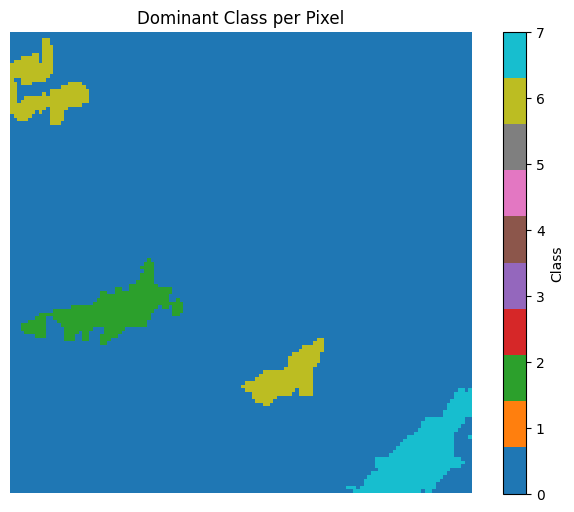

In [16]:
visualize_dominant_class(label_array)

In [17]:
def visualize_label_rgb_composite(label_array, class_indices):
    """
    Visualizes selected classes as an RGB composite image.

    Args:
        label_array: NumPy array of shape (num_classes, height, width)
        class_indices: List or tuple of three class indices to map to RGB channels
    """
    assert len(class_indices) == 3, "Must provide exactly three class indices for RGB composite."
    r = label_array[class_indices[0]]
    g = label_array[class_indices[1]]
    b = label_array[class_indices[2]]

    # Stack into an RGB image
    rgb_image = np.stack([r, g, b], axis=-1)
    # Normalize the image for display
    rgb_image = np.clip(rgb_image, 0, 1)  # Ensure values are between 0 and 1

    plt.figure(figsize=(8, 6))
    plt.imshow(rgb_image, interpolation='nearest')
    plt.title(f'RGB Composite: Classes {class_indices}')
    plt.axis('off')
    plt.show()


In [19]:
from sklearn.cluster import KMeans

def visualize_clusters(label_array, n_clusters=10):
    """
    Visualizes label array by clustering label vectors and assigning colors.

    Args:
        label_array: NumPy array of shape (num_classes, height, width)
        n_clusters: Number of clusters to form
    """
    num_classes, height, width = label_array.shape
    label_vectors = label_array.reshape(num_classes, -1).T  # Shape: (num_pixels, num_classes)

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(label_vectors)  # Shape: (num_pixels,)

    # Reshape to image
    cluster_image = cluster_labels.reshape(height, width)

    plt.figure(figsize=(8, 6))
    plt.imshow(cluster_image, cmap='tab20', interpolation='nearest')
    plt.title(f'Clustered Labels Visualization (n_clusters={n_clusters})')
    plt.colorbar(ticks=range(n_clusters), label='Cluster')
    plt.axis('off')
    plt.show()


/home/yuwei-linux/code/venv/lib/python3.10/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


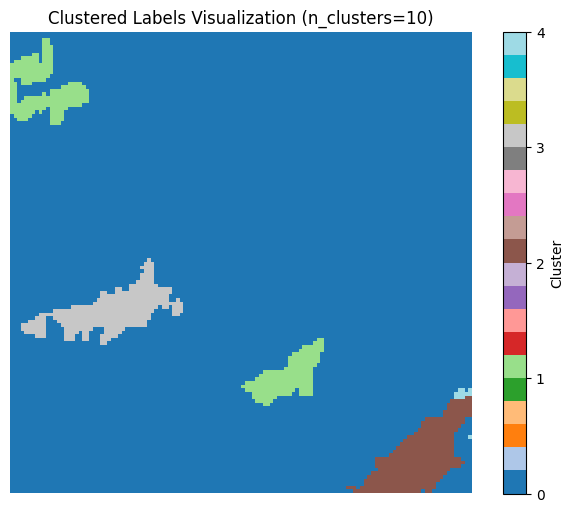

In [20]:
visualize_clusters(label_array, n_clusters=10)


In [21]:
def visualize_dominant_class_with_proportion(label_array):
    num_classes, height, width = label_array.shape
    dominant_class = np.argmax(label_array, axis=0)
    max_proportion = np.max(label_array, axis=0)

    # Create a color map for classes
    cmap = plt.get_cmap('tab10', num_classes)

    # Create an RGB image where alpha corresponds to the max proportion
    rgba_image = cmap(dominant_class)
    rgba_image[..., -1] = max_proportion  # Set alpha channel

    plt.figure(figsize=(8, 6))
    plt.imshow(rgba_image, interpolation='nearest')
    plt.title('Dominant Class with Proportion Transparency')
    plt.axis('off')
    plt.show()


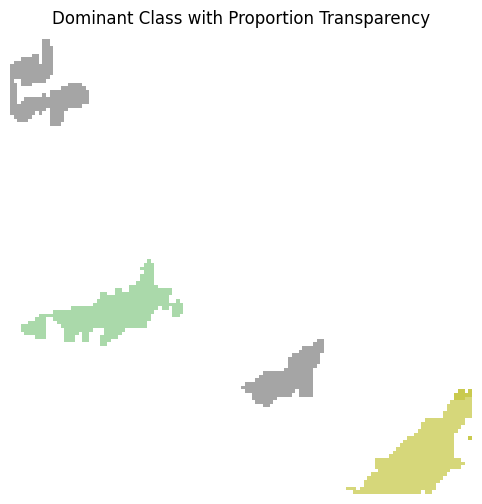

In [22]:
visualize_dominant_class_with_proportion(label_array)


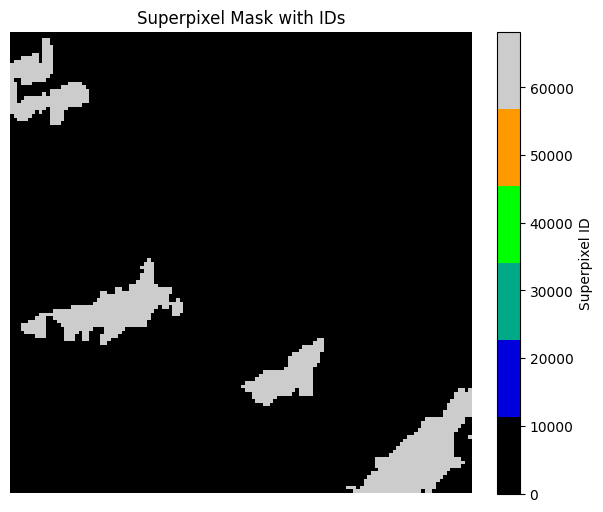

In [23]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_superpixel_mask(superpixel_mask):
    """
    Visualizes the superpixel mask by mapping superpixel IDs to colors.

    Args:
        superpixel_mask: NumPy array of shape (height, width) with superpixel IDs.
    """
    plt.figure(figsize=(8, 6))
    # Use a colormap that has enough unique colors
    num_superpixels = np.unique(superpixel_mask).size
    cmap = plt.get_cmap('nipy_spectral', num_superpixels)
    # Display the superpixel mask
    im = plt.imshow(superpixel_mask, cmap=cmap, interpolation='nearest')
    plt.colorbar(im, fraction=0.046, pad=0.04, label='Superpixel ID')
    plt.title('Superpixel Mask with IDs')
    plt.axis('off')
    plt.show()
# Assuming superpixel_mask is loaded as a NumPy array of shape (height, width)
visualize_superpixel_mask(superpixel_mask)


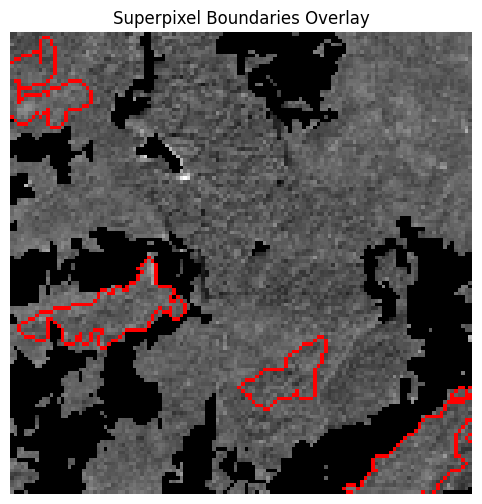

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries

def overlay_superpixel_boundaries(image, superpixel_mask):
    """
    Overlays superpixel boundaries on the image.

    Args:
        image: NumPy array of shape (height, width) or (height, width, 3)
        superpixel_mask: NumPy array of shape (height, width) with superpixel IDs
    """
    # Ensure image is in the correct format
    if image.ndim == 2:
        # Grayscale image; convert to RGB
        image = np.stack([image]*3, axis=-1)
    elif image.ndim == 3 and image.shape[2] == 1:
        # Single-channel image; convert to RGB
        image = np.repeat(image, 3, axis=2)

    # Normalize the image for display
    image = (image - image.min()) / (image.max() - image.min())

    # Use skimage to mark boundaries
    from skimage.segmentation import mark_boundaries
    outlined_image = mark_boundaries(image, superpixel_mask, color=(1, 0, 0))

    plt.figure(figsize=(8, 6))
    plt.imshow(outlined_image)
    plt.title('Superpixel Boundaries Overlay')
    plt.axis('off')
    plt.show()
# Assuming tile_image is loaded as a NumPy array (height, width) or (height, width, 3)
# You can select one band or create an RGB composite
band_index = 0  # Choose a band to display
image_to_display = tile_image[band_index]

overlay_superpixel_boundaries(image_to_display, superpixel_mask)

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
import matplotlib.patches as mpatches

def visualize_dominant_class_with_proportion_and_boundaries(label_array, superpixel_mask, mask_array=None, class_names=None):
    """
    Visualizes the dominant class with proportion, adjusts brightness, overlays superpixel boundaries, and adds a legend.

    Args:
        label_array: NumPy array of shape (num_classes, height, width)
        superpixel_mask: NumPy array of shape (height, width) with superpixel IDs
        mask_array: (Optional) Boolean array of shape (height, width), True for no-data pixels
        class_names: (Optional) List of class names corresponding to the classes
    """
    num_classes, height, width = label_array.shape

    # Compute the dominant class and its proportion
    dominant_class = np.argmax(label_array, axis=0)  # Shape: (height, width)
    max_proportion = np.max(label_array, axis=0)     # Shape: (height, width)

    # Get colors for each class
    cmap = plt.get_cmap('tab10', num_classes)
    colors = cmap.colors[:num_classes]  # Array of shape (num_classes, 3)

    # Create an RGB image where each pixel's color corresponds to its dominant class
    rgb_image = np.zeros((height, width, 3), dtype=np.float32)
    for i in range(num_classes):
        mask = (dominant_class == i)
        rgb_image[mask] = colors[i]

    # Adjust brightness based on the max proportion
    rgb_image_adjusted = rgb_image * max_proportion[..., np.newaxis]

    # Handle no-data pixels if mask_array is provided
    if mask_array is not None:
        valid_mask = ~mask_array  # Invert mask: True for valid pixels
        rgb_image_adjusted[~valid_mask] = 0  # Set no-data pixels to black

    # Ensure the RGB image values are between 0 and 1
    rgb_image_adjusted = np.clip(rgb_image_adjusted, 0, 1)

    # Overlay superpixel boundaries
    outlined_image = mark_boundaries(rgb_image_adjusted, superpixel_mask, color=(1, 1, 1), mode='thick')

    # Display the image
    plt.figure(figsize=(10, 8))
    plt.imshow(outlined_image)
    plt.title('Dominant Class with Proportion and Superpixel Boundaries')
    plt.axis('off')

    # Add a legend
    if class_names is None:
        class_names = [f'Class {i}' for i in range(num_classes)]

    patches = [mpatches.Patch(color=colors[i], label=class_names[i]) for i in range(num_classes)]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    plt.show()


In [25]:
# Assuming label_array, superpixel_mask, and mask_array are loaded
# class_names is a list of your tree species names
visualize_dominant_class_with_proportion_and_boundaries(label_array, superpixel_mask)

ValueError: shape mismatch: value array of shape (4,) could not be broadcast to indexing result of shape (9861,3)